In [ ]:
!python -m pip install pyserial
!python -m pip install import_ipynb

In [9]:
import serial
import serial.tools.list_ports

import import_ipynb
import Visualize_Data

In [10]:
def find_arduino(port=None):
    """Get the name of the port that is connected to Arduino."""
    if port is None:
        ports = serial.tools.list_ports.comports()
        for p in ports:
            if p.manufacturer is not None and "Arduino" in p.manufacturer:
                port = p.device
    return port

In [11]:
port = find_arduino()

In [12]:
ser = serial.Serial()
ser.baudrate = 115200
ser.port = port
ser.open()
if ser.is_open:
    print("Serial port: " + port + " is opened.")
else:
    print("Serial port: " + port + " cannot be opened.")

Serial port: COM5 is opened.


In [8]:
ser.close()

In [13]:
num_samples = 64  # This should match with the number of samples taken by the MCU.
sampling_frequency = 10

x_data = [0] * num_samples
y_data = [0] * num_samples
z_data = [0] * num_samples

In [14]:
def fill_buffer(buffer, num_samples):
    i = 0
    temp_buffer = []
    
    while i < num_samples:
        try:
            value = float(ser.readline())
        except:
            value = 0.0
        temp_buffer.append(value)
        i += 1
        
    if buffer.casefold() == "x":
        x_data.clear()
        x_data.extend(temp_buffer)
    elif buffer.casefold() == "y":
        y_data.clear()
        y_data.extend(temp_buffer)
    elif buffer.casefold() == "z":
        z_data.clear()
        z_data.extend(temp_buffer)

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.14, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.15, -0.17, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


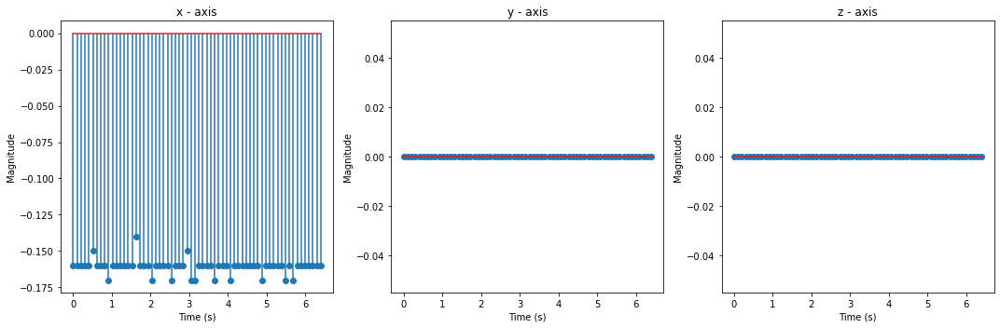

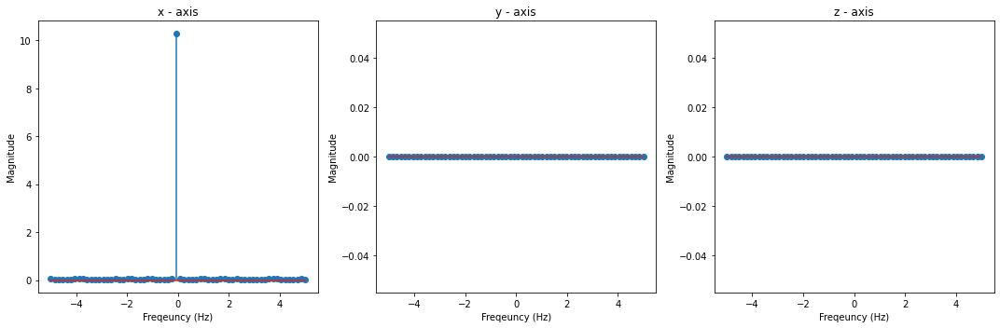

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.14, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.15, -0.17, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[0.0, -0.01, 0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.0, -0.0, 0.0, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, 0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.0, -0.0, -0.0, -0.02, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

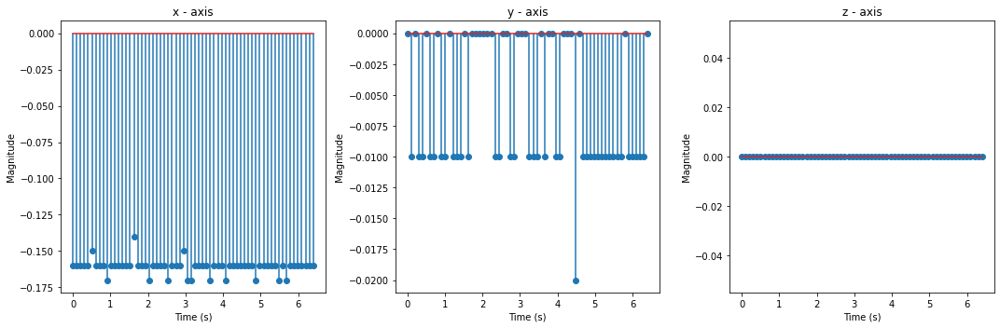

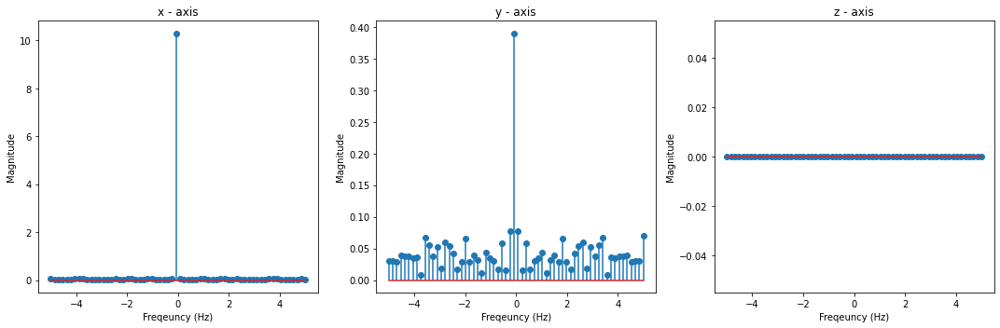

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.14, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.15, -0.17, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[0.0, -0.01, 0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.0, -0.0, 0.0, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, 0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.0, -0.0, -0.0, -0.02, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0]
[0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84,

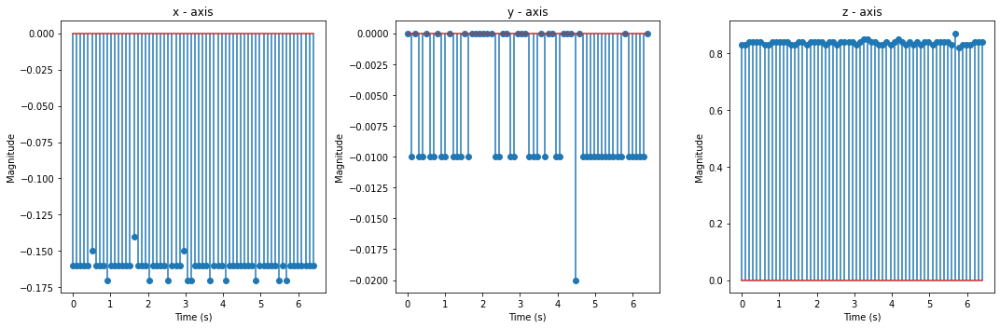

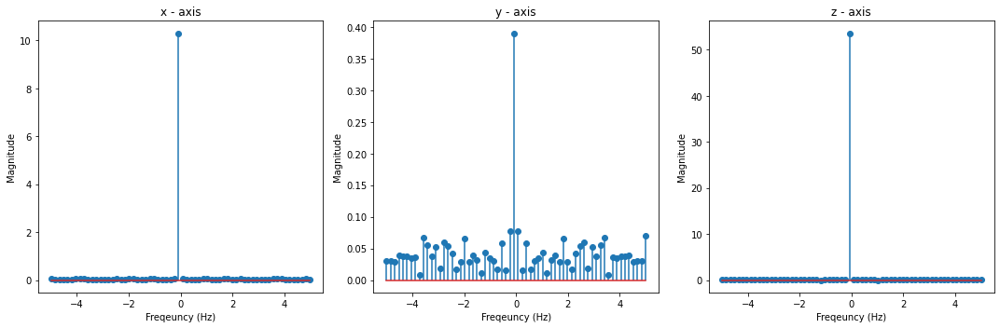

[-0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.18, -0.18, -0.21, -0.13, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.15, -0.33, 0.04]
[0.0, -0.01, 0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.0, -0.0, 0.0, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, 0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.0, -0.0, -0.0, -0.02, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0]
[0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 

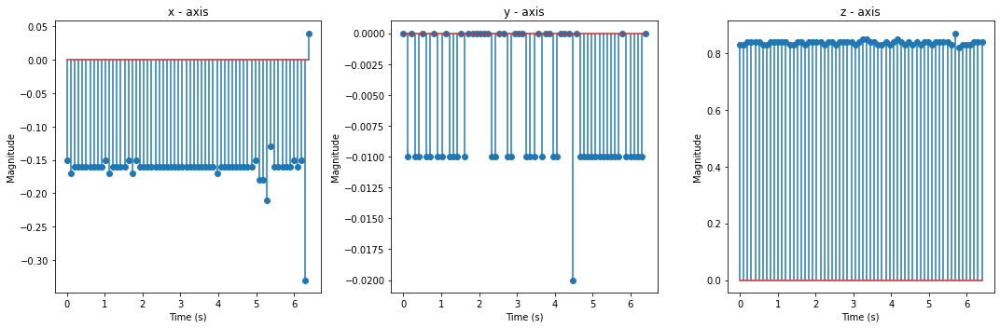

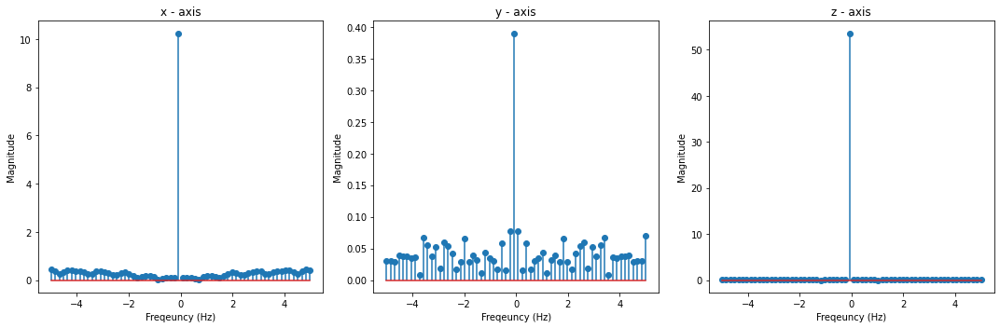

[-0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.18, -0.18, -0.21, -0.13, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.15, -0.33, 0.04]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.0, -0.0, 0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.0, -0.0, -0.0, -0.01, -0.01, -0.06, -0.07, 0.02, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, -0.01, -0.0, 0.13, 0.14]
[0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0

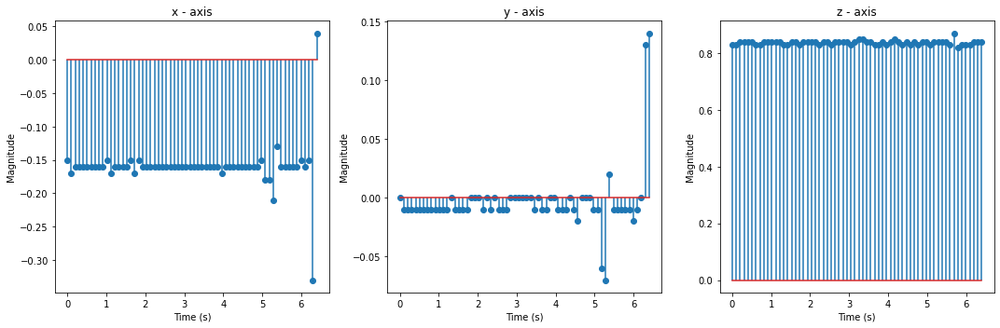

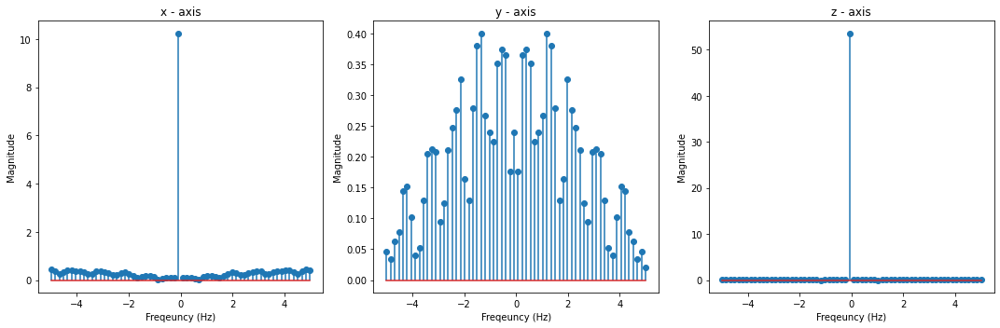

[-0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.18, -0.18, -0.21, -0.13, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.15, -0.33, 0.04]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.0, -0.0, 0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.0, -0.0, -0.0, -0.01, -0.01, -0.06, -0.07, 0.02, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, -0.01, -0.0, 0.13, 0.14]
[0.84, 0.83, 0.83, 0.85, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0

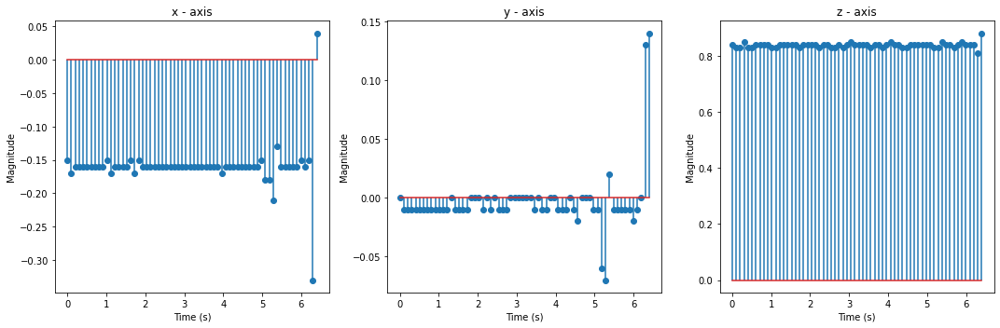

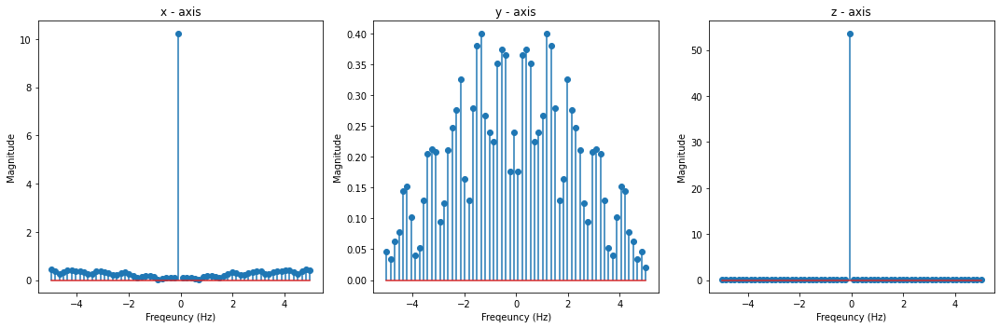

[-0.51, -0.33, -0.43, -0.08, -0.52, 0.17, -0.54, -0.06, 0.08, -0.2, -0.5, 0.02, 0.04, -0.11, -0.58, -0.15, 0.12, -0.04, -0.43, -0.26, 0.02, 0.01, -0.13, -0.52, -0.09, 0.11, -0.12, -0.49, -0.16, 0.05, -0.02, -0.25, -0.36, -0.05, 0.06, -0.11, -0.56, -0.25, 0.19, -0.09, -0.45, -0.29, 0.08, 0.07, -0.3, -0.38, -0.07, 0.07, -0.07, -0.6, -0.07, 0.09, 0.04, -0.52, -0.21, -0.03, 0.11, -0.16, -0.55, -0.0, 0.04, 0.03, -0.56, -0.24]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.0, -0.0, 0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.0, -0.0, -0.0, -0.01, -0.01, -0.06, -0.07, 0.02, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, -0.01, -0.0, 0.13, 0.14]
[0.84, 0.83, 0.83, 0.85, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 

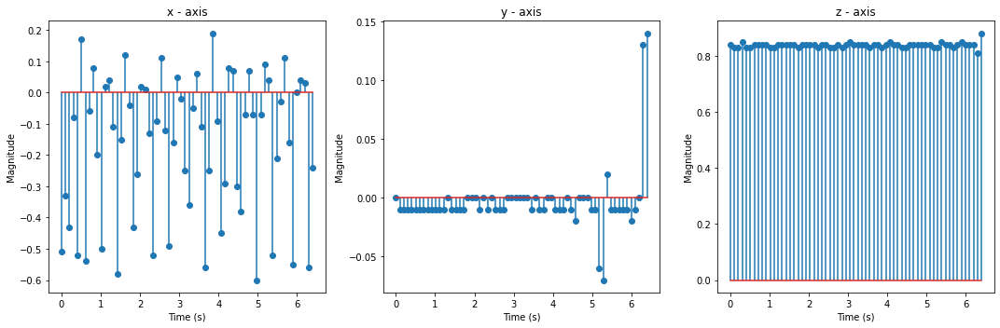

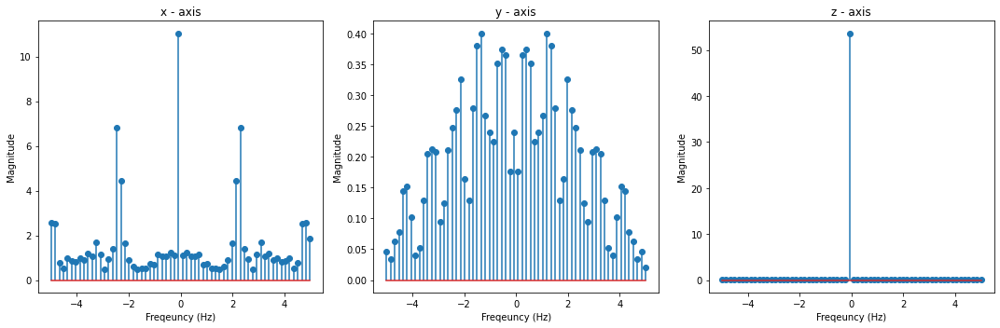

[-0.51, -0.33, -0.43, -0.08, -0.52, 0.17, -0.54, -0.06, 0.08, -0.2, -0.5, 0.02, 0.04, -0.11, -0.58, -0.15, 0.12, -0.04, -0.43, -0.26, 0.02, 0.01, -0.13, -0.52, -0.09, 0.11, -0.12, -0.49, -0.16, 0.05, -0.02, -0.25, -0.36, -0.05, 0.06, -0.11, -0.56, -0.25, 0.19, -0.09, -0.45, -0.29, 0.08, 0.07, -0.3, -0.38, -0.07, 0.07, -0.07, -0.6, -0.07, 0.09, 0.04, -0.52, -0.21, -0.03, 0.11, -0.16, -0.55, -0.0, 0.04, 0.03, -0.56, -0.24]
[-0.18, 0.23, -0.33, -0.1, -0.16, 0.94, -0.81, -0.7, 0.26, 0.5, -0.17, -0.27, -0.01, 0.52, -0.31, -0.34, -0.03, 0.26, 0.22, -0.22, -0.18, 0.07, 0.46, -0.28, -0.36, 0.03, 0.33, -0.01, -0.26, -0.31, 0.23, 0.35, -0.25, -0.29, 0.1, 0.38, -0.32, -0.4, 0.13, 0.18, -0.06, -0.45, -0.26, 0.2, 0.23, -0.14, -0.34, 0.07, 0.48, -0.21, -0.33, -0.22, 0.35, 0.16, -0.24, -0.33, 0.27, 0.54, -0.12, -0.31, -0.14, 0.46, -0.11, -0.38]
[0.84, 0.83, 0.83, 0.85, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0

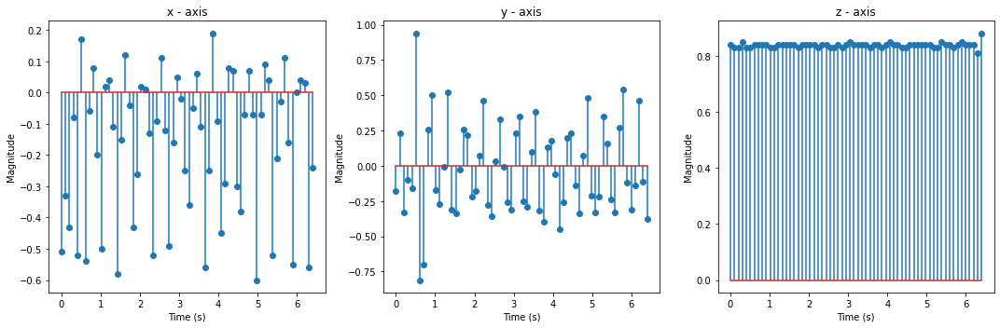

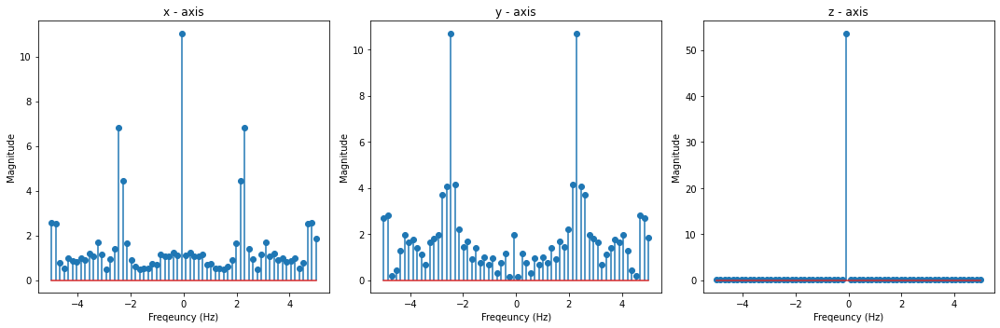

[-0.51, -0.33, -0.43, -0.08, -0.52, 0.17, -0.54, -0.06, 0.08, -0.2, -0.5, 0.02, 0.04, -0.11, -0.58, -0.15, 0.12, -0.04, -0.43, -0.26, 0.02, 0.01, -0.13, -0.52, -0.09, 0.11, -0.12, -0.49, -0.16, 0.05, -0.02, -0.25, -0.36, -0.05, 0.06, -0.11, -0.56, -0.25, 0.19, -0.09, -0.45, -0.29, 0.08, 0.07, -0.3, -0.38, -0.07, 0.07, -0.07, -0.6, -0.07, 0.09, 0.04, -0.52, -0.21, -0.03, 0.11, -0.16, -0.55, -0.0, 0.04, 0.03, -0.56, -0.24]
[-0.18, 0.23, -0.33, -0.1, -0.16, 0.94, -0.81, -0.7, 0.26, 0.5, -0.17, -0.27, -0.01, 0.52, -0.31, -0.34, -0.03, 0.26, 0.22, -0.22, -0.18, 0.07, 0.46, -0.28, -0.36, 0.03, 0.33, -0.01, -0.26, -0.31, 0.23, 0.35, -0.25, -0.29, 0.1, 0.38, -0.32, -0.4, 0.13, 0.18, -0.06, -0.45, -0.26, 0.2, 0.23, -0.14, -0.34, 0.07, 0.48, -0.21, -0.33, -0.22, 0.35, 0.16, -0.24, -0.33, 0.27, 0.54, -0.12, -0.31, -0.14, 0.46, -0.11, -0.38]
[0.79, 0.81, 0.8, 0.84, 0.77, 0.9, 0.77, 0.87, 0.89, 0.82, 0.77, 0.88, 0.87, 0.84, 0.76, 0.84, 0.89, 0.85, 0.79, 0.82, 0.88, 0.88, 0.84, 0.77, 0.85, 0.9, 0.85

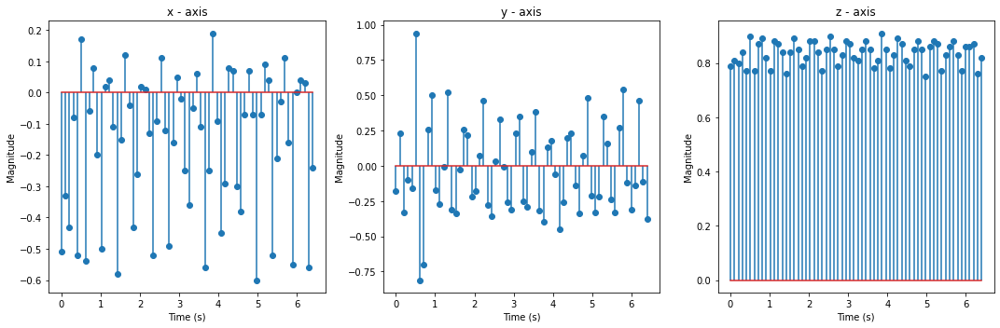

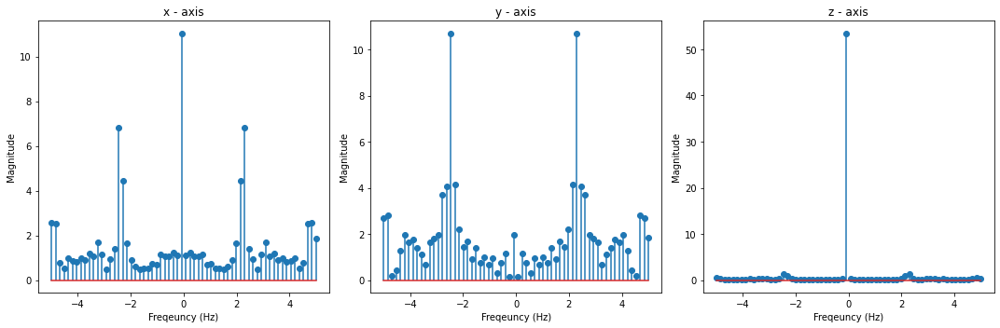

[0.04, -0.19, -0.48, -0.06, 0.16, -0.01, -0.73, -0.21, 0.15, 0.1, -0.14, -0.68, -0.13, 0.18, 0.12, -0.55, -0.34, 0.12, 0.17, -0.23, -0.61, -0.07, 0.17, -0.07, -0.5, -0.28, -0.12, 0.1, -0.01, -0.72, -0.12, 0.13, 0.09, -0.49, -0.29, 0.04, 0.15, -0.09, -0.68, -0.2, 0.24, 0.03, -0.65, -0.38, 0.03, 0.14, -0.03, -0.57, -0.21, 0.07, 0.01, -0.21, -0.39, -0.14, 0.12, -0.11, -0.7, -0.01, 0.17, 0.01, -0.55, -0.32, 0.27, 0.07]
[-0.18, 0.23, -0.33, -0.1, -0.16, 0.94, -0.81, -0.7, 0.26, 0.5, -0.17, -0.27, -0.01, 0.52, -0.31, -0.34, -0.03, 0.26, 0.22, -0.22, -0.18, 0.07, 0.46, -0.28, -0.36, 0.03, 0.33, -0.01, -0.26, -0.31, 0.23, 0.35, -0.25, -0.29, 0.1, 0.38, -0.32, -0.4, 0.13, 0.18, -0.06, -0.45, -0.26, 0.2, 0.23, -0.14, -0.34, 0.07, 0.48, -0.21, -0.33, -0.22, 0.35, 0.16, -0.24, -0.33, 0.27, 0.54, -0.12, -0.31, -0.14, 0.46, -0.11, -0.38]
[0.79, 0.81, 0.8, 0.84, 0.77, 0.9, 0.77, 0.87, 0.89, 0.82, 0.77, 0.88, 0.87, 0.84, 0.76, 0.84, 0.89, 0.85, 0.79, 0.82, 0.88, 0.88, 0.84, 0.77, 0.85, 0.9, 0.85, 0.79

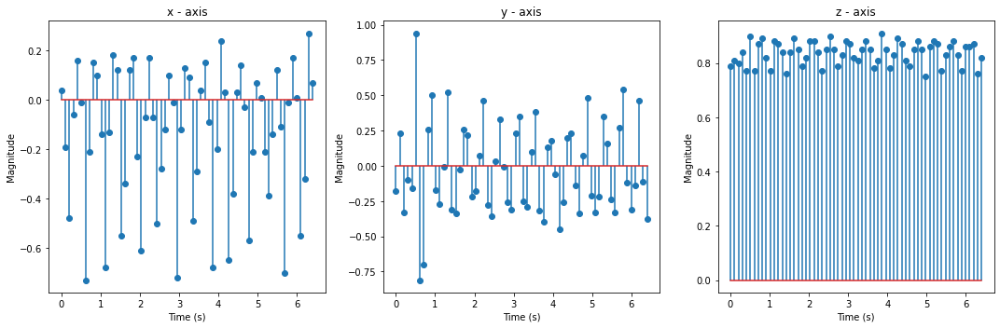

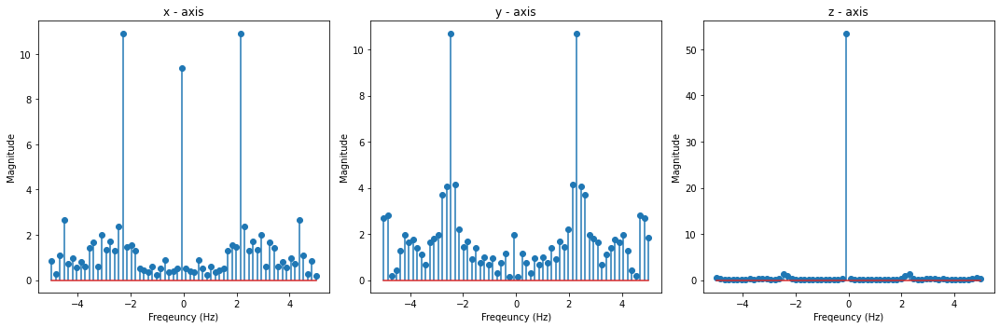

[0.04, -0.19, -0.48, -0.06, 0.16, -0.01, -0.73, -0.21, 0.15, 0.1, -0.14, -0.68, -0.13, 0.18, 0.12, -0.55, -0.34, 0.12, 0.17, -0.23, -0.61, -0.07, 0.17, -0.07, -0.5, -0.28, -0.12, 0.1, -0.01, -0.72, -0.12, 0.13, 0.09, -0.49, -0.29, 0.04, 0.15, -0.09, -0.68, -0.2, 0.24, 0.03, -0.65, -0.38, 0.03, 0.14, -0.03, -0.57, -0.21, 0.07, 0.01, -0.21, -0.39, -0.14, 0.12, -0.11, -0.7, -0.01, 0.17, 0.01, -0.55, -0.32, 0.27, 0.07]
[0.21, 0.59, -0.06, -0.41, -0.0, 0.44, -0.2, -0.4, -0.14, 0.13, 0.55, -0.09, -0.46, -0.11, 0.37, 0.07, -0.26, -0.26, 0.17, 0.51, -0.17, -0.43, -0.18, 0.27, 0.11, -0.24, -0.4, 0.02, 0.61, -0.12, -0.28, -0.13, 0.36, 0.11, -0.18, -0.25, 0.07, 0.4, -0.01, -0.38, 0.04, 0.25, 0.34, -0.08, -0.32, -0.01, 0.46, -0.11, -0.31, -0.26, 0.18, 0.51, -0.24, -0.54, 0.16, 0.54, -0.36, -0.5, 0.11, 0.4, -0.09, -0.42, -0.04, 0.22]
[0.79, 0.81, 0.8, 0.84, 0.77, 0.9, 0.77, 0.87, 0.89, 0.82, 0.77, 0.88, 0.87, 0.84, 0.76, 0.84, 0.89, 0.85, 0.79, 0.82, 0.88, 0.88, 0.84, 0.77, 0.85, 0.9, 0.85, 0.79, 0

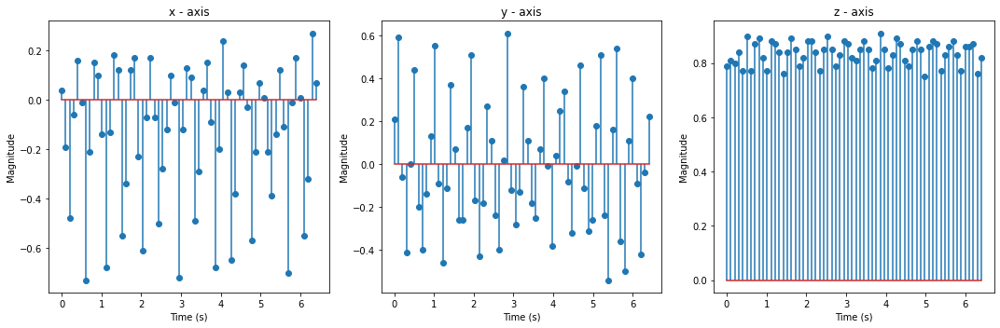

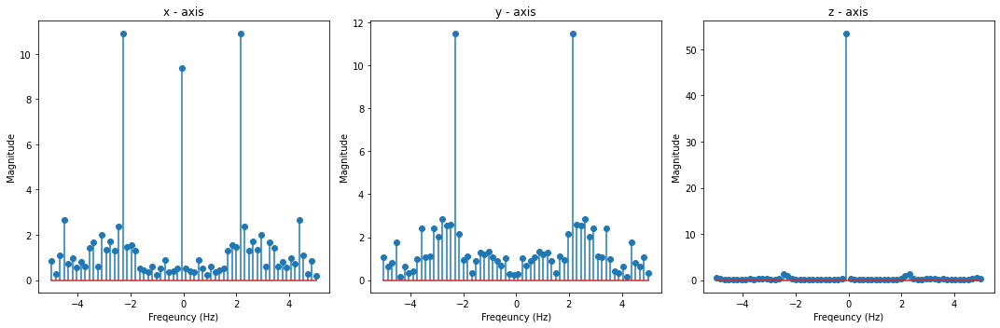

[0.04, -0.19, -0.48, -0.06, 0.16, -0.01, -0.73, -0.21, 0.15, 0.1, -0.14, -0.68, -0.13, 0.18, 0.12, -0.55, -0.34, 0.12, 0.17, -0.23, -0.61, -0.07, 0.17, -0.07, -0.5, -0.28, -0.12, 0.1, -0.01, -0.72, -0.12, 0.13, 0.09, -0.49, -0.29, 0.04, 0.15, -0.09, -0.68, -0.2, 0.24, 0.03, -0.65, -0.38, 0.03, 0.14, -0.03, -0.57, -0.21, 0.07, 0.01, -0.21, -0.39, -0.14, 0.12, -0.11, -0.7, -0.01, 0.17, 0.01, -0.55, -0.32, 0.27, 0.07]
[0.21, 0.59, -0.06, -0.41, -0.0, 0.44, -0.2, -0.4, -0.14, 0.13, 0.55, -0.09, -0.46, -0.11, 0.37, 0.07, -0.26, -0.26, 0.17, 0.51, -0.17, -0.43, -0.18, 0.27, 0.11, -0.24, -0.4, 0.02, 0.61, -0.12, -0.28, -0.13, 0.36, 0.11, -0.18, -0.25, 0.07, 0.4, -0.01, -0.38, 0.04, 0.25, 0.34, -0.08, -0.32, -0.01, 0.46, -0.11, -0.31, -0.26, 0.18, 0.51, -0.24, -0.54, 0.16, 0.54, -0.36, -0.5, 0.11, 0.4, -0.09, -0.42, -0.04, 0.22]
[0.87, 0.84, 0.78, 0.87, 0.9, 0.87, 0.74, 0.84, 0.9, 0.88, 0.85, 0.74, 0.85, 0.91, 0.89, 0.76, 0.8, 0.89, 0.9, 0.82, 0.76, 0.86, 0.9, 0.84, 0.78, 0.82, 0.85, 0.89, 0.8

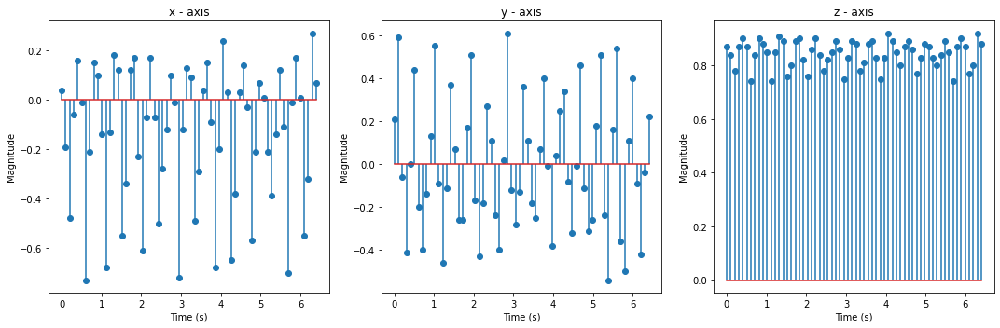

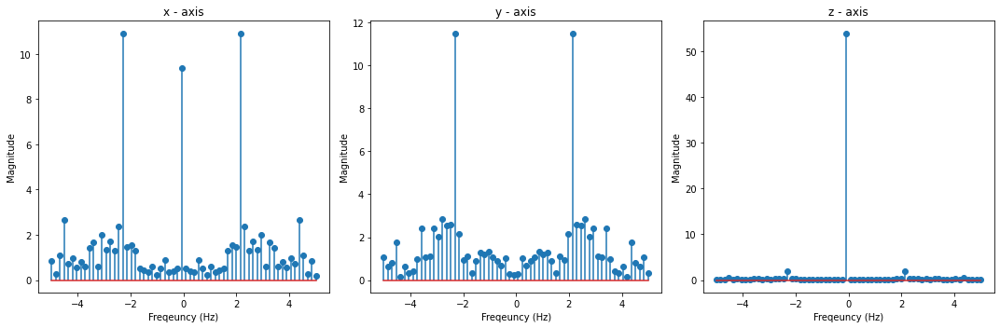

[0.07, -0.44, -0.03, 0.13, -0.14, -0.69, -0.18, 0.25, 0.02, -0.55, -0.24, 0.01, 0.0, -0.16, -0.44, -0.16, 0.11, 0.03, -0.35, -0.34, -0.03, 0.18, -0.06, -0.8, -0.2, 0.22, 0.11, -0.44, -0.45, 0.21, 0.07, -0.13, -0.7, -0.2, 0.19, -0.07, -0.67, -0.21, 0.22, -0.07, -0.28, -0.44, 0.25, 0.03, -0.09, -0.69, -0.05, 0.16, -0.0, -0.6, -0.31, 0.21, 0.05, -0.14, -0.63, -0.11, 0.26, -0.08, -0.47, -0.35, 0.36, 0.03, -0.27, -0.51]
[0.21, 0.59, -0.06, -0.41, -0.0, 0.44, -0.2, -0.4, -0.14, 0.13, 0.55, -0.09, -0.46, -0.11, 0.37, 0.07, -0.26, -0.26, 0.17, 0.51, -0.17, -0.43, -0.18, 0.27, 0.11, -0.24, -0.4, 0.02, 0.61, -0.12, -0.28, -0.13, 0.36, 0.11, -0.18, -0.25, 0.07, 0.4, -0.01, -0.38, 0.04, 0.25, 0.34, -0.08, -0.32, -0.01, 0.46, -0.11, -0.31, -0.26, 0.18, 0.51, -0.24, -0.54, 0.16, 0.54, -0.36, -0.5, 0.11, 0.4, -0.09, -0.42, -0.04, 0.22]
[0.87, 0.84, 0.78, 0.87, 0.9, 0.87, 0.74, 0.84, 0.9, 0.88, 0.85, 0.74, 0.85, 0.91, 0.89, 0.76, 0.8, 0.89, 0.9, 0.82, 0.76, 0.86, 0.9, 0.84, 0.78, 0.82, 0.85, 0.89, 0.8

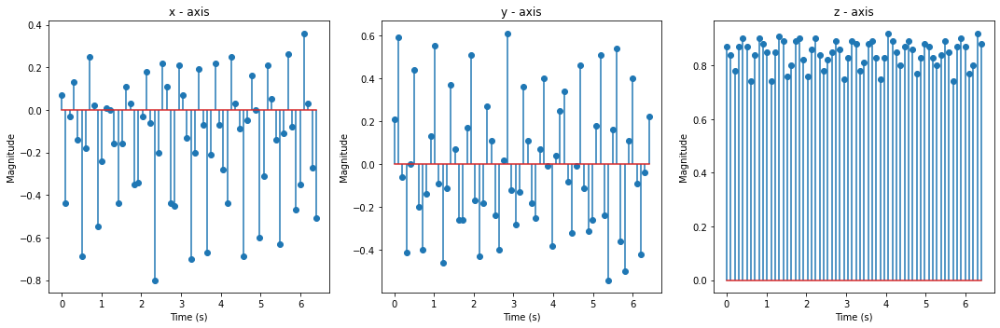

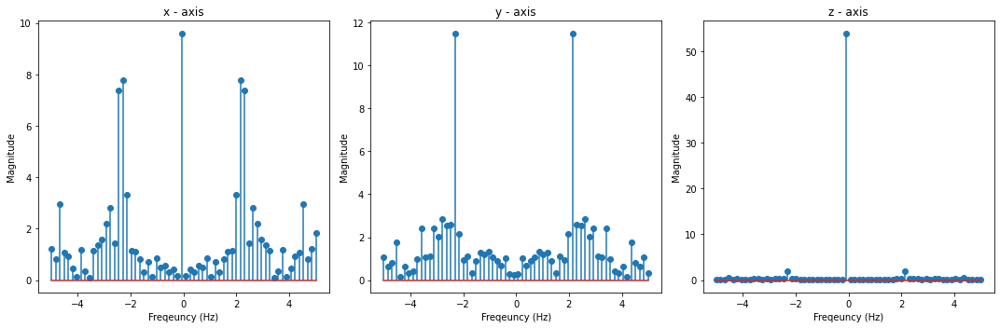

[0.07, -0.44, -0.03, 0.13, -0.14, -0.69, -0.18, 0.25, 0.02, -0.55, -0.24, 0.01, 0.0, -0.16, -0.44, -0.16, 0.11, 0.03, -0.35, -0.34, -0.03, 0.18, -0.06, -0.8, -0.2, 0.22, 0.11, -0.44, -0.45, 0.21, 0.07, -0.13, -0.7, -0.2, 0.19, -0.07, -0.67, -0.21, 0.22, -0.07, -0.28, -0.44, 0.25, 0.03, -0.09, -0.69, -0.05, 0.16, -0.0, -0.6, -0.31, 0.21, 0.05, -0.14, -0.63, -0.11, 0.26, -0.08, -0.47, -0.35, 0.36, 0.03, -0.27, -0.51]
[0.23, -0.07, -0.34, 0.02, 0.54, -0.39, -0.42, -0.05, 0.39, -0.04, -0.32, -0.26, 0.03, 0.26, -0.1, -0.38, -0.13, 0.27, 0.46, -0.21, -0.4, -0.02, 0.63, -0.3, -0.5, 0.06, 0.35, 0.33, -0.39, -0.26, 0.05, 0.63, -0.46, -0.61, 0.04, 0.6, -0.29, -0.6, -0.04, 0.35, 0.38, -0.32, -0.11, 0.15, 0.48, -0.48, -0.35, -0.13, 0.56, 0.03, -0.35, -0.15, 0.22, 0.49, -0.27, -0.58, 0.03, 0.49, 0.13, -0.54, 0.09, 0.33, 0.46, -0.43]
[0.87, 0.84, 0.78, 0.87, 0.9, 0.87, 0.74, 0.84, 0.9, 0.88, 0.85, 0.74, 0.85, 0.91, 0.89, 0.76, 0.8, 0.89, 0.9, 0.82, 0.76, 0.86, 0.9, 0.84, 0.78, 0.82, 0.85, 0.89, 0.86

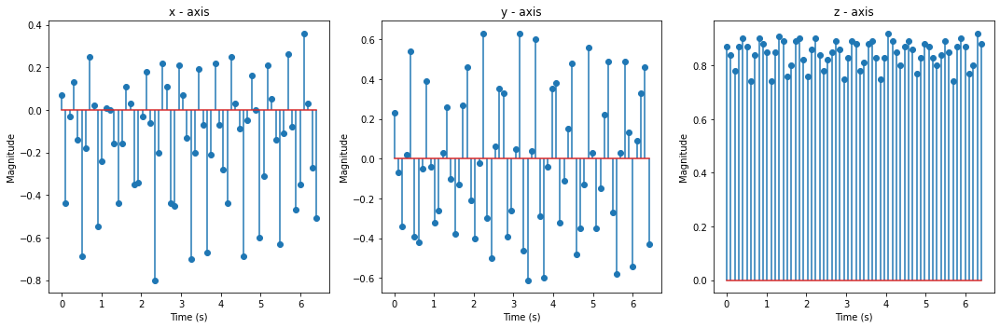

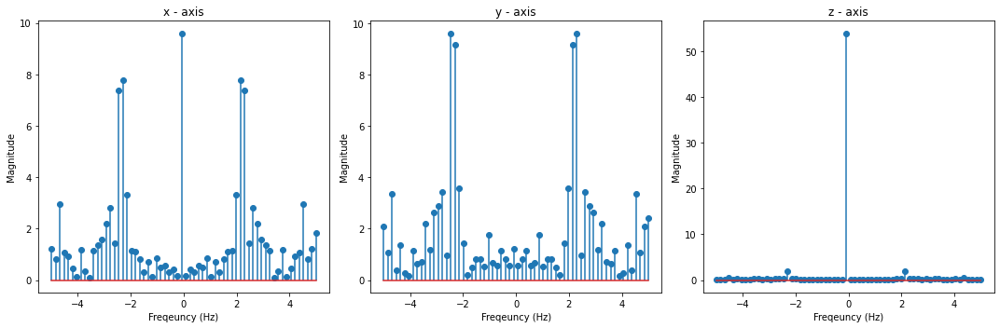

[0.07, -0.44, -0.03, 0.13, -0.14, -0.69, -0.18, 0.25, 0.02, -0.55, -0.24, 0.01, 0.0, -0.16, -0.44, -0.16, 0.11, 0.03, -0.35, -0.34, -0.03, 0.18, -0.06, -0.8, -0.2, 0.22, 0.11, -0.44, -0.45, 0.21, 0.07, -0.13, -0.7, -0.2, 0.19, -0.07, -0.67, -0.21, 0.22, -0.07, -0.28, -0.44, 0.25, 0.03, -0.09, -0.69, -0.05, 0.16, -0.0, -0.6, -0.31, 0.21, 0.05, -0.14, -0.63, -0.11, 0.26, -0.08, -0.47, -0.35, 0.36, 0.03, -0.27, -0.51]
[0.23, -0.07, -0.34, 0.02, 0.54, -0.39, -0.42, -0.05, 0.39, -0.04, -0.32, -0.26, 0.03, 0.26, -0.1, -0.38, -0.13, 0.27, 0.46, -0.21, -0.4, -0.02, 0.63, -0.3, -0.5, 0.06, 0.35, 0.33, -0.39, -0.26, 0.05, 0.63, -0.46, -0.61, 0.04, 0.6, -0.29, -0.6, -0.04, 0.35, 0.38, -0.32, -0.11, 0.15, 0.48, -0.48, -0.35, -0.13, 0.56, 0.03, -0.35, -0.15, 0.22, 0.49, -0.27, -0.58, 0.03, 0.49, 0.13, -0.54, 0.09, 0.33, 0.46, -0.43]
[0.88, 0.78, 0.86, 0.88, 0.82, 0.74, 0.85, 0.92, 0.88, 0.76, 0.84, 0.87, 0.86, 0.83, 0.78, 0.84, 0.89, 0.87, 0.8, 0.81, 0.86, 0.9, 0.86, 0.72, 0.83, 0.91, 0.88, 0.78, 0

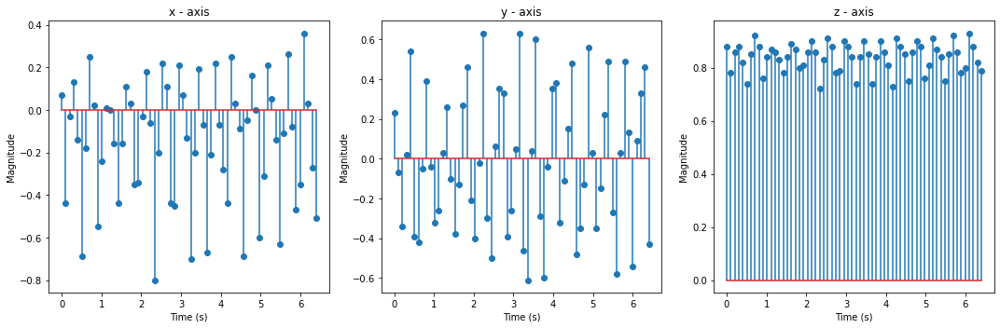

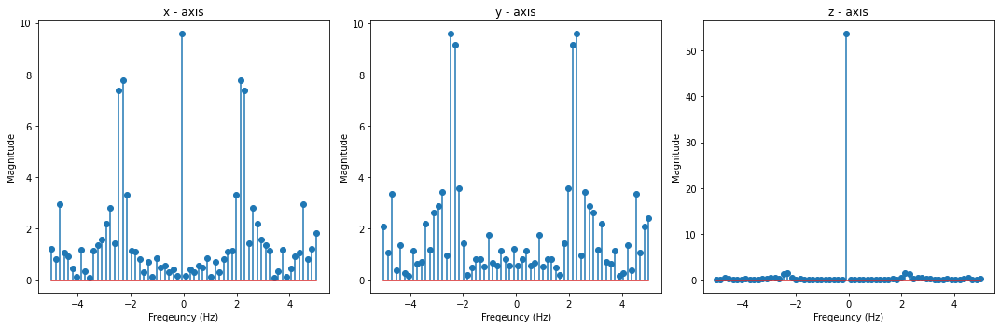

[0.12, -0.14, -0.69, -0.1, 0.22, 0.03, -0.54, -0.31, 0.15, 0.12, -0.08, -0.73, -0.16, 0.21, -0.01, -0.33, -0.45, 0.03, 0.17, -0.11, -0.62, -0.05, 0.14, 0.04, -0.69, -0.15, 0.19, -0.01, -0.31, -0.53, 0.16, 0.09, -0.13, -0.75, -0.25, 0.25, 0.06, -0.31, -0.47, 0.2, 0.11, -0.08, -0.85, 0.04, 0.11, -0.09, -0.57, -0.15, 0.09, 0.07, -0.21, -0.57, 0.1, 0.14, -0.08, -0.69, 0.0, 0.21, -0.05, -0.54, -0.05, 0.14, 0.05, -0.5]
[0.23, -0.07, -0.34, 0.02, 0.54, -0.39, -0.42, -0.05, 0.39, -0.04, -0.32, -0.26, 0.03, 0.26, -0.1, -0.38, -0.13, 0.27, 0.46, -0.21, -0.4, -0.02, 0.63, -0.3, -0.5, 0.06, 0.35, 0.33, -0.39, -0.26, 0.05, 0.63, -0.46, -0.61, 0.04, 0.6, -0.29, -0.6, -0.04, 0.35, 0.38, -0.32, -0.11, 0.15, 0.48, -0.48, -0.35, -0.13, 0.56, 0.03, -0.35, -0.15, 0.22, 0.49, -0.27, -0.58, 0.03, 0.49, 0.13, -0.54, 0.09, 0.33, 0.46, -0.43]
[0.88, 0.78, 0.86, 0.88, 0.82, 0.74, 0.85, 0.92, 0.88, 0.76, 0.84, 0.87, 0.86, 0.83, 0.78, 0.84, 0.89, 0.87, 0.8, 0.81, 0.86, 0.9, 0.86, 0.72, 0.83, 0.91, 0.88, 0.78, 0.7

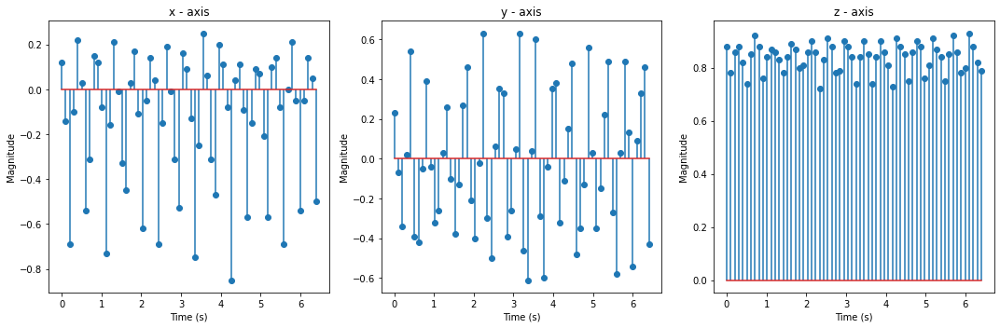

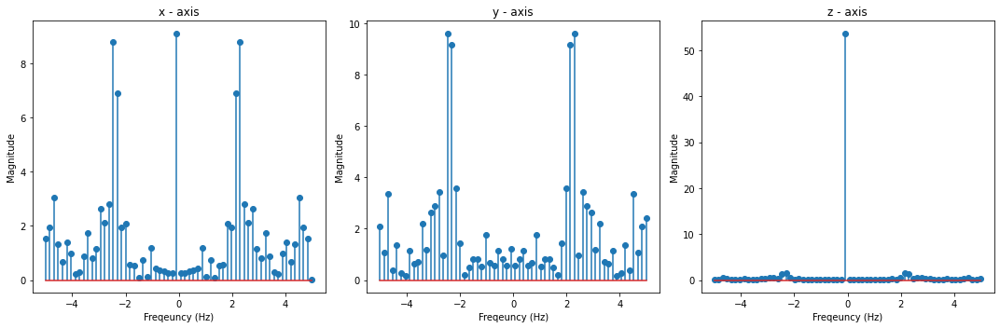

[0.12, -0.14, -0.69, -0.1, 0.22, 0.03, -0.54, -0.31, 0.15, 0.12, -0.08, -0.73, -0.16, 0.21, -0.01, -0.33, -0.45, 0.03, 0.17, -0.11, -0.62, -0.05, 0.14, 0.04, -0.69, -0.15, 0.19, -0.01, -0.31, -0.53, 0.16, 0.09, -0.13, -0.75, -0.25, 0.25, 0.06, -0.31, -0.47, 0.2, 0.11, -0.08, -0.85, 0.04, 0.11, -0.09, -0.57, -0.15, 0.09, 0.07, -0.21, -0.57, 0.1, 0.14, -0.08, -0.69, 0.0, 0.21, -0.05, -0.54, -0.05, 0.14, 0.05, -0.5]
[0.16, 0.51, -0.39, -0.55, -0.04, 0.43, 0.19, -0.33, -0.22, 0.1, 0.59, -0.34, -0.6, -0.21, 0.42, 0.41, -0.32, -0.5, 0.21, 0.63, -0.25, -0.51, 0.04, 0.53, -0.08, -0.42, -0.18, 0.27, 0.5, -0.29, -0.37, 0.06, 0.44, -0.13, -0.58, -0.12, 0.31, 0.5, -0.39, -0.21, 0.18, 0.63, -0.59, -0.48, 0.02, 0.37, 0.14, -0.52, -0.26, 0.28, 0.51, -0.2, -0.37, 0.1, 0.59, -0.27, -0.39, 0.05, 0.48, 0.09, -0.52, -0.12, 0.48, 0.03]
[0.88, 0.78, 0.86, 0.88, 0.82, 0.74, 0.85, 0.92, 0.88, 0.76, 0.84, 0.87, 0.86, 0.83, 0.78, 0.84, 0.89, 0.87, 0.8, 0.81, 0.86, 0.9, 0.86, 0.72, 0.83, 0.91, 0.88, 0.78, 0.79, 

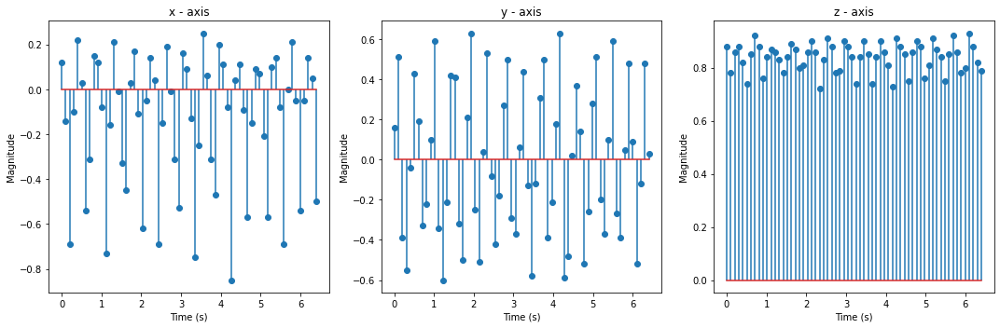

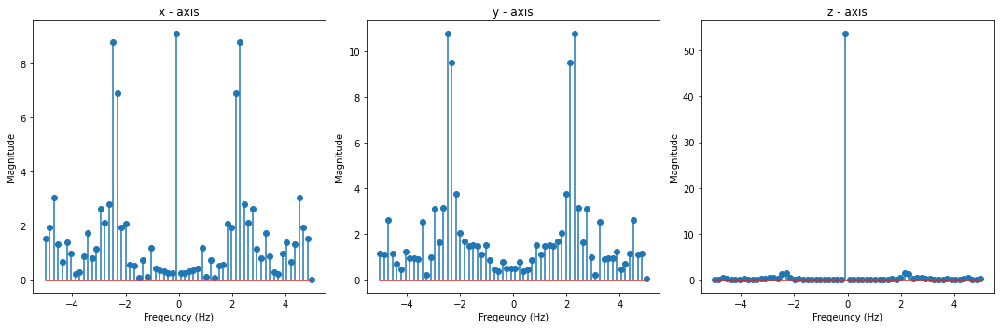

[0.12, -0.14, -0.69, -0.1, 0.22, 0.03, -0.54, -0.31, 0.15, 0.12, -0.08, -0.73, -0.16, 0.21, -0.01, -0.33, -0.45, 0.03, 0.17, -0.11, -0.62, -0.05, 0.14, 0.04, -0.69, -0.15, 0.19, -0.01, -0.31, -0.53, 0.16, 0.09, -0.13, -0.75, -0.25, 0.25, 0.06, -0.31, -0.47, 0.2, 0.11, -0.08, -0.85, 0.04, 0.11, -0.09, -0.57, -0.15, 0.09, 0.07, -0.21, -0.57, 0.1, 0.14, -0.08, -0.69, 0.0, 0.21, -0.05, -0.54, -0.05, 0.14, 0.05, -0.5]
[0.16, 0.51, -0.39, -0.55, -0.04, 0.43, 0.19, -0.33, -0.22, 0.1, 0.59, -0.34, -0.6, -0.21, 0.42, 0.41, -0.32, -0.5, 0.21, 0.63, -0.25, -0.51, 0.04, 0.53, -0.08, -0.42, -0.18, 0.27, 0.5, -0.29, -0.37, 0.06, 0.44, -0.13, -0.58, -0.12, 0.31, 0.5, -0.39, -0.21, 0.18, 0.63, -0.59, -0.48, 0.02, 0.37, 0.14, -0.52, -0.26, 0.28, 0.51, -0.2, -0.37, 0.1, 0.59, -0.27, -0.39, 0.05, 0.48, 0.09, -0.52, -0.12, 0.48, 0.03]
[0.88, 0.84, 0.75, 0.86, 0.9, 0.86, 0.77, 0.81, 0.89, 0.89, 0.86, 0.73, 0.85, 0.91, 0.86, 0.8, 0.79, 0.88, 0.9, 0.84, 0.75, 0.86, 0.89, 0.88, 0.74, 0.83, 0.89, 0.87, 0.81, 0

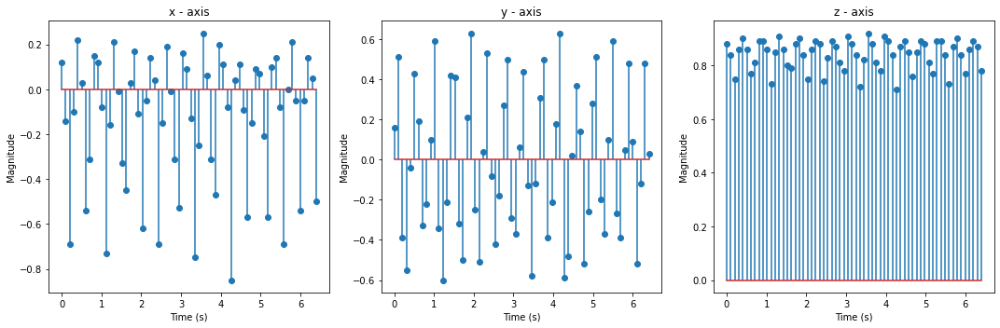

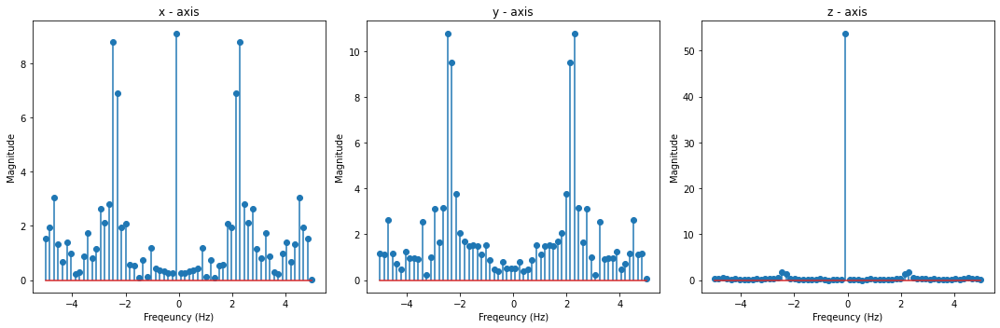

[-0.5, 0.12, 0.06, -0.29, -0.31, 0.16, 0.08, -0.18, -0.63, -0.02, 0.1, -0.03, -0.7, -0.06, 0.15, -0.01, -0.51, -0.16, 0.15, 0.06, -0.34, -0.38, 0.05, 0.05, -0.17, -0.44, 0.07, 0.1, -0.13, -0.61, -0.17, 0.18, -0.11, -0.63, -0.02, 0.12, -0.15, -0.63, 0.07, 0.15, -0.14, -0.49, -0.12, 0.1, -0.21, -0.53, -0.06, 0.07, -0.17, -0.3, -0.13, 0.16, -0.05, -0.42, -0.22, 0.2, -0.02, -0.3, -0.28, 0.16, 0.01, -0.39, -0.39, 0.02]
[0.16, 0.51, -0.39, -0.55, -0.04, 0.43, 0.19, -0.33, -0.22, 0.1, 0.59, -0.34, -0.6, -0.21, 0.42, 0.41, -0.32, -0.5, 0.21, 0.63, -0.25, -0.51, 0.04, 0.53, -0.08, -0.42, -0.18, 0.27, 0.5, -0.29, -0.37, 0.06, 0.44, -0.13, -0.58, -0.12, 0.31, 0.5, -0.39, -0.21, 0.18, 0.63, -0.59, -0.48, 0.02, 0.37, 0.14, -0.52, -0.26, 0.28, 0.51, -0.2, -0.37, 0.1, 0.59, -0.27, -0.39, 0.05, 0.48, 0.09, -0.52, -0.12, 0.48, 0.03]
[0.88, 0.84, 0.75, 0.86, 0.9, 0.86, 0.77, 0.81, 0.89, 0.89, 0.86, 0.73, 0.85, 0.91, 0.86, 0.8, 0.79, 0.88, 0.9, 0.84, 0.75, 0.86, 0.89, 0.88, 0.74, 0.83, 0.89, 0.87, 0.81, 

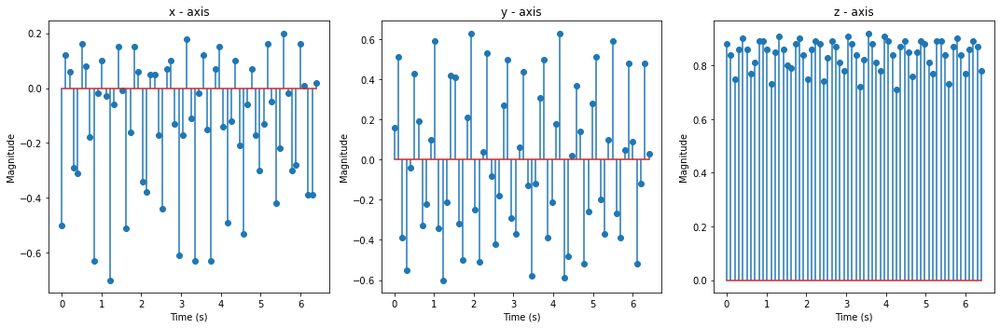

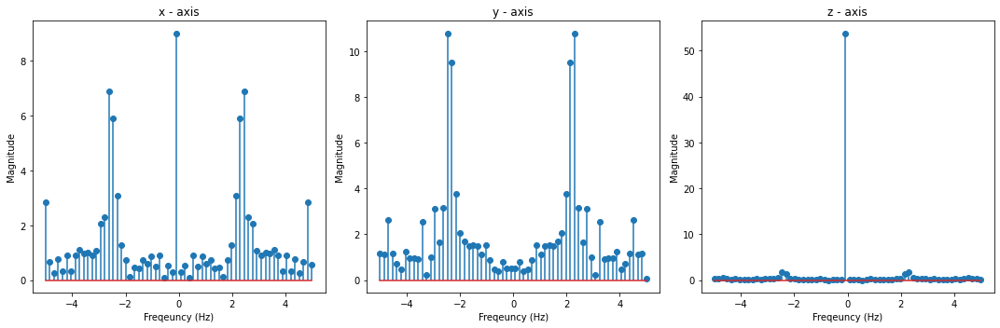

[-0.5, 0.12, 0.06, -0.29, -0.31, 0.16, 0.08, -0.18, -0.63, -0.02, 0.1, -0.03, -0.7, -0.06, 0.15, -0.01, -0.51, -0.16, 0.15, 0.06, -0.34, -0.38, 0.05, 0.05, -0.17, -0.44, 0.07, 0.1, -0.13, -0.61, -0.17, 0.18, -0.11, -0.63, -0.02, 0.12, -0.15, -0.63, 0.07, 0.15, -0.14, -0.49, -0.12, 0.1, -0.21, -0.53, -0.06, 0.07, -0.17, -0.3, -0.13, 0.16, -0.05, -0.42, -0.22, 0.2, -0.02, -0.3, -0.28, 0.16, 0.01, -0.39, -0.39, 0.02]
[0.01, -0.09, 0.41, 0.46, -0.27, -0.19, 0.2, 0.6, -0.52, -0.41, -0.0, 0.51, -0.32, -0.39, -0.15, 0.48, 0.09, -0.4, -0.13, 0.35, 0.32, -0.38, -0.26, 0.22, 0.49, -0.35, -0.24, 0.22, 0.54, -0.42, -0.5, 0.15, 0.49, -0.4, -0.38, -0.04, 0.44, -0.27, -0.41, 0.14, 0.52, -0.29, -0.48, 0.15, 0.31, -0.3, -0.31, 0.16, 0.23, 0.15, -0.4, -0.03, 0.45, -0.06, -0.35, 0.11, 0.33, 0.2, -0.38, -0.2, 0.45, 0.43, -0.35, -0.36]
[0.88, 0.84, 0.75, 0.86, 0.9, 0.86, 0.77, 0.81, 0.89, 0.89, 0.86, 0.73, 0.85, 0.91, 0.86, 0.8, 0.79, 0.88, 0.9, 0.84, 0.75, 0.86, 0.89, 0.88, 0.74, 0.83, 0.89, 0.87, 0.81, 0

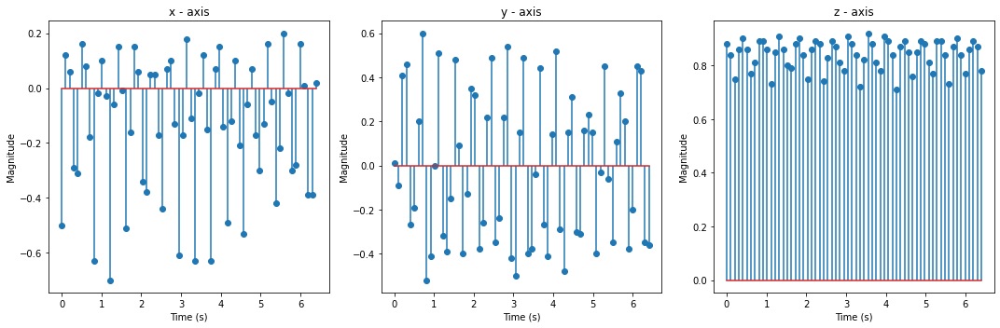

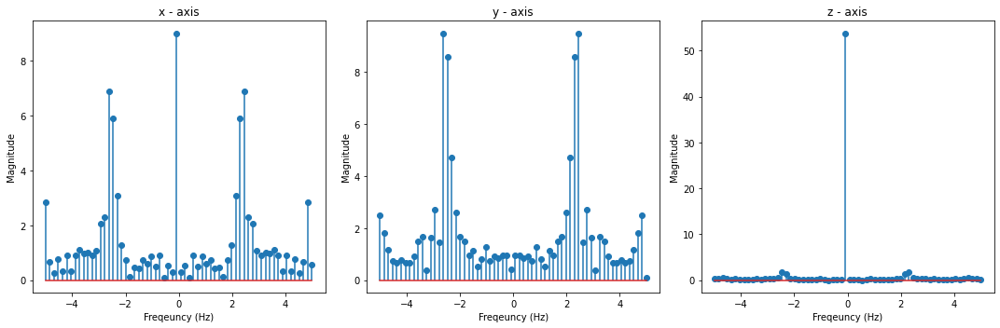

[-0.5, 0.12, 0.06, -0.29, -0.31, 0.16, 0.08, -0.18, -0.63, -0.02, 0.1, -0.03, -0.7, -0.06, 0.15, -0.01, -0.51, -0.16, 0.15, 0.06, -0.34, -0.38, 0.05, 0.05, -0.17, -0.44, 0.07, 0.1, -0.13, -0.61, -0.17, 0.18, -0.11, -0.63, -0.02, 0.12, -0.15, -0.63, 0.07, 0.15, -0.14, -0.49, -0.12, 0.1, -0.21, -0.53, -0.06, 0.07, -0.17, -0.3, -0.13, 0.16, -0.05, -0.42, -0.22, 0.2, -0.02, -0.3, -0.28, 0.16, 0.01, -0.39, -0.39, 0.02]
[0.01, -0.09, 0.41, 0.46, -0.27, -0.19, 0.2, 0.6, -0.52, -0.41, -0.0, 0.51, -0.32, -0.39, -0.15, 0.48, 0.09, -0.4, -0.13, 0.35, 0.32, -0.38, -0.26, 0.22, 0.49, -0.35, -0.24, 0.22, 0.54, -0.42, -0.5, 0.15, 0.49, -0.4, -0.38, -0.04, 0.44, -0.27, -0.41, 0.14, 0.52, -0.29, -0.48, 0.15, 0.31, -0.3, -0.31, 0.16, 0.23, 0.15, -0.4, -0.03, 0.45, -0.06, -0.35, 0.11, 0.33, 0.2, -0.38, -0.2, 0.45, 0.43, -0.35, -0.36]
[0.78, 0.9, 0.88, 0.81, 0.8, 0.89, 0.88, 0.82, 0.76, 0.86, 0.89, 0.84, 0.74, 0.87, 0.9, 0.86, 0.77, 0.84, 0.91, 0.87, 0.79, 0.84, 0.88, 0.88, 0.84, 0.78, 0.87, 0.88, 0.85, 0

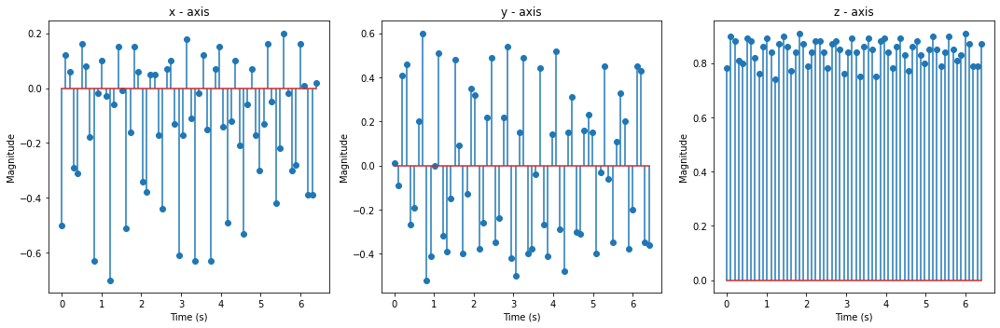

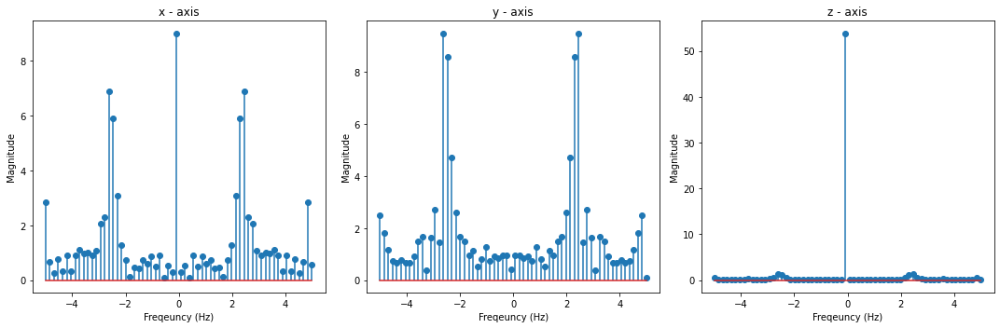

[0.03, -0.23, -0.56, 0.06, 0.04, -0.2, -0.29, -0.25, 0.02, 0.06, -0.23, -0.44, -0.11, 0.08, -0.14, -0.49, -0.27, 0.16, 0.01, -0.5, -0.33, 0.28, -0.01, -0.14, -0.65, -0.11, 0.12, -0.15, -0.28, -0.44, 0.14, 0.05, -0.25, -0.41, 0.06, 0.01, -0.16, -0.29, -0.18, 0.1, 0.06, -0.2, -0.46, -0.02, 0.1, -0.14, -0.65, -0.21, 0.13, -0.08, -0.47, -0.19, 0.16, 0.03, -0.36, -0.36, 0.07, 0.1, -0.2, -0.59, -0.06, 0.2, -0.19, -0.64]
[0.01, -0.09, 0.41, 0.46, -0.27, -0.19, 0.2, 0.6, -0.52, -0.41, -0.0, 0.51, -0.32, -0.39, -0.15, 0.48, 0.09, -0.4, -0.13, 0.35, 0.32, -0.38, -0.26, 0.22, 0.49, -0.35, -0.24, 0.22, 0.54, -0.42, -0.5, 0.15, 0.49, -0.4, -0.38, -0.04, 0.44, -0.27, -0.41, 0.14, 0.52, -0.29, -0.48, 0.15, 0.31, -0.3, -0.31, 0.16, 0.23, 0.15, -0.4, -0.03, 0.45, -0.06, -0.35, 0.11, 0.33, 0.2, -0.38, -0.2, 0.45, 0.43, -0.35, -0.36]
[0.78, 0.9, 0.88, 0.81, 0.8, 0.89, 0.88, 0.82, 0.76, 0.86, 0.89, 0.84, 0.74, 0.87, 0.9, 0.86, 0.77, 0.84, 0.91, 0.87, 0.79, 0.84, 0.88, 0.88, 0.84, 0.78, 0.87, 0.88, 0.85, 0

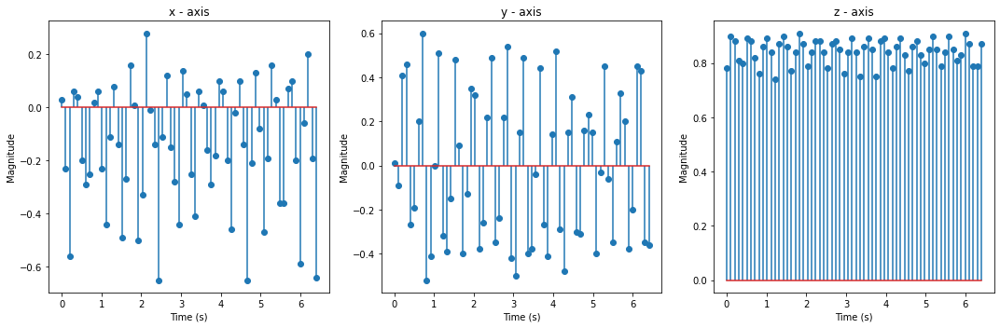

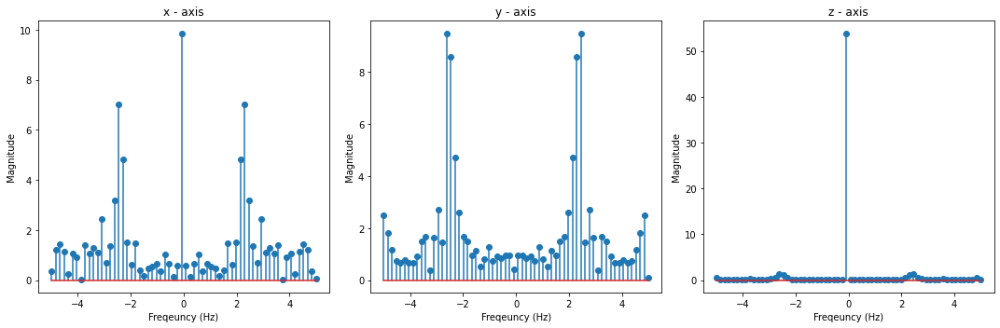

[0.03, -0.23, -0.56, 0.06, 0.04, -0.2, -0.29, -0.25, 0.02, 0.06, -0.23, -0.44, -0.11, 0.08, -0.14, -0.49, -0.27, 0.16, 0.01, -0.5, -0.33, 0.28, -0.01, -0.14, -0.65, -0.11, 0.12, -0.15, -0.28, -0.44, 0.14, 0.05, -0.25, -0.41, 0.06, 0.01, -0.16, -0.29, -0.18, 0.1, 0.06, -0.2, -0.46, -0.02, 0.1, -0.14, -0.65, -0.21, 0.13, -0.08, -0.47, -0.19, 0.16, 0.03, -0.36, -0.36, 0.07, 0.1, -0.2, -0.59, -0.06, 0.2, -0.19, -0.64]
[-0.36, 0.49, -0.39, -0.33, -0.03, 0.37, 0.21, -0.36, -0.19, 0.26, 0.57, -0.44, -0.47, 0.04, 0.42, 0.03, -0.46, -0.17, 0.34, 0.03, -0.5, -0.03, 0.22, 0.48, -0.5, -0.47, 0.03, 0.37, 0.4, -0.52, -0.21, 0.25, 0.35, -0.16, -0.32, -0.04, 0.41, 0.37, -0.56, -0.23, 0.3, 0.63, -0.45, -0.39, 0.05, 0.47, -0.19, -0.48, -0.08, 0.42, 0.04, -0.45, -0.14, 0.35, 0.33, -0.33, -0.33, 0.26, 0.62, -0.46, -0.6, 0.25, 0.48, -0.33]
[0.78, 0.9, 0.88, 0.81, 0.8, 0.89, 0.88, 0.82, 0.76, 0.86, 0.89, 0.84, 0.74, 0.87, 0.9, 0.86, 0.77, 0.84, 0.91, 0.87, 0.79, 0.84, 0.88, 0.88, 0.84, 0.78, 0.87, 0.88, 0.8

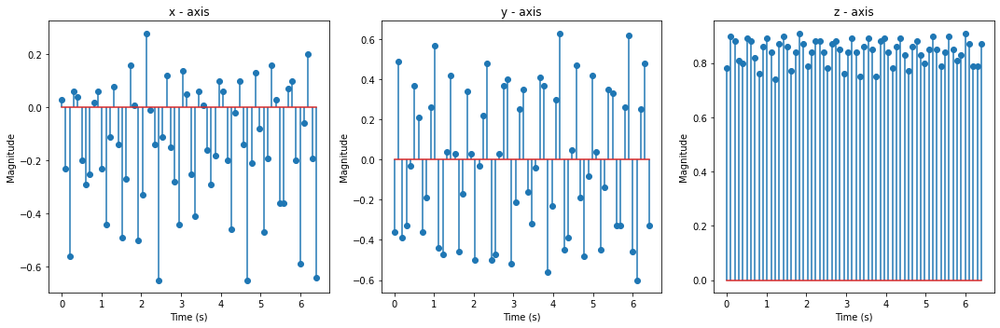

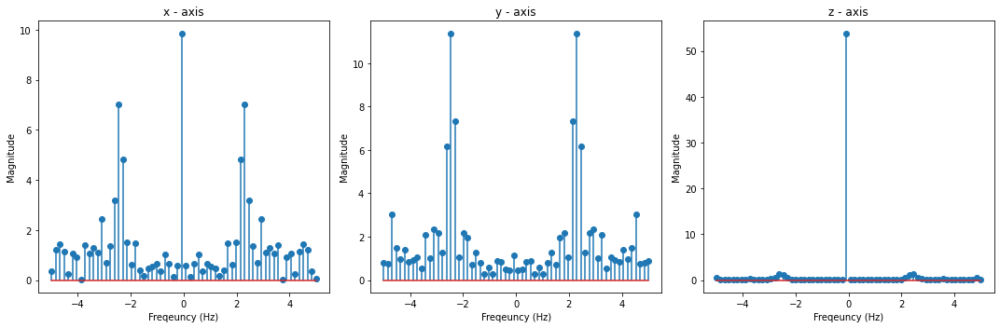

[0.03, -0.23, -0.56, 0.06, 0.04, -0.2, -0.29, -0.25, 0.02, 0.06, -0.23, -0.44, -0.11, 0.08, -0.14, -0.49, -0.27, 0.16, 0.01, -0.5, -0.33, 0.28, -0.01, -0.14, -0.65, -0.11, 0.12, -0.15, -0.28, -0.44, 0.14, 0.05, -0.25, -0.41, 0.06, 0.01, -0.16, -0.29, -0.18, 0.1, 0.06, -0.2, -0.46, -0.02, 0.1, -0.14, -0.65, -0.21, 0.13, -0.08, -0.47, -0.19, 0.16, 0.03, -0.36, -0.36, 0.07, 0.1, -0.2, -0.59, -0.06, 0.2, -0.19, -0.64]
[-0.36, 0.49, -0.39, -0.33, -0.03, 0.37, 0.21, -0.36, -0.19, 0.26, 0.57, -0.44, -0.47, 0.04, 0.42, 0.03, -0.46, -0.17, 0.34, 0.03, -0.5, -0.03, 0.22, 0.48, -0.5, -0.47, 0.03, 0.37, 0.4, -0.52, -0.21, 0.25, 0.35, -0.16, -0.32, -0.04, 0.41, 0.37, -0.56, -0.23, 0.3, 0.63, -0.45, -0.39, 0.05, 0.47, -0.19, -0.48, -0.08, 0.42, 0.04, -0.45, -0.14, 0.35, 0.33, -0.33, -0.33, 0.26, 0.62, -0.46, -0.6, 0.25, 0.48, -0.33]
[0.87, 0.83, 0.76, 0.89, 0.88, 0.83, 0.81, 0.82, 0.87, 0.88, 0.82, 0.79, 0.84, 0.89, 0.84, 0.77, 0.82, 0.9, 0.87, 0.77, 0.81, 0.91, 0.87, 0.82, 0.74, 0.85, 0.89, 0.85, 0

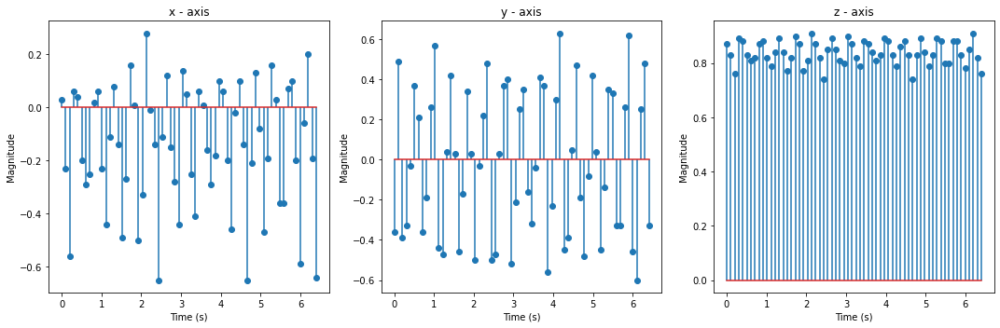

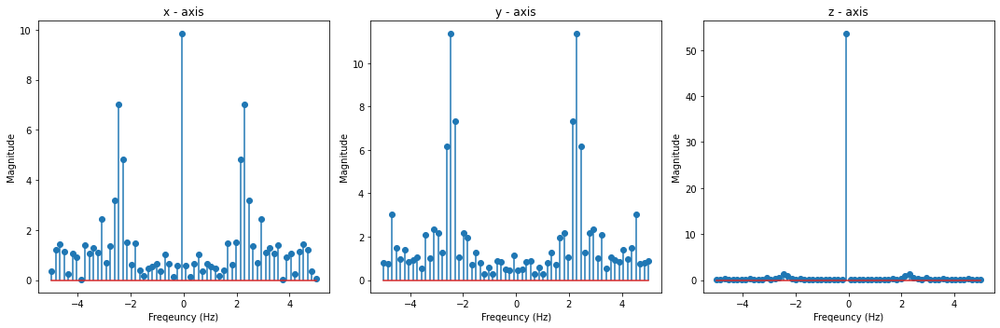

[-0.63, 0.16, 0.01, -0.82, -0.05, 0.14, 0.0, -0.43, -0.28, 0.19, 0.1, -0.36, -0.5, 0.0, 0.18, -0.17, -0.64, -0.21, 0.23, -0.13, -0.61, -0.1, 0.11, 0.01, -0.42, -0.14, 0.17, 0.07, -0.11, -0.44, -0.13, 0.06, -0.1, -0.59, -0.03, 0.19, -0.04, -0.29, -0.35, -0.03, 0.11, -0.2, -0.53, -0.27, 0.21, 0.05, -0.37, -0.25, 0.06, 0.07, -0.17, -0.55, 0.02, -0.03, -0.09, -0.15, -0.53, -0.16, 0.19, -0.13, -0.68, -0.2, 0.2, -0.17]
[-0.36, 0.49, -0.39, -0.33, -0.03, 0.37, 0.21, -0.36, -0.19, 0.26, 0.57, -0.44, -0.47, 0.04, 0.42, 0.03, -0.46, -0.17, 0.34, 0.03, -0.5, -0.03, 0.22, 0.48, -0.5, -0.47, 0.03, 0.37, 0.4, -0.52, -0.21, 0.25, 0.35, -0.16, -0.32, -0.04, 0.41, 0.37, -0.56, -0.23, 0.3, 0.63, -0.45, -0.39, 0.05, 0.47, -0.19, -0.48, -0.08, 0.42, 0.04, -0.45, -0.14, 0.35, 0.33, -0.33, -0.33, 0.26, 0.62, -0.46, -0.6, 0.25, 0.48, -0.33]
[0.87, 0.83, 0.76, 0.89, 0.88, 0.83, 0.81, 0.82, 0.87, 0.88, 0.82, 0.79, 0.84, 0.89, 0.84, 0.77, 0.82, 0.9, 0.87, 0.77, 0.81, 0.91, 0.87, 0.82, 0.74, 0.85, 0.89, 0.85, 0.

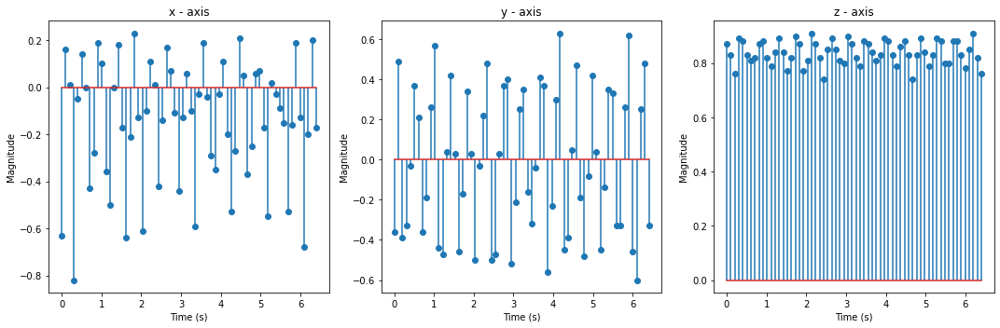

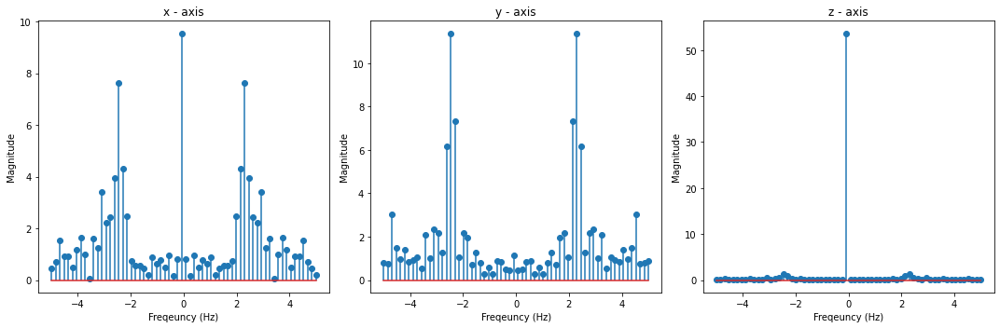

[-0.63, 0.16, 0.01, -0.82, -0.05, 0.14, 0.0, -0.43, -0.28, 0.19, 0.1, -0.36, -0.5, 0.0, 0.18, -0.17, -0.64, -0.21, 0.23, -0.13, -0.61, -0.1, 0.11, 0.01, -0.42, -0.14, 0.17, 0.07, -0.11, -0.44, -0.13, 0.06, -0.1, -0.59, -0.03, 0.19, -0.04, -0.29, -0.35, -0.03, 0.11, -0.2, -0.53, -0.27, 0.21, 0.05, -0.37, -0.25, 0.06, 0.07, -0.17, -0.55, 0.02, -0.03, -0.09, -0.15, -0.53, -0.16, 0.19, -0.13, -0.68, -0.2, 0.2, -0.17]
[-0.33, 0.14, 0.46, -0.18, -0.53, -0.08, 0.37, 0.28, -0.42, -0.15, 0.31, 0.4, -0.29, -0.48, 0.08, 0.57, -0.12, -0.71, 0.12, 0.5, -0.12, -0.46, -0.16, 0.41, 0.25, -0.39, -0.18, 0.37, 0.63, -0.29, -0.5, -0.01, 0.55, -0.2, -0.48, -0.11, 0.34, 0.58, -0.54, -0.43, 0.08, 0.48, -0.23, -0.5, -0.03, 0.5, 0.32, -0.39, -0.25, 0.22, 0.49, -0.21, -0.28, -0.17, 0.37, 0.47, -0.57, -0.68, 0.18, 0.49, -0.38, -0.57, 0.07, 0.41]
[0.87, 0.83, 0.76, 0.89, 0.88, 0.83, 0.81, 0.82, 0.87, 0.88, 0.82, 0.79, 0.84, 0.89, 0.84, 0.77, 0.82, 0.9, 0.87, 0.77, 0.81, 0.91, 0.87, 0.82, 0.74, 0.85, 0.89, 0.85, 0

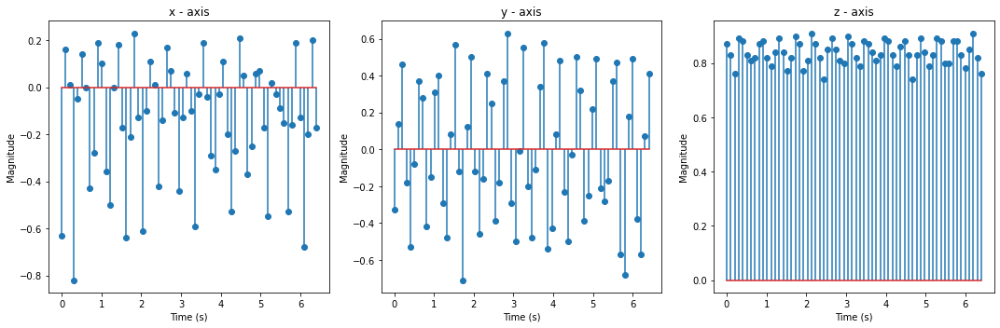

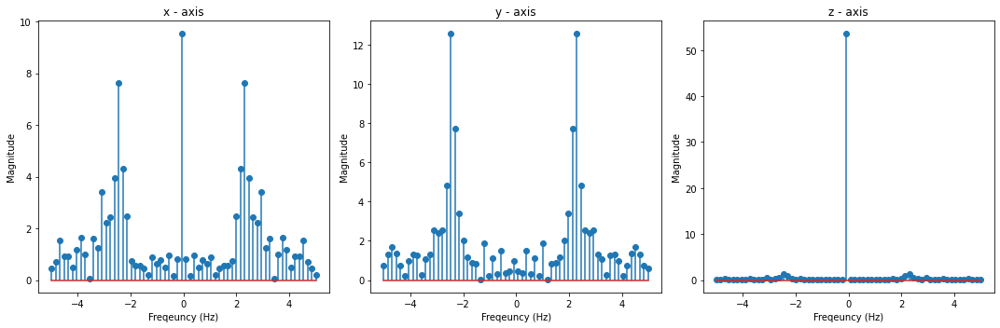

[-0.63, 0.16, 0.01, -0.82, -0.05, 0.14, 0.0, -0.43, -0.28, 0.19, 0.1, -0.36, -0.5, 0.0, 0.18, -0.17, -0.64, -0.21, 0.23, -0.13, -0.61, -0.1, 0.11, 0.01, -0.42, -0.14, 0.17, 0.07, -0.11, -0.44, -0.13, 0.06, -0.1, -0.59, -0.03, 0.19, -0.04, -0.29, -0.35, -0.03, 0.11, -0.2, -0.53, -0.27, 0.21, 0.05, -0.37, -0.25, 0.06, 0.07, -0.17, -0.55, 0.02, -0.03, -0.09, -0.15, -0.53, -0.16, 0.19, -0.13, -0.68, -0.2, 0.2, -0.17]
[-0.33, 0.14, 0.46, -0.18, -0.53, -0.08, 0.37, 0.28, -0.42, -0.15, 0.31, 0.4, -0.29, -0.48, 0.08, 0.57, -0.12, -0.71, 0.12, 0.5, -0.12, -0.46, -0.16, 0.41, 0.25, -0.39, -0.18, 0.37, 0.63, -0.29, -0.5, -0.01, 0.55, -0.2, -0.48, -0.11, 0.34, 0.58, -0.54, -0.43, 0.08, 0.48, -0.23, -0.5, -0.03, 0.5, 0.32, -0.39, -0.25, 0.22, 0.49, -0.21, -0.28, -0.17, 0.37, 0.47, -0.57, -0.68, 0.18, 0.49, -0.38, -0.57, 0.07, 0.41]
[0.76, 0.91, 0.88, 0.72, 0.86, 0.9, 0.87, 0.78, 0.81, 0.91, 0.89, 0.79, 0.77, 0.87, 0.91, 0.83, 0.75, 0.83, 0.92, 0.85, 0.75, 0.85, 0.89, 0.87, 0.79, 0.84, 0.9, 0.89, 0.

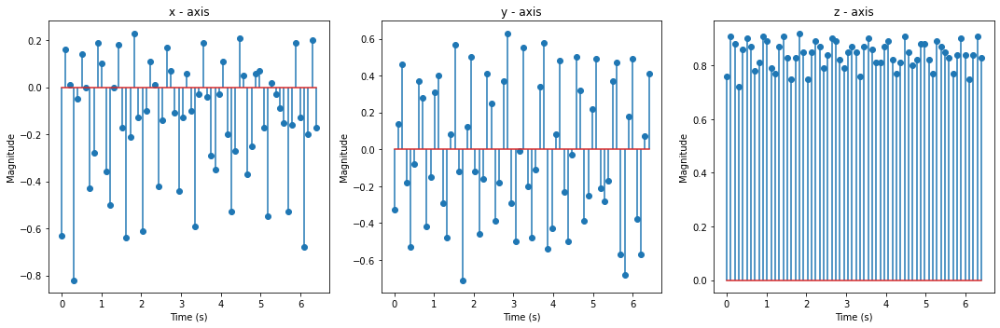

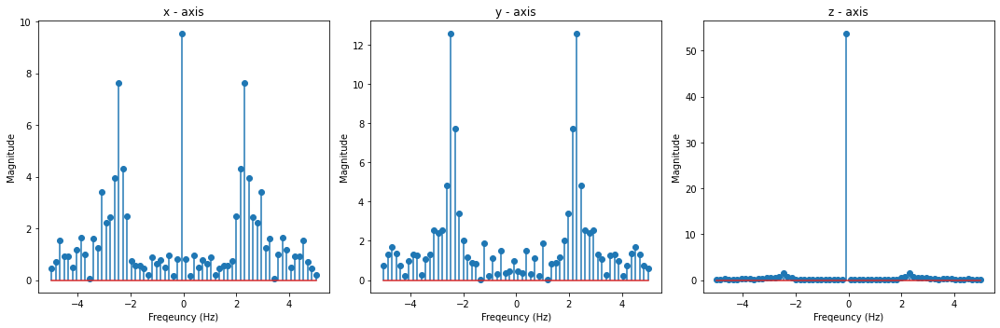

[-0.09, 0.19, -0.01, -0.78, -0.04, 0.1, 0.0, -0.1, -0.57, -0.12, 0.18, -0.1, -0.68, -0.21, 0.25, 0.07, -0.64, -0.18, 0.2, 0.02, -0.12, -0.61, -0.07, 0.1, -0.03, -0.15, -0.51, 0.1, 0.18, -0.17, -0.55, -0.08, 0.19, -0.02, -0.42, -0.34, 0.25, 0.13, -0.31, -0.6, 0.14, 0.15, 0.01, -0.63, -0.15, 0.21, 0.17, -0.4, -0.5, -0.02, 0.1, -0.1, -0.61, -0.17, 0.22, -0.04, -0.42, -0.53, 0.34, 0.12, -0.19, -0.65, -0.05, 0.14]
[-0.33, 0.14, 0.46, -0.18, -0.53, -0.08, 0.37, 0.28, -0.42, -0.15, 0.31, 0.4, -0.29, -0.48, 0.08, 0.57, -0.12, -0.71, 0.12, 0.5, -0.12, -0.46, -0.16, 0.41, 0.25, -0.39, -0.18, 0.37, 0.63, -0.29, -0.5, -0.01, 0.55, -0.2, -0.48, -0.11, 0.34, 0.58, -0.54, -0.43, 0.08, 0.48, -0.23, -0.5, -0.03, 0.5, 0.32, -0.39, -0.25, 0.22, 0.49, -0.21, -0.28, -0.17, 0.37, 0.47, -0.57, -0.68, 0.18, 0.49, -0.38, -0.57, 0.07, 0.41]
[0.76, 0.91, 0.88, 0.72, 0.86, 0.9, 0.87, 0.78, 0.81, 0.91, 0.89, 0.79, 0.77, 0.87, 0.91, 0.83, 0.75, 0.83, 0.92, 0.85, 0.75, 0.85, 0.89, 0.87, 0.79, 0.84, 0.9, 0.89, 0.82, 

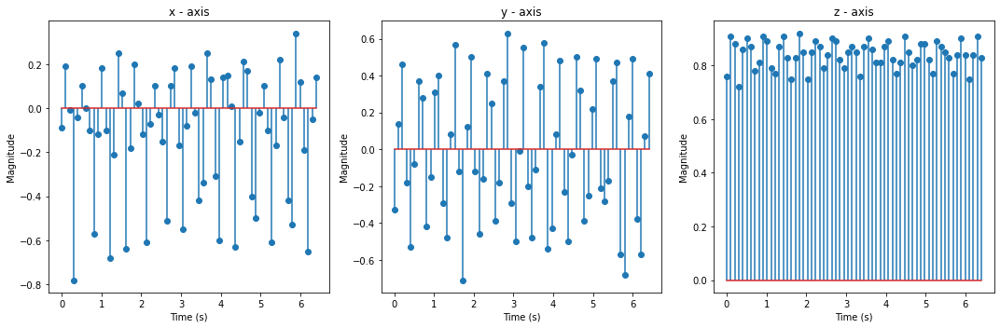

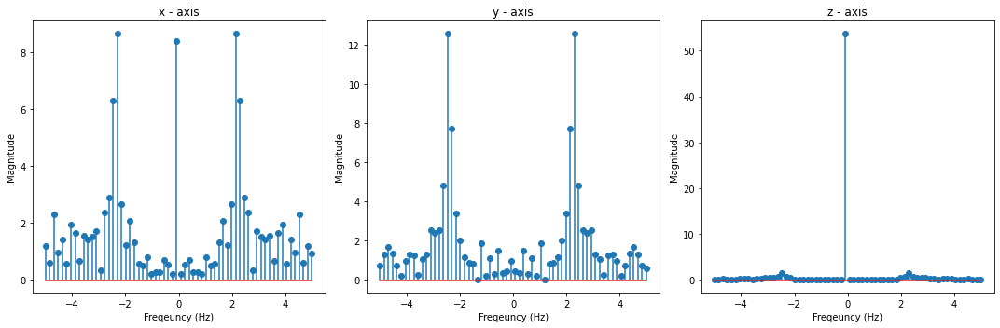

[-0.09, 0.19, -0.01, -0.78, -0.04, 0.1, 0.0, -0.1, -0.57, -0.12, 0.18, -0.1, -0.68, -0.21, 0.25, 0.07, -0.64, -0.18, 0.2, 0.02, -0.12, -0.61, -0.07, 0.1, -0.03, -0.15, -0.51, 0.1, 0.18, -0.17, -0.55, -0.08, 0.19, -0.02, -0.42, -0.34, 0.25, 0.13, -0.31, -0.6, 0.14, 0.15, 0.01, -0.63, -0.15, 0.21, 0.17, -0.4, -0.5, -0.02, 0.1, -0.1, -0.61, -0.17, 0.22, -0.04, -0.42, -0.53, 0.34, 0.12, -0.19, -0.65, -0.05, 0.14]
[-0.37, -0.13, 0.45, -0.15, -0.4, -0.22, 0.24, 0.59, -0.46, -0.52, 0.1, 0.54, -0.25, -0.48, -0.03, 0.43, 0.15, -0.37, -0.14, 0.12, 0.54, -0.21, -0.52, -0.08, 0.26, 0.56, -0.47, -0.17, 0.12, 0.48, -0.12, -0.66, 0.02, 0.37, 0.28, -0.67, -0.12, 0.34, 0.48, -0.45, -0.4, 0.09, 0.46, 0.04, -0.5, -0.11, 0.38, 0.42, -0.31, -0.53, 0.05, 0.56, -0.15, -0.54, -0.01, 0.38, 0.24, -0.48, -0.11, 0.18, 0.56, -0.3, -0.44, -0.08]
[0.76, 0.91, 0.88, 0.72, 0.86, 0.9, 0.87, 0.78, 0.81, 0.91, 0.89, 0.79, 0.77, 0.87, 0.91, 0.83, 0.75, 0.83, 0.92, 0.85, 0.75, 0.85, 0.89, 0.87, 0.79, 0.84, 0.9, 0.89, 0.82,

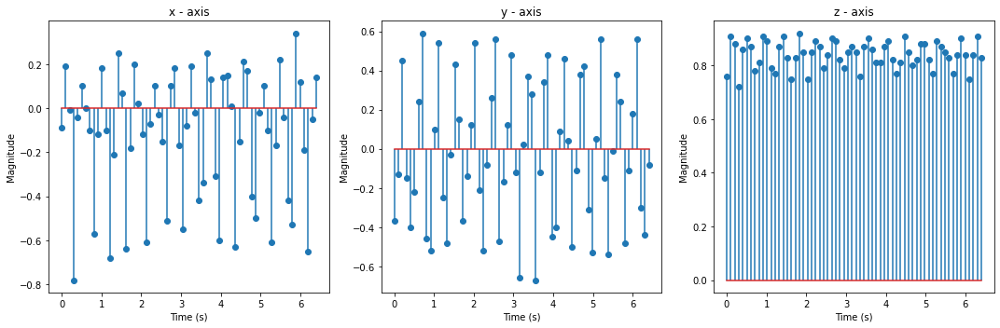

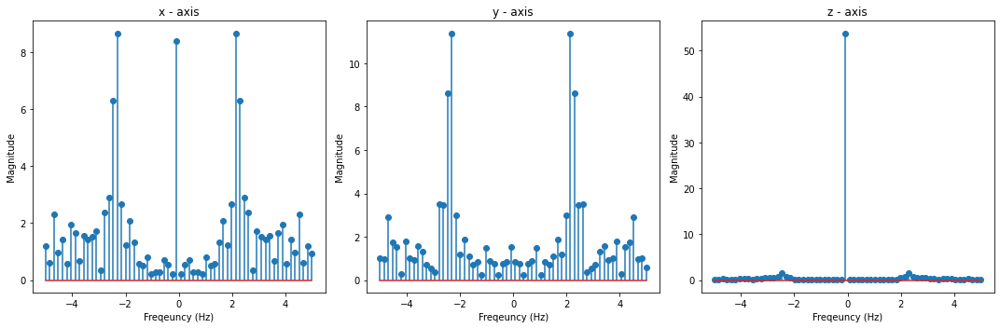

[-0.09, 0.19, -0.01, -0.78, -0.04, 0.1, 0.0, -0.1, -0.57, -0.12, 0.18, -0.1, -0.68, -0.21, 0.25, 0.07, -0.64, -0.18, 0.2, 0.02, -0.12, -0.61, -0.07, 0.1, -0.03, -0.15, -0.51, 0.1, 0.18, -0.17, -0.55, -0.08, 0.19, -0.02, -0.42, -0.34, 0.25, 0.13, -0.31, -0.6, 0.14, 0.15, 0.01, -0.63, -0.15, 0.21, 0.17, -0.4, -0.5, -0.02, 0.1, -0.1, -0.61, -0.17, 0.22, -0.04, -0.42, -0.53, 0.34, 0.12, -0.19, -0.65, -0.05, 0.14]
[-0.37, -0.13, 0.45, -0.15, -0.4, -0.22, 0.24, 0.59, -0.46, -0.52, 0.1, 0.54, -0.25, -0.48, -0.03, 0.43, 0.15, -0.37, -0.14, 0.12, 0.54, -0.21, -0.52, -0.08, 0.26, 0.56, -0.47, -0.17, 0.12, 0.48, -0.12, -0.66, 0.02, 0.37, 0.28, -0.67, -0.12, 0.34, 0.48, -0.45, -0.4, 0.09, 0.46, 0.04, -0.5, -0.11, 0.38, 0.42, -0.31, -0.53, 0.05, 0.56, -0.15, -0.54, -0.01, 0.38, 0.24, -0.48, -0.11, 0.18, 0.56, -0.3, -0.44, -0.08]
[0.86, 0.91, 0.85, 0.73, 0.86, 0.88, 0.86, 0.84, 0.77, 0.85, 0.9, 0.86, 0.74, 0.82, 0.92, 0.89, 0.74, 0.84, 0.9, 0.87, 0.83, 0.76, 0.86, 0.89, 0.86, 0.83, 0.77, 0.89, 0.9, 

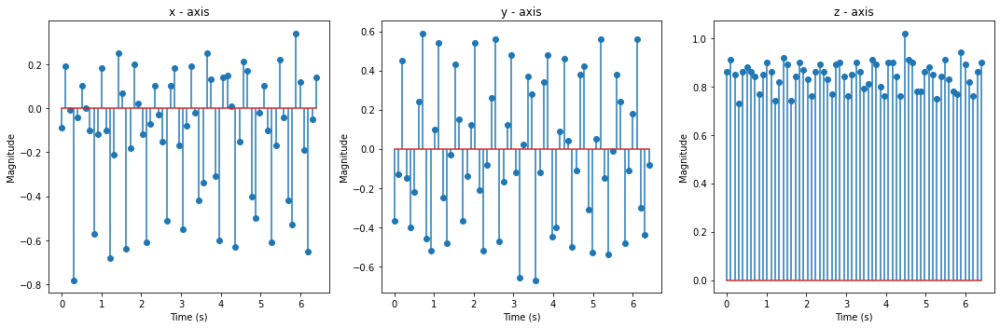

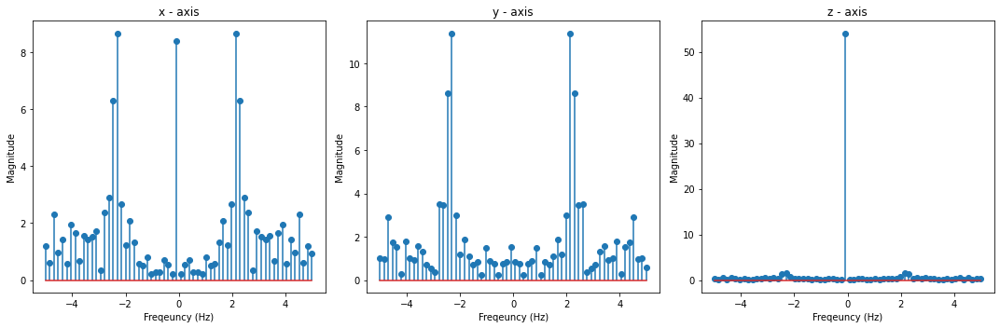

[-0.49, -0.2, 0.11, 0.12, -0.19, -0.68, 0.1, 0.27, -0.07, -0.73, -0.09, 0.24, 0.13, -0.51, -0.45, 0.07, 0.26, -0.15, -0.59, -0.05, 0.1, -0.0, -0.37, -0.49, 0.15, 0.11, -0.01, -0.71, -0.29, 0.26, -0.01, -0.35, -0.42, -0.03, 0.2, -0.21, -0.72, -0.06, -0.24, 0.09, -0.4, -0.33, 0.02, 0.13, -0.2, -0.55, -0.03, 0.03, -0.09, -0.59, -0.17, 0.18, 0.08, -0.49, -0.39, 0.26, 0.28, -0.58, -0.47, 0.01, 0.26, -0.07, -0.77, -0.09]
[-0.37, -0.13, 0.45, -0.15, -0.4, -0.22, 0.24, 0.59, -0.46, -0.52, 0.1, 0.54, -0.25, -0.48, -0.03, 0.43, 0.15, -0.37, -0.14, 0.12, 0.54, -0.21, -0.52, -0.08, 0.26, 0.56, -0.47, -0.17, 0.12, 0.48, -0.12, -0.66, 0.02, 0.37, 0.28, -0.67, -0.12, 0.34, 0.48, -0.45, -0.4, 0.09, 0.46, 0.04, -0.5, -0.11, 0.38, 0.42, -0.31, -0.53, 0.05, 0.56, -0.15, -0.54, -0.01, 0.38, 0.24, -0.48, -0.11, 0.18, 0.56, -0.3, -0.44, -0.08]
[0.86, 0.91, 0.85, 0.73, 0.86, 0.88, 0.86, 0.84, 0.77, 0.85, 0.9, 0.86, 0.74, 0.82, 0.92, 0.89, 0.74, 0.84, 0.9, 0.87, 0.83, 0.76, 0.86, 0.89, 0.86, 0.83, 0.77, 0.89,

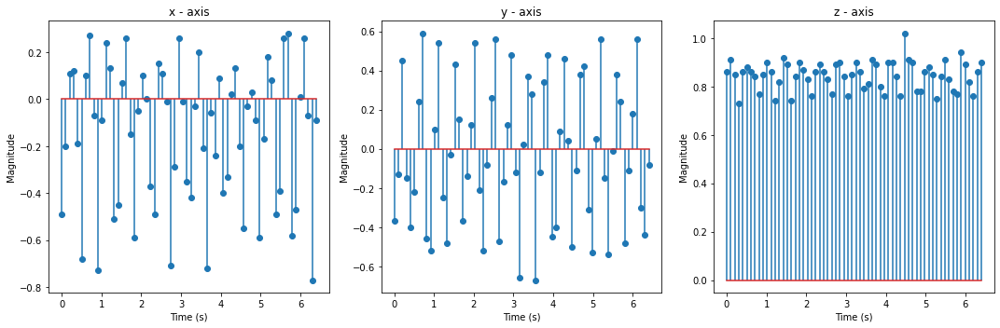

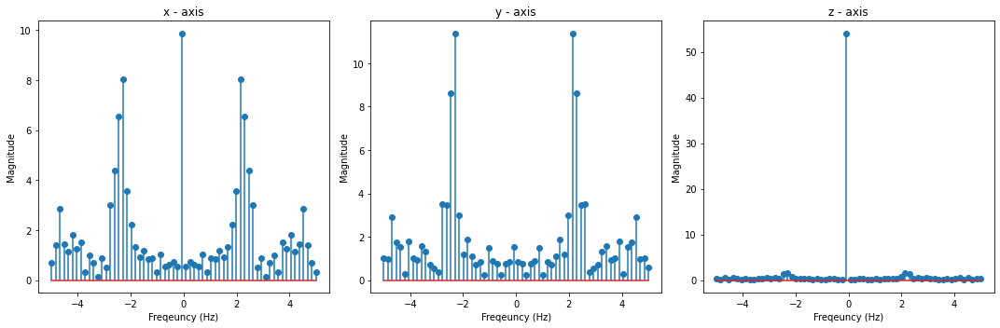

[-0.49, -0.2, 0.11, 0.12, -0.19, -0.68, 0.1, 0.27, -0.07, -0.73, -0.09, 0.24, 0.13, -0.51, -0.45, 0.07, 0.26, -0.15, -0.59, -0.05, 0.1, -0.0, -0.37, -0.49, 0.15, 0.11, -0.01, -0.71, -0.29, 0.26, -0.01, -0.35, -0.42, -0.03, 0.2, -0.21, -0.72, -0.06, -0.24, 0.09, -0.4, -0.33, 0.02, 0.13, -0.2, -0.55, -0.03, 0.03, -0.09, -0.59, -0.17, 0.18, 0.08, -0.49, -0.39, 0.26, 0.28, -0.58, -0.47, 0.01, 0.26, -0.07, -0.77, -0.09]
[0.23, -0.53, -0.28, 0.3, 0.53, -0.3, -0.48, 0.06, 0.59, -0.05, -0.56, -0.14, 0.53, 0.32, -0.19, -0.46, 0.12, 0.51, -0.01, -0.34, -0.16, 0.33, 0.33, -0.37, -0.16, 0.02, 0.61, -0.27, -0.61, -0.14, 0.47, 0.53, -0.58, -0.43, 0.27, 0.53, -0.43, -0.42, -0.29, 0.47, 0.29, -0.32, -0.35, 0.22, 0.53, -0.37, -0.41, -0.0, 0.39, -0.0, -0.5, -0.13, 0.43, 0.28, -0.56, -0.21, 0.2, 0.22, -0.3, -0.5, 0.19, 0.66, -0.43, -0.67]
[0.86, 0.91, 0.85, 0.73, 0.86, 0.88, 0.86, 0.84, 0.77, 0.85, 0.9, 0.86, 0.74, 0.82, 0.92, 0.89, 0.74, 0.84, 0.9, 0.87, 0.83, 0.76, 0.86, 0.89, 0.86, 0.83, 0.77, 0.89, 0

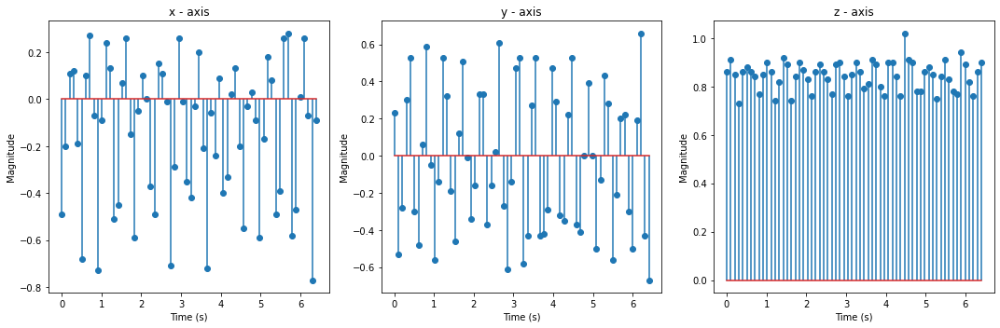

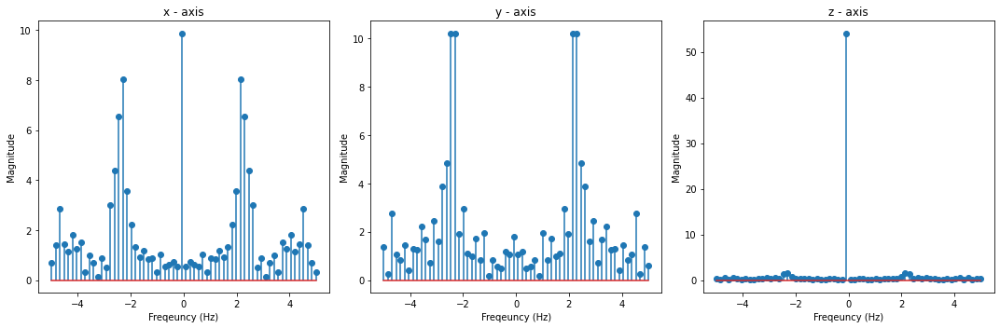

[-0.49, -0.2, 0.11, 0.12, -0.19, -0.68, 0.1, 0.27, -0.07, -0.73, -0.09, 0.24, 0.13, -0.51, -0.45, 0.07, 0.26, -0.15, -0.59, -0.05, 0.1, -0.0, -0.37, -0.49, 0.15, 0.11, -0.01, -0.71, -0.29, 0.26, -0.01, -0.35, -0.42, -0.03, 0.2, -0.21, -0.72, -0.06, -0.24, 0.09, -0.4, -0.33, 0.02, 0.13, -0.2, -0.55, -0.03, 0.03, -0.09, -0.59, -0.17, 0.18, 0.08, -0.49, -0.39, 0.26, 0.28, -0.58, -0.47, 0.01, 0.26, -0.07, -0.77, -0.09]
[0.23, -0.53, -0.28, 0.3, 0.53, -0.3, -0.48, 0.06, 0.59, -0.05, -0.56, -0.14, 0.53, 0.32, -0.19, -0.46, 0.12, 0.51, -0.01, -0.34, -0.16, 0.33, 0.33, -0.37, -0.16, 0.02, 0.61, -0.27, -0.61, -0.14, 0.47, 0.53, -0.58, -0.43, 0.27, 0.53, -0.43, -0.42, -0.29, 0.47, 0.29, -0.32, -0.35, 0.22, 0.53, -0.37, -0.41, -0.0, 0.39, -0.0, -0.5, -0.13, 0.43, 0.28, -0.56, -0.21, 0.2, 0.22, -0.3, -0.5, 0.19, 0.66, -0.43, -0.67]
[0.77, 0.83, 0.89, 0.89, 0.83, 0.74, 0.89, 0.93, 0.86, 0.73, 0.85, 0.92, 0.89, 0.78, 0.79, 0.89, 0.92, 0.85, 0.76, 0.86, 0.89, 0.87, 0.8, 0.77, 0.9, 0.88, 0.85, 0.72, 0

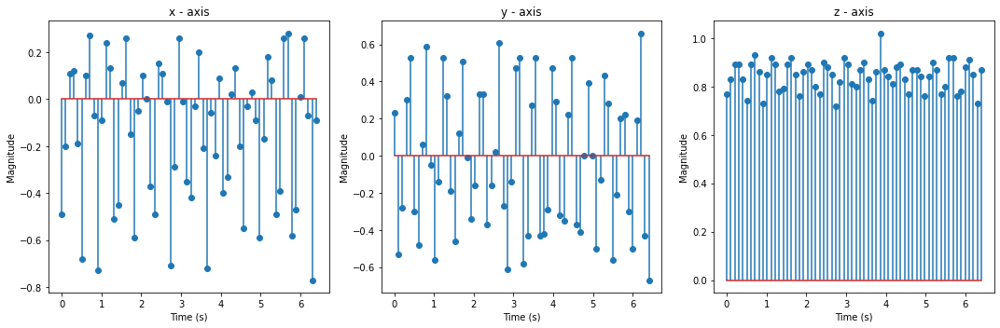

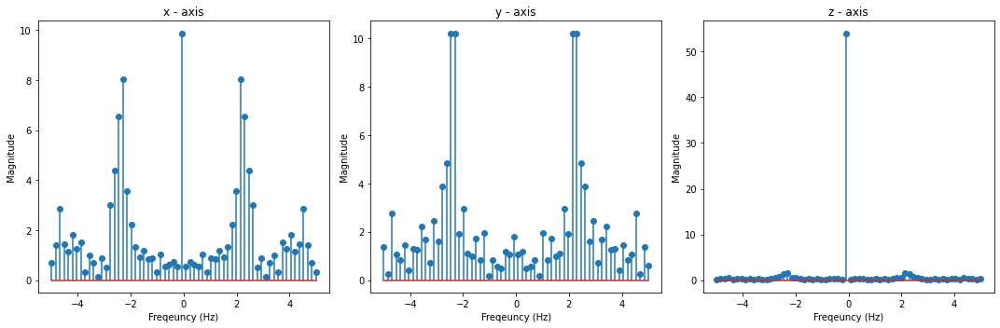

[-0.07, 0.02, -0.67, 0.0, 0.13, 0.09, -0.42, -0.37, 0.1, 0.11, -0.2, -0.56, 0.06, 0.15, -0.07, -0.79, -0.04, 0.17, -0.06, -0.57, -0.23, 0.15, 0.06, -0.5, -0.21, -0.03, 0.13, -0.31, -0.41, -0.03, 0.14, 0.03, -0.65, -0.07, 0.11, 0.03, -0.38, -0.3, 0.08, 0.07, 0.01, -0.64, -0.08, -0.06, 0.12, -0.2, -0.64, -0.15, 0.13, -0.01, -0.42, -0.45, 0.13, 0.16, -0.24, -0.54, -0.2, 0.26, -0.09, -0.38, -0.33, 0.17, 0.13, -0.38]
[0.23, -0.53, -0.28, 0.3, 0.53, -0.3, -0.48, 0.06, 0.59, -0.05, -0.56, -0.14, 0.53, 0.32, -0.19, -0.46, 0.12, 0.51, -0.01, -0.34, -0.16, 0.33, 0.33, -0.37, -0.16, 0.02, 0.61, -0.27, -0.61, -0.14, 0.47, 0.53, -0.58, -0.43, 0.27, 0.53, -0.43, -0.42, -0.29, 0.47, 0.29, -0.32, -0.35, 0.22, 0.53, -0.37, -0.41, -0.0, 0.39, -0.0, -0.5, -0.13, 0.43, 0.28, -0.56, -0.21, 0.2, 0.22, -0.3, -0.5, 0.19, 0.66, -0.43, -0.67]
[0.77, 0.83, 0.89, 0.89, 0.83, 0.74, 0.89, 0.93, 0.86, 0.73, 0.85, 0.92, 0.89, 0.78, 0.79, 0.89, 0.92, 0.85, 0.76, 0.86, 0.89, 0.87, 0.8, 0.77, 0.9, 0.88, 0.85, 0.72, 0.82

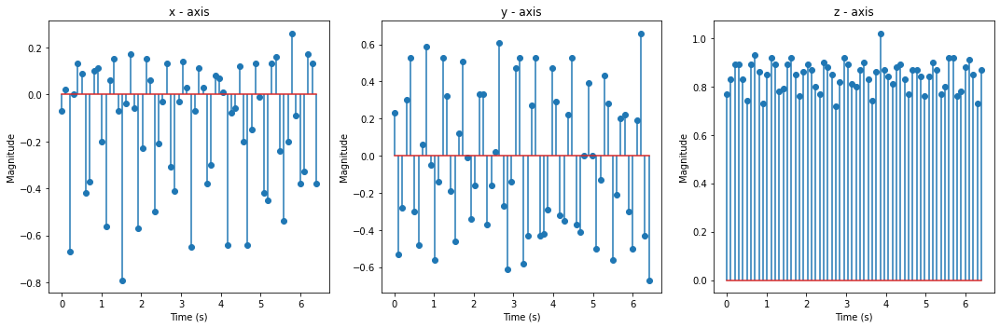

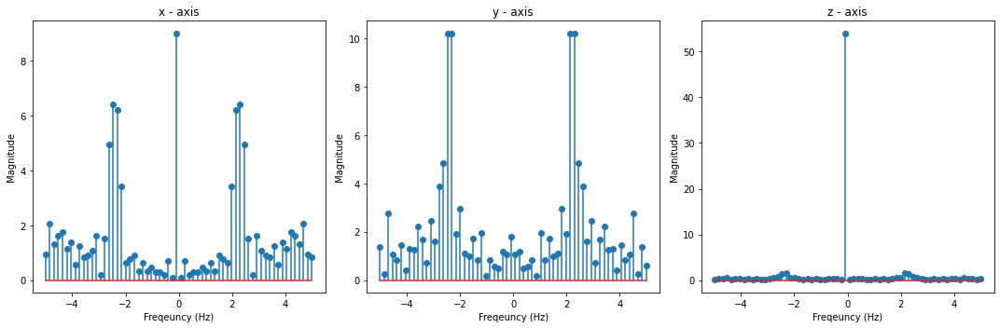

[-0.07, 0.02, -0.67, 0.0, 0.13, 0.09, -0.42, -0.37, 0.1, 0.11, -0.2, -0.56, 0.06, 0.15, -0.07, -0.79, -0.04, 0.17, -0.06, -0.57, -0.23, 0.15, 0.06, -0.5, -0.21, -0.03, 0.13, -0.31, -0.41, -0.03, 0.14, 0.03, -0.65, -0.07, 0.11, 0.03, -0.38, -0.3, 0.08, 0.07, 0.01, -0.64, -0.08, -0.06, 0.12, -0.2, -0.64, -0.15, 0.13, -0.01, -0.42, -0.45, 0.13, 0.16, -0.24, -0.54, -0.2, 0.26, -0.09, -0.38, -0.33, 0.17, 0.13, -0.38]
[-0.68, 0.56, 0.05, -0.58, -0.15, 0.49, 0.33, -0.49, -0.3, 0.33, 0.66, -0.38, -0.39, 0.09, 0.6, -0.45, -0.55, -0.08, 0.55, 0.04, -0.6, -0.11, 0.46, 0.24, -0.38, -0.36, 0.23, 0.55, -0.47, -0.42, 0.07, 0.72, -0.26, -0.45, -0.02, 0.42, 0.24, -0.48, -0.21, 0.19, 0.66, -0.28, -0.28, -0.36, 0.11, 0.61, -0.33, -0.41, -0.14, 0.35, 0.31, -0.34, -0.35, 0.22, 0.38, -0.19, -0.5, 0.05, 0.33, 0.24, -0.35, -0.24, 0.3, 0.45]
[0.77, 0.83, 0.89, 0.89, 0.83, 0.74, 0.89, 0.93, 0.86, 0.73, 0.85, 0.92, 0.89, 0.78, 0.79, 0.89, 0.92, 0.85, 0.76, 0.86, 0.89, 0.87, 0.8, 0.77, 0.9, 0.88, 0.85, 0.72, 0.82

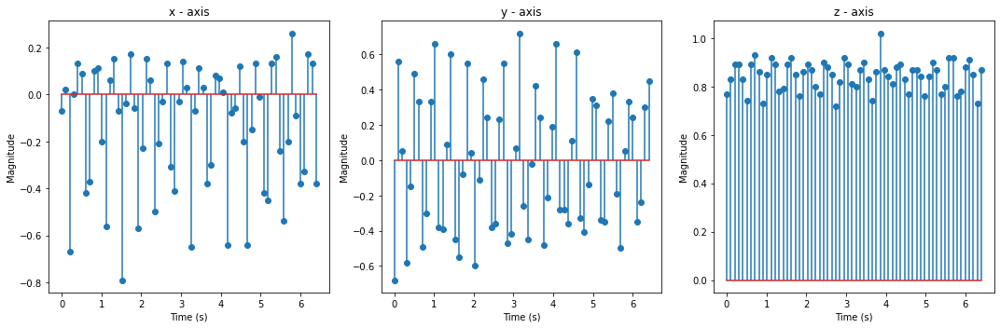

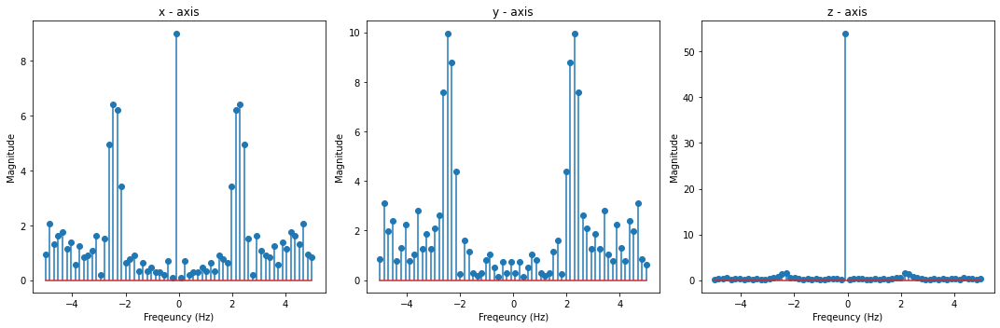

[-0.07, 0.02, -0.67, 0.0, 0.13, 0.09, -0.42, -0.37, 0.1, 0.11, -0.2, -0.56, 0.06, 0.15, -0.07, -0.79, -0.04, 0.17, -0.06, -0.57, -0.23, 0.15, 0.06, -0.5, -0.21, -0.03, 0.13, -0.31, -0.41, -0.03, 0.14, 0.03, -0.65, -0.07, 0.11, 0.03, -0.38, -0.3, 0.08, 0.07, 0.01, -0.64, -0.08, -0.06, 0.12, -0.2, -0.64, -0.15, 0.13, -0.01, -0.42, -0.45, 0.13, 0.16, -0.24, -0.54, -0.2, 0.26, -0.09, -0.38, -0.33, 0.17, 0.13, -0.38]
[-0.68, 0.56, 0.05, -0.58, -0.15, 0.49, 0.33, -0.49, -0.3, 0.33, 0.66, -0.38, -0.39, 0.09, 0.6, -0.45, -0.55, -0.08, 0.55, 0.04, -0.6, -0.11, 0.46, 0.24, -0.38, -0.36, 0.23, 0.55, -0.47, -0.42, 0.07, 0.72, -0.26, -0.45, -0.02, 0.42, 0.24, -0.48, -0.21, 0.19, 0.66, -0.28, -0.28, -0.36, 0.11, 0.61, -0.33, -0.41, -0.14, 0.35, 0.31, -0.34, -0.35, 0.22, 0.38, -0.19, -0.5, 0.05, 0.33, 0.24, -0.35, -0.24, 0.3, 0.45]
[0.86, 0.87, 0.75, 0.87, 0.89, 0.88, 0.79, 0.8, 0.89, 0.89, 0.83, 0.77, 0.88, 0.9, 0.86, 0.72, 0.86, 0.89, 0.86, 0.77, 0.84, 0.9, 0.88, 0.78, 0.82, 0.87, 0.89, 0.81, 0.8, 

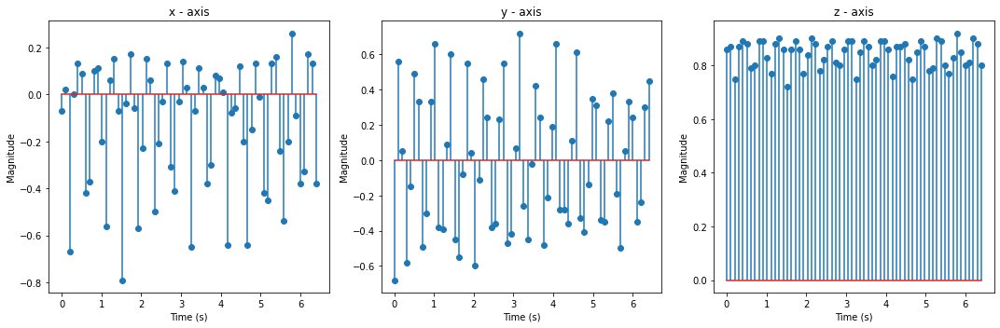

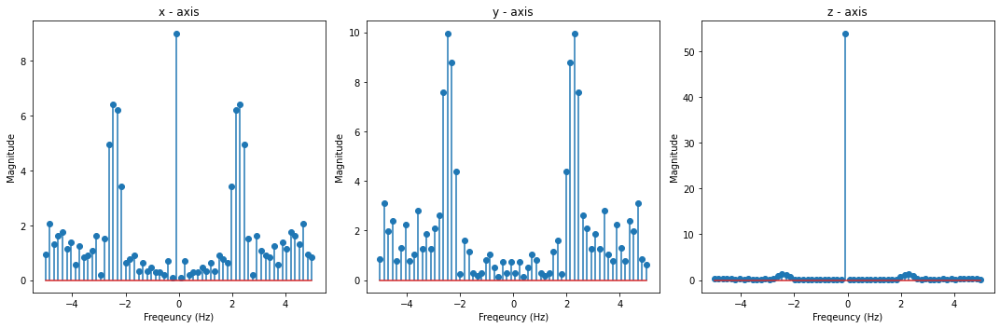

[-0.39, 0.09, 0.13, -0.08, -0.85, -0.04, 0.23, -0.18, -0.48, -0.24, 0.21, -0.04, -0.34, -0.39, 0.05, 0.14, -0.22, -0.59, 0.03, 0.18, -0.15, -0.59, -0.02, 0.2, -0.12, -0.74, -0.11, 0.12, -0.02, -0.37, -0.45, 0.15, 0.14, -0.24, -0.49, -0.16, 0.16, -0.14, -0.59, -0.21, 0.27, 0.01, -0.4, -0.46, 0.07, 0.18, -0.03, -0.66, -0.28, 0.32, 0.13, -0.42, -0.45, -0.02, 0.2, -0.14, -0.76, 0.12, 0.18, -0.08, -0.78, -0.07, 0.31, -0.09]
[-0.68, 0.56, 0.05, -0.58, -0.15, 0.49, 0.33, -0.49, -0.3, 0.33, 0.66, -0.38, -0.39, 0.09, 0.6, -0.45, -0.55, -0.08, 0.55, 0.04, -0.6, -0.11, 0.46, 0.24, -0.38, -0.36, 0.23, 0.55, -0.47, -0.42, 0.07, 0.72, -0.26, -0.45, -0.02, 0.42, 0.24, -0.48, -0.21, 0.19, 0.66, -0.28, -0.28, -0.36, 0.11, 0.61, -0.33, -0.41, -0.14, 0.35, 0.31, -0.34, -0.35, 0.22, 0.38, -0.19, -0.5, 0.05, 0.33, 0.24, -0.35, -0.24, 0.3, 0.45]
[0.86, 0.87, 0.75, 0.87, 0.89, 0.88, 0.79, 0.8, 0.89, 0.89, 0.83, 0.77, 0.88, 0.9, 0.86, 0.72, 0.86, 0.89, 0.86, 0.77, 0.84, 0.9, 0.88, 0.78, 0.82, 0.87, 0.89, 0.81

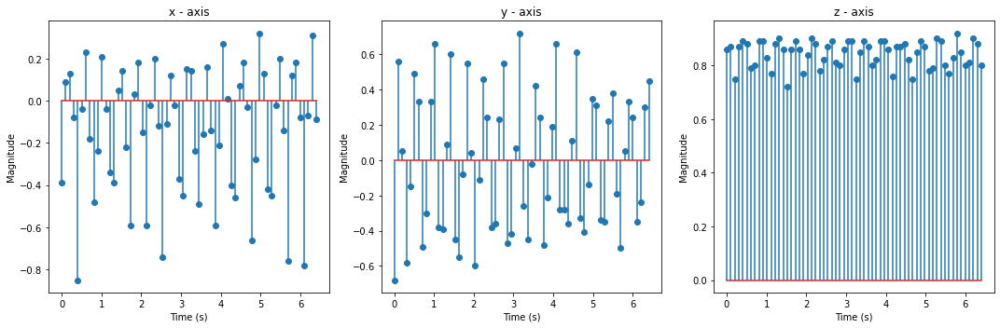

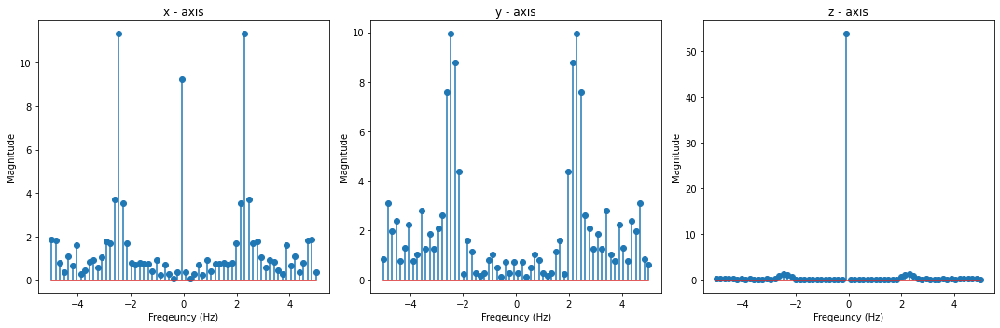

[-0.39, 0.09, 0.13, -0.08, -0.85, -0.04, 0.23, -0.18, -0.48, -0.24, 0.21, -0.04, -0.34, -0.39, 0.05, 0.14, -0.22, -0.59, 0.03, 0.18, -0.15, -0.59, -0.02, 0.2, -0.12, -0.74, -0.11, 0.12, -0.02, -0.37, -0.45, 0.15, 0.14, -0.24, -0.49, -0.16, 0.16, -0.14, -0.59, -0.21, 0.27, 0.01, -0.4, -0.46, 0.07, 0.18, -0.03, -0.66, -0.28, 0.32, 0.13, -0.42, -0.45, -0.02, 0.2, -0.14, -0.76, 0.12, 0.18, -0.08, -0.78, -0.07, 0.31, -0.09]
[0.44, -0.38, 0.18, 0.58, -0.48, -0.53, 0.06, 0.42, 0.04, -0.56, -0.16, 0.45, 0.29, -0.48, -0.33, 0.38, 0.42, -0.28, -0.41, 0.17, 0.53, -0.21, -0.4, 0.05, 0.45, -0.28, -0.44, -0.16, 0.41, 0.29, -0.45, -0.27, 0.25, 0.55, -0.52, -0.49, 0.05, 0.5, -0.15, -0.49, 0.03, 0.37, 0.38, -0.28, -0.4, 0.14, 0.62, -0.09, -0.52, -0.06, 0.43, 0.37, -0.44, -0.47, 0.28, 0.62, -0.56, -0.37, 0.04, 0.63, -0.32, -0.56, 0.11, 0.45]
[0.86, 0.87, 0.75, 0.87, 0.89, 0.88, 0.79, 0.8, 0.89, 0.89, 0.83, 0.77, 0.88, 0.9, 0.86, 0.72, 0.86, 0.89, 0.86, 0.77, 0.84, 0.9, 0.88, 0.78, 0.82, 0.87, 0.89, 0.81

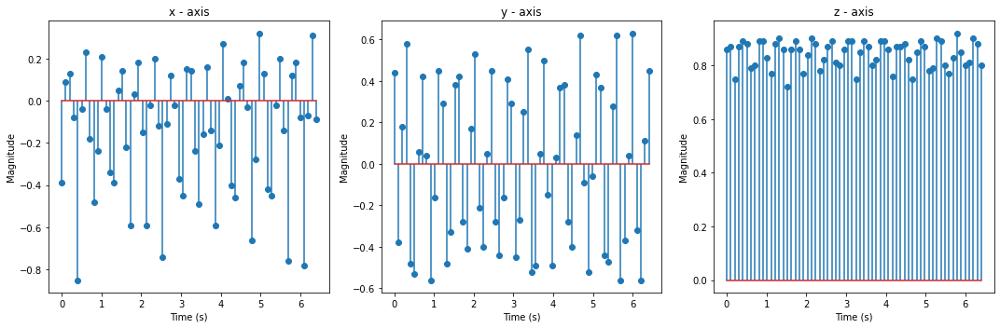

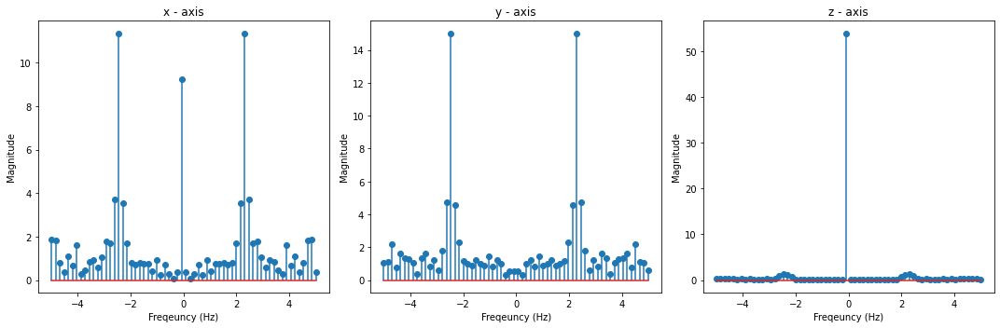

[-0.39, 0.09, 0.13, -0.08, -0.85, -0.04, 0.23, -0.18, -0.48, -0.24, 0.21, -0.04, -0.34, -0.39, 0.05, 0.14, -0.22, -0.59, 0.03, 0.18, -0.15, -0.59, -0.02, 0.2, -0.12, -0.74, -0.11, 0.12, -0.02, -0.37, -0.45, 0.15, 0.14, -0.24, -0.49, -0.16, 0.16, -0.14, -0.59, -0.21, 0.27, 0.01, -0.4, -0.46, 0.07, 0.18, -0.03, -0.66, -0.28, 0.32, 0.13, -0.42, -0.45, -0.02, 0.2, -0.14, -0.76, 0.12, 0.18, -0.08, -0.78, -0.07, 0.31, -0.09]
[0.44, -0.38, 0.18, 0.58, -0.48, -0.53, 0.06, 0.42, 0.04, -0.56, -0.16, 0.45, 0.29, -0.48, -0.33, 0.38, 0.42, -0.28, -0.41, 0.17, 0.53, -0.21, -0.4, 0.05, 0.45, -0.28, -0.44, -0.16, 0.41, 0.29, -0.45, -0.27, 0.25, 0.55, -0.52, -0.49, 0.05, 0.5, -0.15, -0.49, 0.03, 0.37, 0.38, -0.28, -0.4, 0.14, 0.62, -0.09, -0.52, -0.06, 0.43, 0.37, -0.44, -0.47, 0.28, 0.62, -0.56, -0.37, 0.04, 0.63, -0.32, -0.56, 0.11, 0.45]
[0.79, 0.89, 0.9, 0.86, 0.72, 0.87, 0.9, 0.83, 0.78, 0.84, 0.91, 0.88, 0.8, 0.8, 0.87, 0.89, 0.8, 0.76, 0.88, 0.9, 0.83, 0.76, 0.87, 0.91, 0.85, 0.73, 0.84, 0.89, 0

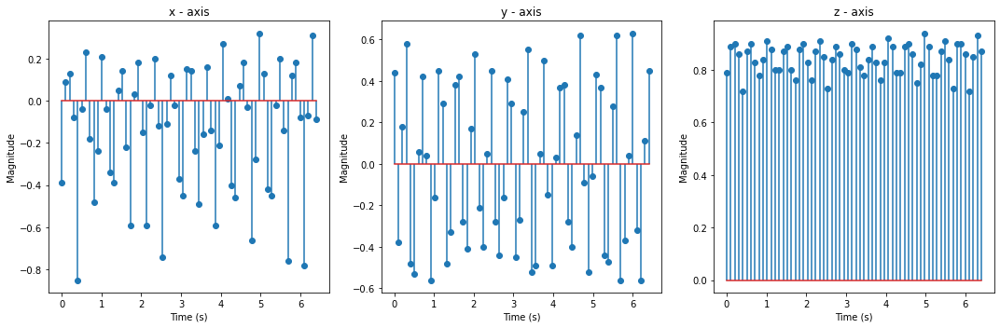

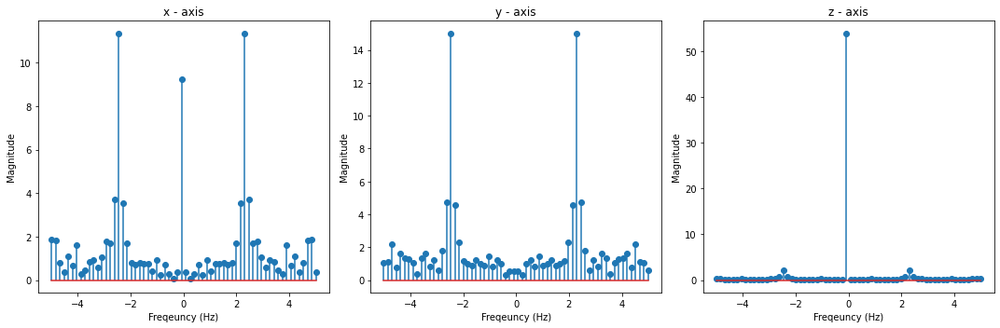

[-0.33, 0.11, 0.04, -0.27, -0.59, 0.02, 0.16, -0.09, -0.56, -0.02, 0.18, -0.02, -0.26, -0.38, 0.19, 0.12, -0.24, -0.58, 0.01, 0.16, -0.02, -0.69, 0.04, 0.06, 0.04, -0.43, -0.27, 0.05, 0.1, -0.14, -0.37, -0.09, 0.17, -0.07, -0.61, -0.1, 0.2, 0.07, -0.55, -0.44, -0.01, 0.2, -0.18, -0.69, -0.05, 0.19, 0.01, -0.49, -0.36, 0.11, 0.27, -0.33, -0.56, 0.03, 0.17, 0.04, -0.69, -0.01, 0.2, 0.17, -0.59, -0.34, 0.19, 0.22]
[0.44, -0.38, 0.18, 0.58, -0.48, -0.53, 0.06, 0.42, 0.04, -0.56, -0.16, 0.45, 0.29, -0.48, -0.33, 0.38, 0.42, -0.28, -0.41, 0.17, 0.53, -0.21, -0.4, 0.05, 0.45, -0.28, -0.44, -0.16, 0.41, 0.29, -0.45, -0.27, 0.25, 0.55, -0.52, -0.49, 0.05, 0.5, -0.15, -0.49, 0.03, 0.37, 0.38, -0.28, -0.4, 0.14, 0.62, -0.09, -0.52, -0.06, 0.43, 0.37, -0.44, -0.47, 0.28, 0.62, -0.56, -0.37, 0.04, 0.63, -0.32, -0.56, 0.11, 0.45]
[0.79, 0.89, 0.9, 0.86, 0.72, 0.87, 0.9, 0.83, 0.78, 0.84, 0.91, 0.88, 0.8, 0.8, 0.87, 0.89, 0.8, 0.76, 0.88, 0.9, 0.83, 0.76, 0.87, 0.91, 0.85, 0.73, 0.84, 0.89, 0.86, 0.8

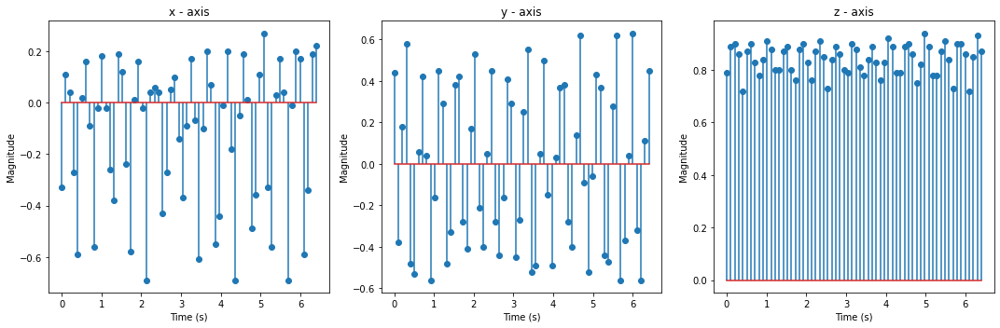

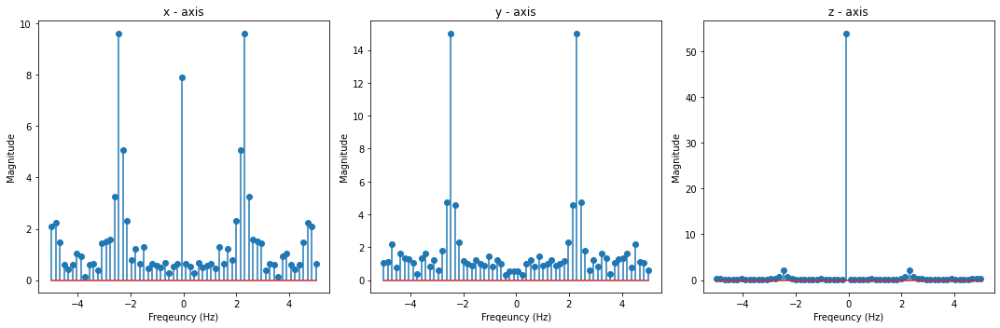

[-0.33, 0.11, 0.04, -0.27, -0.59, 0.02, 0.16, -0.09, -0.56, -0.02, 0.18, -0.02, -0.26, -0.38, 0.19, 0.12, -0.24, -0.58, 0.01, 0.16, -0.02, -0.69, 0.04, 0.06, 0.04, -0.43, -0.27, 0.05, 0.1, -0.14, -0.37, -0.09, 0.17, -0.07, -0.61, -0.1, 0.2, 0.07, -0.55, -0.44, -0.01, 0.2, -0.18, -0.69, -0.05, 0.19, 0.01, -0.49, -0.36, 0.11, 0.27, -0.33, -0.56, 0.03, 0.17, 0.04, -0.69, -0.01, 0.2, 0.17, -0.59, -0.34, 0.19, 0.22]
[-0.68, -0.3, 0.46, 0.41, -0.65, -0.42, 0.24, 0.47, 0.11, -0.61, -0.12, 0.49, 0.4, -0.61, -0.2, 0.31, 0.45, -0.43, -0.49, 0.16, 0.4, -0.1, -0.4, -0.06, 0.33, 0.4, -0.46, -0.29, 0.32, 0.89, -0.5, -0.47, 0.17, 0.6, -0.19, -0.48, -0.14, 0.25, 0.46, -0.36, -0.58, 0.21, 0.59, -0.2, -0.54, -0.06, 0.47, 0.27, -0.46, -0.37, 0.31, 0.42, -0.19, -0.51, 0.02, 0.59, 0.06, -0.47, -0.23, 0.58, 0.29, -0.52, -0.24, 0.23]
[0.79, 0.89, 0.9, 0.86, 0.72, 0.87, 0.9, 0.83, 0.78, 0.84, 0.91, 0.88, 0.8, 0.8, 0.87, 0.89, 0.8, 0.76, 0.88, 0.9, 0.83, 0.76, 0.87, 0.91, 0.85, 0.73, 0.84, 0.89, 0.86, 0.8, 0.7

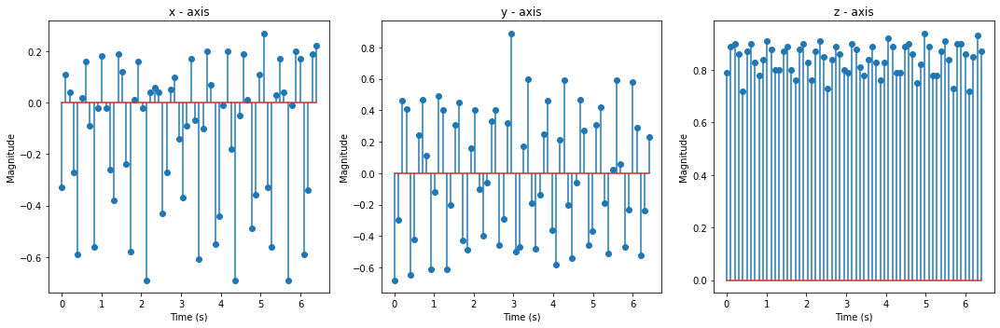

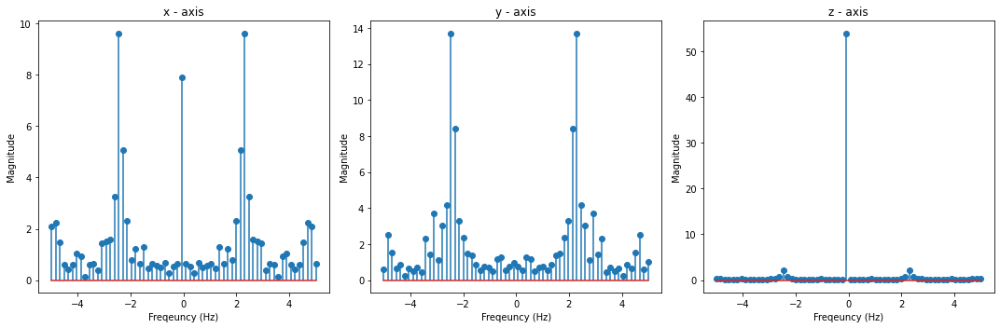

[-0.33, 0.11, 0.04, -0.27, -0.59, 0.02, 0.16, -0.09, -0.56, -0.02, 0.18, -0.02, -0.26, -0.38, 0.19, 0.12, -0.24, -0.58, 0.01, 0.16, -0.02, -0.69, 0.04, 0.06, 0.04, -0.43, -0.27, 0.05, 0.1, -0.14, -0.37, -0.09, 0.17, -0.07, -0.61, -0.1, 0.2, 0.07, -0.55, -0.44, -0.01, 0.2, -0.18, -0.69, -0.05, 0.19, 0.01, -0.49, -0.36, 0.11, 0.27, -0.33, -0.56, 0.03, 0.17, 0.04, -0.69, -0.01, 0.2, 0.17, -0.59, -0.34, 0.19, 0.22]
[-0.68, -0.3, 0.46, 0.41, -0.65, -0.42, 0.24, 0.47, 0.11, -0.61, -0.12, 0.49, 0.4, -0.61, -0.2, 0.31, 0.45, -0.43, -0.49, 0.16, 0.4, -0.1, -0.4, -0.06, 0.33, 0.4, -0.46, -0.29, 0.32, 0.89, -0.5, -0.47, 0.17, 0.6, -0.19, -0.48, -0.14, 0.25, 0.46, -0.36, -0.58, 0.21, 0.59, -0.2, -0.54, -0.06, 0.47, 0.27, -0.46, -0.37, 0.31, 0.42, -0.19, -0.51, 0.02, 0.59, 0.06, -0.47, -0.23, 0.58, 0.29, -0.52, -0.24, 0.23]
[0.82, 0.89, 0.88, 0.82, 0.76, 0.88, 0.9, 0.84, 0.76, 0.88, 0.9, 0.86, 0.81, 0.8, 0.9, 0.89, 0.82, 0.76, 0.87, 0.9, 0.86, 0.74, 0.87, 0.88, 0.89, 0.78, 0.81, 0.87, 0.88, 0.82, 0

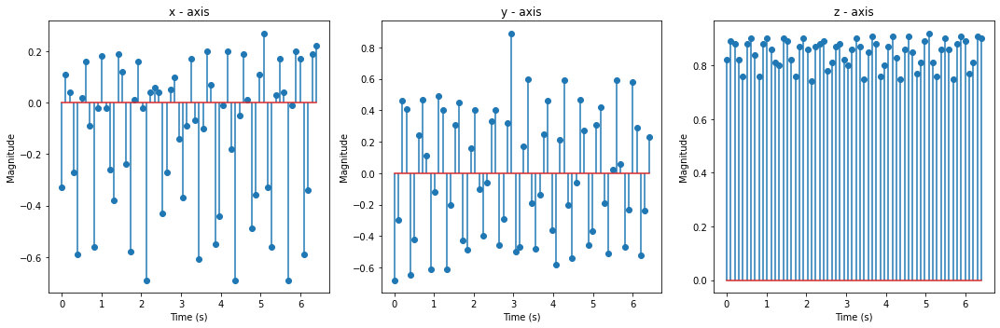

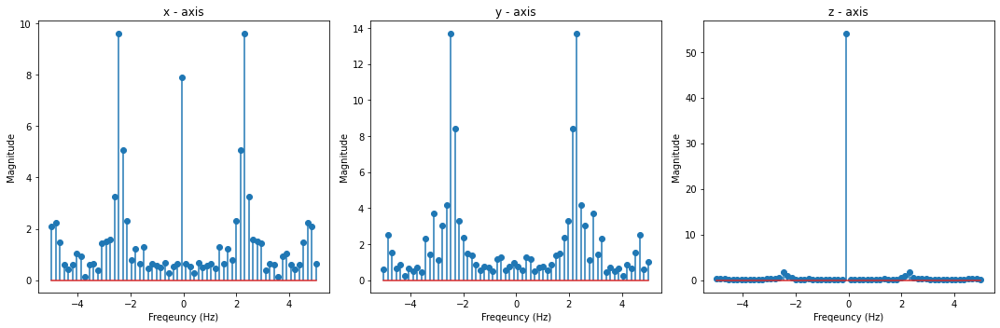

[0.22, -0.86, -0.03, 0.31, -0.05, -0.76, -0.2, 0.32, 0.16, -0.74, 0.03, 0.25, 0.23, -0.69, -0.48, 0.37, 0.21, -0.45, -0.45, 0.25, 0.18, -0.47, -0.43, 0.22, 0.27, -0.61, -0.39, 0.3, 0.36, -0.28, -0.6, 0.44, 0.28, -0.51, -0.39, 0.4, 0.14, -0.79, -0.25, 0.45, 0.1, -0.79, -0.22, 0.46, 0.01, -0.83, -0.08, 0.44, -0.19, -0.99, 0.07, 0.36, -0.06, -1.13, 0.21, 0.46, -0.33, -0.75, 0.22, 0.3, -0.55, -0.42, 0.23, 0.4]
[-0.68, -0.3, 0.46, 0.41, -0.65, -0.42, 0.24, 0.47, 0.11, -0.61, -0.12, 0.49, 0.4, -0.61, -0.2, 0.31, 0.45, -0.43, -0.49, 0.16, 0.4, -0.1, -0.4, -0.06, 0.33, 0.4, -0.46, -0.29, 0.32, 0.89, -0.5, -0.47, 0.17, 0.6, -0.19, -0.48, -0.14, 0.25, 0.46, -0.36, -0.58, 0.21, 0.59, -0.2, -0.54, -0.06, 0.47, 0.27, -0.46, -0.37, 0.31, 0.42, -0.19, -0.51, 0.02, 0.59, 0.06, -0.47, -0.23, 0.58, 0.29, -0.52, -0.24, 0.23]
[0.82, 0.89, 0.88, 0.82, 0.76, 0.88, 0.9, 0.84, 0.76, 0.88, 0.9, 0.86, 0.81, 0.8, 0.9, 0.89, 0.82, 0.76, 0.87, 0.9, 0.86, 0.74, 0.87, 0.88, 0.89, 0.78, 0.81, 0.87, 0.88, 0.82, 0.8, 0

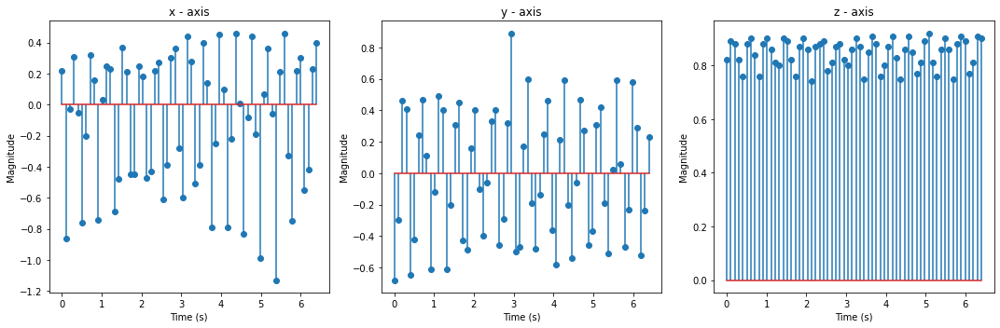

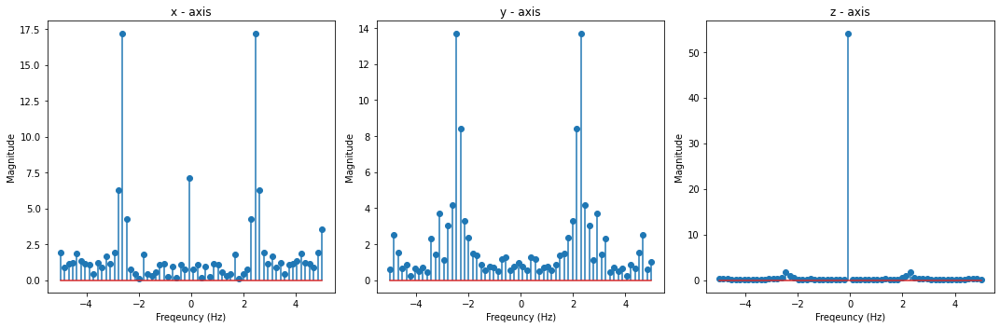

[0.22, -0.86, -0.03, 0.31, -0.05, -0.76, -0.2, 0.32, 0.16, -0.74, 0.03, 0.25, 0.23, -0.69, -0.48, 0.37, 0.21, -0.45, -0.45, 0.25, 0.18, -0.47, -0.43, 0.22, 0.27, -0.61, -0.39, 0.3, 0.36, -0.28, -0.6, 0.44, 0.28, -0.51, -0.39, 0.4, 0.14, -0.79, -0.25, 0.45, 0.1, -0.79, -0.22, 0.46, 0.01, -0.83, -0.08, 0.44, -0.19, -0.99, 0.07, 0.36, -0.06, -1.13, 0.21, 0.46, -0.33, -0.75, 0.22, 0.3, -0.55, -0.42, 0.23, 0.4]
[0.23, -0.49, -0.58, -0.1, 0.78, -0.15, -0.73, -0.05, 0.66, 0.12, -0.5, -0.31, 0.56, 0.19, -0.51, -0.22, 0.45, 0.49, -0.47, -0.29, 0.38, 0.57, -0.56, -0.39, 0.6, 0.39, -0.69, -0.3, 0.46, 0.79, -0.73, -0.39, 0.54, 0.47, -0.77, -0.34, 0.73, 0.15, -0.92, -0.21, 0.97, 0.14, -0.97, -0.1, 1.03, -0.09, -0.99, 0.25, 0.81, -0.35, -0.69, 0.22, 1.03, -1.05, -0.73, 0.56, 0.75, -0.69, -0.76, 0.65, 0.5, -0.84, -0.54, 0.65]
[0.82, 0.89, 0.88, 0.82, 0.76, 0.88, 0.9, 0.84, 0.76, 0.88, 0.9, 0.86, 0.81, 0.8, 0.9, 0.89, 0.82, 0.76, 0.87, 0.9, 0.86, 0.74, 0.87, 0.88, 0.89, 0.78, 0.81, 0.87, 0.88, 0.82, 0

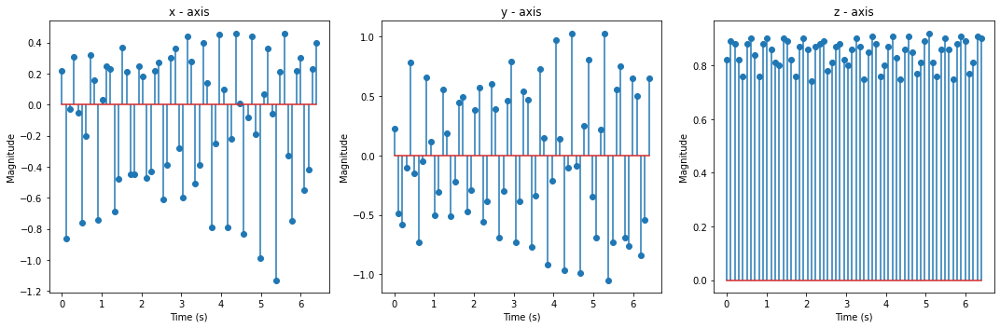

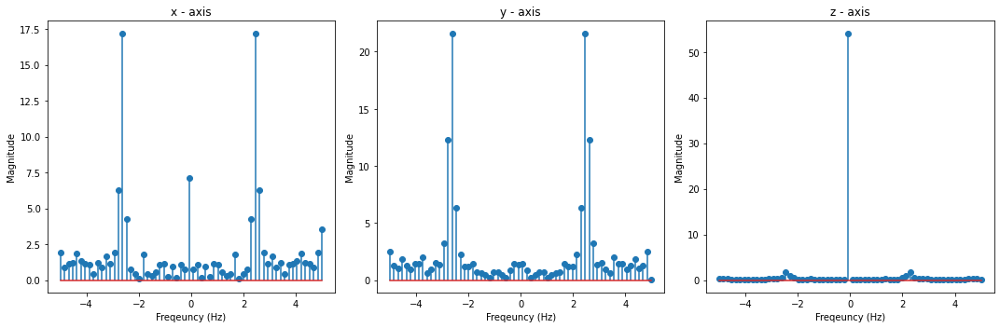

[0.22, -0.86, -0.03, 0.31, -0.05, -0.76, -0.2, 0.32, 0.16, -0.74, 0.03, 0.25, 0.23, -0.69, -0.48, 0.37, 0.21, -0.45, -0.45, 0.25, 0.18, -0.47, -0.43, 0.22, 0.27, -0.61, -0.39, 0.3, 0.36, -0.28, -0.6, 0.44, 0.28, -0.51, -0.39, 0.4, 0.14, -0.79, -0.25, 0.45, 0.1, -0.79, -0.22, 0.46, 0.01, -0.83, -0.08, 0.44, -0.19, -0.99, 0.07, 0.36, -0.06, -1.13, 0.21, 0.46, -0.33, -0.75, 0.22, 0.3, -0.55, -0.42, 0.23, 0.4]
[0.23, -0.49, -0.58, -0.1, 0.78, -0.15, -0.73, -0.05, 0.66, 0.12, -0.5, -0.31, 0.56, 0.19, -0.51, -0.22, 0.45, 0.49, -0.47, -0.29, 0.38, 0.57, -0.56, -0.39, 0.6, 0.39, -0.69, -0.3, 0.46, 0.79, -0.73, -0.39, 0.54, 0.47, -0.77, -0.34, 0.73, 0.15, -0.92, -0.21, 0.97, 0.14, -0.97, -0.1, 1.03, -0.09, -0.99, 0.25, 0.81, -0.35, -0.69, 0.22, 1.03, -1.05, -0.73, 0.56, 0.75, -0.69, -0.76, 0.65, 0.5, -0.84, -0.54, 0.65]
[0.9, 0.71, 0.87, 0.92, 0.88, 0.73, 0.83, 0.93, 0.88, 0.73, 0.87, 0.92, 0.91, 0.75, 0.78, 0.93, 0.9, 0.79, 0.78, 0.92, 0.9, 0.77, 0.79, 0.91, 0.92, 0.75, 0.8, 0.92, 0.93, 0.83, 

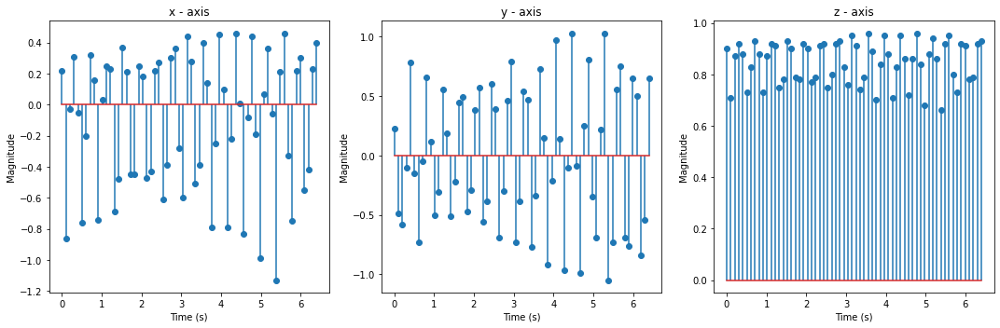

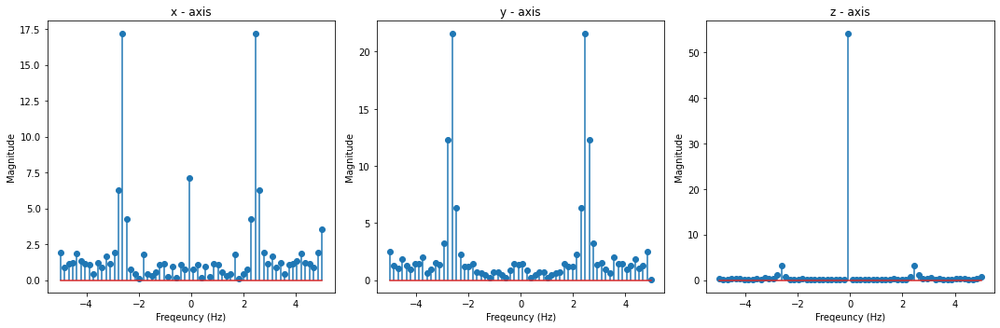

[-0.66, -0.48, 0.56, 0.28, -0.88, -0.23, 0.57, 0.23, -0.7, -0.32, 0.52, 0.04, -1.0, -0.1, 0.45, -0.21, -0.91, 0.24, 0.35, -0.16, -0.72, 0.23, 0.28, -0.31, -0.44, 0.35, 0.25, -0.82, -0.36, 0.38, 0.17, -0.72, -0.44, 0.63, 0.14, -0.85, -0.24, 0.35, 0.14, -0.93, -0.14, 0.61, -0.0, -0.7, -0.04, 0.41, 0.04, -1.08, -0.3, 0.68, 0.01, -1.17, 0.08, 0.48, -0.08, -1.09, 0.4, 0.42, -0.35, -0.78, 0.4, 0.34, -0.61, -0.32]
[0.23, -0.49, -0.58, -0.1, 0.78, -0.15, -0.73, -0.05, 0.66, 0.12, -0.5, -0.31, 0.56, 0.19, -0.51, -0.22, 0.45, 0.49, -0.47, -0.29, 0.38, 0.57, -0.56, -0.39, 0.6, 0.39, -0.69, -0.3, 0.46, 0.79, -0.73, -0.39, 0.54, 0.47, -0.77, -0.34, 0.73, 0.15, -0.92, -0.21, 0.97, 0.14, -0.97, -0.1, 1.03, -0.09, -0.99, 0.25, 0.81, -0.35, -0.69, 0.22, 1.03, -1.05, -0.73, 0.56, 0.75, -0.69, -0.76, 0.65, 0.5, -0.84, -0.54, 0.65]
[0.9, 0.71, 0.87, 0.92, 0.88, 0.73, 0.83, 0.93, 0.88, 0.73, 0.87, 0.92, 0.91, 0.75, 0.78, 0.93, 0.9, 0.79, 0.78, 0.92, 0.9, 0.77, 0.79, 0.91, 0.92, 0.75, 0.8, 0.92, 0.93, 0.83,

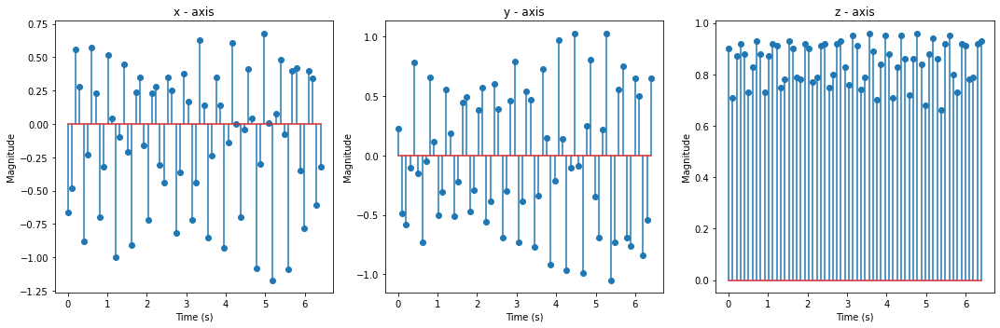

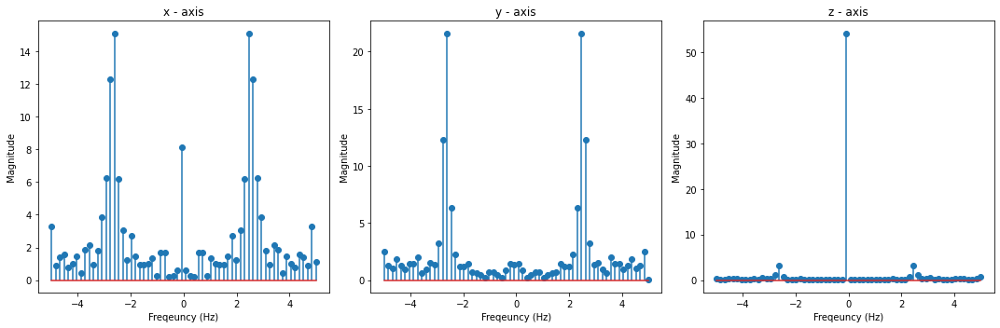

[-0.66, -0.48, 0.56, 0.28, -0.88, -0.23, 0.57, 0.23, -0.7, -0.32, 0.52, 0.04, -1.0, -0.1, 0.45, -0.21, -0.91, 0.24, 0.35, -0.16, -0.72, 0.23, 0.28, -0.31, -0.44, 0.35, 0.25, -0.82, -0.36, 0.38, 0.17, -0.72, -0.44, 0.63, 0.14, -0.85, -0.24, 0.35, 0.14, -0.93, -0.14, 0.61, -0.0, -0.7, -0.04, 0.41, 0.04, -1.08, -0.3, 0.68, 0.01, -1.17, 0.08, 0.48, -0.08, -1.09, 0.4, 0.42, -0.35, -0.78, 0.4, 0.34, -0.61, -0.32]
[0.35, -0.71, -0.22, 0.73, 0.3, -0.92, -0.13, 0.74, 0.22, -0.96, -0.1, 0.92, -0.12, -0.84, 0.17, 0.8, -0.59, -0.47, 0.34, 0.99, -0.64, -0.51, 0.45, 0.77, -0.72, -0.49, 0.56, 0.19, -0.72, -0.39, 0.67, 0.21, -0.82, -0.14, 0.68, 0.14, -0.84, -0.39, 0.88, -0.0, -0.79, -0.09, 0.81, 0.22, -0.94, -0.18, 0.94, -0.25, -1.16, 0.13, 0.92, -0.59, -0.88, 0.41, 0.93, -0.77, -0.61, 0.64, 0.82, -0.7, -0.53, 0.68, 0.57, -0.84]
[0.9, 0.71, 0.87, 0.92, 0.88, 0.73, 0.83, 0.93, 0.88, 0.73, 0.87, 0.92, 0.91, 0.75, 0.78, 0.93, 0.9, 0.79, 0.78, 0.92, 0.9, 0.77, 0.79, 0.91, 0.92, 0.75, 0.8, 0.92, 0.93, 0.83

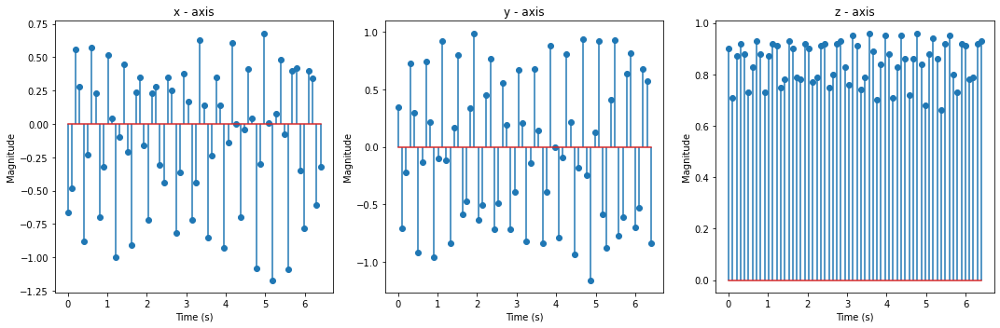

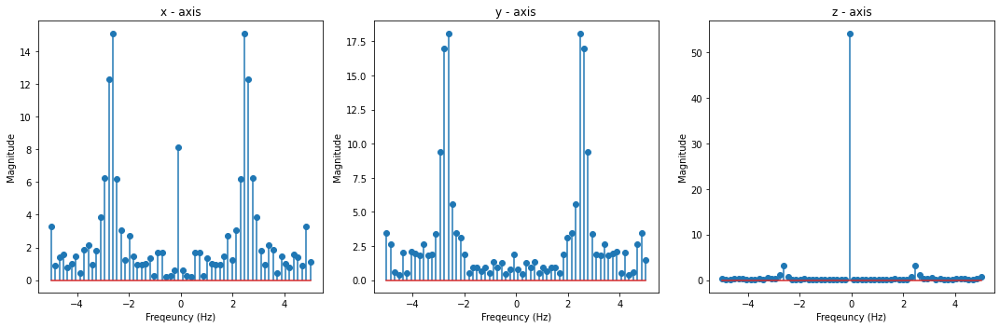

[-0.66, -0.48, 0.56, 0.28, -0.88, -0.23, 0.57, 0.23, -0.7, -0.32, 0.52, 0.04, -1.0, -0.1, 0.45, -0.21, -0.91, 0.24, 0.35, -0.16, -0.72, 0.23, 0.28, -0.31, -0.44, 0.35, 0.25, -0.82, -0.36, 0.38, 0.17, -0.72, -0.44, 0.63, 0.14, -0.85, -0.24, 0.35, 0.14, -0.93, -0.14, 0.61, -0.0, -0.7, -0.04, 0.41, 0.04, -1.08, -0.3, 0.68, 0.01, -1.17, 0.08, 0.48, -0.08, -1.09, 0.4, 0.42, -0.35, -0.78, 0.4, 0.34, -0.61, -0.32]
[0.35, -0.71, -0.22, 0.73, 0.3, -0.92, -0.13, 0.74, 0.22, -0.96, -0.1, 0.92, -0.12, -0.84, 0.17, 0.8, -0.59, -0.47, 0.34, 0.99, -0.64, -0.51, 0.45, 0.77, -0.72, -0.49, 0.56, 0.19, -0.72, -0.39, 0.67, 0.21, -0.82, -0.14, 0.68, 0.14, -0.84, -0.39, 0.88, -0.0, -0.79, -0.09, 0.81, 0.22, -0.94, -0.18, 0.94, -0.25, -1.16, 0.13, 0.92, -0.59, -0.88, 0.41, 0.93, -0.77, -0.61, 0.64, 0.82, -0.7, -0.53, 0.68, 0.57, -0.84]
[0.74, 0.78, 0.97, 0.91, 0.71, 0.83, 0.98, 0.91, 0.75, 0.81, 0.96, 0.87, 0.68, 0.85, 0.94, 0.83, 0.7, 0.91, 0.93, 0.84, 0.74, 0.91, 0.92, 0.78, 0.8, 0.94, 0.91, 0.77, 0.8, 0.9

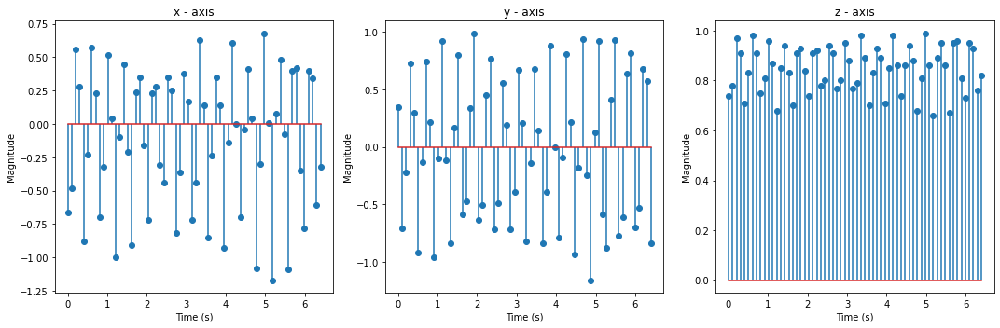

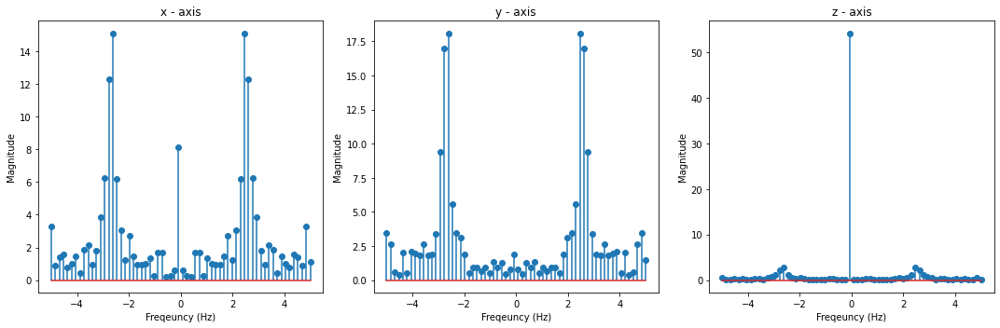

[-0.3, 0.26, -0.96, -0.38, 0.59, -0.17, -0.74, 0.03, 0.72, -0.28, -1.04, 0.39, 0.52, -0.48, -0.63, 0.83, 0.24, -1.22, -0.31, 0.64, -0.46, -0.9, 0.74, 0.17, -1.35, -0.13, 0.48, 0.05, -1.0, 0.17, 0.35, -0.57, -0.29, 0.6, 0.15, -1.28, -0.12, 0.66, -0.59, -0.62, 0.93, 0.06, -1.31, 0.28, 0.55, -1.28, 0.23, 0.74, -1.09, -0.87, 0.95, 0.01, -0.79, 1.1, -0.46, -0.89, 1.15, 0.43, -1.58, 1.34, 0.09, -1.46, 1.07, 0.61]
[0.35, -0.71, -0.22, 0.73, 0.3, -0.92, -0.13, 0.74, 0.22, -0.96, -0.1, 0.92, -0.12, -0.84, 0.17, 0.8, -0.59, -0.47, 0.34, 0.99, -0.64, -0.51, 0.45, 0.77, -0.72, -0.49, 0.56, 0.19, -0.72, -0.39, 0.67, 0.21, -0.82, -0.14, 0.68, 0.14, -0.84, -0.39, 0.88, -0.0, -0.79, -0.09, 0.81, 0.22, -0.94, -0.18, 0.94, -0.25, -1.16, 0.13, 0.92, -0.59, -0.88, 0.41, 0.93, -0.77, -0.61, 0.64, 0.82, -0.7, -0.53, 0.68, 0.57, -0.84]
[0.74, 0.78, 0.97, 0.91, 0.71, 0.83, 0.98, 0.91, 0.75, 0.81, 0.96, 0.87, 0.68, 0.85, 0.94, 0.83, 0.7, 0.91, 0.93, 0.84, 0.74, 0.91, 0.92, 0.78, 0.8, 0.94, 0.91, 0.77, 0.8, 0.9

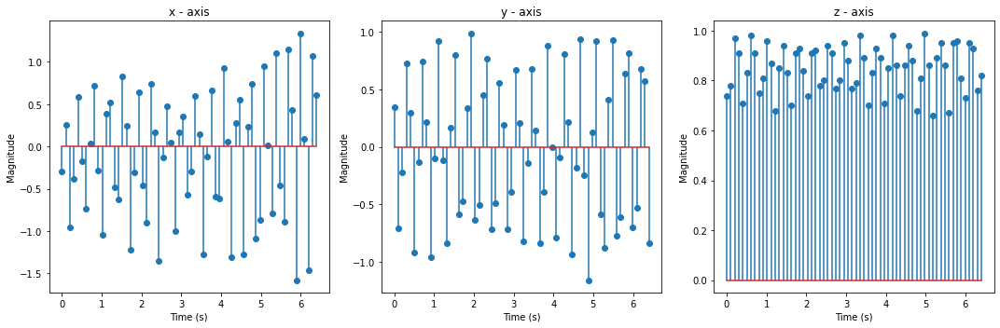

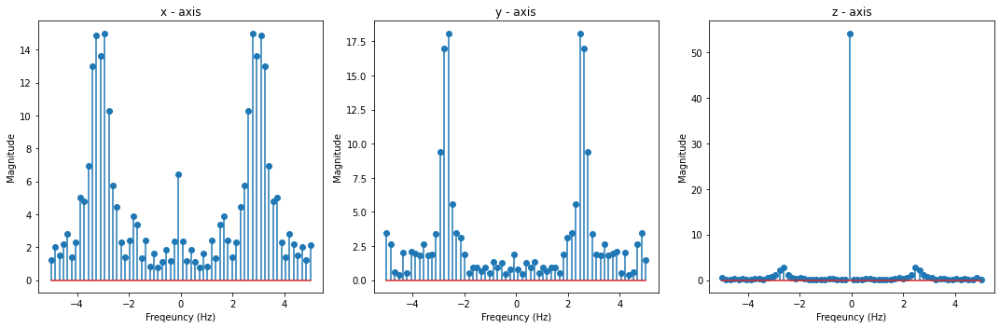

[-0.3, 0.26, -0.96, -0.38, 0.59, -0.17, -0.74, 0.03, 0.72, -0.28, -1.04, 0.39, 0.52, -0.48, -0.63, 0.83, 0.24, -1.22, -0.31, 0.64, -0.46, -0.9, 0.74, 0.17, -1.35, -0.13, 0.48, 0.05, -1.0, 0.17, 0.35, -0.57, -0.29, 0.6, 0.15, -1.28, -0.12, 0.66, -0.59, -0.62, 0.93, 0.06, -1.31, 0.28, 0.55, -1.28, 0.23, 0.74, -1.09, -0.87, 0.95, 0.01, -0.79, 1.1, -0.46, -0.89, 1.15, 0.43, -1.58, 1.34, 0.09, -1.46, 1.07, 0.61]
[-0.84, 0.97, -0.08, -1.02, -0.13, 0.94, 0.01, -0.74, 0.44, 0.95, -1.16, -0.83, 0.72, 0.97, -1.12, -0.26, 1.07, -0.21, -1.49, 0.47, 0.94, -1.09, -0.37, 0.87, -0.38, -1.23, 0.16, 1.2, -0.64, -0.98, 0.85, 0.62, -0.88, -0.21, 1.13, -0.69, -1.35, 0.66, 0.57, -1.25, -0.07, 1.33, -0.7, -1.11, 1.32, -0.01, -1.09, 0.69, 0.41, -1.77, 0.11, 1.61, -1.51, 0.32, 1.09, -1.41, -0.18, 1.78, -1.25, -0.4, 1.42, -1.23, -0.51, 1.65]
[0.74, 0.78, 0.97, 0.91, 0.71, 0.83, 0.98, 0.91, 0.75, 0.81, 0.96, 0.87, 0.68, 0.85, 0.94, 0.83, 0.7, 0.91, 0.93, 0.84, 0.74, 0.91, 0.92, 0.78, 0.8, 0.94, 0.91, 0.77, 0.8, 

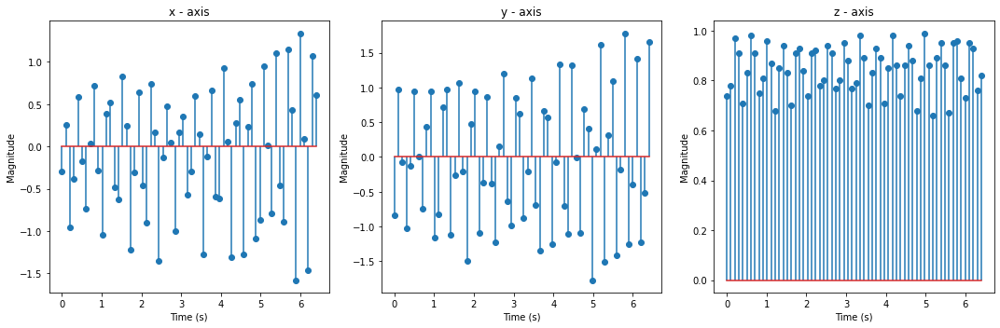

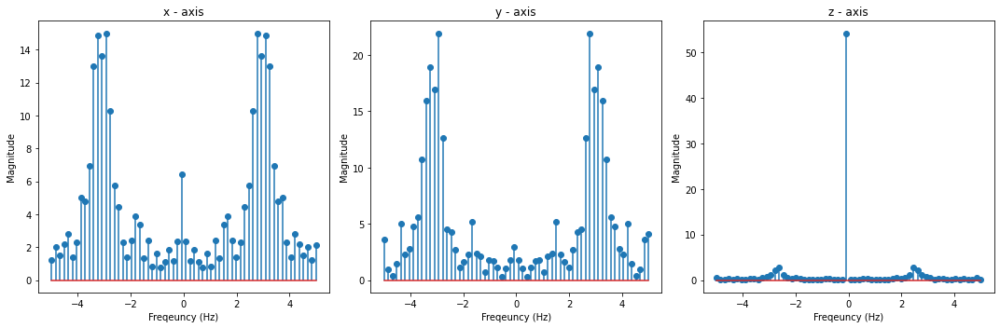

[-0.3, 0.26, -0.96, -0.38, 0.59, -0.17, -0.74, 0.03, 0.72, -0.28, -1.04, 0.39, 0.52, -0.48, -0.63, 0.83, 0.24, -1.22, -0.31, 0.64, -0.46, -0.9, 0.74, 0.17, -1.35, -0.13, 0.48, 0.05, -1.0, 0.17, 0.35, -0.57, -0.29, 0.6, 0.15, -1.28, -0.12, 0.66, -0.59, -0.62, 0.93, 0.06, -1.31, 0.28, 0.55, -1.28, 0.23, 0.74, -1.09, -0.87, 0.95, 0.01, -0.79, 1.1, -0.46, -0.89, 1.15, 0.43, -1.58, 1.34, 0.09, -1.46, 1.07, 0.61]
[-0.84, 0.97, -0.08, -1.02, -0.13, 0.94, 0.01, -0.74, 0.44, 0.95, -1.16, -0.83, 0.72, 0.97, -1.12, -0.26, 1.07, -0.21, -1.49, 0.47, 0.94, -1.09, -0.37, 0.87, -0.38, -1.23, 0.16, 1.2, -0.64, -0.98, 0.85, 0.62, -0.88, -0.21, 1.13, -0.69, -1.35, 0.66, 0.57, -1.25, -0.07, 1.33, -0.7, -1.11, 1.32, -0.01, -1.09, 0.69, 0.41, -1.77, 0.11, 1.61, -1.51, 0.32, 1.09, -1.41, -0.18, 1.78, -1.25, -0.4, 1.42, -1.23, -0.51, 1.65]
[0.82, 0.9, 0.69, 0.81, 0.97, 0.83, 0.73, 0.88, 1.0, 0.81, 0.69, 0.94, 0.95, 0.77, 0.76, 1.03, 0.9, 0.65, 0.81, 0.98, 0.77, 0.71, 1.0, 0.9, 0.63, 0.85, 0.96, 0.87, 0.69, 0.

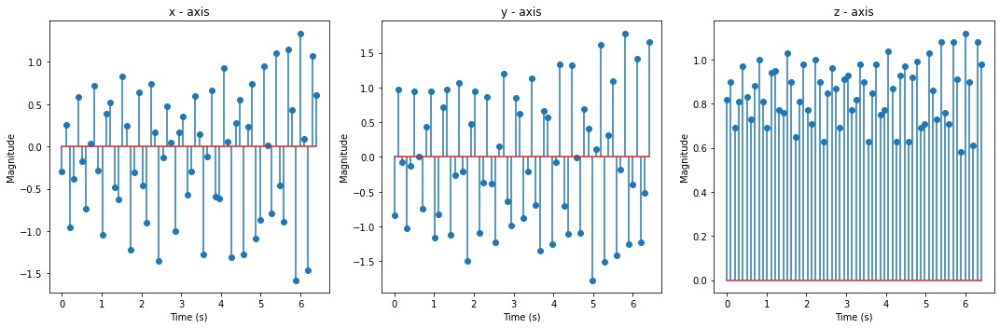

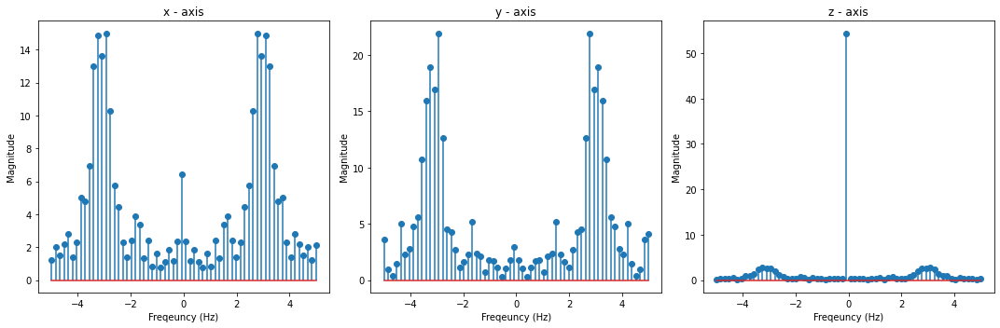

[-1.98, 1.07, 0.15, -1.41, 0.23, 0.23, -2.0, 0.59, 0.73, -2.0, 0.79, 0.43, -1.91, 0.45, 0.71, -1.49, 0.69, 0.35, -0.86, -0.21, 0.65, -1.39, -0.07, 0.85, -1.72, -0.67, 0.96, -1.19, -0.32, 0.99, -1.27, -0.2, 1.06, -1.08, -0.24, 1.0, -0.78, 0.05, 0.89, -0.51, -0.73, 1.45, 0.06, -1.4, 1.19, 0.13, -1.45, 1.46, 0.44, -1.86, 0.94, 0.48, -1.62, -0.07, 0.72, -1.36, -0.23, 0.88, -0.61, -0.91, 1.09, 0.05, -1.22, 0.77]
[-0.84, 0.97, -0.08, -1.02, -0.13, 0.94, 0.01, -0.74, 0.44, 0.95, -1.16, -0.83, 0.72, 0.97, -1.12, -0.26, 1.07, -0.21, -1.49, 0.47, 0.94, -1.09, -0.37, 0.87, -0.38, -1.23, 0.16, 1.2, -0.64, -0.98, 0.85, 0.62, -0.88, -0.21, 1.13, -0.69, -1.35, 0.66, 0.57, -1.25, -0.07, 1.33, -0.7, -1.11, 1.32, -0.01, -1.09, 0.69, 0.41, -1.77, 0.11, 1.61, -1.51, 0.32, 1.09, -1.41, -0.18, 1.78, -1.25, -0.4, 1.42, -1.23, -0.51, 1.65]
[0.82, 0.9, 0.69, 0.81, 0.97, 0.83, 0.73, 0.88, 1.0, 0.81, 0.69, 0.94, 0.95, 0.77, 0.76, 1.03, 0.9, 0.65, 0.81, 0.98, 0.77, 0.71, 1.0, 0.9, 0.63, 0.85, 0.96, 0.87, 0.69, 0.

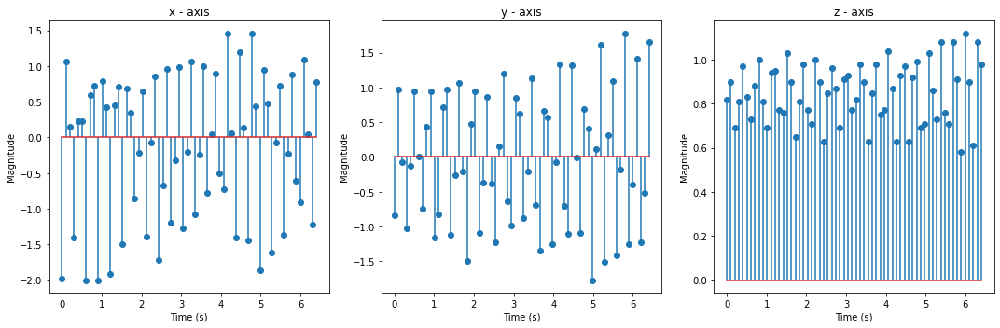

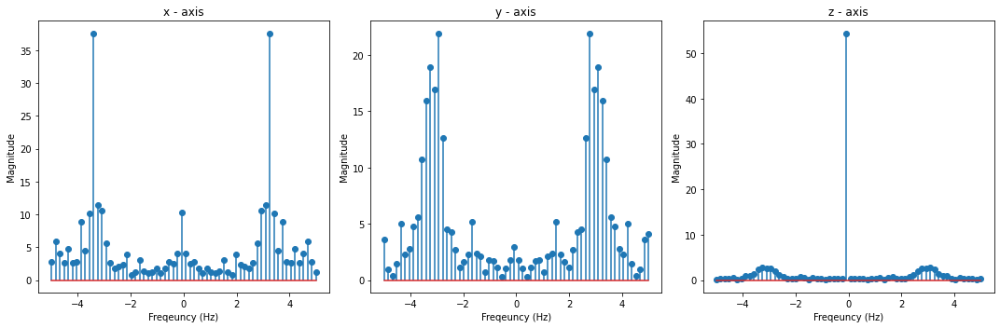

[-1.98, 1.07, 0.15, -1.41, 0.23, 0.23, -2.0, 0.59, 0.73, -2.0, 0.79, 0.43, -1.91, 0.45, 0.71, -1.49, 0.69, 0.35, -0.86, -0.21, 0.65, -1.39, -0.07, 0.85, -1.72, -0.67, 0.96, -1.19, -0.32, 0.99, -1.27, -0.2, 1.06, -1.08, -0.24, 1.0, -0.78, 0.05, 0.89, -0.51, -0.73, 1.45, 0.06, -1.4, 1.19, 0.13, -1.45, 1.46, 0.44, -1.86, 0.94, 0.48, -1.62, -0.07, 0.72, -1.36, -0.23, 0.88, -0.61, -0.91, 1.09, 0.05, -1.22, 0.77]
[-1.2, -0.69, 1.08, -0.94, -1.44, 1.46, -1.61, -0.97, 1.69, -0.94, -1.09, 1.33, -1.06, -1.25, 1.89, -0.35, -1.03, 1.49, 0.16, -1.71, 1.08, 0.17, -1.95, 1.03, -0.24, -2.0, 1.01, 0.53, -2.0, 0.78, 0.47, -2.0, 0.91, 1.03, -2.0, 0.57, 1.41, -1.77, 0.25, 1.57, -2.0, 0.17, 1.52, -1.7, -0.32, 1.97, -1.68, -0.09, 1.6, -1.16, -0.94, 1.21, -0.42, -1.42, 0.72, 0.39, -1.5, 0.56, 0.9, -1.42, -0.0, 1.24, -0.77, -0.58]
[0.82, 0.9, 0.69, 0.81, 0.97, 0.83, 0.73, 0.88, 1.0, 0.81, 0.69, 0.94, 0.95, 0.77, 0.76, 1.03, 0.9, 0.65, 0.81, 0.98, 0.77, 0.71, 1.0, 0.9, 0.63, 0.85, 0.96, 0.87, 0.69, 0.91, 0.93,

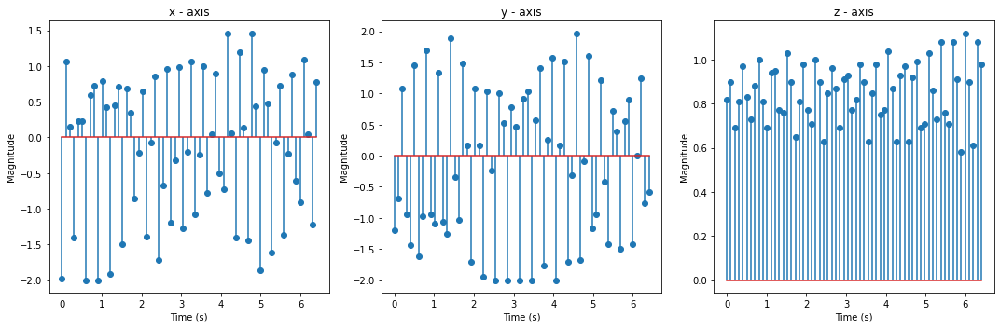

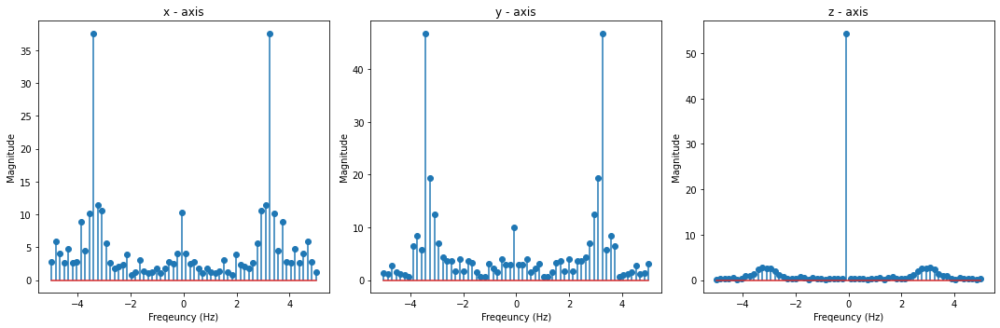

[-1.98, 1.07, 0.15, -1.41, 0.23, 0.23, -2.0, 0.59, 0.73, -2.0, 0.79, 0.43, -1.91, 0.45, 0.71, -1.49, 0.69, 0.35, -0.86, -0.21, 0.65, -1.39, -0.07, 0.85, -1.72, -0.67, 0.96, -1.19, -0.32, 0.99, -1.27, -0.2, 1.06, -1.08, -0.24, 1.0, -0.78, 0.05, 0.89, -0.51, -0.73, 1.45, 0.06, -1.4, 1.19, 0.13, -1.45, 1.46, 0.44, -1.86, 0.94, 0.48, -1.62, -0.07, 0.72, -1.36, -0.23, 0.88, -0.61, -0.91, 1.09, 0.05, -1.22, 0.77]
[-1.2, -0.69, 1.08, -0.94, -1.44, 1.46, -1.61, -0.97, 1.69, -0.94, -1.09, 1.33, -1.06, -1.25, 1.89, -0.35, -1.03, 1.49, 0.16, -1.71, 1.08, 0.17, -1.95, 1.03, -0.24, -2.0, 1.01, 0.53, -2.0, 0.78, 0.47, -2.0, 0.91, 1.03, -2.0, 0.57, 1.41, -1.77, 0.25, 1.57, -2.0, 0.17, 1.52, -1.7, -0.32, 1.97, -1.68, -0.09, 1.6, -1.16, -0.94, 1.21, -0.42, -1.42, 0.72, 0.39, -1.5, 0.56, 0.9, -1.42, -0.0, 1.24, -0.77, -0.58]
[0.51, 1.07, 0.89, 0.61, 0.91, 0.9, 0.43, 0.99, 0.98, 0.5, 1.02, 0.95, 0.51, 0.97, 1.01, 0.57, 1.02, 0.93, 0.7, 0.85, 1.02, 0.61, 0.87, 1.02, 0.55, 0.75, 1.07, 0.62, 0.81, 1.05, 0.6

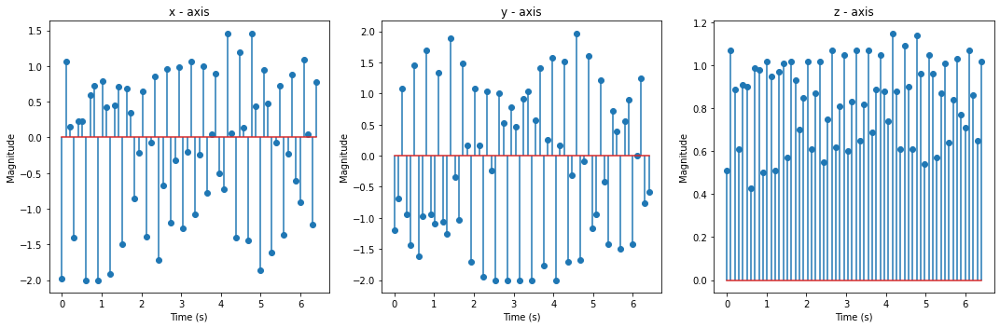

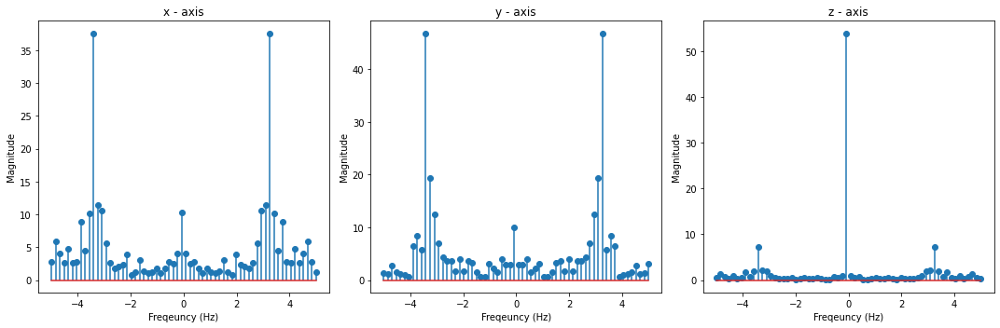

[0.43, -1.36, 0.02, 0.81, -0.06, -0.98, 0.44, 0.45, -0.88, -0.32, 0.75, 0.01, -0.95, 0.55, 0.42, -1.37, -0.25, 0.85, -0.02, -1.28, 0.44, 0.65, -0.9, -0.55, 0.88, 0.13, -1.37, 0.27, 0.57, -0.17, -0.67, 0.96, 0.25, -1.43, -0.08, 0.71, 0.08, -1.23, 0.2, 0.62, -0.48, -0.78, 0.65, 0.26, -0.64, -0.29, 0.74, 0.06, -0.97, -0.24, 0.6, 0.06, -1.3, 0.51, 0.37, -0.74, -0.56, 0.85, 0.28, -1.25, 0.36, 0.54, -0.34, -0.51]
[-1.2, -0.69, 1.08, -0.94, -1.44, 1.46, -1.61, -0.97, 1.69, -0.94, -1.09, 1.33, -1.06, -1.25, 1.89, -0.35, -1.03, 1.49, 0.16, -1.71, 1.08, 0.17, -1.95, 1.03, -0.24, -2.0, 1.01, 0.53, -2.0, 0.78, 0.47, -2.0, 0.91, 1.03, -2.0, 0.57, 1.41, -1.77, 0.25, 1.57, -2.0, 0.17, 1.52, -1.7, -0.32, 1.97, -1.68, -0.09, 1.6, -1.16, -0.94, 1.21, -0.42, -1.42, 0.72, 0.39, -1.5, 0.56, 0.9, -1.42, -0.0, 1.24, -0.77, -0.58]
[0.51, 1.07, 0.89, 0.61, 0.91, 0.9, 0.43, 0.99, 0.98, 0.5, 1.02, 0.95, 0.51, 0.97, 1.01, 0.57, 1.02, 0.93, 0.7, 0.85, 1.02, 0.61, 0.87, 1.02, 0.55, 0.75, 1.07, 0.62, 0.81, 1.05, 0.6

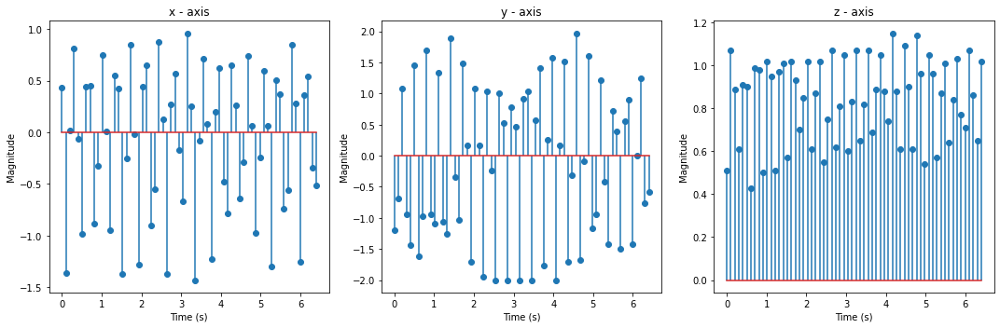

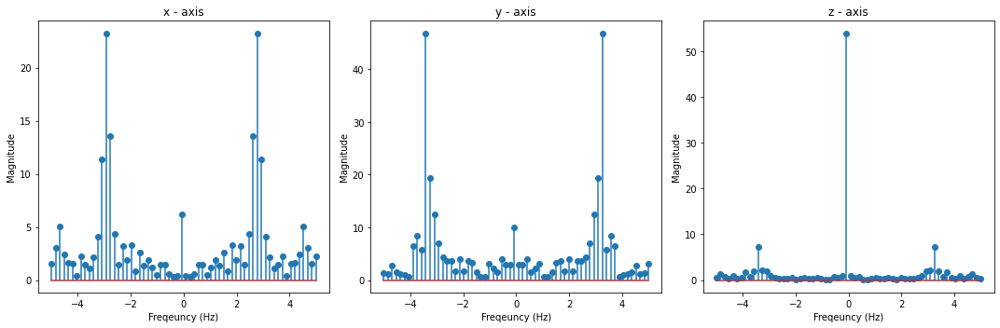

[0.43, -1.36, 0.02, 0.81, -0.06, -0.98, 0.44, 0.45, -0.88, -0.32, 0.75, 0.01, -0.95, 0.55, 0.42, -1.37, -0.25, 0.85, -0.02, -1.28, 0.44, 0.65, -0.9, -0.55, 0.88, 0.13, -1.37, 0.27, 0.57, -0.17, -0.67, 0.96, 0.25, -1.43, -0.08, 0.71, 0.08, -1.23, 0.2, 0.62, -0.48, -0.78, 0.65, 0.26, -0.64, -0.29, 0.74, 0.06, -0.97, -0.24, 0.6, 0.06, -1.3, 0.51, 0.37, -0.74, -0.56, 0.85, 0.28, -1.25, 0.36, 0.54, -0.34, -0.51]
[0.92, 0.03, -1.26, 0.23, 1.04, -0.67, -0.57, 0.8, -0.08, -0.91, 0.21, 1.47, -1.07, -0.67, 0.87, -0.31, -1.29, 0.28, 1.25, -1.24, -0.82, 0.96, 0.19, -1.24, -0.02, 1.35, -0.66, -1.15, 0.48, 1.22, -0.89, -0.27, 1.01, -0.47, -1.22, 0.19, 1.35, -1.03, -1.12, 0.51, 0.99, -1.02, -0.55, 0.8, 0.51, -1.12, 0.06, 0.99, -0.11, -1.23, 0.13, 1.3, -1.18, -0.74, 0.72, 0.36, -1.39, -0.2, 1.3, -0.44, -0.95, 0.45, 1.0, -1.05]
[0.51, 1.07, 0.89, 0.61, 0.91, 0.9, 0.43, 0.99, 0.98, 0.5, 1.02, 0.95, 0.51, 0.97, 1.01, 0.57, 1.02, 0.93, 0.7, 0.85, 1.02, 0.61, 0.87, 1.02, 0.55, 0.75, 1.07, 0.62, 0.81, 1.05,

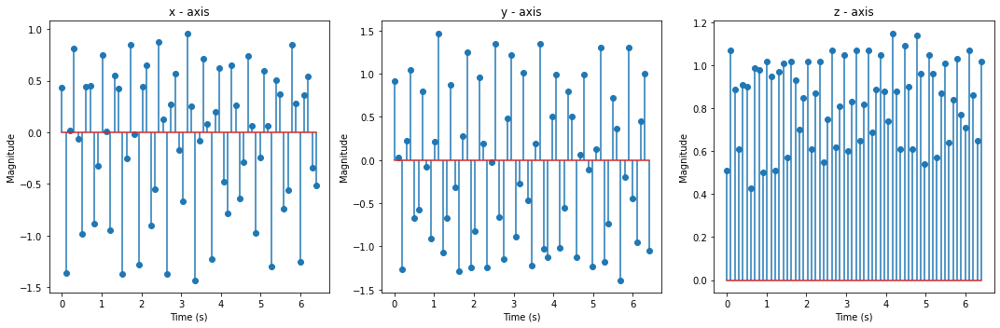

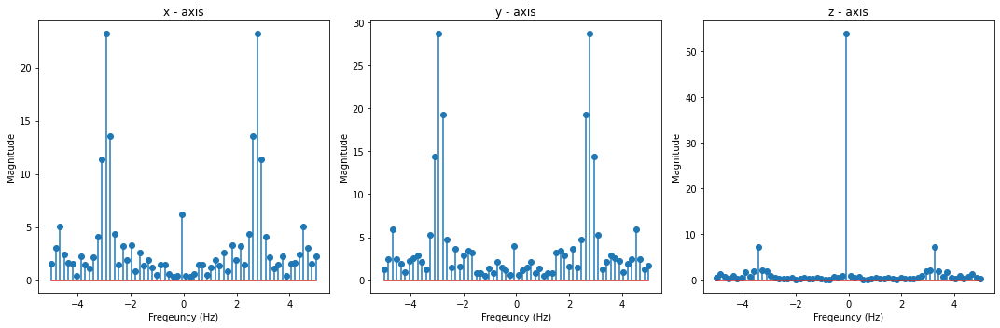

[0.43, -1.36, 0.02, 0.81, -0.06, -0.98, 0.44, 0.45, -0.88, -0.32, 0.75, 0.01, -0.95, 0.55, 0.42, -1.37, -0.25, 0.85, -0.02, -1.28, 0.44, 0.65, -0.9, -0.55, 0.88, 0.13, -1.37, 0.27, 0.57, -0.17, -0.67, 0.96, 0.25, -1.43, -0.08, 0.71, 0.08, -1.23, 0.2, 0.62, -0.48, -0.78, 0.65, 0.26, -0.64, -0.29, 0.74, 0.06, -0.97, -0.24, 0.6, 0.06, -1.3, 0.51, 0.37, -0.74, -0.56, 0.85, 0.28, -1.25, 0.36, 0.54, -0.34, -0.51]
[0.92, 0.03, -1.26, 0.23, 1.04, -0.67, -0.57, 0.8, -0.08, -0.91, 0.21, 1.47, -1.07, -0.67, 0.87, -0.31, -1.29, 0.28, 1.25, -1.24, -0.82, 0.96, 0.19, -1.24, -0.02, 1.35, -0.66, -1.15, 0.48, 1.22, -0.89, -0.27, 1.01, -0.47, -1.22, 0.19, 1.35, -1.03, -1.12, 0.51, 0.99, -1.02, -0.55, 0.8, 0.51, -1.12, 0.06, 0.99, -0.11, -1.23, 0.13, 1.3, -1.18, -0.74, 0.72, 0.36, -1.39, -0.2, 1.3, -0.44, -0.95, 0.45, 1.0, -1.05]
[0.95, 0.62, 0.88, 1.02, 0.86, 0.69, 0.95, 0.96, 0.71, 0.82, 1.01, 0.87, 0.7, 0.97, 0.95, 0.64, 0.83, 1.03, 0.86, 0.63, 0.95, 0.98, 0.71, 0.77, 1.02, 0.89, 0.61, 0.93, 0.98, 0.8

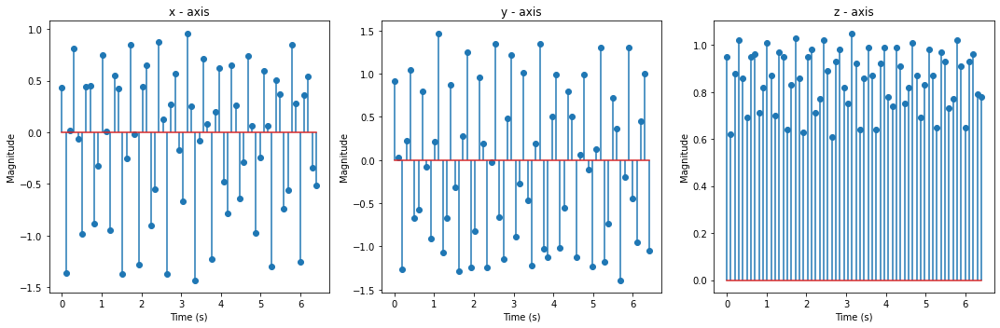

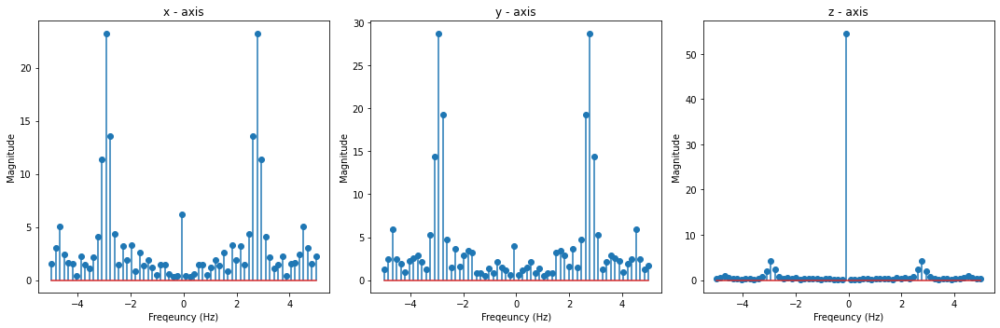

[1.08, 0.2, -1.2, -0.19, 0.72, -1.01, -0.18, 0.89, -0.83, -0.76, 1.21, -0.48, -0.62, 1.48, -0.13, -0.86, 1.38, 0.21, -1.13, 1.46, 0.4, -1.53, 0.81, 0.62, -1.74, -0.17, 0.79, -0.71, -0.59, 1.16, 0.02, -1.16, 1.02, 0.54, -1.4, -0.07, 0.55, -0.46, -0.52, 0.93, 0.23, -1.25, 0.14, 0.55, -0.39, -0.68, 0.18, -0.1, -0.15, -0.16, -0.17, -0.16, -0.17, -0.18, -0.21, -0.16, -0.16, -0.16, -0.16, -0.15, -0.18, -0.16, -0.16, -0.16]
[0.92, 0.03, -1.26, 0.23, 1.04, -0.67, -0.57, 0.8, -0.08, -0.91, 0.21, 1.47, -1.07, -0.67, 0.87, -0.31, -1.29, 0.28, 1.25, -1.24, -0.82, 0.96, 0.19, -1.24, -0.02, 1.35, -0.66, -1.15, 0.48, 1.22, -0.89, -0.27, 1.01, -0.47, -1.22, 0.19, 1.35, -1.03, -1.12, 0.51, 0.99, -1.02, -0.55, 0.8, 0.51, -1.12, 0.06, 0.99, -0.11, -1.23, 0.13, 1.3, -1.18, -0.74, 0.72, 0.36, -1.39, -0.2, 1.3, -0.44, -0.95, 0.45, 1.0, -1.05]
[0.95, 0.62, 0.88, 1.02, 0.86, 0.69, 0.95, 0.96, 0.71, 0.82, 1.01, 0.87, 0.7, 0.97, 0.95, 0.64, 0.83, 1.03, 0.86, 0.63, 0.95, 0.98, 0.71, 0.77, 1.02, 0.89, 0.61, 0.93,

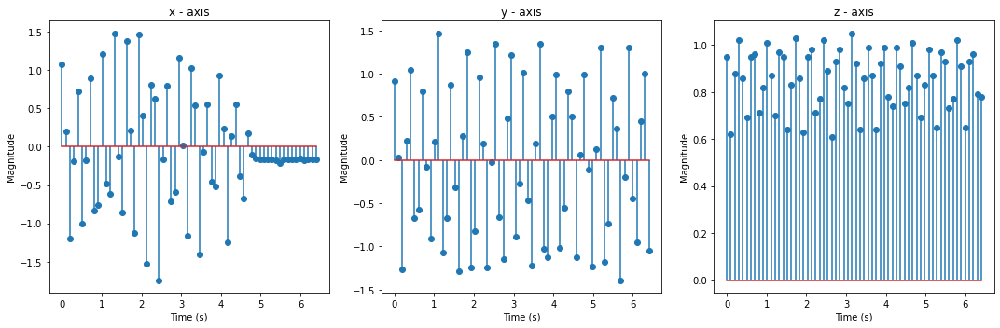

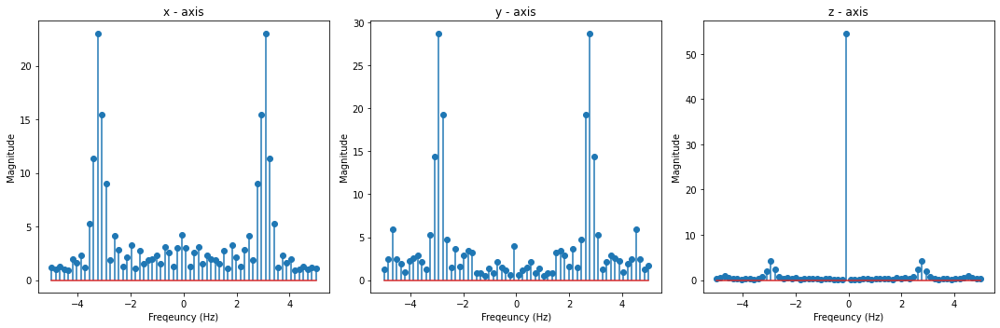

[1.08, 0.2, -1.2, -0.19, 0.72, -1.01, -0.18, 0.89, -0.83, -0.76, 1.21, -0.48, -0.62, 1.48, -0.13, -0.86, 1.38, 0.21, -1.13, 1.46, 0.4, -1.53, 0.81, 0.62, -1.74, -0.17, 0.79, -0.71, -0.59, 1.16, 0.02, -1.16, 1.02, 0.54, -1.4, -0.07, 0.55, -0.46, -0.52, 0.93, 0.23, -1.25, 0.14, 0.55, -0.39, -0.68, 0.18, -0.1, -0.15, -0.16, -0.17, -0.16, -0.17, -0.18, -0.21, -0.16, -0.16, -0.16, -0.16, -0.15, -0.18, -0.16, -0.16, -0.16]
[-0.22, 1.34, -0.42, -1.59, 1.03, 0.91, -1.95, 0.66, 0.98, -2.0, 0.26, 1.61, -1.73, 0.32, 2.0, -2.0, 0.08, 2.0, -1.18, -0.0, 1.67, -0.64, -0.96, 1.25, -0.31, -1.93, 0.35, 1.12, -1.6, 0.02, 1.57, -1.23, -0.24, 1.35, -0.59, -1.37, 0.49, 1.01, -1.34, 0.03, 1.43, -0.18, -1.15, 0.24, 0.98, -0.72, -0.26, 0.38, -0.01, -0.0, -0.0, 0.0, -0.01, -0.0, -0.11, -0.01, -0.01, -0.0, 0.0, -0.01, -0.05, -0.01, -0.01, -0.01]
[0.95, 0.62, 0.88, 1.02, 0.86, 0.69, 0.95, 0.96, 0.71, 0.82, 1.01, 0.87, 0.7, 0.97, 0.95, 0.64, 0.83, 1.03, 0.86, 0.63, 0.95, 0.98, 0.71, 0.77, 1.02, 0.89, 0.61, 0.93, 0

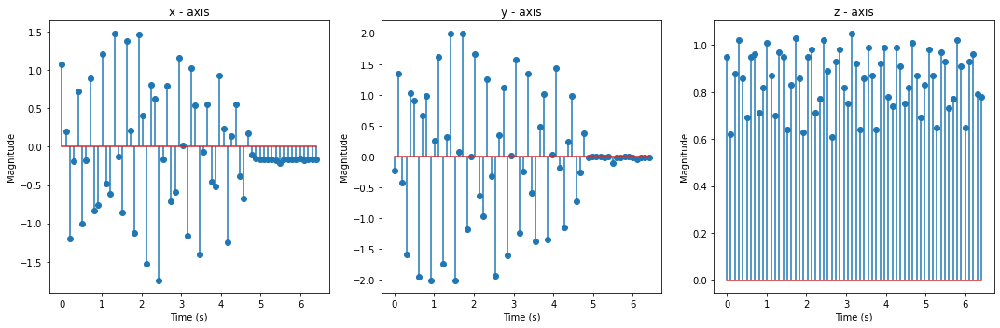

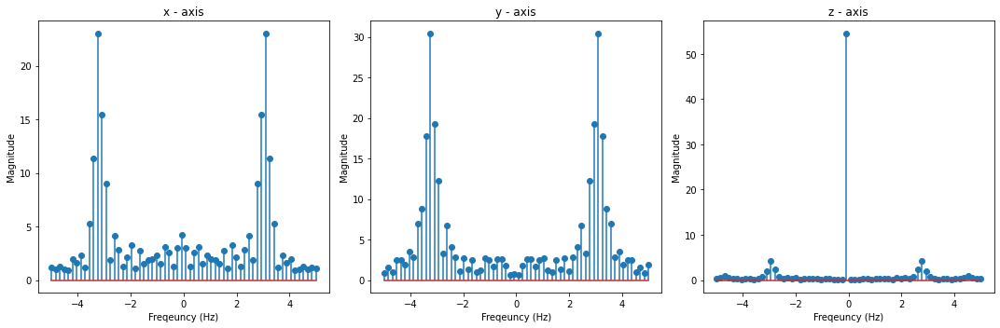

[1.08, 0.2, -1.2, -0.19, 0.72, -1.01, -0.18, 0.89, -0.83, -0.76, 1.21, -0.48, -0.62, 1.48, -0.13, -0.86, 1.38, 0.21, -1.13, 1.46, 0.4, -1.53, 0.81, 0.62, -1.74, -0.17, 0.79, -0.71, -0.59, 1.16, 0.02, -1.16, 1.02, 0.54, -1.4, -0.07, 0.55, -0.46, -0.52, 0.93, 0.23, -1.25, 0.14, 0.55, -0.39, -0.68, 0.18, -0.1, -0.15, -0.16, -0.17, -0.16, -0.17, -0.18, -0.21, -0.16, -0.16, -0.16, -0.16, -0.15, -0.18, -0.16, -0.16, -0.16]
[-0.22, 1.34, -0.42, -1.59, 1.03, 0.91, -1.95, 0.66, 0.98, -2.0, 0.26, 1.61, -1.73, 0.32, 2.0, -2.0, 0.08, 2.0, -1.18, -0.0, 1.67, -0.64, -0.96, 1.25, -0.31, -1.93, 0.35, 1.12, -1.6, 0.02, 1.57, -1.23, -0.24, 1.35, -0.59, -1.37, 0.49, 1.01, -1.34, 0.03, 1.43, -0.18, -1.15, 0.24, 0.98, -0.72, -0.26, 0.38, -0.01, -0.0, -0.0, 0.0, -0.01, -0.0, -0.11, -0.01, -0.01, -0.0, 0.0, -0.01, -0.05, -0.01, -0.01, -0.01]
[1.08, 0.91, 0.67, 0.84, 1.0, 0.67, 0.85, 1.03, 0.7, 0.74, 1.04, 0.79, 0.76, 1.16, 0.82, 0.72, 1.14, 0.9, 0.67, 1.15, 0.94, 0.59, 1.01, 0.97, 0.54, 0.84, 1.01, 0.7, 0.77

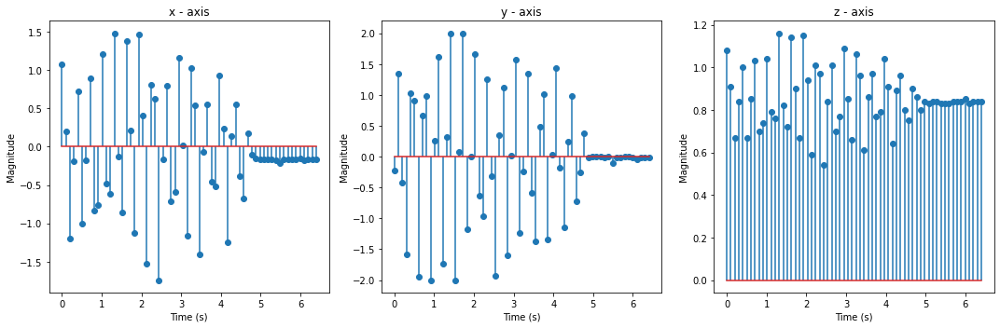

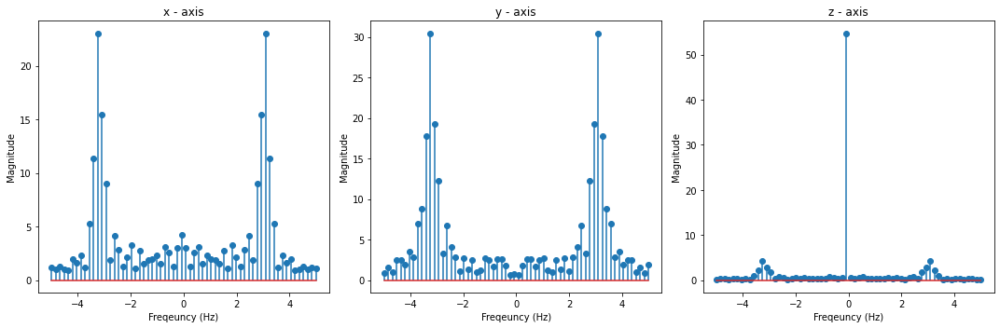

[-0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.19, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.22, -0.17, -0.07, -0.31, -0.2, -0.54, -0.59, -0.06, 0.33, -0.39, -0.6, 0.3, 0.25, -0.7, -0.09, 0.4, -0.7, -0.12, 0.67, -0.58, -0.28, 0.4, -0.41, -0.09, 0.26, -0.58, 0.07, 0.06, -0.77, 0.23, -0.27, -0.82, 0.11, -0.13, -0.72]
[-0.22, 1.34, -0.42, -1.59, 1.03, 0.91, -1.95, 0.66, 0.98, -2.0, 0.26, 1.61, -1.73, 0.32, 2.0, -2.0, 0.08, 2.0, -1.18, -0.0, 1.67, -0.64, -0.96, 1.25, -0.31, -1.93, 0.35, 1.12, -1.6, 0.02, 1.57, -1.23, -0.24, 1.35, -0.59, -1.37, 0.49, 1.01, -1.34, 0.03, 1.43, -0.18, -1.15, 0.24, 0.98, -0.72, -0.26, 0.38, -0.01, -0.0, -0.0, 0.0, -0.01, -0.0, -0.11, -0.01, -0.01, -0.0, 0.0, -0.01, -0.05, -0.01, -0.01, -0.01]
[1.08, 0.91, 0.67, 0.84, 1.0, 0.67, 0.85, 1.03, 0.7, 0.74, 1.04, 0.79, 0.76, 1.16, 0.82, 0.72, 1.14, 0.9, 0.67, 1.15, 0.94, 0.59, 1.01, 0.97, 0.54, 0.84, 1.01,

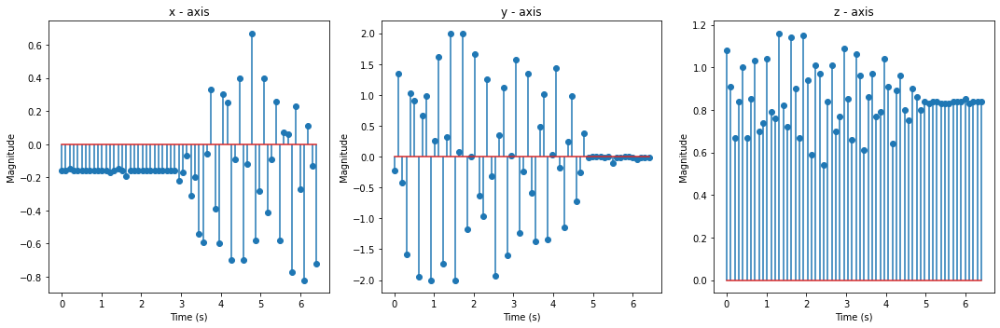

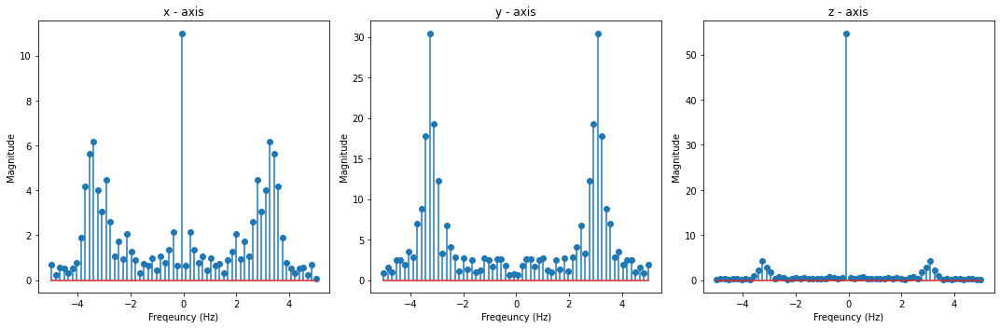

[-0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.19, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.22, -0.17, -0.07, -0.31, -0.2, -0.54, -0.59, -0.06, 0.33, -0.39, -0.6, 0.3, 0.25, -0.7, -0.09, 0.4, -0.7, -0.12, 0.67, -0.58, -0.28, 0.4, -0.41, -0.09, 0.26, -0.58, 0.07, 0.06, -0.77, 0.23, -0.27, -0.82, 0.11, -0.13, -0.72]
[-0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, 0.0, -0.01, -0.03, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, 0.04, 0.07, -0.04, 0.57, -0.13, -0.45, -0.11, 0.12, 0.09, 0.0, -0.46, 0.07, 0.39, -0.02, -0.2, 0.34, -0.56, -0.06, 0.24, -0.36, -0.12, 0.34, -0.62, -0.38, 0.58, -0.4, 0.32, 0.26, -0.5, 0.49, -0.19, 0.03, 0.05, -0.42, 0.02, 0.05]
[1.08, 0.91, 0.67, 0.84, 1.0, 0.67, 0.85, 1.03, 0.7, 0.74, 1.04, 0.79, 0.76, 1.16, 0.82, 0.72, 1.14, 0.9, 0.67, 1.15, 0.94, 0.59, 1.01, 0.97, 0.54, 0.

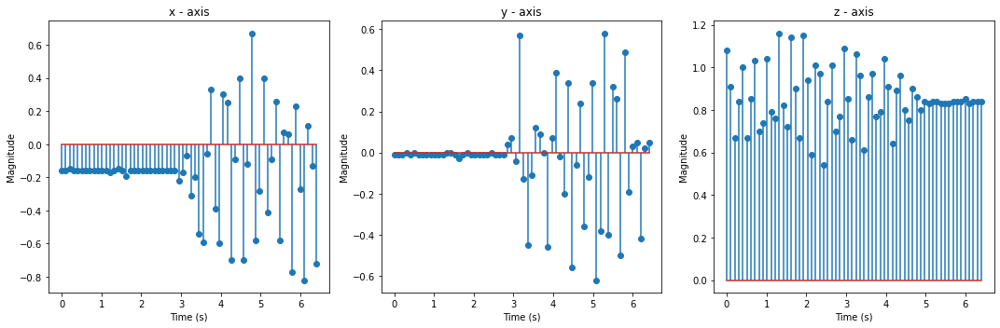

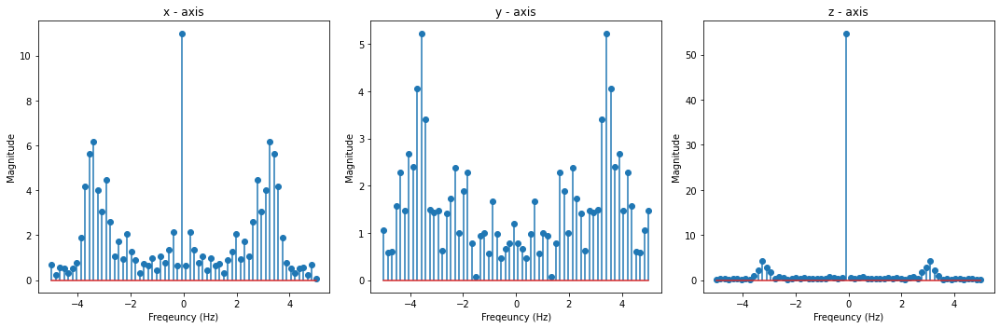

[-0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.19, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.22, -0.17, -0.07, -0.31, -0.2, -0.54, -0.59, -0.06, 0.33, -0.39, -0.6, 0.3, 0.25, -0.7, -0.09, 0.4, -0.7, -0.12, 0.67, -0.58, -0.28, 0.4, -0.41, -0.09, 0.26, -0.58, 0.07, 0.06, -0.77, 0.23, -0.27, -0.82, 0.11, -0.13, -0.72]
[-0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, 0.0, -0.01, -0.03, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, 0.04, 0.07, -0.04, 0.57, -0.13, -0.45, -0.11, 0.12, 0.09, 0.0, -0.46, 0.07, 0.39, -0.02, -0.2, 0.34, -0.56, -0.06, 0.24, -0.36, -0.12, 0.34, -0.62, -0.38, 0.58, -0.4, 0.32, 0.26, -0.5, 0.49, -0.19, 0.03, 0.05, -0.42, 0.02, 0.05]
[0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.79, 0.83, 0.83, 0.83, 0.85, 0.85, 0.84, 0.83, 0.85, 0.84, 0.84,

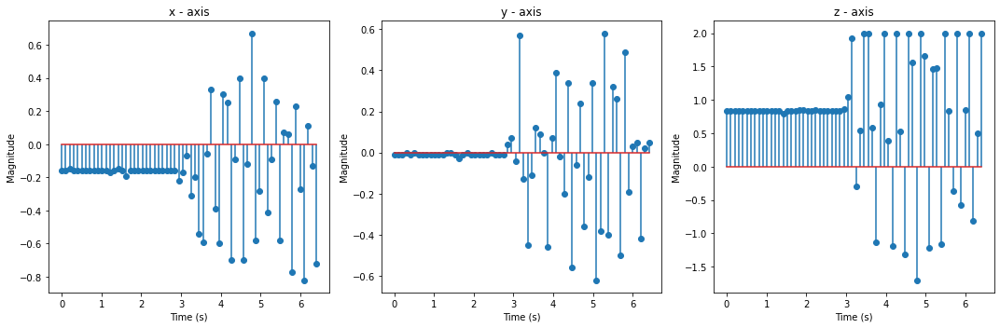

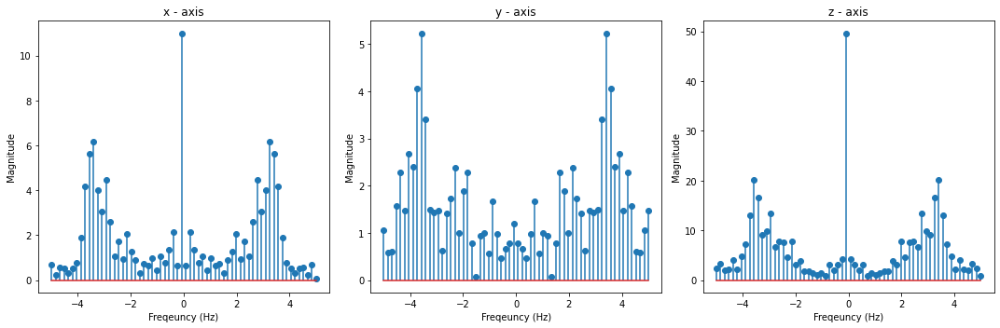

[-0.47, -0.23, 0.4, -0.6, 0.17, -0.08, -0.72, 0.22, -0.4, -0.62, 0.31, -0.54, 0.03, 0.16, -0.65, 0.13, 0.11, -0.57, -0.03, 0.19, -0.12, -0.14, 0.13, -0.37, -0.24, 0.14, -0.47, -0.22, 0.19, -0.23, -0.32, 0.28, -0.22, -0.19, -0.13, -0.18, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.29, -0.12, -0.18, -0.21, -0.2, -0.18, -0.42, -0.14, -0.33, -0.03, -0.15, -0.02]
[-0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, 0.0, -0.01, -0.03, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, 0.04, 0.07, -0.04, 0.57, -0.13, -0.45, -0.11, 0.12, 0.09, 0.0, -0.46, 0.07, 0.39, -0.02, -0.2, 0.34, -0.56, -0.06, 0.24, -0.36, -0.12, 0.34, -0.62, -0.38, 0.58, -0.4, 0.32, 0.26, -0.5, 0.49, -0.19, 0.03, 0.05, -0.42, 0.02, 0.05]
[0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.79, 0.83, 0.83, 0.83, 0.85, 0.85, 0.84, 0.83, 0.85, 0.84, 0.84

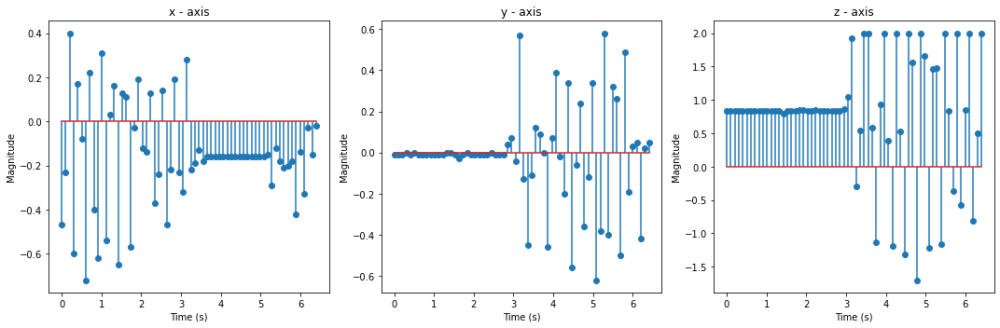

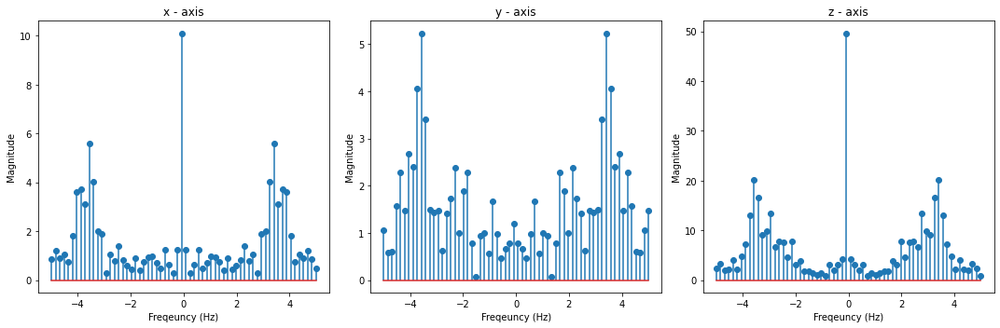

[-0.47, -0.23, 0.4, -0.6, 0.17, -0.08, -0.72, 0.22, -0.4, -0.62, 0.31, -0.54, 0.03, 0.16, -0.65, 0.13, 0.11, -0.57, -0.03, 0.19, -0.12, -0.14, 0.13, -0.37, -0.24, 0.14, -0.47, -0.22, 0.19, -0.23, -0.32, 0.28, -0.22, -0.19, -0.13, -0.18, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.29, -0.12, -0.18, -0.21, -0.2, -0.18, -0.42, -0.14, -0.33, -0.03, -0.15, -0.02]
[0.07, -0.07, -0.46, 0.51, -0.46, 0.09, -0.21, 0.07, 0.1, -0.3, 0.02, 0.04, -0.39, -0.14, 0.29, 0.14, -0.28, 0.21, -0.03, -0.42, 0.13, 0.11, -0.28, 0.19, 0.12, 0.04, 0.14, -0.01, -0.15, 0.11, -0.19, -0.17, 0.12, 0.05, 0.0, -0.03, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.01, -0.01, -0.01, 0.02, -0.17, -0.01, 0.07, -0.04, 0.02, -0.16, -0.03, 0.04, -0.08, -0.11, -0.12]
[0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.79, 0.83, 0.83, 0.83, 0.85, 0.85, 0.84, 0.83, 0.85, 0.84, 0.

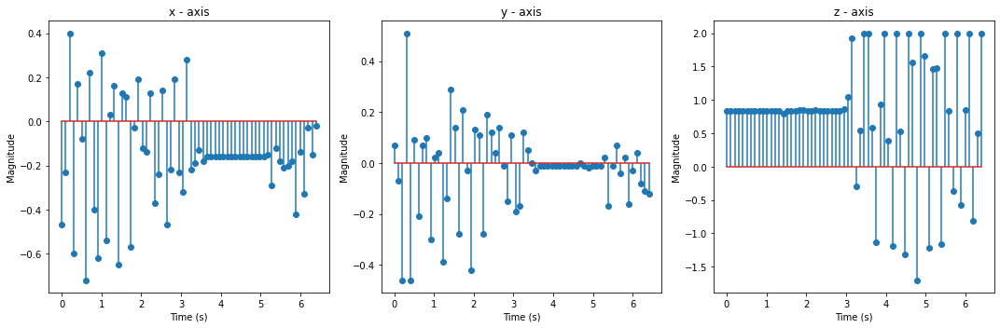

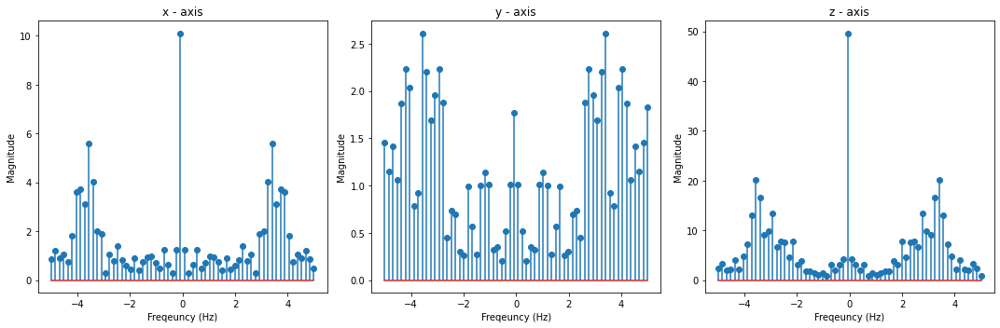

[-0.47, -0.23, 0.4, -0.6, 0.17, -0.08, -0.72, 0.22, -0.4, -0.62, 0.31, -0.54, 0.03, 0.16, -0.65, 0.13, 0.11, -0.57, -0.03, 0.19, -0.12, -0.14, 0.13, -0.37, -0.24, 0.14, -0.47, -0.22, 0.19, -0.23, -0.32, 0.28, -0.22, -0.19, -0.13, -0.18, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.29, -0.12, -0.18, -0.21, -0.2, -0.18, -0.42, -0.14, -0.33, -0.03, -0.15, -0.02]
[0.07, -0.07, -0.46, 0.51, -0.46, 0.09, -0.21, 0.07, 0.1, -0.3, 0.02, 0.04, -0.39, -0.14, 0.29, 0.14, -0.28, 0.21, -0.03, -0.42, 0.13, 0.11, -0.28, 0.19, 0.12, 0.04, 0.14, -0.01, -0.15, 0.11, -0.19, -0.17, 0.12, 0.05, 0.0, -0.03, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.01, -0.01, -0.01, 0.02, -0.17, -0.01, 0.07, -0.04, 0.02, -0.16, -0.03, 0.04, -0.08, -0.11, -0.12]
[1.52, 1.53, -1.31, 2.0, -0.12, 0.13, 2.0, -0.75, 1.29, 2.0, -1.23, 1.77, 0.83, -0.62, 2.0, 0.23, -0.5, 2.0, 1.34, -1.38, 1.66, 2.0, -0.96, 1.79, 2

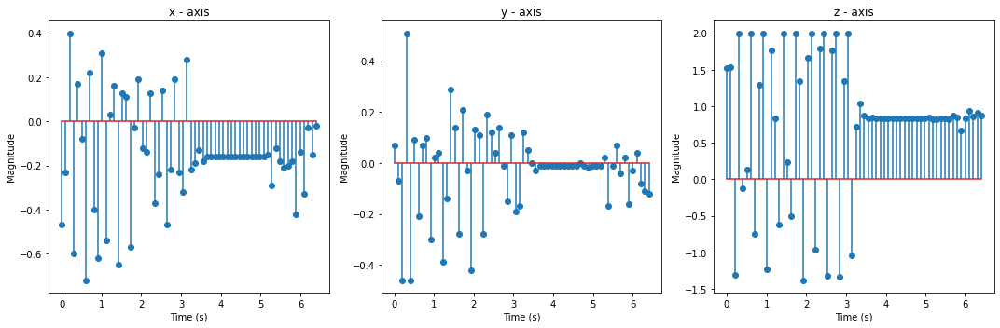

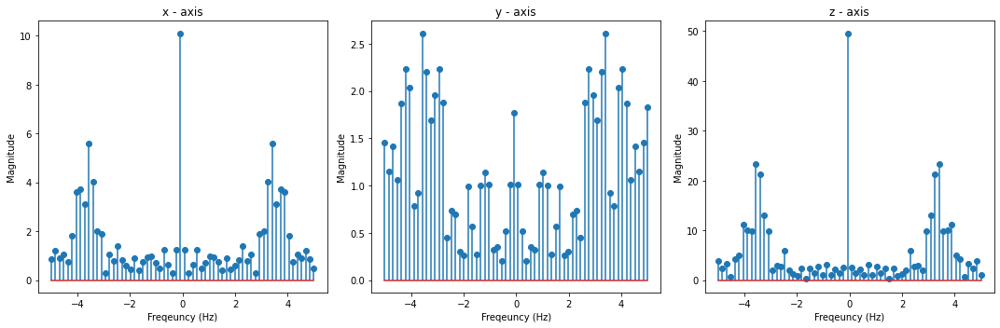

[-0.02, 0.21, 0.11, -0.1, -0.18, 0.57, -0.11, -0.53, 0.39, 0.59, -0.07, -0.3, -0.16, -0.18, -0.12, -0.0, 0.06, 0.21, 0.04, 0.01, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.02, -0.1, -0.17, -0.26, -0.16, -0.21, -0.12, -0.15, -0.05, -0.3, -0.2, -0.05, -0.21, -0.39, 0.63, -1.0, 0.54, -0.21, -0.4, -0.08, -0.29, -0.2, -0.21, -0.15, -0.09, 0.0, -0.07, -0.09, -0.07, -0.1, -0.13, -0.13, -0.12, -0.1, -0.14, -0.18, -0.21, -0.23]
[0.07, -0.07, -0.46, 0.51, -0.46, 0.09, -0.21, 0.07, 0.1, -0.3, 0.02, 0.04, -0.39, -0.14, 0.29, 0.14, -0.28, 0.21, -0.03, -0.42, 0.13, 0.11, -0.28, 0.19, 0.12, 0.04, 0.14, -0.01, -0.15, 0.11, -0.19, -0.17, 0.12, 0.05, 0.0, -0.03, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.01, -0.01, -0.01, 0.02, -0.17, -0.01, 0.07, -0.04, 0.02, -0.16, -0.03, 0.04, -0.08, -0.11, -0.12]
[1.52, 1.53, -1.31, 2.0, -0.12, 0.13, 2.0, -0.75, 1.29, 2.0, -1.23, 1.77, 0.83, -0.62, 2.0, 0.23, -0.5, 2.0, 1.34, -1.38, 1.66, 2.0, -0.96, 1.79, 2.0, -1.

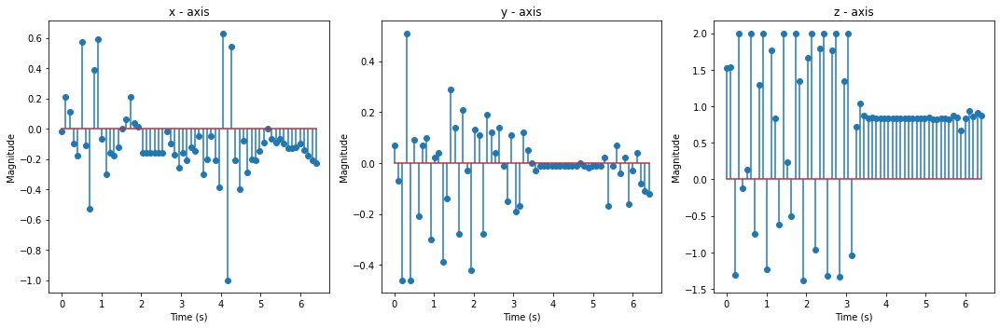

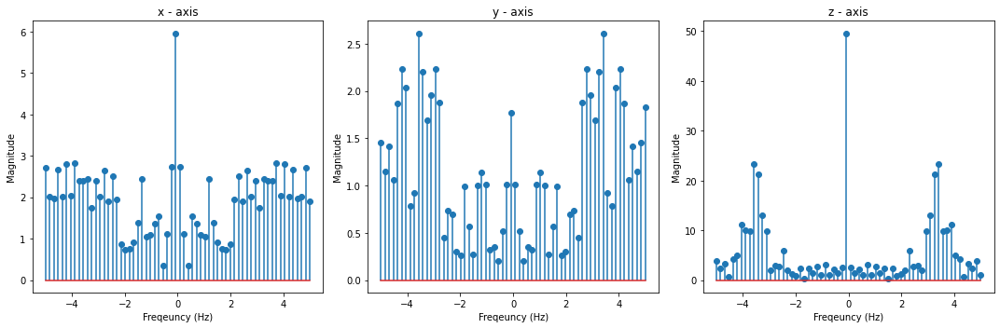

[-0.02, 0.21, 0.11, -0.1, -0.18, 0.57, -0.11, -0.53, 0.39, 0.59, -0.07, -0.3, -0.16, -0.18, -0.12, -0.0, 0.06, 0.21, 0.04, 0.01, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.02, -0.1, -0.17, -0.26, -0.16, -0.21, -0.12, -0.15, -0.05, -0.3, -0.2, -0.05, -0.21, -0.39, 0.63, -1.0, 0.54, -0.21, -0.4, -0.08, -0.29, -0.2, -0.21, -0.15, -0.09, 0.0, -0.07, -0.09, -0.07, -0.1, -0.13, -0.13, -0.12, -0.1, -0.14, -0.18, -0.21, -0.23]
[-0.12, -0.07, -0.12, -0.05, -0.21, 0.43, -0.27, -0.51, 0.42, 0.37, -0.15, -0.18, -0.11, -0.12, -0.06, -0.06, -0.14, -0.11, -0.08, 0.08, -0.0, -0.01, -0.0, -0.01, -0.0, 0.01, 0.11, 0.07, -0.01, 0.22, -0.0, -0.1, -0.0, -0.03, 0.02, -0.18, -0.08, -0.07, 0.05, -0.38, 0.75, -0.34, -0.12, 0.04, -0.17, -0.04, 0.01, 0.02, -0.01, -0.02, -0.04, 0.06, 0.03, 0.03, 0.03, 0.01, 0.11, -0.04, 0.03, 0.01, 0.01, 0.0, 0.0, -0.01]
[1.52, 1.53, -1.31, 2.0, -0.12, 0.13, 2.0, -0.75, 1.29, 2.0, -1.23, 1.77, 0.83, -0.62, 2.0, 0.23, -0.5, 2.0, 1.34, -1.38, 1.66, 2.0, -0.96, 1.79, 2.0, -1.32, 1

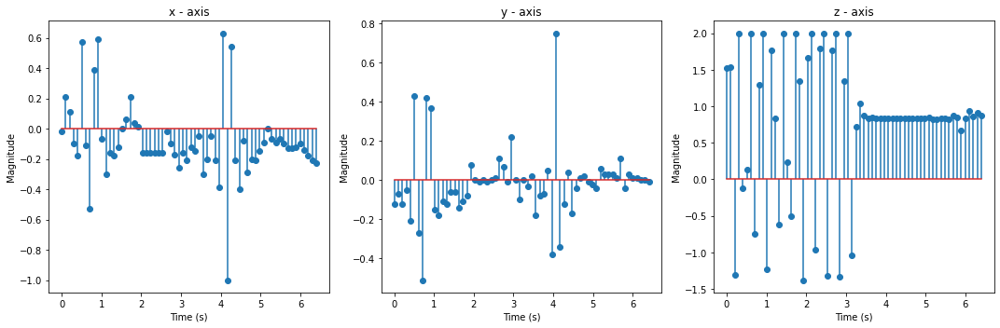

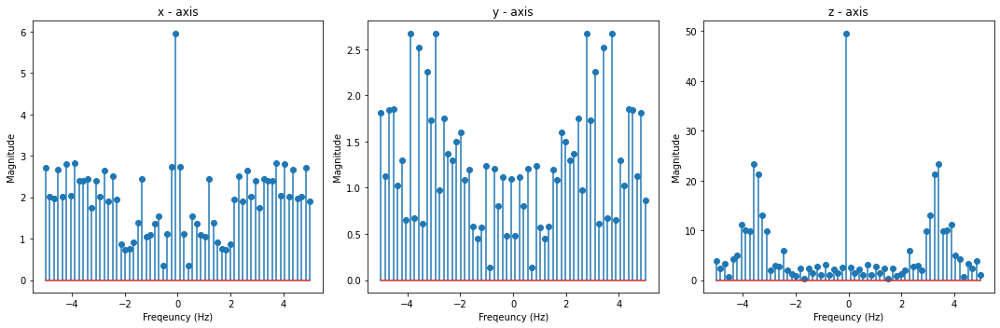

[-0.02, 0.21, 0.11, -0.1, -0.18, 0.57, -0.11, -0.53, 0.39, 0.59, -0.07, -0.3, -0.16, -0.18, -0.12, -0.0, 0.06, 0.21, 0.04, 0.01, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.02, -0.1, -0.17, -0.26, -0.16, -0.21, -0.12, -0.15, -0.05, -0.3, -0.2, -0.05, -0.21, -0.39, 0.63, -1.0, 0.54, -0.21, -0.4, -0.08, -0.29, -0.2, -0.21, -0.15, -0.09, 0.0, -0.07, -0.09, -0.07, -0.1, -0.13, -0.13, -0.12, -0.1, -0.14, -0.18, -0.21, -0.23]
[-0.12, -0.07, -0.12, -0.05, -0.21, 0.43, -0.27, -0.51, 0.42, 0.37, -0.15, -0.18, -0.11, -0.12, -0.06, -0.06, -0.14, -0.11, -0.08, 0.08, -0.0, -0.01, -0.0, -0.01, -0.0, 0.01, 0.11, 0.07, -0.01, 0.22, -0.0, -0.1, -0.0, -0.03, 0.02, -0.18, -0.08, -0.07, 0.05, -0.38, 0.75, -0.34, -0.12, 0.04, -0.17, -0.04, 0.01, 0.02, -0.01, -0.02, -0.04, 0.06, 0.03, 0.03, 0.03, 0.01, 0.11, -0.04, 0.03, 0.01, 0.01, 0.0, 0.0, -0.01]
[0.88, 0.94, 1.05, 0.59, 1.82, -0.54, 1.21, 2.0, 0.15, -0.7, -0.11, 0.83, 0.87, 0.9, 0.85, 0.86, 0.65, 0.84, 0.89, 0.57, 0.83, 0.83, 0.84, 0.83, 0.84, 0.83, 0.

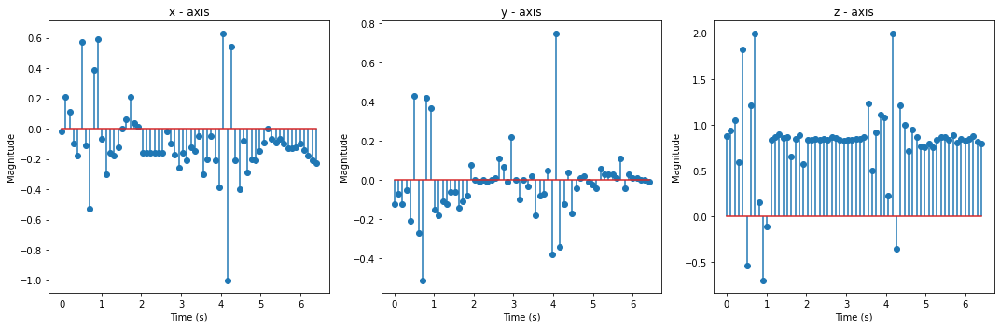

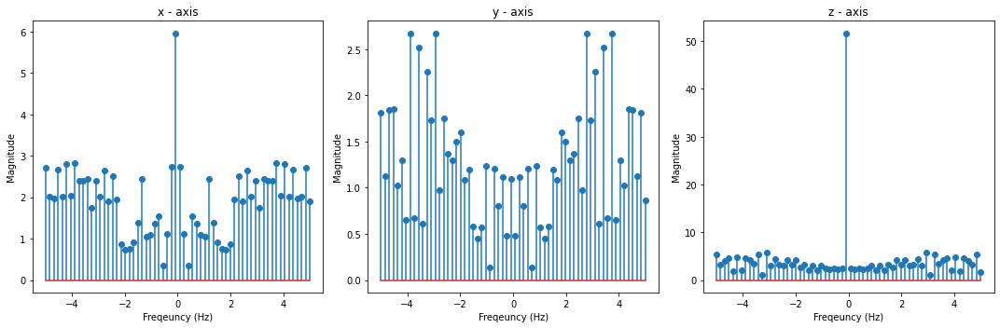

[-0.07, -0.16, -0.17, -0.16, -0.16, -0.15, -0.17, -0.19, -0.16, -0.15, -0.14, -0.07, -0.09, -0.02, -0.16, -0.07, -0.11, -0.07, 0.1, -0.08, -0.03, -0.04, -0.16, -0.11, -0.12, -0.18, -0.15, -0.06, -0.06, -0.13, -0.11, 0.12, -0.37, 0.13, 0.02, -0.1, 0.71, -0.74, 0.85, -0.84, 0.34, -0.9, 0.26, -0.44, 0.58, -0.43, 0.27, 0.25, -0.07, 0.19, -0.36, 0.33, -0.57, 0.37, -0.66, 0.48, -0.91, 0.48, -0.57, 0.36, -0.36, 0.48, -0.39, 0.43]
[-0.12, -0.07, -0.12, -0.05, -0.21, 0.43, -0.27, -0.51, 0.42, 0.37, -0.15, -0.18, -0.11, -0.12, -0.06, -0.06, -0.14, -0.11, -0.08, 0.08, -0.0, -0.01, -0.0, -0.01, -0.0, 0.01, 0.11, 0.07, -0.01, 0.22, -0.0, -0.1, -0.0, -0.03, 0.02, -0.18, -0.08, -0.07, 0.05, -0.38, 0.75, -0.34, -0.12, 0.04, -0.17, -0.04, 0.01, 0.02, -0.01, -0.02, -0.04, 0.06, 0.03, 0.03, 0.03, 0.01, 0.11, -0.04, 0.03, 0.01, 0.01, 0.0, 0.0, -0.01]
[0.88, 0.94, 1.05, 0.59, 1.82, -0.54, 1.21, 2.0, 0.15, -0.7, -0.11, 0.83, 0.87, 0.9, 0.85, 0.86, 0.65, 0.84, 0.89, 0.57, 0.83, 0.83, 0.84, 0.83, 0.84, 0.83, 

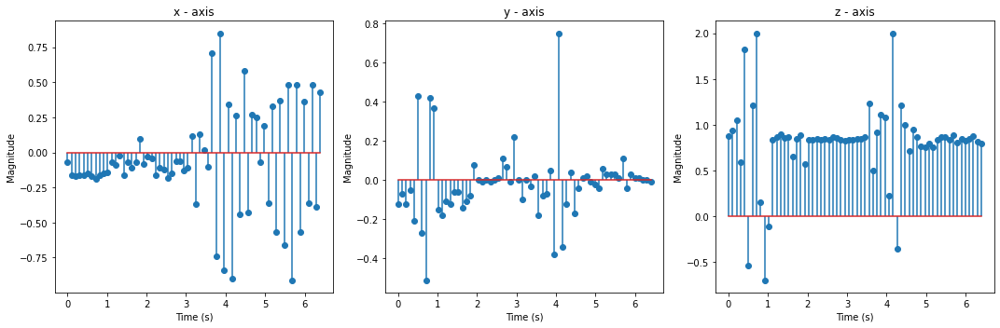

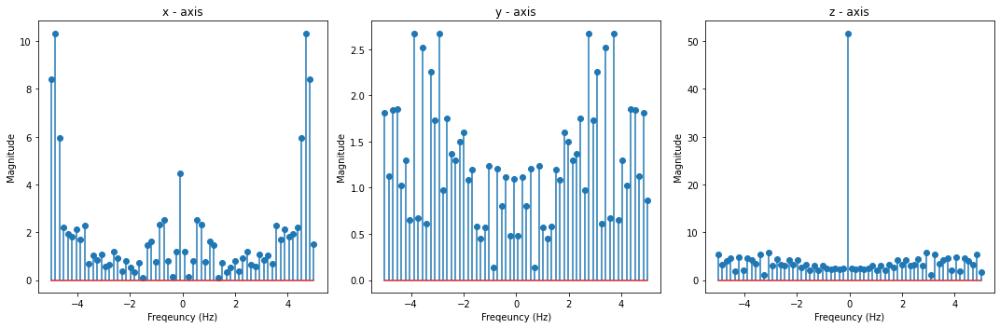

[-0.07, -0.16, -0.17, -0.16, -0.16, -0.15, -0.17, -0.19, -0.16, -0.15, -0.14, -0.07, -0.09, -0.02, -0.16, -0.07, -0.11, -0.07, 0.1, -0.08, -0.03, -0.04, -0.16, -0.11, -0.12, -0.18, -0.15, -0.06, -0.06, -0.13, -0.11, 0.12, -0.37, 0.13, 0.02, -0.1, 0.71, -0.74, 0.85, -0.84, 0.34, -0.9, 0.26, -0.44, 0.58, -0.43, 0.27, 0.25, -0.07, 0.19, -0.36, 0.33, -0.57, 0.37, -0.66, 0.48, -0.91, 0.48, -0.57, 0.36, -0.36, 0.48, -0.39, 0.43]
[-0.16, -0.02, -0.01, 0.01, -0.01, 0.02, -0.01, 0.03, -0.01, -0.03, -0.02, 0.11, 0.03, 0.18, -0.2, 0.02, 0.05, 0.05, -0.0, -0.1, 0.18, -0.02, -0.02, 0.13, 0.08, 0.06, 0.13, 0.0, -0.04, 0.16, -0.14, 0.23, -0.27, 0.16, -0.31, 0.09, -0.2, 0.23, -0.13, 0.4, -0.14, 0.35, 0.08, -0.13, 0.45, -0.16, 0.17, -0.45, 0.4, -0.98, 0.34, -0.49, 0.25, -0.26, 0.49, -0.13, 0.43, -0.01, 0.39, -0.28, 0.02, -0.01, -0.46, 0.17]
[0.88, 0.94, 1.05, 0.59, 1.82, -0.54, 1.21, 2.0, 0.15, -0.7, -0.11, 0.83, 0.87, 0.9, 0.85, 0.86, 0.65, 0.84, 0.89, 0.57, 0.83, 0.83, 0.84, 0.83, 0.84, 0.83, 0.86, 0

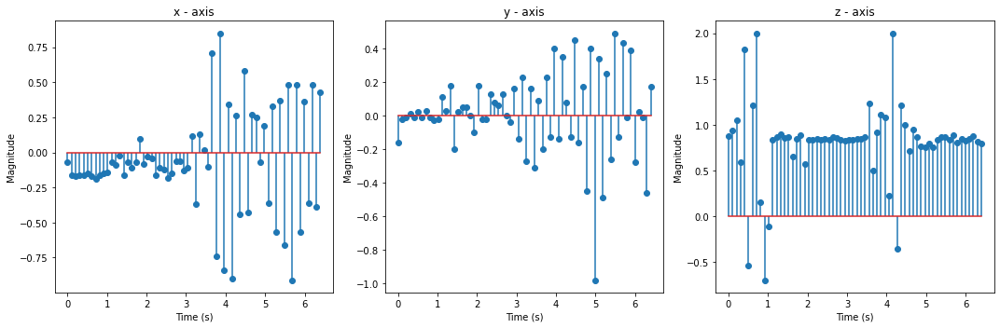

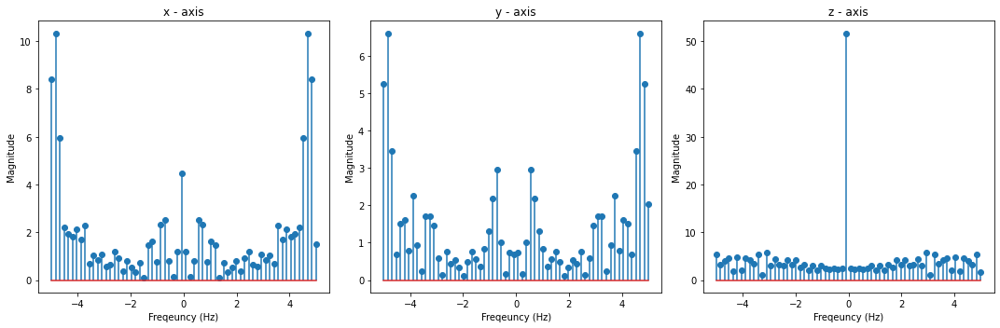

[-0.07, -0.16, -0.17, -0.16, -0.16, -0.15, -0.17, -0.19, -0.16, -0.15, -0.14, -0.07, -0.09, -0.02, -0.16, -0.07, -0.11, -0.07, 0.1, -0.08, -0.03, -0.04, -0.16, -0.11, -0.12, -0.18, -0.15, -0.06, -0.06, -0.13, -0.11, 0.12, -0.37, 0.13, 0.02, -0.1, 0.71, -0.74, 0.85, -0.84, 0.34, -0.9, 0.26, -0.44, 0.58, -0.43, 0.27, 0.25, -0.07, 0.19, -0.36, 0.33, -0.57, 0.37, -0.66, 0.48, -0.91, 0.48, -0.57, 0.36, -0.36, 0.48, -0.39, 0.43]
[-0.16, -0.02, -0.01, 0.01, -0.01, 0.02, -0.01, 0.03, -0.01, -0.03, -0.02, 0.11, 0.03, 0.18, -0.2, 0.02, 0.05, 0.05, -0.0, -0.1, 0.18, -0.02, -0.02, 0.13, 0.08, 0.06, 0.13, 0.0, -0.04, 0.16, -0.14, 0.23, -0.27, 0.16, -0.31, 0.09, -0.2, 0.23, -0.13, 0.4, -0.14, 0.35, 0.08, -0.13, 0.45, -0.16, 0.17, -0.45, 0.4, -0.98, 0.34, -0.49, 0.25, -0.26, 0.49, -0.13, 0.43, -0.01, 0.39, -0.28, 0.02, -0.01, -0.46, 0.17]
[0.85, 0.84, 0.84, 0.84, 0.83, 0.85, 0.83, 0.84, 0.84, 0.84, 0.86, 0.91, 0.91, 0.74, 1.08, 0.89, 0.9, 0.91, 0.85, 0.85, 0.83, 0.86, 0.86, 0.83, 0.81, 1.02, 1.16, 0.

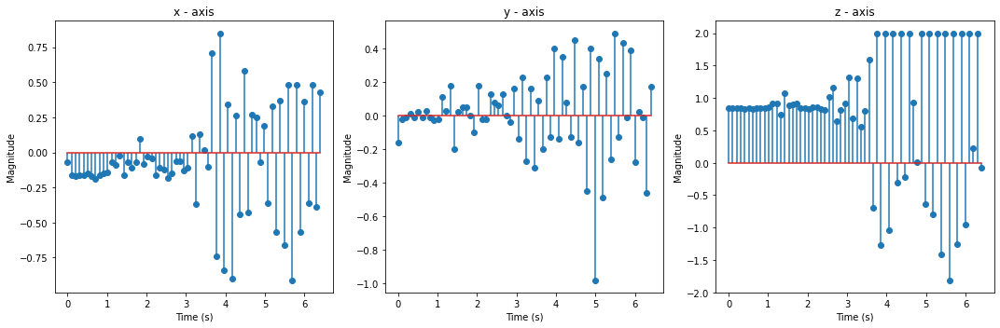

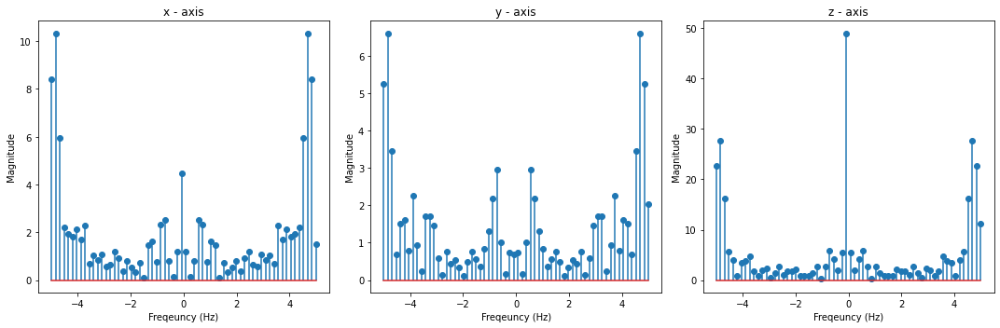

[0.85, -0.83, 0.48, 0.0, 0.75, -0.19, 0.62, -0.09, 0.51, 0.2, 0.28, 0.14, 0.05, 0.15, -0.31, 0.03, -0.27, 0.19, -0.45, 0.21, -0.29, 0.4, -0.51, 0.47, -0.35, 0.55, -0.48, 0.41, -0.26, 0.15, 0.07, -0.03, 0.23, -0.45, 0.24, -0.56, 0.48, -0.6, 0.27, -0.24, 0.01, 0.36, -0.59, 0.74, -0.94, 0.46, -0.35, -0.29, 0.33, -0.5, 0.42, -0.27, 0.25, 0.26, -0.27, 0.25, -0.4, 0.19, -0.27, 0.16, 0.16, -0.19, 0.4, -0.44]
[-0.16, -0.02, -0.01, 0.01, -0.01, 0.02, -0.01, 0.03, -0.01, -0.03, -0.02, 0.11, 0.03, 0.18, -0.2, 0.02, 0.05, 0.05, -0.0, -0.1, 0.18, -0.02, -0.02, 0.13, 0.08, 0.06, 0.13, 0.0, -0.04, 0.16, -0.14, 0.23, -0.27, 0.16, -0.31, 0.09, -0.2, 0.23, -0.13, 0.4, -0.14, 0.35, 0.08, -0.13, 0.45, -0.16, 0.17, -0.45, 0.4, -0.98, 0.34, -0.49, 0.25, -0.26, 0.49, -0.13, 0.43, -0.01, 0.39, -0.28, 0.02, -0.01, -0.46, 0.17]
[0.85, 0.84, 0.84, 0.84, 0.83, 0.85, 0.83, 0.84, 0.84, 0.84, 0.86, 0.91, 0.91, 0.74, 1.08, 0.89, 0.9, 0.91, 0.85, 0.85, 0.83, 0.86, 0.86, 0.83, 0.81, 1.02, 1.16, 0.65, 0.82, 0.92, 1.32, 

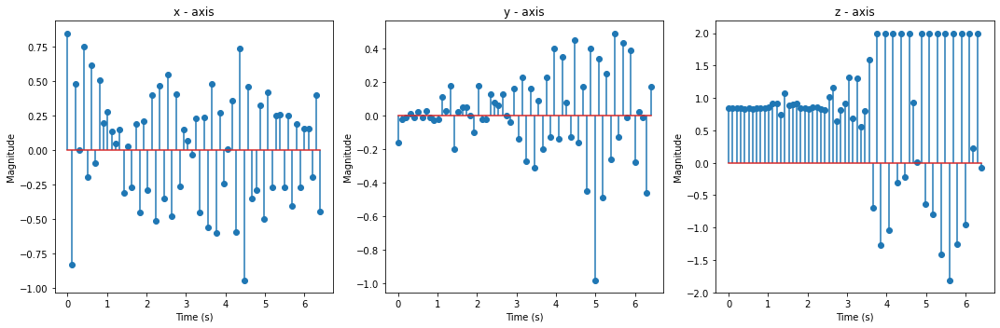

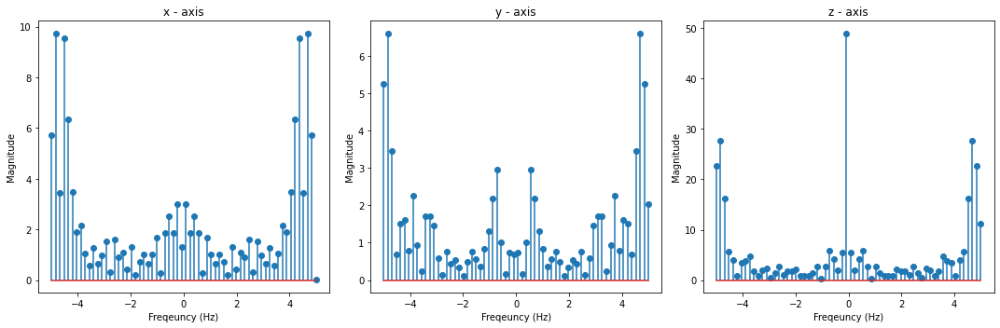

[0.85, -0.83, 0.48, 0.0, 0.75, -0.19, 0.62, -0.09, 0.51, 0.2, 0.28, 0.14, 0.05, 0.15, -0.31, 0.03, -0.27, 0.19, -0.45, 0.21, -0.29, 0.4, -0.51, 0.47, -0.35, 0.55, -0.48, 0.41, -0.26, 0.15, 0.07, -0.03, 0.23, -0.45, 0.24, -0.56, 0.48, -0.6, 0.27, -0.24, 0.01, 0.36, -0.59, 0.74, -0.94, 0.46, -0.35, -0.29, 0.33, -0.5, 0.42, -0.27, 0.25, 0.26, -0.27, 0.25, -0.4, 0.19, -0.27, 0.16, 0.16, -0.19, 0.4, -0.44]
[0.21, 0.29, 0.28, -0.36, 0.27, -0.43, 0.36, -0.42, 0.33, -0.45, 0.22, -0.81, 0.15, -0.68, 0.27, -0.9, 0.26, -0.52, 0.12, -0.73, 0.07, -0.31, 0.17, -0.21, -0.5, 0.04, 0.13, 0.26, -0.16, 0.13, -0.38, 0.29, -0.51, 0.3, -0.22, 0.01, 0.27, -0.06, 0.18, -0.06, -0.06, -0.04, -0.32, 0.18, -0.25, 0.35, -0.3, 0.09, -0.17, -0.56, -0.0, -0.04, -0.11, -0.22, 0.23, -0.36, 0.23, 0.03, -0.16, 0.15, -0.53, 0.41, -0.3, 0.43]
[0.85, 0.84, 0.84, 0.84, 0.83, 0.85, 0.83, 0.84, 0.84, 0.84, 0.86, 0.91, 0.91, 0.74, 1.08, 0.89, 0.9, 0.91, 0.85, 0.85, 0.83, 0.86, 0.86, 0.83, 0.81, 1.02, 1.16, 0.65, 0.82, 0.92, 1.3

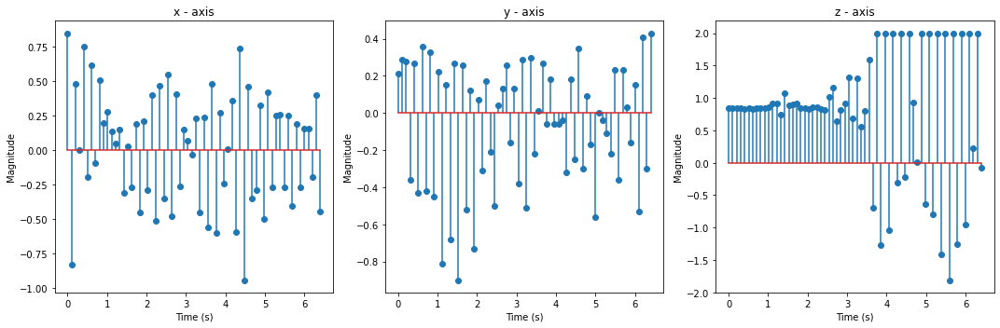

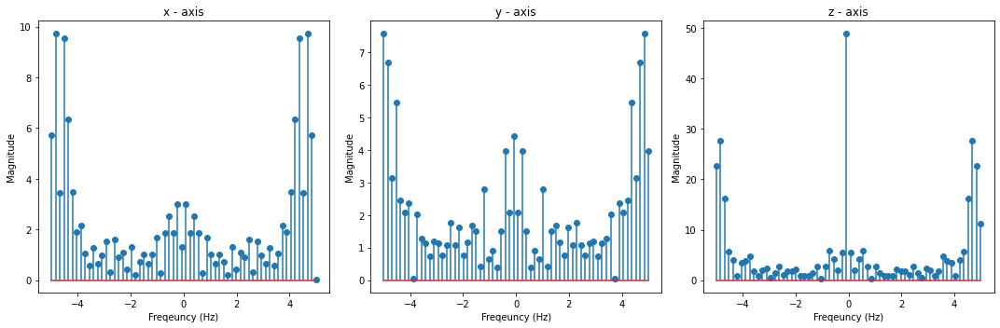

[0.85, -0.83, 0.48, 0.0, 0.75, -0.19, 0.62, -0.09, 0.51, 0.2, 0.28, 0.14, 0.05, 0.15, -0.31, 0.03, -0.27, 0.19, -0.45, 0.21, -0.29, 0.4, -0.51, 0.47, -0.35, 0.55, -0.48, 0.41, -0.26, 0.15, 0.07, -0.03, 0.23, -0.45, 0.24, -0.56, 0.48, -0.6, 0.27, -0.24, 0.01, 0.36, -0.59, 0.74, -0.94, 0.46, -0.35, -0.29, 0.33, -0.5, 0.42, -0.27, 0.25, 0.26, -0.27, 0.25, -0.4, 0.19, -0.27, 0.16, 0.16, -0.19, 0.4, -0.44]
[0.21, 0.29, 0.28, -0.36, 0.27, -0.43, 0.36, -0.42, 0.33, -0.45, 0.22, -0.81, 0.15, -0.68, 0.27, -0.9, 0.26, -0.52, 0.12, -0.73, 0.07, -0.31, 0.17, -0.21, -0.5, 0.04, 0.13, 0.26, -0.16, 0.13, -0.38, 0.29, -0.51, 0.3, -0.22, 0.01, 0.27, -0.06, 0.18, -0.06, -0.06, -0.04, -0.32, 0.18, -0.25, 0.35, -0.3, 0.09, -0.17, -0.56, -0.0, -0.04, -0.11, -0.22, 0.23, -0.36, 0.23, 0.03, -0.16, 0.15, -0.53, 0.41, -0.3, 0.43]
[-1.19, 2.0, -0.8, 2.0, 0.08, 2.0, 0.43, 1.47, 0.85, 1.33, 1.61, 0.18, 1.94, -0.39, 2.0, -0.36, 2.0, -0.35, 2.0, -0.35, 1.89, -0.43, 2.0, -0.8, 2.0, -0.68, 2.0, -0.1, 1.5, 1.0, 0.06, 

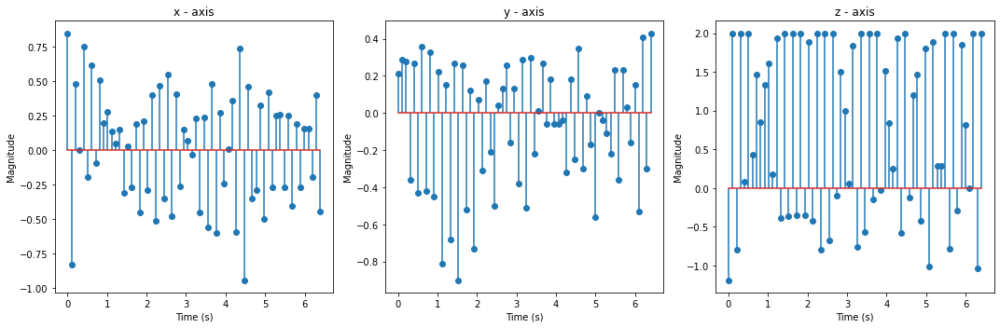

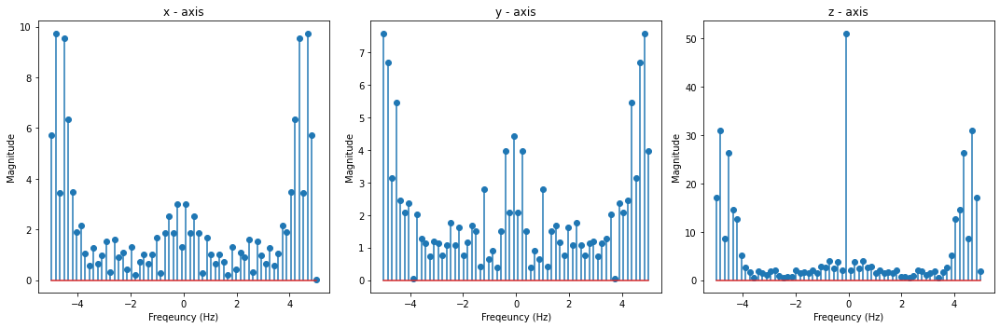

[-0.17, 0.2, 0.23, -0.58, 0.51, -0.22, 0.46, 0.13, -0.06, -0.07, -0.47, 0.2, -0.37, 0.06, -0.04, -0.07, 0.47, -0.41, 0.24, -0.34, 0.42, -0.65, 0.3, -0.69, 0.37, -0.35, 0.21, 0.27, -0.63, 0.31, -0.62, 0.19, -0.22, -0.12, 0.28, -0.65, 0.31, -0.69, 0.29, -0.51, 0.53, -0.53, 0.81, -0.38, 0.3, 0.13, -0.51, 0.35, -0.67, 0.48, -0.61, 0.47, -0.26, 0.1, 0.27, -0.76, 0.69, -0.65, 0.4, -0.09, -0.25, 0.28, -0.72, 0.4]
[0.21, 0.29, 0.28, -0.36, 0.27, -0.43, 0.36, -0.42, 0.33, -0.45, 0.22, -0.81, 0.15, -0.68, 0.27, -0.9, 0.26, -0.52, 0.12, -0.73, 0.07, -0.31, 0.17, -0.21, -0.5, 0.04, 0.13, 0.26, -0.16, 0.13, -0.38, 0.29, -0.51, 0.3, -0.22, 0.01, 0.27, -0.06, 0.18, -0.06, -0.06, -0.04, -0.32, 0.18, -0.25, 0.35, -0.3, 0.09, -0.17, -0.56, -0.0, -0.04, -0.11, -0.22, 0.23, -0.36, 0.23, 0.03, -0.16, 0.15, -0.53, 0.41, -0.3, 0.43]
[-1.19, 2.0, -0.8, 2.0, 0.08, 2.0, 0.43, 1.47, 0.85, 1.33, 1.61, 0.18, 1.94, -0.39, 2.0, -0.36, 2.0, -0.35, 2.0, -0.35, 1.89, -0.43, 2.0, -0.8, 2.0, -0.68, 2.0, -0.1, 1.5, 1.0, 0

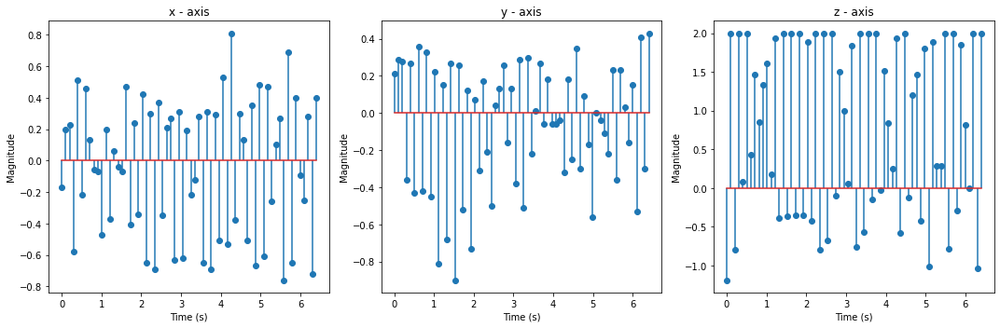

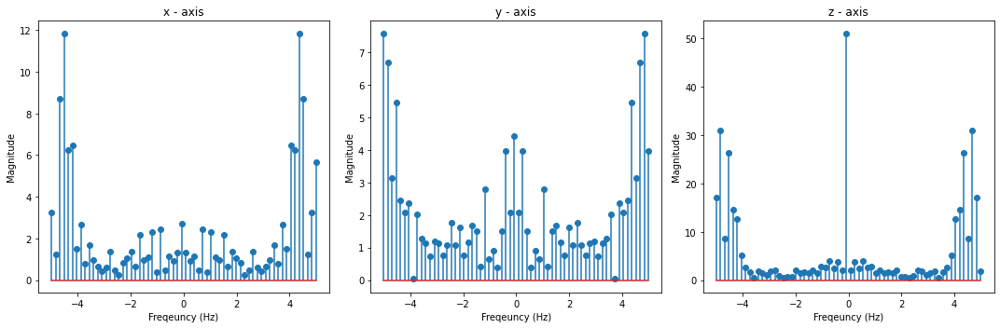

[-0.17, 0.2, 0.23, -0.58, 0.51, -0.22, 0.46, 0.13, -0.06, -0.07, -0.47, 0.2, -0.37, 0.06, -0.04, -0.07, 0.47, -0.41, 0.24, -0.34, 0.42, -0.65, 0.3, -0.69, 0.37, -0.35, 0.21, 0.27, -0.63, 0.31, -0.62, 0.19, -0.22, -0.12, 0.28, -0.65, 0.31, -0.69, 0.29, -0.51, 0.53, -0.53, 0.81, -0.38, 0.3, 0.13, -0.51, 0.35, -0.67, 0.48, -0.61, 0.47, -0.26, 0.1, 0.27, -0.76, 0.69, -0.65, 0.4, -0.09, -0.25, 0.28, -0.72, 0.4]
[-0.45, 0.37, -0.47, 0.26, 0.22, -0.27, 0.12, -0.4, 0.48, -0.31, 0.31, -0.09, -0.09, 0.19, -0.45, 0.21, -0.36, 0.36, -0.66, 0.1, -0.12, 0.12, 0.3, -0.33, 0.45, -0.18, 0.2, -0.26, 0.11, -0.19, 0.16, 0.04, -0.24, 0.08, -0.24, 0.03, -0.06, 0.2, 0.09, 0.08, 0.29, -0.03, 0.4, -0.14, 0.21, -0.3, 0.24, -0.42, -0.08, 0.09, -0.04, 0.3, -0.29, 0.14, -0.18, -0.03, 0.1, -0.23, 0.48, -0.44, 0.06, -0.52, 0.09, 0.42]
[-1.19, 2.0, -0.8, 2.0, 0.08, 2.0, 0.43, 1.47, 0.85, 1.33, 1.61, 0.18, 1.94, -0.39, 2.0, -0.36, 2.0, -0.35, 2.0, -0.35, 1.89, -0.43, 2.0, -0.8, 2.0, -0.68, 2.0, -0.1, 1.5, 1.0, 0.06, 1

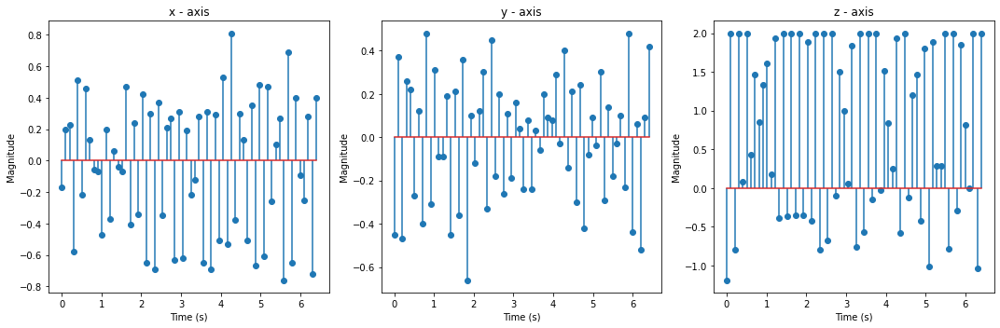

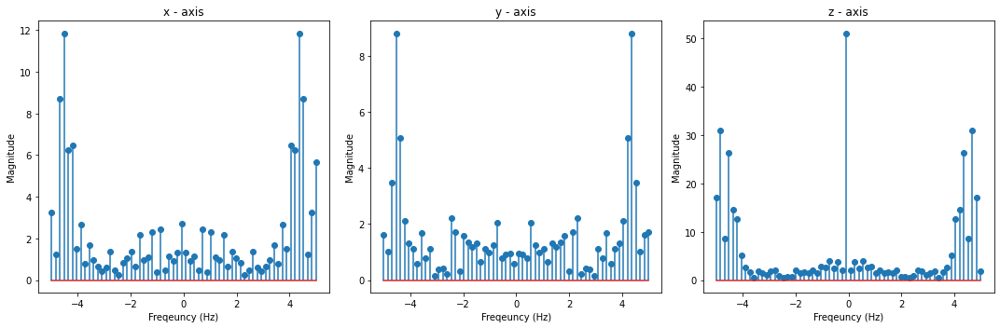

[-0.17, 0.2, 0.23, -0.58, 0.51, -0.22, 0.46, 0.13, -0.06, -0.07, -0.47, 0.2, -0.37, 0.06, -0.04, -0.07, 0.47, -0.41, 0.24, -0.34, 0.42, -0.65, 0.3, -0.69, 0.37, -0.35, 0.21, 0.27, -0.63, 0.31, -0.62, 0.19, -0.22, -0.12, 0.28, -0.65, 0.31, -0.69, 0.29, -0.51, 0.53, -0.53, 0.81, -0.38, 0.3, 0.13, -0.51, 0.35, -0.67, 0.48, -0.61, 0.47, -0.26, 0.1, 0.27, -0.76, 0.69, -0.65, 0.4, -0.09, -0.25, 0.28, -0.72, 0.4]
[-0.45, 0.37, -0.47, 0.26, 0.22, -0.27, 0.12, -0.4, 0.48, -0.31, 0.31, -0.09, -0.09, 0.19, -0.45, 0.21, -0.36, 0.36, -0.66, 0.1, -0.12, 0.12, 0.3, -0.33, 0.45, -0.18, 0.2, -0.26, 0.11, -0.19, 0.16, 0.04, -0.24, 0.08, -0.24, 0.03, -0.06, 0.2, 0.09, 0.08, 0.29, -0.03, 0.4, -0.14, 0.21, -0.3, 0.24, -0.42, -0.08, 0.09, -0.04, 0.3, -0.29, 0.14, -0.18, -0.03, 0.1, -0.23, 0.48, -0.44, 0.06, -0.52, 0.09, 0.42]
[1.15, 1.4, -0.73, 2.0, -0.47, 1.57, 0.45, 0.29, 2.0, -0.56, 2.0, -0.54, 2.0, 0.83, 0.61, 1.63, -0.82, 2.0, -0.61, 2.0, -0.64, 2.0, 0.01, 1.88, -0.05, 1.76, 0.78, -0.07, 2.0, -0.71, 2.

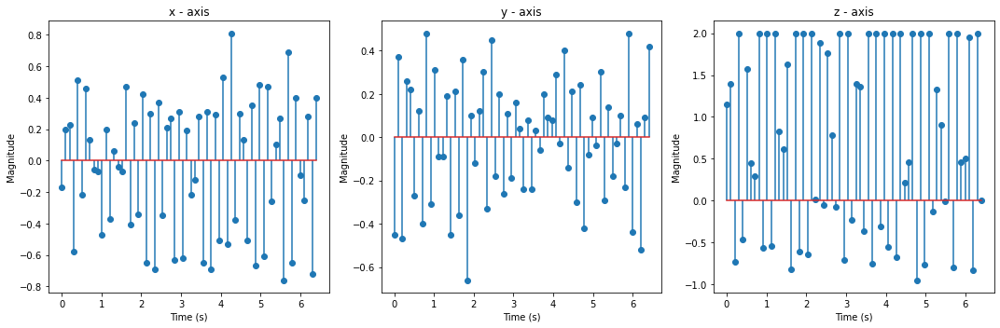

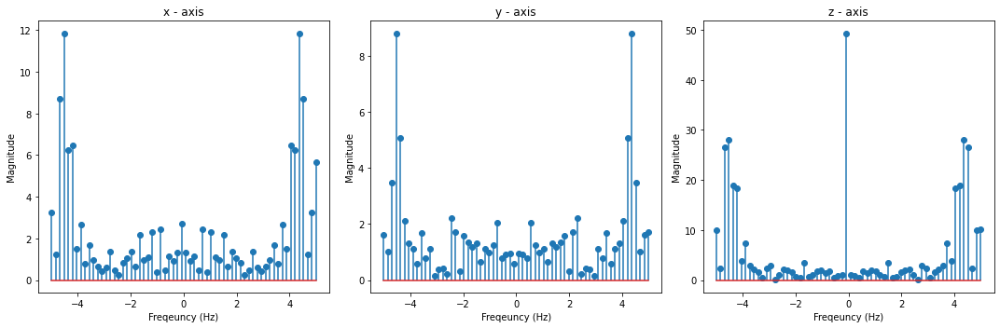

[-0.04, 0.22, -0.58, 0.32, -0.31, 0.39, 0.15, -0.46, 0.56, -0.68, 0.54, -0.11, 0.05, 0.53, -0.6, 0.37, -0.16, 0.07, 0.33, -0.42, 0.34, -0.08, -0.05, 0.34, -0.5, 0.27, -0.16, 0.18, 0.57, -0.69, 0.55, -0.35, -0.11, 0.49, -0.49, 0.24, -0.22, 0.05, 0.24, -0.46, 0.22, -0.12, -0.15, 0.24, -0.43, 0.21, 0.08, -0.21, 0.04, -0.26, -0.07, 0.41, -0.51, 0.03, 0.14, -0.46, 0.15, -0.25, 0.11, 0.1, -0.48, 0.2, -0.06, -0.19]
[-0.45, 0.37, -0.47, 0.26, 0.22, -0.27, 0.12, -0.4, 0.48, -0.31, 0.31, -0.09, -0.09, 0.19, -0.45, 0.21, -0.36, 0.36, -0.66, 0.1, -0.12, 0.12, 0.3, -0.33, 0.45, -0.18, 0.2, -0.26, 0.11, -0.19, 0.16, 0.04, -0.24, 0.08, -0.24, 0.03, -0.06, 0.2, 0.09, 0.08, 0.29, -0.03, 0.4, -0.14, 0.21, -0.3, 0.24, -0.42, -0.08, 0.09, -0.04, 0.3, -0.29, 0.14, -0.18, -0.03, 0.1, -0.23, 0.48, -0.44, 0.06, -0.52, 0.09, 0.42]
[1.15, 1.4, -0.73, 2.0, -0.47, 1.57, 0.45, 0.29, 2.0, -0.56, 2.0, -0.54, 2.0, 0.83, 0.61, 1.63, -0.82, 2.0, -0.61, 2.0, -0.64, 2.0, 0.01, 1.88, -0.05, 1.76, 0.78, -0.07, 2.0, -0.71, 

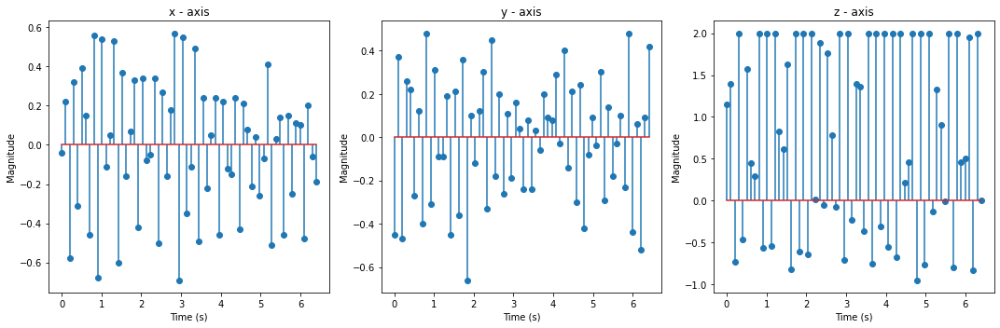

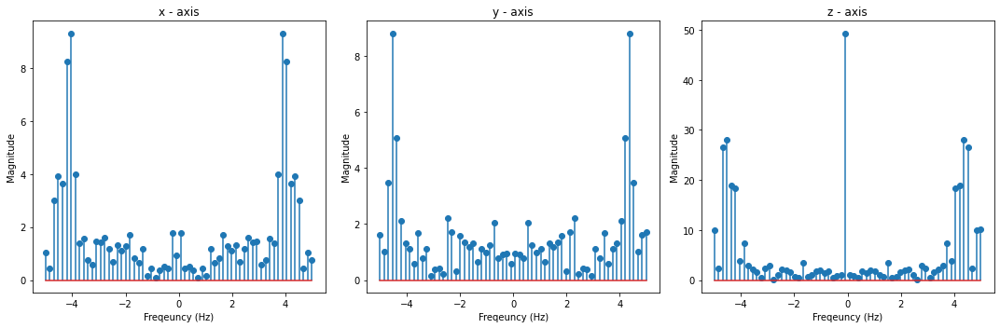

[-0.04, 0.22, -0.58, 0.32, -0.31, 0.39, 0.15, -0.46, 0.56, -0.68, 0.54, -0.11, 0.05, 0.53, -0.6, 0.37, -0.16, 0.07, 0.33, -0.42, 0.34, -0.08, -0.05, 0.34, -0.5, 0.27, -0.16, 0.18, 0.57, -0.69, 0.55, -0.35, -0.11, 0.49, -0.49, 0.24, -0.22, 0.05, 0.24, -0.46, 0.22, -0.12, -0.15, 0.24, -0.43, 0.21, 0.08, -0.21, 0.04, -0.26, -0.07, 0.41, -0.51, 0.03, 0.14, -0.46, 0.15, -0.25, 0.11, 0.1, -0.48, 0.2, -0.06, -0.19]
[0.13, -0.53, 0.52, -0.05, 0.1, 0.15, -0.36, 0.24, -0.05, 0.03, 0.42, -0.17, 0.18, -0.17, 0.01, 0.45, -0.28, 0.09, -0.42, -0.2, 0.41, -0.38, 0.44, -0.75, 0.26, 0.21, -0.16, 0.17, 0.04, -0.14, 0.26, -0.48, -0.1, -0.23, 0.29, 0.04, -0.04, 0.1, -0.08, 0.07, 0.16, -0.13, 0.08, -0.19, 0.23, 0.11, -0.09, 0.24, -0.16, 0.09, -0.06, -0.01, -0.03, 0.15, -0.19, 0.16, -0.1, -0.11, 0.11, -0.29, 0.23, 0.1, -0.24, 0.11]
[1.15, 1.4, -0.73, 2.0, -0.47, 1.57, 0.45, 0.29, 2.0, -0.56, 2.0, -0.54, 2.0, 0.83, 0.61, 1.63, -0.82, 2.0, -0.61, 2.0, -0.64, 2.0, 0.01, 1.88, -0.05, 1.76, 0.78, -0.07, 2.0, -0.7

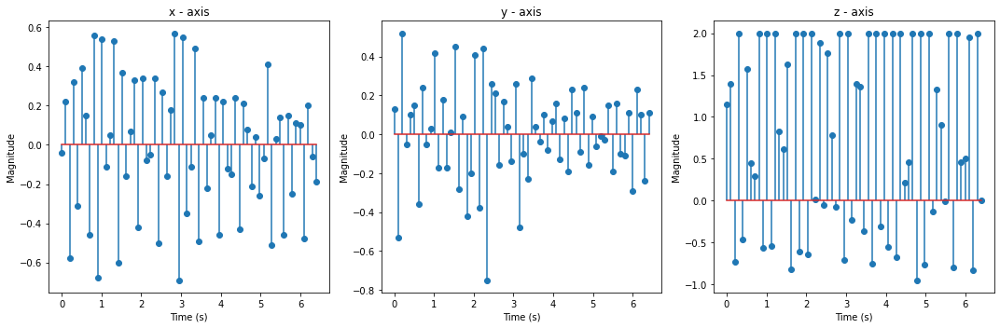

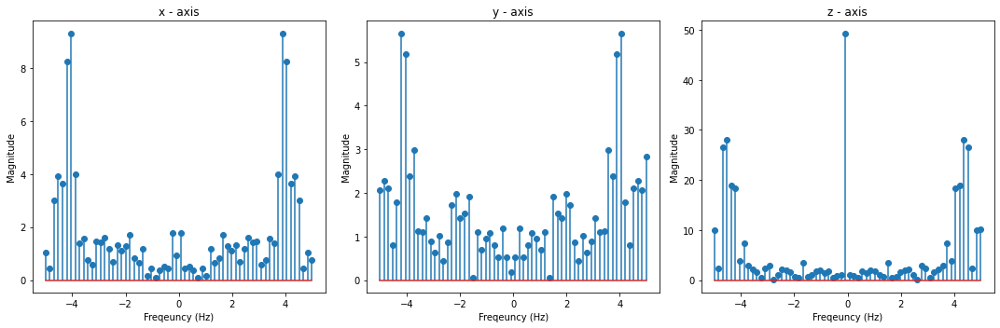

[-0.04, 0.22, -0.58, 0.32, -0.31, 0.39, 0.15, -0.46, 0.56, -0.68, 0.54, -0.11, 0.05, 0.53, -0.6, 0.37, -0.16, 0.07, 0.33, -0.42, 0.34, -0.08, -0.05, 0.34, -0.5, 0.27, -0.16, 0.18, 0.57, -0.69, 0.55, -0.35, -0.11, 0.49, -0.49, 0.24, -0.22, 0.05, 0.24, -0.46, 0.22, -0.12, -0.15, 0.24, -0.43, 0.21, 0.08, -0.21, 0.04, -0.26, -0.07, 0.41, -0.51, 0.03, 0.14, -0.46, 0.15, -0.25, 0.11, 0.1, -0.48, 0.2, -0.06, -0.19]
[0.13, -0.53, 0.52, -0.05, 0.1, 0.15, -0.36, 0.24, -0.05, 0.03, 0.42, -0.17, 0.18, -0.17, 0.01, 0.45, -0.28, 0.09, -0.42, -0.2, 0.41, -0.38, 0.44, -0.75, 0.26, 0.21, -0.16, 0.17, 0.04, -0.14, 0.26, -0.48, -0.1, -0.23, 0.29, 0.04, -0.04, 0.1, -0.08, 0.07, 0.16, -0.13, 0.08, -0.19, 0.23, 0.11, -0.09, 0.24, -0.16, 0.09, -0.06, -0.01, -0.03, 0.15, -0.19, 0.16, -0.1, -0.11, 0.11, -0.29, 0.23, 0.1, -0.24, 0.11]
[1.63, -0.78, 2.0, -0.64, 2.0, 0.27, 0.2, 2.0, -1.07, 2.0, -0.18, 1.69, 1.26, -0.76, 2.0, 0.03, 1.48, 1.18, -0.14, 2.0, -0.03, 0.91, 1.9, -0.78, 2.0, -0.17, 1.56, 0.73, -0.11, 2.0

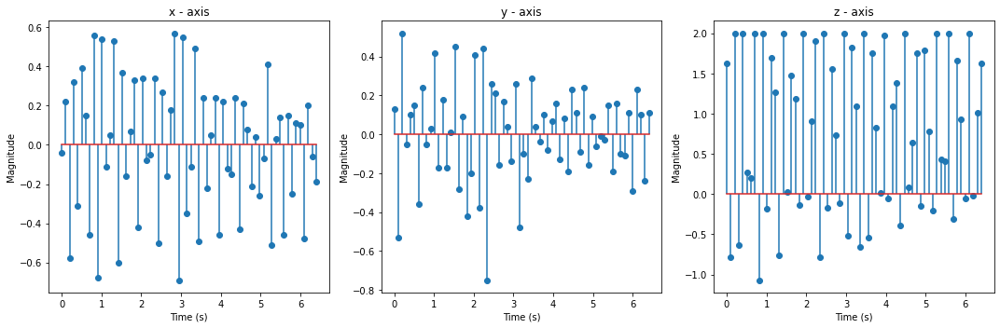

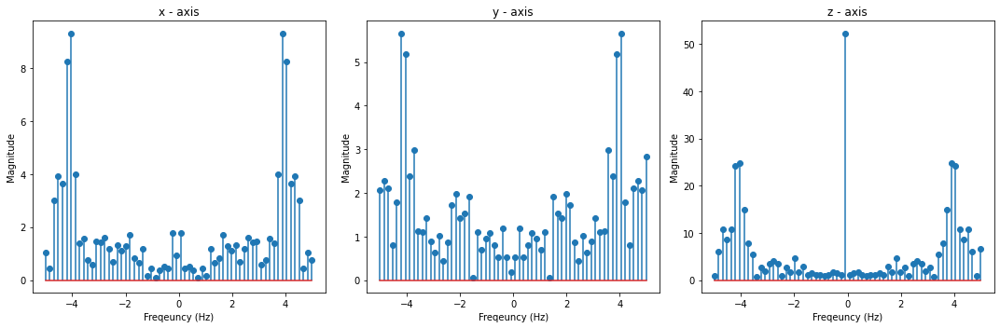

[-0.36, 0.07, 0.14, -0.48, 0.17, -0.22, -0.0, 0.27, -0.78, 0.33, 0.17, -0.23, 0.33, -0.51, 0.28, 0.17, -0.15, 0.57, -0.44, 0.2, 0.28, -0.58, 0.24, -0.3, 0.2, 0.04, -0.3, 0.18, 0.01, -0.02, 0.34, -0.49, 0.21, 0.27, -0.16, 0.45, -0.36, 0.13, 0.23, -0.51, 0.3, -0.06, 0.11, 0.08, -0.59, 0.14, -0.32, 0.32, 0.22, -0.51, 0.3, -0.36, 0.25, 0.23, -0.51, 0.31, -0.27, 0.2, 0.24, -0.45, 0.35, -0.31, 0.18, 0.25]
[0.13, -0.53, 0.52, -0.05, 0.1, 0.15, -0.36, 0.24, -0.05, 0.03, 0.42, -0.17, 0.18, -0.17, 0.01, 0.45, -0.28, 0.09, -0.42, -0.2, 0.41, -0.38, 0.44, -0.75, 0.26, 0.21, -0.16, 0.17, 0.04, -0.14, 0.26, -0.48, -0.1, -0.23, 0.29, 0.04, -0.04, 0.1, -0.08, 0.07, 0.16, -0.13, 0.08, -0.19, 0.23, 0.11, -0.09, 0.24, -0.16, 0.09, -0.06, -0.01, -0.03, 0.15, -0.19, 0.16, -0.1, -0.11, 0.11, -0.29, 0.23, 0.1, -0.24, 0.11]
[1.63, -0.78, 2.0, -0.64, 2.0, 0.27, 0.2, 2.0, -1.07, 2.0, -0.18, 1.69, 1.26, -0.76, 2.0, 0.03, 1.48, 1.18, -0.14, 2.0, -0.03, 0.91, 1.9, -0.78, 2.0, -0.17, 1.56, 0.73, -0.11, 2.0, -0.52, 

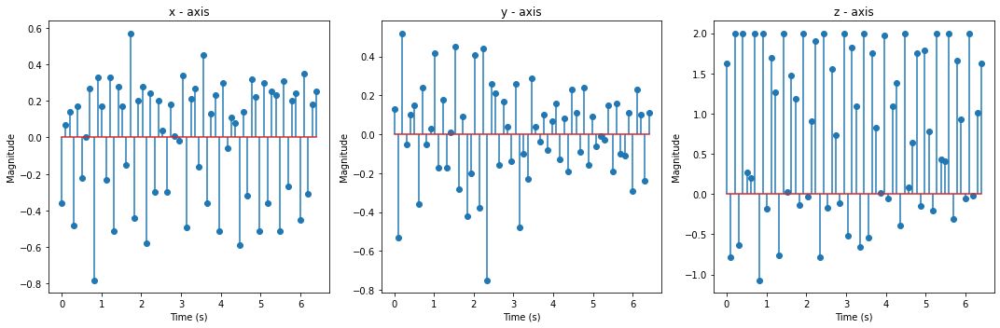

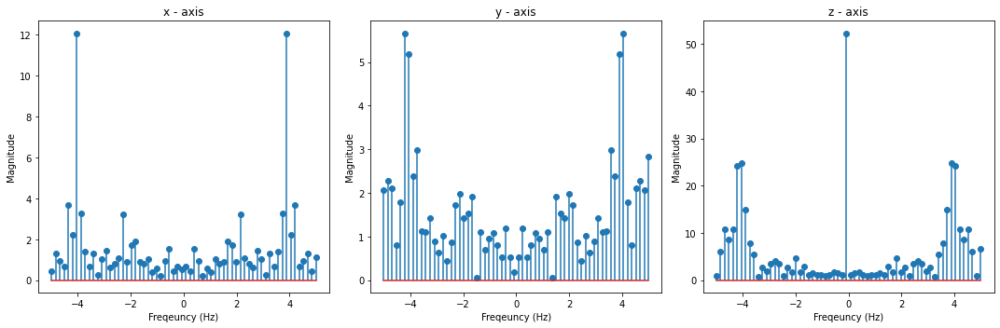

[-0.36, 0.07, 0.14, -0.48, 0.17, -0.22, -0.0, 0.27, -0.78, 0.33, 0.17, -0.23, 0.33, -0.51, 0.28, 0.17, -0.15, 0.57, -0.44, 0.2, 0.28, -0.58, 0.24, -0.3, 0.2, 0.04, -0.3, 0.18, 0.01, -0.02, 0.34, -0.49, 0.21, 0.27, -0.16, 0.45, -0.36, 0.13, 0.23, -0.51, 0.3, -0.06, 0.11, 0.08, -0.59, 0.14, -0.32, 0.32, 0.22, -0.51, 0.3, -0.36, 0.25, 0.23, -0.51, 0.31, -0.27, 0.2, 0.24, -0.45, 0.35, -0.31, 0.18, 0.25]
[0.13, 0.16, -0.2, 0.26, -0.18, -0.08, 0.05, -0.11, -0.06, 0.31, -0.12, 0.0, -0.18, 0.16, 0.28, -0.19, 0.03, 0.05, 0.06, 0.14, -0.16, 0.05, -0.08, 0.07, 0.21, -0.37, 0.35, 0.06, -0.22, 0.02, -0.33, 0.06, 0.22, -0.07, -0.01, -0.02, 0.01, 0.13, -0.26, -0.05, 0.14, 0.01, 0.21, -0.39, 0.27, -0.06, -0.05, 0.21, -0.26, 0.11, -0.04, -0.04, 0.2, -0.29, 0.31, 0.25, -0.24, 0.18, -0.13, -0.03, 0.09, -0.12, 0.28, -0.05]
[1.63, -0.78, 2.0, -0.64, 2.0, 0.27, 0.2, 2.0, -1.07, 2.0, -0.18, 1.69, 1.26, -0.76, 2.0, 0.03, 1.48, 1.18, -0.14, 2.0, -0.03, 0.91, 1.9, -0.78, 2.0, -0.17, 1.56, 0.73, -0.11, 2.0, -0.5

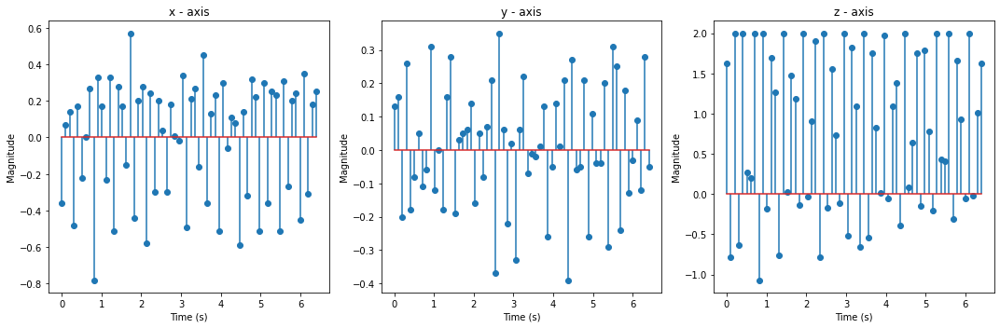

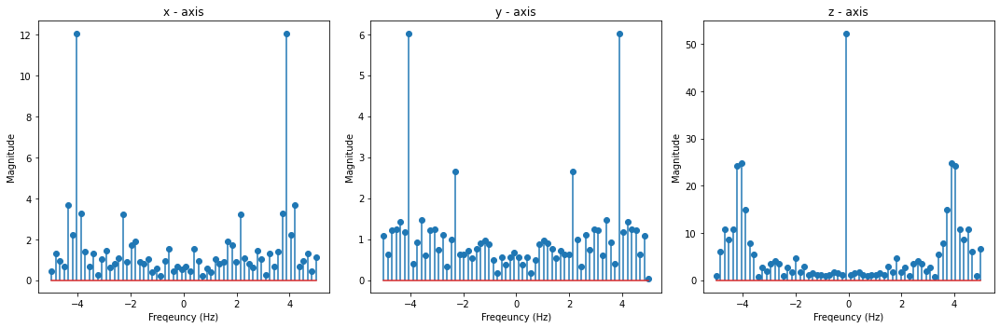

[-0.36, 0.07, 0.14, -0.48, 0.17, -0.22, -0.0, 0.27, -0.78, 0.33, 0.17, -0.23, 0.33, -0.51, 0.28, 0.17, -0.15, 0.57, -0.44, 0.2, 0.28, -0.58, 0.24, -0.3, 0.2, 0.04, -0.3, 0.18, 0.01, -0.02, 0.34, -0.49, 0.21, 0.27, -0.16, 0.45, -0.36, 0.13, 0.23, -0.51, 0.3, -0.06, 0.11, 0.08, -0.59, 0.14, -0.32, 0.32, 0.22, -0.51, 0.3, -0.36, 0.25, 0.23, -0.51, 0.31, -0.27, 0.2, 0.24, -0.45, 0.35, -0.31, 0.18, 0.25]
[0.13, 0.16, -0.2, 0.26, -0.18, -0.08, 0.05, -0.11, -0.06, 0.31, -0.12, 0.0, -0.18, 0.16, 0.28, -0.19, 0.03, 0.05, 0.06, 0.14, -0.16, 0.05, -0.08, 0.07, 0.21, -0.37, 0.35, 0.06, -0.22, 0.02, -0.33, 0.06, 0.22, -0.07, -0.01, -0.02, 0.01, 0.13, -0.26, -0.05, 0.14, 0.01, 0.21, -0.39, 0.27, -0.06, -0.05, 0.21, -0.26, 0.11, -0.04, -0.04, 0.2, -0.29, 0.31, 0.25, -0.24, 0.18, -0.13, -0.03, 0.09, -0.12, 0.28, -0.05]
[1.88, 0.49, 0.15, 2.0, -0.53, 1.73, 1.1, -0.29, 2.0, -0.14, 0.77, 1.67, -0.56, 2.0, 0.06, 0.61, 1.61, -0.55, 2.0, 0.4, 0.12, 2.0, -0.35, 2.0, 0.52, 0.17, 2.0, -0.09, 1.14, 1.31, -0.45,

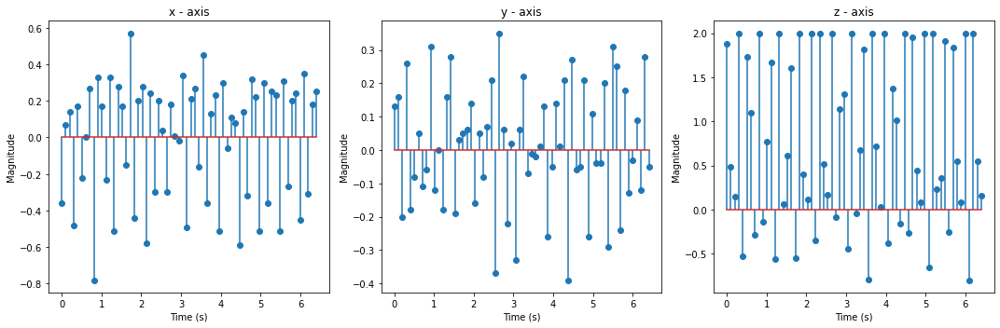

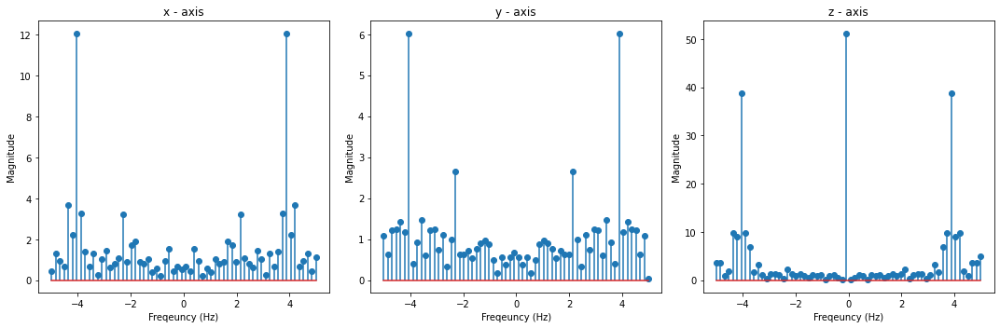

[0.24, 0.29, -0.01, -0.01, 0.28, -0.5, 0.39, -0.0, -0.2, 0.37, -0.43, 0.49, 0.25, -0.42, 0.2, 0.08, -0.18, 0.37, -0.42, 0.08, 0.05, -0.21, 0.31, -0.52, 0.11, -0.05, -0.48, 0.29, -0.44, 0.21, 0.12, -0.51, 0.37, -0.28, -0.08, 0.29, -0.52, 0.26, -0.07, -0.34, 0.22, -0.34, -0.09, 0.25, -0.7, 0.4, -0.57, -0.07, 0.06, -0.45, 0.29, -0.11, -0.16, 0.26, -0.58, 0.14, -0.1, -0.38, 0.45, -0.42, 0.09, 0.01, -0.19, 0.41]
[0.13, 0.16, -0.2, 0.26, -0.18, -0.08, 0.05, -0.11, -0.06, 0.31, -0.12, 0.0, -0.18, 0.16, 0.28, -0.19, 0.03, 0.05, 0.06, 0.14, -0.16, 0.05, -0.08, 0.07, 0.21, -0.37, 0.35, 0.06, -0.22, 0.02, -0.33, 0.06, 0.22, -0.07, -0.01, -0.02, 0.01, 0.13, -0.26, -0.05, 0.14, 0.01, 0.21, -0.39, 0.27, -0.06, -0.05, 0.21, -0.26, 0.11, -0.04, -0.04, 0.2, -0.29, 0.31, 0.25, -0.24, 0.18, -0.13, -0.03, 0.09, -0.12, 0.28, -0.05]
[1.88, 0.49, 0.15, 2.0, -0.53, 1.73, 1.1, -0.29, 2.0, -0.14, 0.77, 1.67, -0.56, 2.0, 0.06, 0.61, 1.61, -0.55, 2.0, 0.4, 0.12, 2.0, -0.35, 2.0, 0.52, 0.17, 2.0, -0.09, 1.14, 1.31

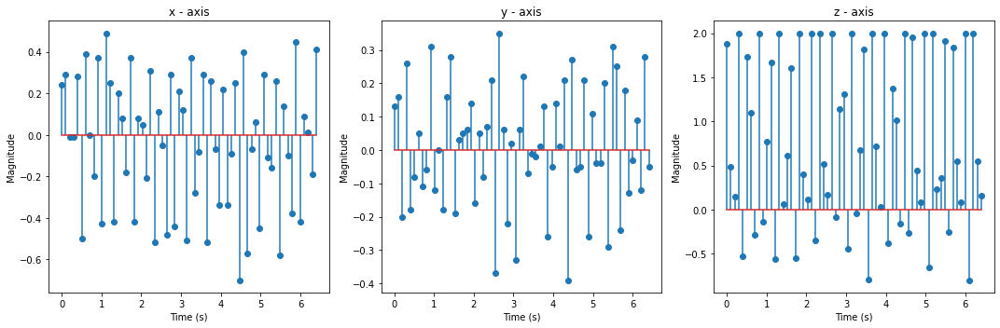

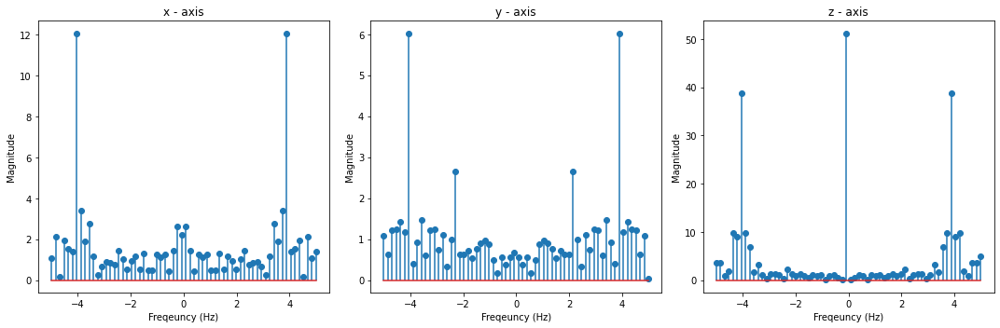

[0.24, 0.29, -0.01, -0.01, 0.28, -0.5, 0.39, -0.0, -0.2, 0.37, -0.43, 0.49, 0.25, -0.42, 0.2, 0.08, -0.18, 0.37, -0.42, 0.08, 0.05, -0.21, 0.31, -0.52, 0.11, -0.05, -0.48, 0.29, -0.44, 0.21, 0.12, -0.51, 0.37, -0.28, -0.08, 0.29, -0.52, 0.26, -0.07, -0.34, 0.22, -0.34, -0.09, 0.25, -0.7, 0.4, -0.57, -0.07, 0.06, -0.45, 0.29, -0.11, -0.16, 0.26, -0.58, 0.14, -0.1, -0.38, 0.45, -0.42, 0.09, 0.01, -0.19, 0.41]
[-0.06, 0.25, -0.17, 0.13, -0.32, 0.18, 0.08, -0.09, -0.2, -0.05, -0.24, 0.25, -0.24, 0.32, -0.06, -0.01, -0.12, 0.23, -0.12, 0.03, -0.13, 0.03, -0.23, 0.25, 0.11, -0.06, -0.13, -0.01, -0.1, 0.19, -0.21, 0.19, 0.19, -0.17, -0.05, -0.23, -0.11, 0.0, -0.24, 0.01, -0.16, -0.04, -0.26, -0.1, -0.05, 0.2, -0.16, -0.14, -0.2, 0.09, 0.18, -0.21, -0.2, -0.2, -0.0, 0.06, -0.27, -0.07, -0.16, 0.33, -0.12, -0.15, -0.18, 0.33]
[1.88, 0.49, 0.15, 2.0, -0.53, 1.73, 1.1, -0.29, 2.0, -0.14, 0.77, 1.67, -0.56, 2.0, 0.06, 0.61, 1.61, -0.55, 2.0, 0.4, 0.12, 2.0, -0.35, 2.0, 0.52, 0.17, 2.0, -0.09, 1.14

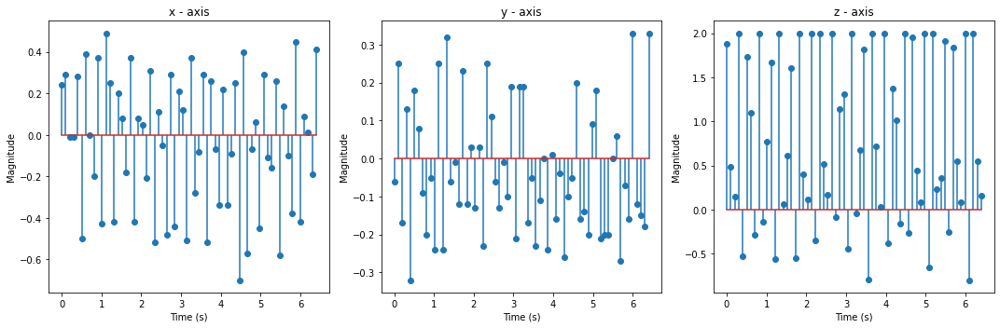

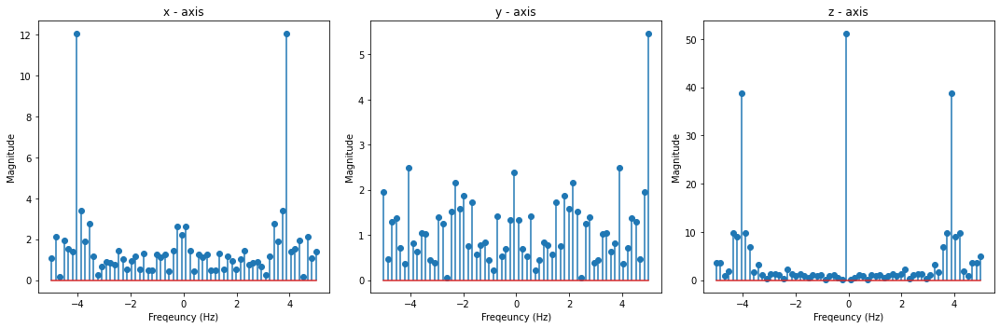

[0.24, 0.29, -0.01, -0.01, 0.28, -0.5, 0.39, -0.0, -0.2, 0.37, -0.43, 0.49, 0.25, -0.42, 0.2, 0.08, -0.18, 0.37, -0.42, 0.08, 0.05, -0.21, 0.31, -0.52, 0.11, -0.05, -0.48, 0.29, -0.44, 0.21, 0.12, -0.51, 0.37, -0.28, -0.08, 0.29, -0.52, 0.26, -0.07, -0.34, 0.22, -0.34, -0.09, 0.25, -0.7, 0.4, -0.57, -0.07, 0.06, -0.45, 0.29, -0.11, -0.16, 0.26, -0.58, 0.14, -0.1, -0.38, 0.45, -0.42, 0.09, 0.01, -0.19, 0.41]
[-0.06, 0.25, -0.17, 0.13, -0.32, 0.18, 0.08, -0.09, -0.2, -0.05, -0.24, 0.25, -0.24, 0.32, -0.06, -0.01, -0.12, 0.23, -0.12, 0.03, -0.13, 0.03, -0.23, 0.25, 0.11, -0.06, -0.13, -0.01, -0.1, 0.19, -0.21, 0.19, 0.19, -0.17, -0.05, -0.23, -0.11, 0.0, -0.24, 0.01, -0.16, -0.04, -0.26, -0.1, -0.05, 0.2, -0.16, -0.14, -0.2, 0.09, 0.18, -0.21, -0.2, -0.2, -0.0, 0.06, -0.27, -0.07, -0.16, 0.33, -0.12, -0.15, -0.18, 0.33]
[0.2, -0.43, 1.18, 1.36, -0.58, 2.0, -0.53, 1.04, 1.59, -0.53, 2.0, 0.15, 0.09, 2.0, -0.62, 1.39, 1.44, -0.29, 2.0, -0.12, 0.93, 1.75, -0.71, 2.0, -0.41, 1.01, 1.89, -0.71

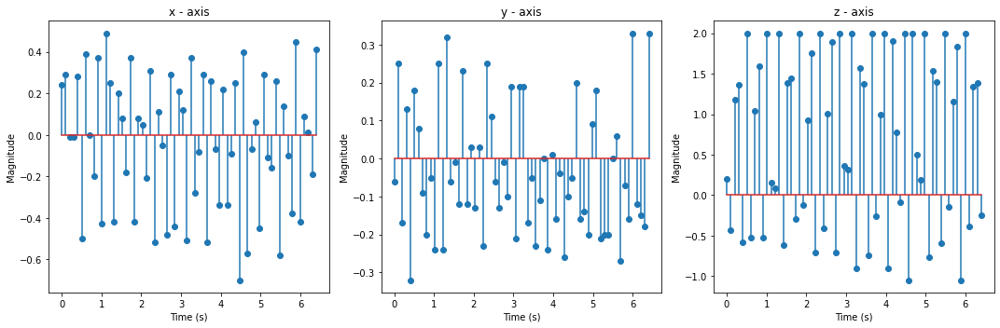

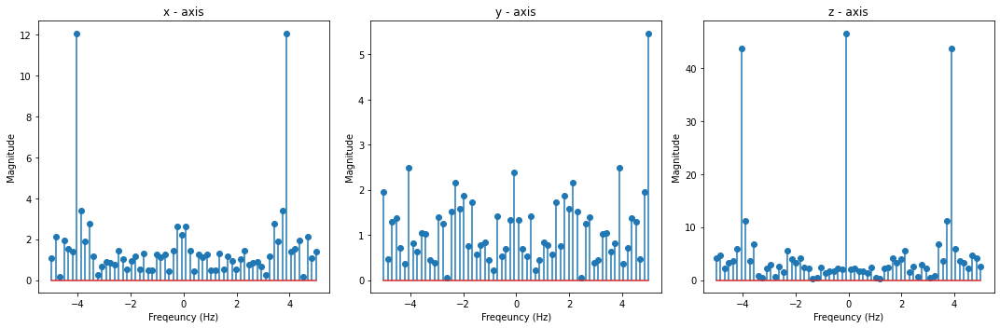

[0.33, -0.1, -0.26, 0.12, -0.3, 0.15, 0.04, -0.12, 0.26, -0.44, 0.23, -0.01, 0.07, 0.14, -0.27, 0.13, 0.01, -0.03, 0.25, -0.56, 0.2, -0.1, -0.16, 0.19, -0.67, 0.45, 0.13, -0.25, 0.47, -0.65, 0.41, -0.02, 0.04, 0.26, -0.33, 0.42, 0.04, -0.14, 0.2, -0.27, 0.18, 0.02, 0.06, 0.17, -0.36, 0.18, -0.38, 0.24, 0.14, 0.13, 0.03, -0.65, -0.08, 0.34, -0.35, 0.17, -0.16, 0.09, 0.11, -0.24, 0.0, 0.06, -0.17, 0.32]
[-0.06, 0.25, -0.17, 0.13, -0.32, 0.18, 0.08, -0.09, -0.2, -0.05, -0.24, 0.25, -0.24, 0.32, -0.06, -0.01, -0.12, 0.23, -0.12, 0.03, -0.13, 0.03, -0.23, 0.25, 0.11, -0.06, -0.13, -0.01, -0.1, 0.19, -0.21, 0.19, 0.19, -0.17, -0.05, -0.23, -0.11, 0.0, -0.24, 0.01, -0.16, -0.04, -0.26, -0.1, -0.05, 0.2, -0.16, -0.14, -0.2, 0.09, 0.18, -0.21, -0.2, -0.2, -0.0, 0.06, -0.27, -0.07, -0.16, 0.33, -0.12, -0.15, -0.18, 0.33]
[0.2, -0.43, 1.18, 1.36, -0.58, 2.0, -0.53, 1.04, 1.59, -0.53, 2.0, 0.15, 0.09, 2.0, -0.62, 1.39, 1.44, -0.29, 2.0, -0.12, 0.93, 1.75, -0.71, 2.0, -0.41, 1.01, 1.89, -0.71, 2.0,

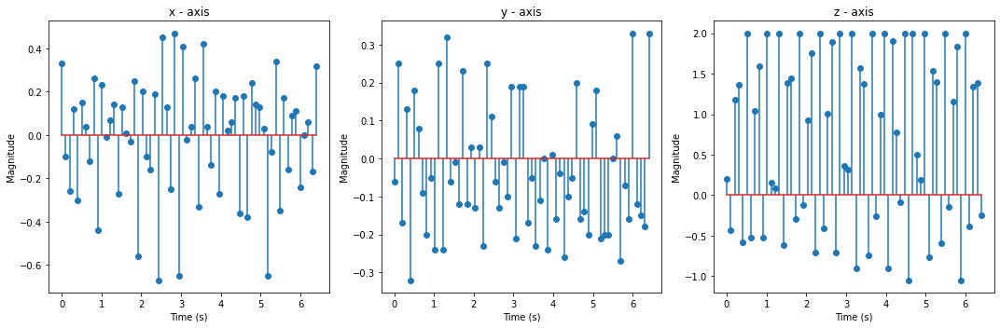

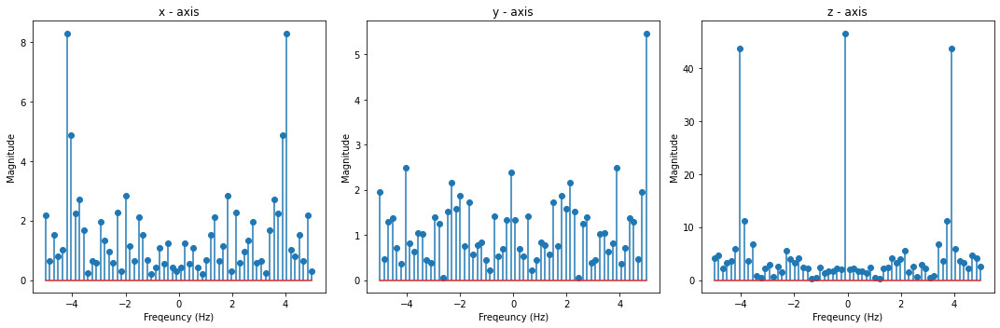

[0.33, -0.1, -0.26, 0.12, -0.3, 0.15, 0.04, -0.12, 0.26, -0.44, 0.23, -0.01, 0.07, 0.14, -0.27, 0.13, 0.01, -0.03, 0.25, -0.56, 0.2, -0.1, -0.16, 0.19, -0.67, 0.45, 0.13, -0.25, 0.47, -0.65, 0.41, -0.02, 0.04, 0.26, -0.33, 0.42, 0.04, -0.14, 0.2, -0.27, 0.18, 0.02, 0.06, 0.17, -0.36, 0.18, -0.38, 0.24, 0.14, 0.13, 0.03, -0.65, -0.08, 0.34, -0.35, 0.17, -0.16, 0.09, 0.11, -0.24, 0.0, 0.06, -0.17, 0.32]
[0.3, -0.35, 0.57, -0.03, 0.19, -0.03, -0.17, -0.12, 0.01, -0.09, 0.08, -0.19, 0.12, -0.43, 0.16, 0.1, -0.11, -0.04, -0.17, -0.23, 0.19, -0.25, -0.17, -0.38, 0.08, 0.3, -0.17, -0.26, -0.15, -0.03, 0.33, -0.13, -0.03, -0.27, -0.02, 0.23, -0.18, -0.16, -0.33, 0.16, -0.15, -0.12, -0.01, -0.28, 0.09, -0.17, -0.18, 0.25, -0.29, 0.32, -0.53, 1.98, -0.31, 0.18, -0.18, 0.24, -0.13, 0.03, -0.31, 0.27, -0.2, -0.04, -0.09, -0.37]
[0.2, -0.43, 1.18, 1.36, -0.58, 2.0, -0.53, 1.04, 1.59, -0.53, 2.0, 0.15, 0.09, 2.0, -0.62, 1.39, 1.44, -0.29, 2.0, -0.12, 0.93, 1.75, -0.71, 2.0, -0.41, 1.01, 1.89, -0.71,

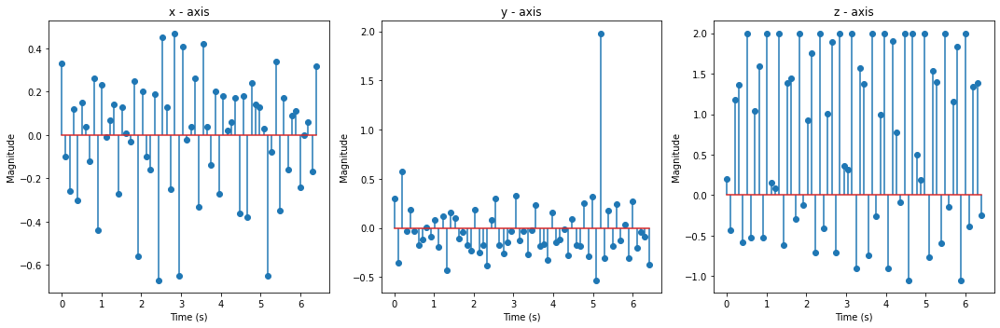

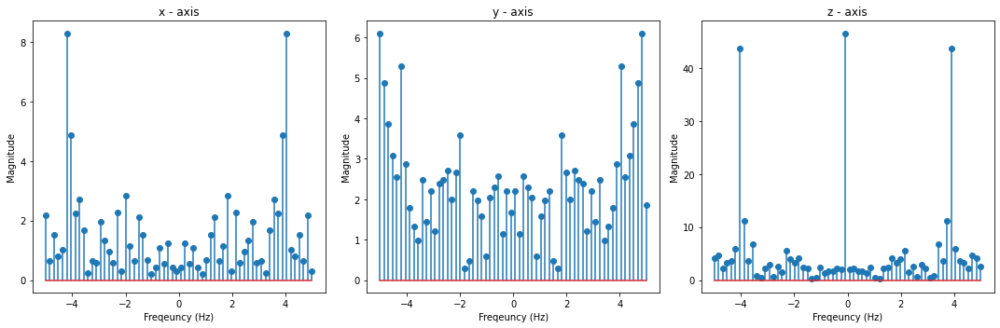

[0.33, -0.1, -0.26, 0.12, -0.3, 0.15, 0.04, -0.12, 0.26, -0.44, 0.23, -0.01, 0.07, 0.14, -0.27, 0.13, 0.01, -0.03, 0.25, -0.56, 0.2, -0.1, -0.16, 0.19, -0.67, 0.45, 0.13, -0.25, 0.47, -0.65, 0.41, -0.02, 0.04, 0.26, -0.33, 0.42, 0.04, -0.14, 0.2, -0.27, 0.18, 0.02, 0.06, 0.17, -0.36, 0.18, -0.38, 0.24, 0.14, 0.13, 0.03, -0.65, -0.08, 0.34, -0.35, 0.17, -0.16, 0.09, 0.11, -0.24, 0.0, 0.06, -0.17, 0.32]
[0.3, -0.35, 0.57, -0.03, 0.19, -0.03, -0.17, -0.12, 0.01, -0.09, 0.08, -0.19, 0.12, -0.43, 0.16, 0.1, -0.11, -0.04, -0.17, -0.23, 0.19, -0.25, -0.17, -0.38, 0.08, 0.3, -0.17, -0.26, -0.15, -0.03, 0.33, -0.13, -0.03, -0.27, -0.02, 0.23, -0.18, -0.16, -0.33, 0.16, -0.15, -0.12, -0.01, -0.28, 0.09, -0.17, -0.18, 0.25, -0.29, 0.32, -0.53, 1.98, -0.31, 0.18, -0.18, 0.24, -0.13, 0.03, -0.31, 0.27, -0.2, -0.04, -0.09, -0.37]
[-0.17, 0.88, 2.0, -0.77, 2.0, -0.09, 1.15, 1.29, -0.35, 2.0, -0.31, 1.18, 1.4, -0.61, 2.0, -0.0, 0.98, 1.26, -0.15, 2.0, -0.33, 1.52, 1.52, -0.41, 2.0, -0.35, 0.75, 1.79, 

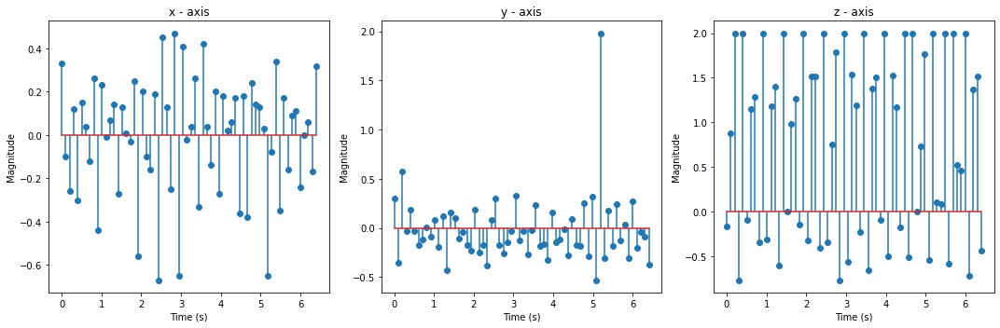

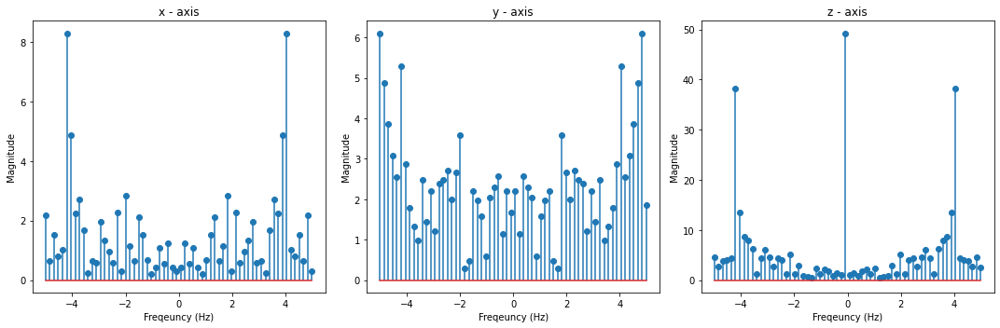

[0.27, -0.34, 0.19, 0.16, -0.17, 0.2, -0.24, 0.11, 0.16, -0.38, 0.33, -0.38, 0.2, 0.14, -0.18, 0.27, -0.38, 0.28, 0.22, -0.06, 0.33, -0.28, 0.18, 0.34, -0.51, 0.37, -0.13, 0.2, 0.09, -0.32, 0.09, -0.09, 0.03, 0.19, -0.25, 0.1, 0.11, -0.06, 0.18, -0.15, 0.05, 0.21, -0.42, 0.12, -0.04, 0.25, 0.07, -0.11, 0.18, 0.01, 0.01, 0.19, -0.21, 0.28, 0.13, 0.39, -0.08, 0.29, 0.18, -0.33, 0.32, -0.14, 0.29, 0.02]
[0.3, -0.35, 0.57, -0.03, 0.19, -0.03, -0.17, -0.12, 0.01, -0.09, 0.08, -0.19, 0.12, -0.43, 0.16, 0.1, -0.11, -0.04, -0.17, -0.23, 0.19, -0.25, -0.17, -0.38, 0.08, 0.3, -0.17, -0.26, -0.15, -0.03, 0.33, -0.13, -0.03, -0.27, -0.02, 0.23, -0.18, -0.16, -0.33, 0.16, -0.15, -0.12, -0.01, -0.28, 0.09, -0.17, -0.18, 0.25, -0.29, 0.32, -0.53, 1.98, -0.31, 0.18, -0.18, 0.24, -0.13, 0.03, -0.31, 0.27, -0.2, -0.04, -0.09, -0.37]
[-0.17, 0.88, 2.0, -0.77, 2.0, -0.09, 1.15, 1.29, -0.35, 2.0, -0.31, 1.18, 1.4, -0.61, 2.0, -0.0, 0.98, 1.26, -0.15, 2.0, -0.33, 1.52, 1.52, -0.41, 2.0, -0.35, 0.75, 1.79, -

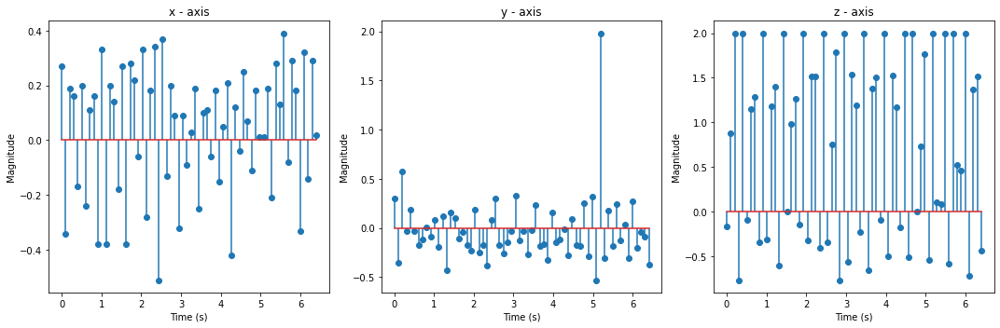

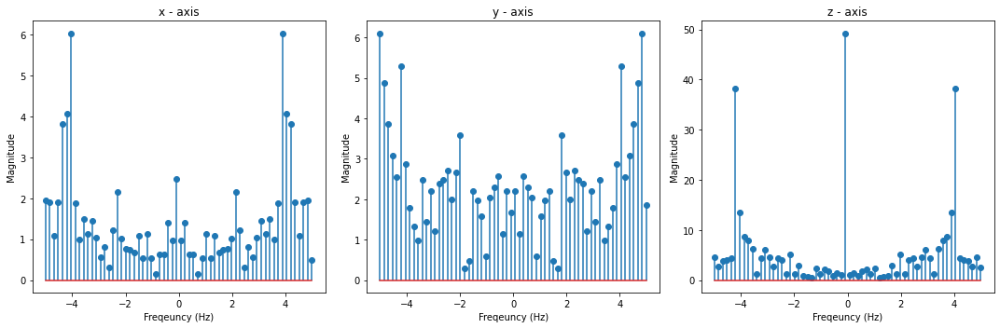

[0.27, -0.34, 0.19, 0.16, -0.17, 0.2, -0.24, 0.11, 0.16, -0.38, 0.33, -0.38, 0.2, 0.14, -0.18, 0.27, -0.38, 0.28, 0.22, -0.06, 0.33, -0.28, 0.18, 0.34, -0.51, 0.37, -0.13, 0.2, 0.09, -0.32, 0.09, -0.09, 0.03, 0.19, -0.25, 0.1, 0.11, -0.06, 0.18, -0.15, 0.05, 0.21, -0.42, 0.12, -0.04, 0.25, 0.07, -0.11, 0.18, 0.01, 0.01, 0.19, -0.21, 0.28, 0.13, 0.39, -0.08, 0.29, 0.18, -0.33, 0.32, -0.14, 0.29, 0.02]
[0.15, -0.3, 0.24, -0.43, 0.21, -0.57, 0.22, 0.01, -0.16, -0.13, 0.12, -0.2, 0.22, -0.28, -0.01, -0.19, -0.14, 0.29, -0.17, -0.1, 0.09, -0.33, 0.16, 0.01, -0.14, 0.27, -0.33, 0.18, -0.29, 0.21, 0.02, -0.26, -0.1, -0.33, 0.08, 0.01, -0.31, 0.0, 0.07, -0.17, -0.02, -0.18, 0.08, 0.1, -0.07, 0.13, -0.3, 0.2, -0.16, -0.04, -0.19, -0.1, -0.09, -0.04, -0.14, 0.14, -0.28, 0.21, -0.15, 0.06, 0.27, -0.31, 0.21, -0.3]
[-0.17, 0.88, 2.0, -0.77, 2.0, -0.09, 1.15, 1.29, -0.35, 2.0, -0.31, 1.18, 1.4, -0.61, 2.0, -0.0, 0.98, 1.26, -0.15, 2.0, -0.33, 1.52, 1.52, -0.41, 2.0, -0.35, 0.75, 1.79, -0.77, 2.0, -

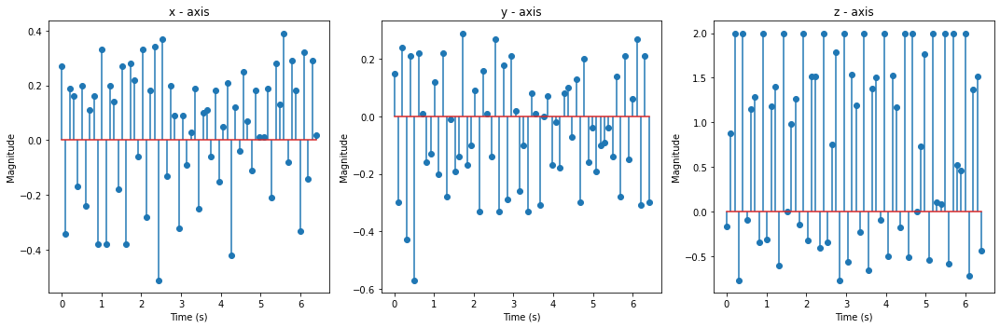

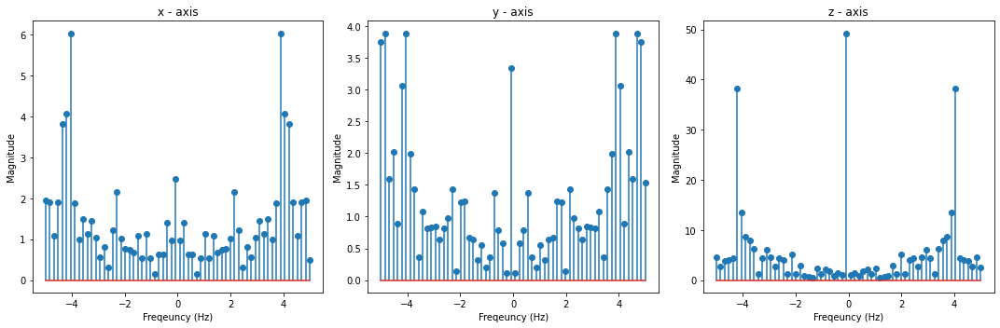

[0.27, -0.34, 0.19, 0.16, -0.17, 0.2, -0.24, 0.11, 0.16, -0.38, 0.33, -0.38, 0.2, 0.14, -0.18, 0.27, -0.38, 0.28, 0.22, -0.06, 0.33, -0.28, 0.18, 0.34, -0.51, 0.37, -0.13, 0.2, 0.09, -0.32, 0.09, -0.09, 0.03, 0.19, -0.25, 0.1, 0.11, -0.06, 0.18, -0.15, 0.05, 0.21, -0.42, 0.12, -0.04, 0.25, 0.07, -0.11, 0.18, 0.01, 0.01, 0.19, -0.21, 0.28, 0.13, 0.39, -0.08, 0.29, 0.18, -0.33, 0.32, -0.14, 0.29, 0.02]
[0.15, -0.3, 0.24, -0.43, 0.21, -0.57, 0.22, 0.01, -0.16, -0.13, 0.12, -0.2, 0.22, -0.28, -0.01, -0.19, -0.14, 0.29, -0.17, -0.1, 0.09, -0.33, 0.16, 0.01, -0.14, 0.27, -0.33, 0.18, -0.29, 0.21, 0.02, -0.26, -0.1, -0.33, 0.08, 0.01, -0.31, 0.0, 0.07, -0.17, -0.02, -0.18, 0.08, 0.1, -0.07, 0.13, -0.3, 0.2, -0.16, -0.04, -0.19, -0.1, -0.09, -0.04, -0.14, 0.14, -0.28, 0.21, -0.15, 0.06, 0.27, -0.31, 0.21, -0.3]
[-0.56, 1.96, 0.51, 0.24, 2.0, -0.97, 2.0, 0.15, 0.33, 2.0, -0.87, 2.0, 0.31, 0.54, 1.96, -0.81, 2.0, 0.25, 0.52, 1.65, -0.84, 1.96, 0.46, -0.25, 2.0, -0.8, 1.7, 1.0, -0.19, 2.0, -0.1, 

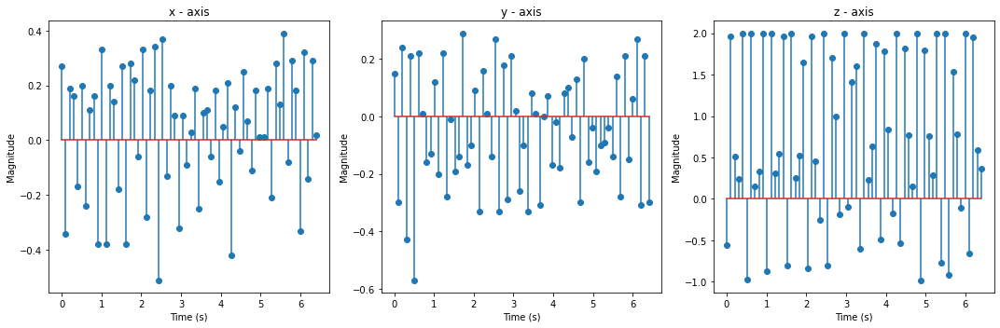

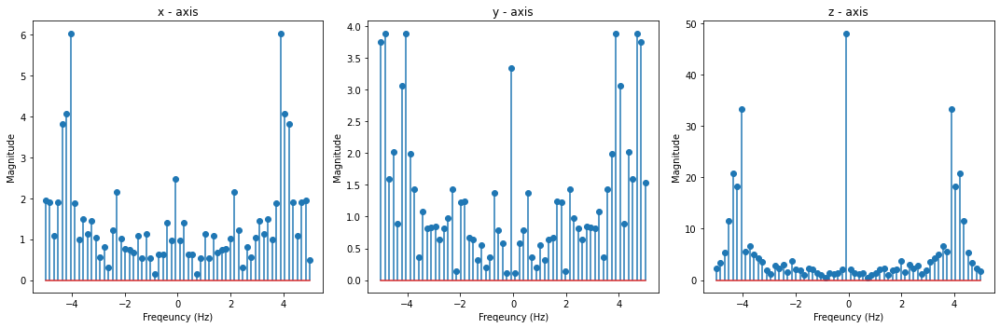

[0.02, 0.22, -0.39, 0.32, -0.36, 0.16, 0.12, -0.47, 0.26, -0.26, 0.2, 0.04, -0.12, 0.42, -0.35, 0.39, 0.1, 0.3, 0.13, -0.11, 0.23, 0.02, 0.13, 0.07, -0.11, 0.05, -0.28, 0.37, -0.37, 0.11, 0.07, -0.13, 0.15, -0.4, 0.12, -0.05, -0.31, 0.39, -0.6, 0.24, -0.02, -0.08, 0.2, -0.03, 0.14, -0.07, -0.11, 0.28, -0.55, 0.24, -0.04, -0.05, 0.19, -0.44, 0.21, 0.01, -0.09, 0.19, -0.31, 0.21, 0.06, -0.28, 0.35, -0.53]
[0.15, -0.3, 0.24, -0.43, 0.21, -0.57, 0.22, 0.01, -0.16, -0.13, 0.12, -0.2, 0.22, -0.28, -0.01, -0.19, -0.14, 0.29, -0.17, -0.1, 0.09, -0.33, 0.16, 0.01, -0.14, 0.27, -0.33, 0.18, -0.29, 0.21, 0.02, -0.26, -0.1, -0.33, 0.08, 0.01, -0.31, 0.0, 0.07, -0.17, -0.02, -0.18, 0.08, 0.1, -0.07, 0.13, -0.3, 0.2, -0.16, -0.04, -0.19, -0.1, -0.09, -0.04, -0.14, 0.14, -0.28, 0.21, -0.15, 0.06, 0.27, -0.31, 0.21, -0.3]
[-0.56, 1.96, 0.51, 0.24, 2.0, -0.97, 2.0, 0.15, 0.33, 2.0, -0.87, 2.0, 0.31, 0.54, 1.96, -0.81, 2.0, 0.25, 0.52, 1.65, -0.84, 1.96, 0.46, -0.25, 2.0, -0.8, 1.7, 1.0, -0.19, 2.0, -0.

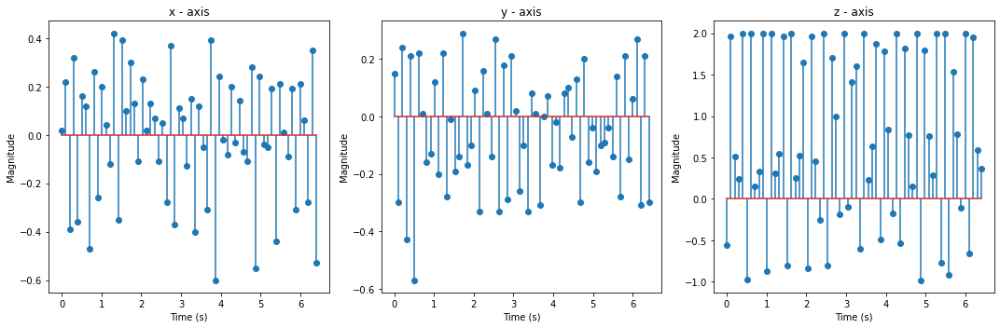

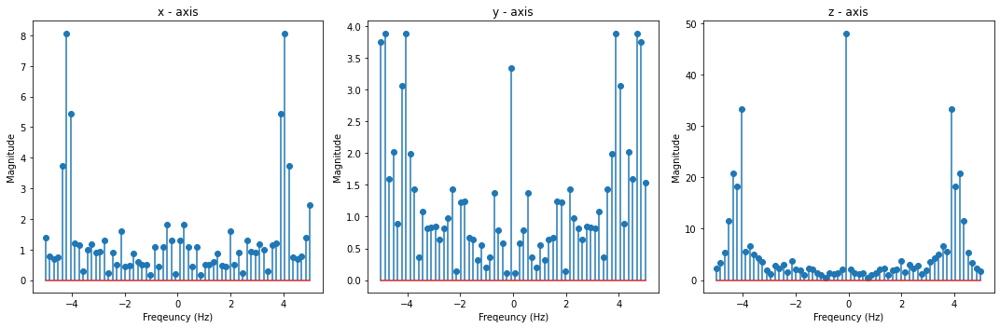

[0.02, 0.22, -0.39, 0.32, -0.36, 0.16, 0.12, -0.47, 0.26, -0.26, 0.2, 0.04, -0.12, 0.42, -0.35, 0.39, 0.1, 0.3, 0.13, -0.11, 0.23, 0.02, 0.13, 0.07, -0.11, 0.05, -0.28, 0.37, -0.37, 0.11, 0.07, -0.13, 0.15, -0.4, 0.12, -0.05, -0.31, 0.39, -0.6, 0.24, -0.02, -0.08, 0.2, -0.03, 0.14, -0.07, -0.11, 0.28, -0.55, 0.24, -0.04, -0.05, 0.19, -0.44, 0.21, 0.01, -0.09, 0.19, -0.31, 0.21, 0.06, -0.28, 0.35, -0.53]
[-0.31, -0.25, -0.32, 0.36, -0.65, 0.3, -0.43, 0.18, -0.03, -0.28, 0.3, -0.3, 0.13, -0.14, 0.03, 0.3, -0.26, 0.22, -0.35, 0.31, 0.07, -0.03, 0.01, -0.29, -0.07, -0.2, -0.08, 0.19, -0.14, 0.15, -0.15, 0.1, -0.37, 0.16, 0.08, -0.19, -0.3, 0.24, -0.2, 0.19, -0.28, 0.17, -0.48, -0.14, -0.0, -0.21, -0.05, -0.1, 0.09, 0.16, -0.23, -0.03, 0.06, -0.28, 0.34, -0.25, 0.12, -0.42, 0.12, 0.28, -0.04, -0.18, 0.23, -0.42]
[-0.56, 1.96, 0.51, 0.24, 2.0, -0.97, 2.0, 0.15, 0.33, 2.0, -0.87, 2.0, 0.31, 0.54, 1.96, -0.81, 2.0, 0.25, 0.52, 1.65, -0.84, 1.96, 0.46, -0.25, 2.0, -0.8, 1.7, 1.0, -0.19, 2.0, -0

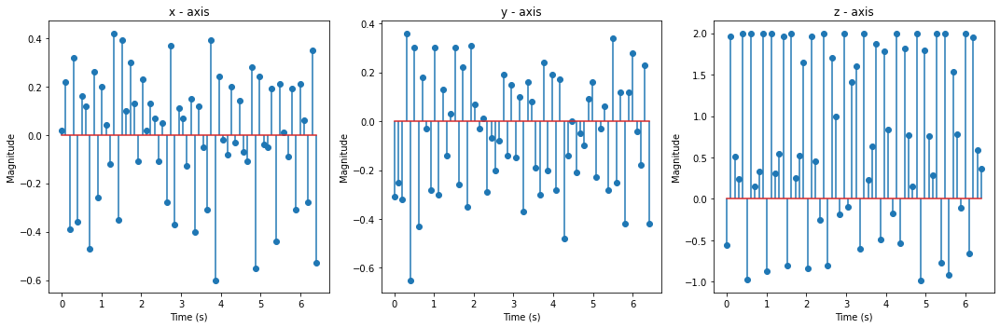

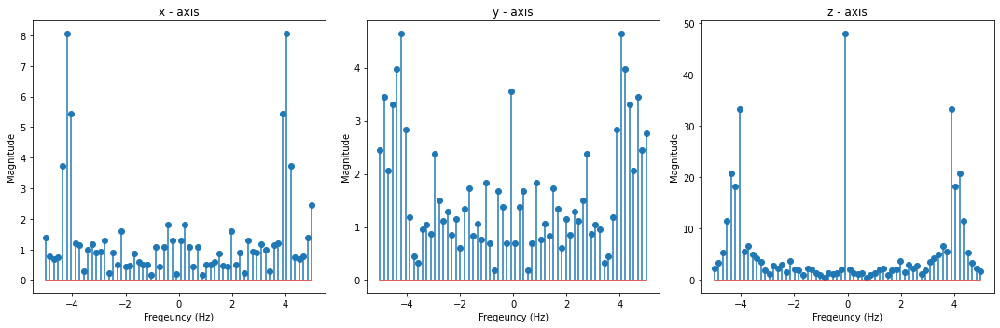

[0.02, 0.22, -0.39, 0.32, -0.36, 0.16, 0.12, -0.47, 0.26, -0.26, 0.2, 0.04, -0.12, 0.42, -0.35, 0.39, 0.1, 0.3, 0.13, -0.11, 0.23, 0.02, 0.13, 0.07, -0.11, 0.05, -0.28, 0.37, -0.37, 0.11, 0.07, -0.13, 0.15, -0.4, 0.12, -0.05, -0.31, 0.39, -0.6, 0.24, -0.02, -0.08, 0.2, -0.03, 0.14, -0.07, -0.11, 0.28, -0.55, 0.24, -0.04, -0.05, 0.19, -0.44, 0.21, 0.01, -0.09, 0.19, -0.31, 0.21, 0.06, -0.28, 0.35, -0.53]
[-0.31, -0.25, -0.32, 0.36, -0.65, 0.3, -0.43, 0.18, -0.03, -0.28, 0.3, -0.3, 0.13, -0.14, 0.03, 0.3, -0.26, 0.22, -0.35, 0.31, 0.07, -0.03, 0.01, -0.29, -0.07, -0.2, -0.08, 0.19, -0.14, 0.15, -0.15, 0.1, -0.37, 0.16, 0.08, -0.19, -0.3, 0.24, -0.2, 0.19, -0.28, 0.17, -0.48, -0.14, -0.0, -0.21, -0.05, -0.1, 0.09, 0.16, -0.23, -0.03, 0.06, -0.28, 0.34, -0.25, 0.12, -0.42, 0.12, 0.28, -0.04, -0.18, 0.23, -0.42]
[0.42, -0.65, 2.0, -0.05, 1.43, 1.25, -0.13, 2.0, -0.81, 1.64, 1.03, 0.33, 2.0, -0.9, 2.0, -0.67, 1.4, 0.79, 0.14, 2.0, -0.49, 1.8, 0.89, 0.6, 1.49, 0.26, 1.88, -0.52, 1.95, 0.26, 0

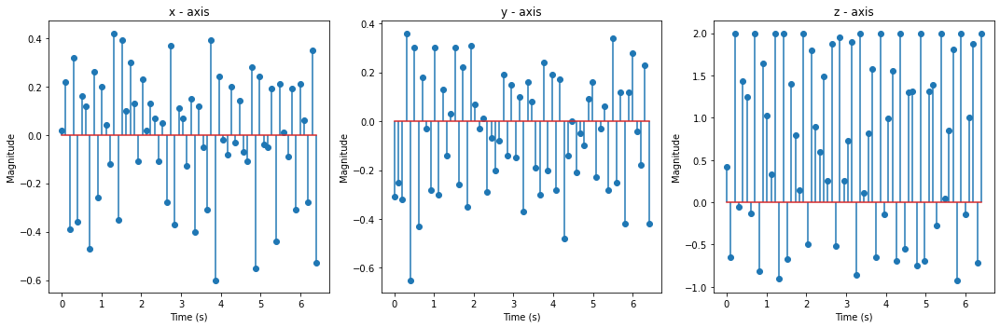

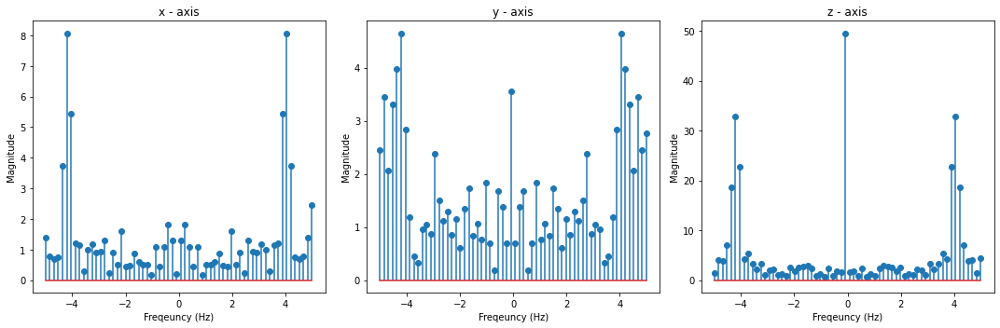

[-0.04, -0.0, 0.18, -0.41, 0.27, -0.14, 0.3, -0.03, -0.4, 0.2, -0.48, 0.32, -0.2, 0.14, 0.19, -0.55, 0.28, -0.21, 0.2, 0.27, -0.52, 0.35, -0.08, 0.11, 0.13, -0.1, 0.28, -0.36, 0.21, 0.08, 0.14, 0.19, -0.44, 0.39, -0.58, 0.21, 0.12, -0.42, 0.39, -0.47, 0.18, -0.02, -0.15, 0.25, -0.35, -0.06, 0.27, -0.39, 0.02, -0.18, -0.13, 0.2, -0.44, 0.27, -0.42, -0.02, 0.12, -0.64, -0.03, -0.26, 0.01, 0.34, -0.4, 0.08]
[-0.31, -0.25, -0.32, 0.36, -0.65, 0.3, -0.43, 0.18, -0.03, -0.28, 0.3, -0.3, 0.13, -0.14, 0.03, 0.3, -0.26, 0.22, -0.35, 0.31, 0.07, -0.03, 0.01, -0.29, -0.07, -0.2, -0.08, 0.19, -0.14, 0.15, -0.15, 0.1, -0.37, 0.16, 0.08, -0.19, -0.3, 0.24, -0.2, 0.19, -0.28, 0.17, -0.48, -0.14, -0.0, -0.21, -0.05, -0.1, 0.09, 0.16, -0.23, -0.03, 0.06, -0.28, 0.34, -0.25, 0.12, -0.42, 0.12, 0.28, -0.04, -0.18, 0.23, -0.42]
[0.42, -0.65, 2.0, -0.05, 1.43, 1.25, -0.13, 2.0, -0.81, 1.64, 1.03, 0.33, 2.0, -0.9, 2.0, -0.67, 1.4, 0.79, 0.14, 2.0, -0.49, 1.8, 0.89, 0.6, 1.49, 0.26, 1.88, -0.52, 1.95, 0.26, 

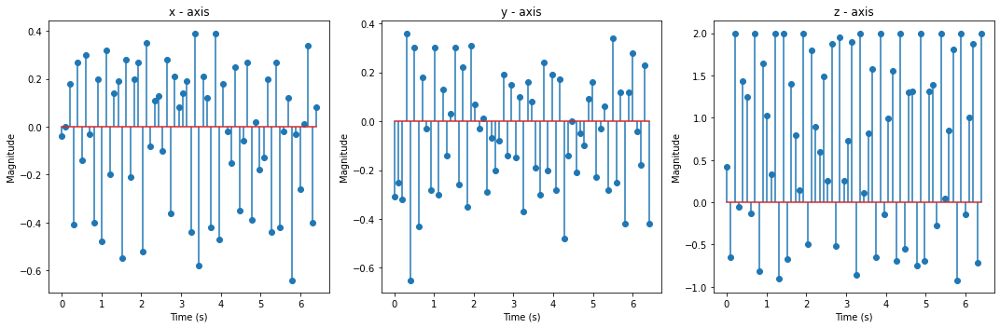

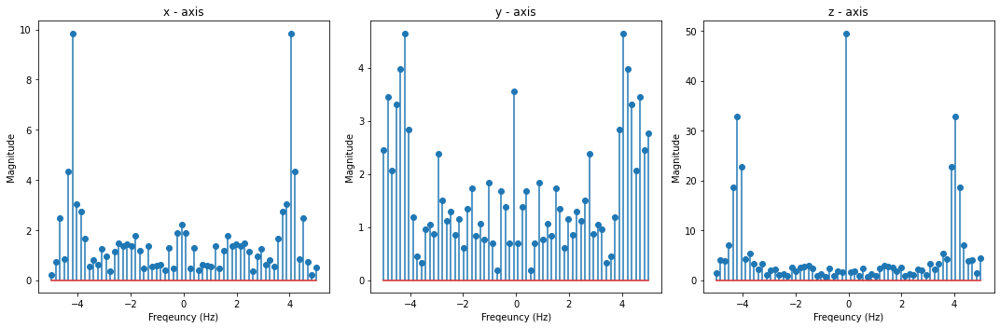

[-0.04, -0.0, 0.18, -0.41, 0.27, -0.14, 0.3, -0.03, -0.4, 0.2, -0.48, 0.32, -0.2, 0.14, 0.19, -0.55, 0.28, -0.21, 0.2, 0.27, -0.52, 0.35, -0.08, 0.11, 0.13, -0.1, 0.28, -0.36, 0.21, 0.08, 0.14, 0.19, -0.44, 0.39, -0.58, 0.21, 0.12, -0.42, 0.39, -0.47, 0.18, -0.02, -0.15, 0.25, -0.35, -0.06, 0.27, -0.39, 0.02, -0.18, -0.13, 0.2, -0.44, 0.27, -0.42, -0.02, 0.12, -0.64, -0.03, -0.26, 0.01, 0.34, -0.4, 0.08]
[-0.34, 0.04, -0.23, -0.12, 0.37, -0.3, 0.31, -0.29, -0.01, 0.04, -0.22, 0.61, -0.33, 0.16, -0.28, -0.08, 0.33, -0.39, 0.2, -0.32, -0.17, 0.47, -0.32, 0.1, -0.2, -0.2, 0.04, -0.36, 0.5, -0.49, 0.21, -0.35, -0.26, 0.45, -0.4, 0.33, -0.18, -0.1, 0.05, -0.32, 0.42, -0.39, 0.17, -0.07, -0.17, 0.13, 0.04, -0.33, 0.1, -0.14, -0.12, 0.6, -0.6, 0.61, -0.72, 0.32, 0.21, -0.59, 0.4, -0.4, 0.02, 0.39, -0.41, 0.39]
[0.42, -0.65, 2.0, -0.05, 1.43, 1.25, -0.13, 2.0, -0.81, 1.64, 1.03, 0.33, 2.0, -0.9, 2.0, -0.67, 1.4, 0.79, 0.14, 2.0, -0.49, 1.8, 0.89, 0.6, 1.49, 0.26, 1.88, -0.52, 1.95, 0.26, 0.73,

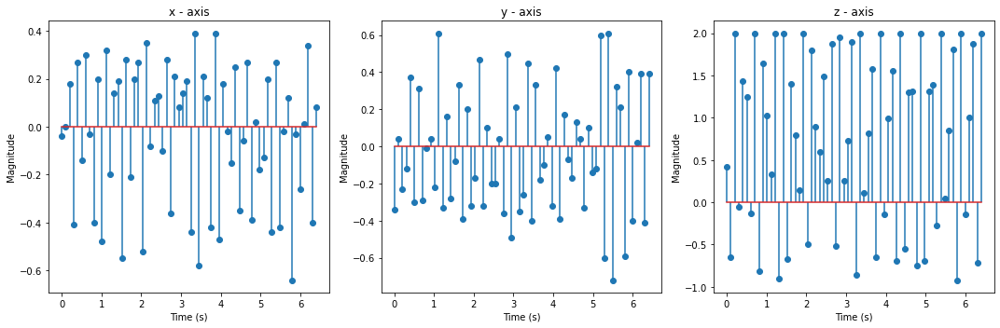

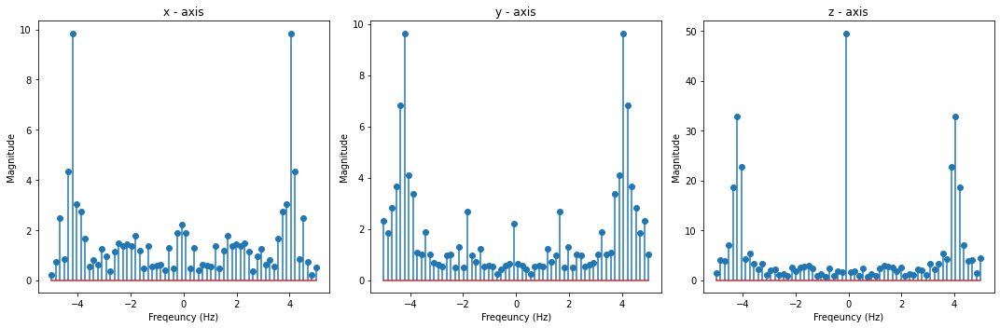

[-0.04, -0.0, 0.18, -0.41, 0.27, -0.14, 0.3, -0.03, -0.4, 0.2, -0.48, 0.32, -0.2, 0.14, 0.19, -0.55, 0.28, -0.21, 0.2, 0.27, -0.52, 0.35, -0.08, 0.11, 0.13, -0.1, 0.28, -0.36, 0.21, 0.08, 0.14, 0.19, -0.44, 0.39, -0.58, 0.21, 0.12, -0.42, 0.39, -0.47, 0.18, -0.02, -0.15, 0.25, -0.35, -0.06, 0.27, -0.39, 0.02, -0.18, -0.13, 0.2, -0.44, 0.27, -0.42, -0.02, 0.12, -0.64, -0.03, -0.26, 0.01, 0.34, -0.4, 0.08]
[-0.34, 0.04, -0.23, -0.12, 0.37, -0.3, 0.31, -0.29, -0.01, 0.04, -0.22, 0.61, -0.33, 0.16, -0.28, -0.08, 0.33, -0.39, 0.2, -0.32, -0.17, 0.47, -0.32, 0.1, -0.2, -0.2, 0.04, -0.36, 0.5, -0.49, 0.21, -0.35, -0.26, 0.45, -0.4, 0.33, -0.18, -0.1, 0.05, -0.32, 0.42, -0.39, 0.17, -0.07, -0.17, 0.13, 0.04, -0.33, 0.1, -0.14, -0.12, 0.6, -0.6, 0.61, -0.72, 0.32, 0.21, -0.59, 0.4, -0.4, 0.02, 0.39, -0.41, 0.39]
[1.01, 1.59, -0.61, 2.0, -0.21, 1.74, 0.55, 0.27, 2.0, -0.62, 2.0, -0.37, 1.74, 0.95, -0.46, 2.0, -0.67, 1.81, 1.04, -0.65, 2.0, -0.4, 1.38, 0.72, 0.83, 1.49, -0.82, 2.0, 0.45, 1.03, 1.

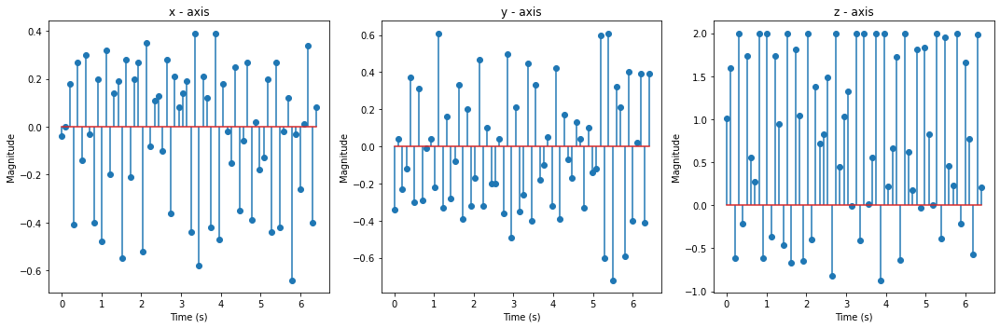

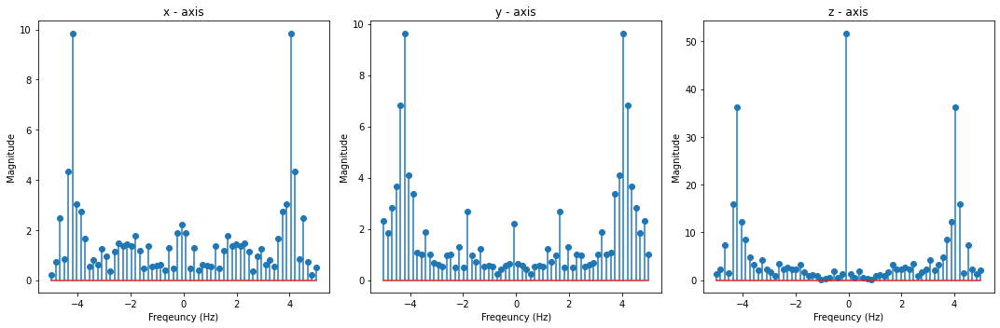

[-0.57, 0.04, -0.37, -0.08, -0.03, -0.38, 0.1, -0.23, 0.07, -0.24, 0.13, -0.25, 0.31, -0.42, 0.25, -0.46, -0.0, -0.22, -0.09, 0.21, -0.43, 0.08, -0.47, 0.0, 0.18, -0.38, 0.17, -0.46, -0.02, -0.09, -0.33, 0.22, -0.8, 0.09, -0.51, -0.01, -0.15, -0.32, 0.21, -0.86, 0.2, -0.37, -0.26, 0.27, -0.55, 0.25, -0.85, 0.17, -0.21, -0.25, 0.37, -0.76, 0.16, -0.09, -0.31, 0.3, -1.11, 0.1, 0.07, -0.25, 0.29, -0.75, 0.1, -0.11]
[-0.34, 0.04, -0.23, -0.12, 0.37, -0.3, 0.31, -0.29, -0.01, 0.04, -0.22, 0.61, -0.33, 0.16, -0.28, -0.08, 0.33, -0.39, 0.2, -0.32, -0.17, 0.47, -0.32, 0.1, -0.2, -0.2, 0.04, -0.36, 0.5, -0.49, 0.21, -0.35, -0.26, 0.45, -0.4, 0.33, -0.18, -0.1, 0.05, -0.32, 0.42, -0.39, 0.17, -0.07, -0.17, 0.13, 0.04, -0.33, 0.1, -0.14, -0.12, 0.6, -0.6, 0.61, -0.72, 0.32, 0.21, -0.59, 0.4, -0.4, 0.02, 0.39, -0.41, 0.39]
[1.01, 1.59, -0.61, 2.0, -0.21, 1.74, 0.55, 0.27, 2.0, -0.62, 2.0, -0.37, 1.74, 0.95, -0.46, 2.0, -0.67, 1.81, 1.04, -0.65, 2.0, -0.4, 1.38, 0.72, 0.83, 1.49, -0.82, 2.0, 0.45, 

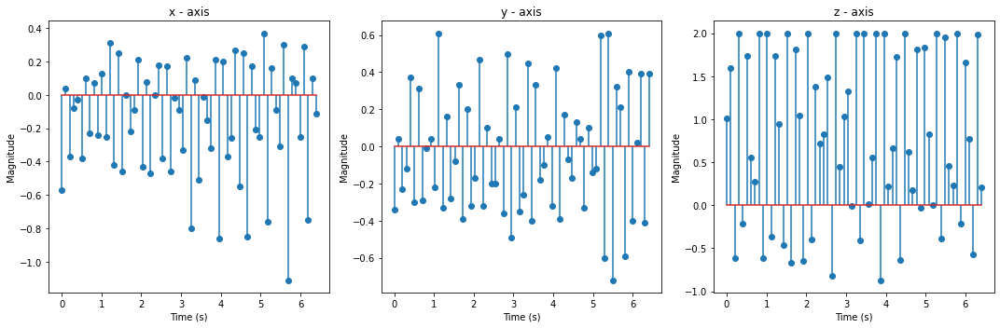

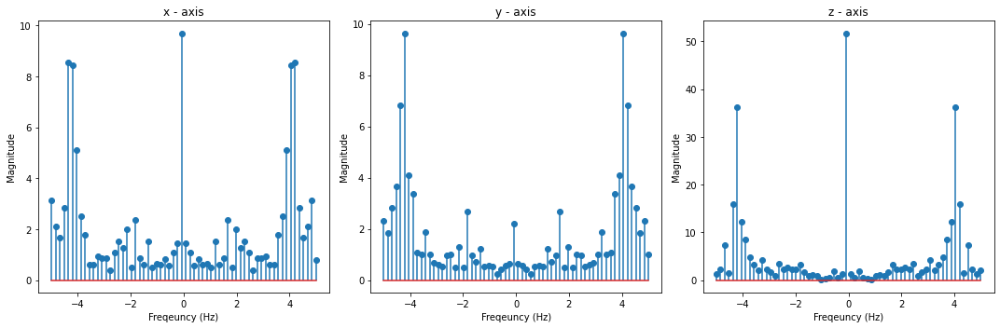

[-0.57, 0.04, -0.37, -0.08, -0.03, -0.38, 0.1, -0.23, 0.07, -0.24, 0.13, -0.25, 0.31, -0.42, 0.25, -0.46, -0.0, -0.22, -0.09, 0.21, -0.43, 0.08, -0.47, 0.0, 0.18, -0.38, 0.17, -0.46, -0.02, -0.09, -0.33, 0.22, -0.8, 0.09, -0.51, -0.01, -0.15, -0.32, 0.21, -0.86, 0.2, -0.37, -0.26, 0.27, -0.55, 0.25, -0.85, 0.17, -0.21, -0.25, 0.37, -0.76, 0.16, -0.09, -0.31, 0.3, -1.11, 0.1, 0.07, -0.25, 0.29, -0.75, 0.1, -0.11]
[-0.26, 0.33, -0.33, 0.15, 0.26, 0.06, 0.29, 0.04, -0.02, -0.01, 0.08, -0.03, -0.1, -0.01, 0.06, 0.13, -0.09, 0.09, -0.25, 0.05, 0.34, 0.11, 0.1, -0.09, 0.09, 0.34, 0.17, -0.23, 0.16, 0.05, -0.13, 0.37, -0.08, 0.13, -0.22, 0.02, 0.16, -0.2, 0.32, -0.07, 0.37, -0.12, -0.13, 0.35, -0.21, 0.46, -0.48, 0.27, -0.29, -0.16, 0.43, -0.27, 0.36, -0.2, -0.12, 0.37, -0.16, 0.14, -0.12, -0.06, 0.35, 0.14, 0.22, -0.22]
[1.01, 1.59, -0.61, 2.0, -0.21, 1.74, 0.55, 0.27, 2.0, -0.62, 2.0, -0.37, 1.74, 0.95, -0.46, 2.0, -0.67, 1.81, 1.04, -0.65, 2.0, -0.4, 1.38, 0.72, 0.83, 1.49, -0.82, 2.0, 0.4

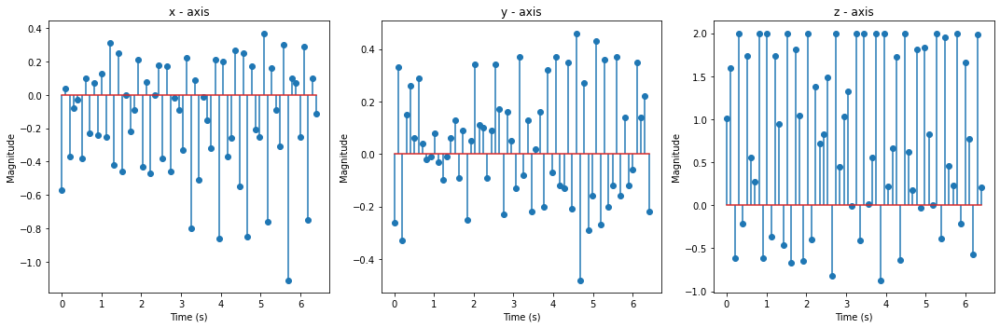

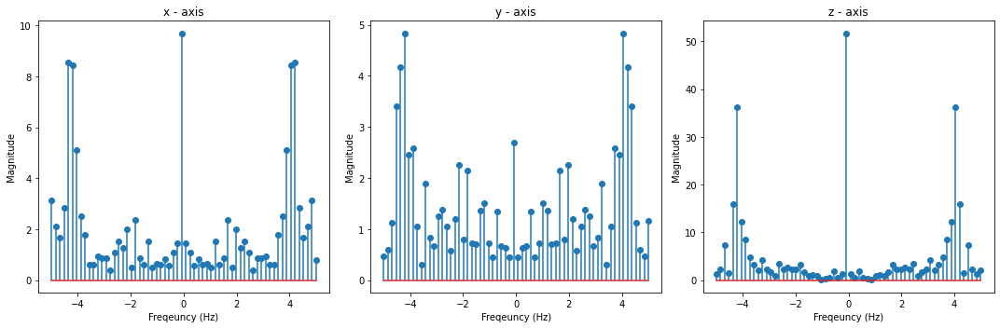

[-0.57, 0.04, -0.37, -0.08, -0.03, -0.38, 0.1, -0.23, 0.07, -0.24, 0.13, -0.25, 0.31, -0.42, 0.25, -0.46, -0.0, -0.22, -0.09, 0.21, -0.43, 0.08, -0.47, 0.0, 0.18, -0.38, 0.17, -0.46, -0.02, -0.09, -0.33, 0.22, -0.8, 0.09, -0.51, -0.01, -0.15, -0.32, 0.21, -0.86, 0.2, -0.37, -0.26, 0.27, -0.55, 0.25, -0.85, 0.17, -0.21, -0.25, 0.37, -0.76, 0.16, -0.09, -0.31, 0.3, -1.11, 0.1, 0.07, -0.25, 0.29, -0.75, 0.1, -0.11]
[-0.26, 0.33, -0.33, 0.15, 0.26, 0.06, 0.29, 0.04, -0.02, -0.01, 0.08, -0.03, -0.1, -0.01, 0.06, 0.13, -0.09, 0.09, -0.25, 0.05, 0.34, 0.11, 0.1, -0.09, 0.09, 0.34, 0.17, -0.23, 0.16, 0.05, -0.13, 0.37, -0.08, 0.13, -0.22, 0.02, 0.16, -0.2, 0.32, -0.07, 0.37, -0.12, -0.13, 0.35, -0.21, 0.46, -0.48, 0.27, -0.29, -0.16, 0.43, -0.27, 0.36, -0.2, -0.12, 0.37, -0.16, 0.14, -0.12, -0.06, 0.35, 0.14, 0.22, -0.22]
[1.99, -0.31, 1.84, 0.46, 0.66, 0.83, 0.92, 1.27, 0.16, 1.55, 0.26, 1.77, -0.58, 2.0, -0.19, 2.0, 0.18, 1.64, 0.23, -0.37, 2.0, 0.02, 2.0, -0.03, 0.17, 1.23, -0.31, 2.0, 0.28

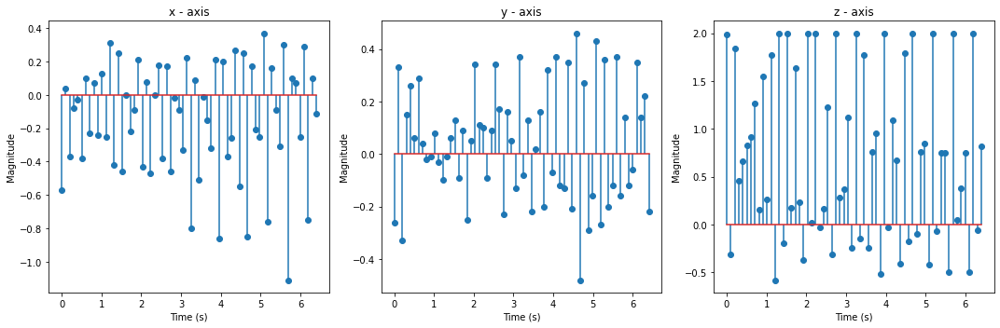

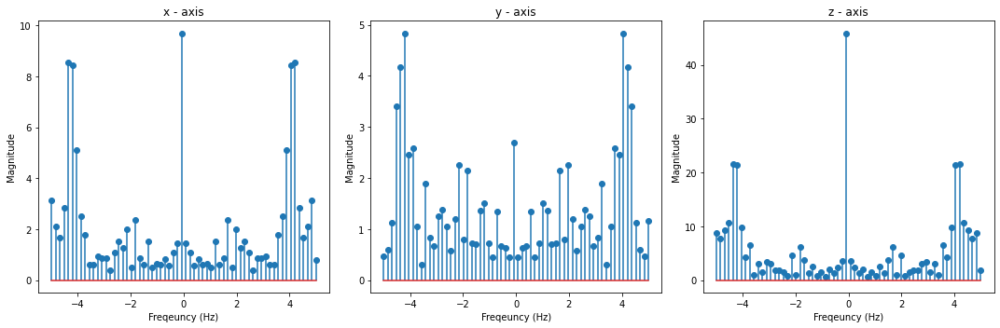

[0.2, -0.68, 0.2, -0.3, -0.09, 0.23, -0.64, 0.2, -0.26, -0.11, 0.11, -0.47, 0.29, -0.52, 0.05, 0.05, -0.12, 0.17, -0.59, 0.14, -0.09, -0.13, 0.2, -0.59, 0.12, -0.38, -0.08, 0.05, -0.47, 0.19, -0.43, -0.09, 0.22, -0.51, 0.18, -0.55, 0.08, -0.24, -0.03, 0.18, -0.55, 0.21, -0.35, -0.1, 0.03, -0.28, 0.23, -0.65, 0.2, -0.24, -0.13, 0.19, -0.51, 0.19, -0.46, 0.04, 0.15, -0.42, 0.23, -0.47, -0.04, -0.07, -0.15, -0.07]
[-0.26, 0.33, -0.33, 0.15, 0.26, 0.06, 0.29, 0.04, -0.02, -0.01, 0.08, -0.03, -0.1, -0.01, 0.06, 0.13, -0.09, 0.09, -0.25, 0.05, 0.34, 0.11, 0.1, -0.09, 0.09, 0.34, 0.17, -0.23, 0.16, 0.05, -0.13, 0.37, -0.08, 0.13, -0.22, 0.02, 0.16, -0.2, 0.32, -0.07, 0.37, -0.12, -0.13, 0.35, -0.21, 0.46, -0.48, 0.27, -0.29, -0.16, 0.43, -0.27, 0.36, -0.2, -0.12, 0.37, -0.16, 0.14, -0.12, -0.06, 0.35, 0.14, 0.22, -0.22]
[1.99, -0.31, 1.84, 0.46, 0.66, 0.83, 0.92, 1.27, 0.16, 1.55, 0.26, 1.77, -0.58, 2.0, -0.19, 2.0, 0.18, 1.64, 0.23, -0.37, 2.0, 0.02, 2.0, -0.03, 0.17, 1.23, -0.31, 2.0, 0.28,

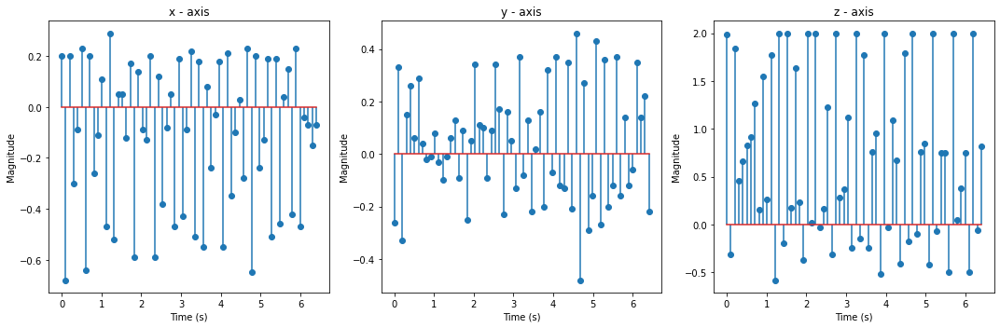

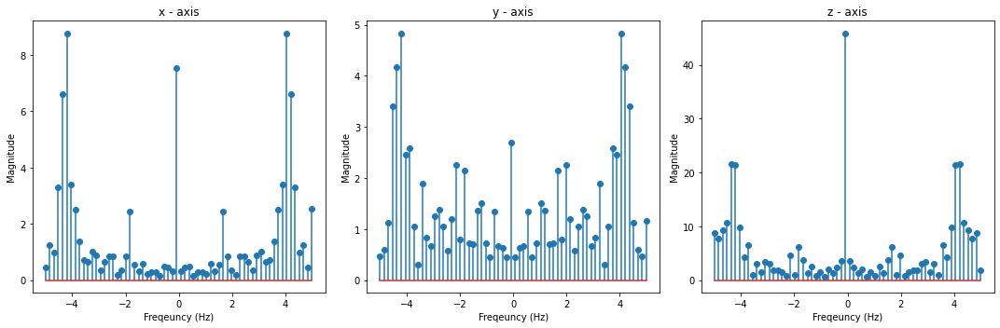

[0.2, -0.68, 0.2, -0.3, -0.09, 0.23, -0.64, 0.2, -0.26, -0.11, 0.11, -0.47, 0.29, -0.52, 0.05, 0.05, -0.12, 0.17, -0.59, 0.14, -0.09, -0.13, 0.2, -0.59, 0.12, -0.38, -0.08, 0.05, -0.47, 0.19, -0.43, -0.09, 0.22, -0.51, 0.18, -0.55, 0.08, -0.24, -0.03, 0.18, -0.55, 0.21, -0.35, -0.1, 0.03, -0.28, 0.23, -0.65, 0.2, -0.24, -0.13, 0.19, -0.51, 0.19, -0.46, 0.04, 0.15, -0.42, 0.23, -0.47, -0.04, -0.07, -0.15, -0.07]
[0.29, -0.08, 0.31, -0.4, 0.04, 0.24, 0.2, 0.18, -0.45, 0.2, 0.08, 0.24, 0.27, -0.41, 0.21, 0.07, -0.26, 0.26, -0.37, 0.31, -0.11, -0.1, 0.4, -0.3, 0.23, -0.49, 0.09, 0.21, -0.28, 0.26, -0.43, 0.17, 0.18, -0.15, 0.17, -0.44, 0.4, -0.33, 0.16, 0.11, -0.25, 0.49, -0.61, 0.13, 0.12, -0.31, 0.57, -0.68, 0.46, -0.48, 0.05, 0.19, -0.35, 0.4, -0.66, 0.19, 0.1, -0.36, 0.47, -0.71, 0.2, -0.03, -0.1, -0.04]
[1.99, -0.31, 1.84, 0.46, 0.66, 0.83, 0.92, 1.27, 0.16, 1.55, 0.26, 1.77, -0.58, 2.0, -0.19, 2.0, 0.18, 1.64, 0.23, -0.37, 2.0, 0.02, 2.0, -0.03, 0.17, 1.23, -0.31, 2.0, 0.28, 0.37, 1.

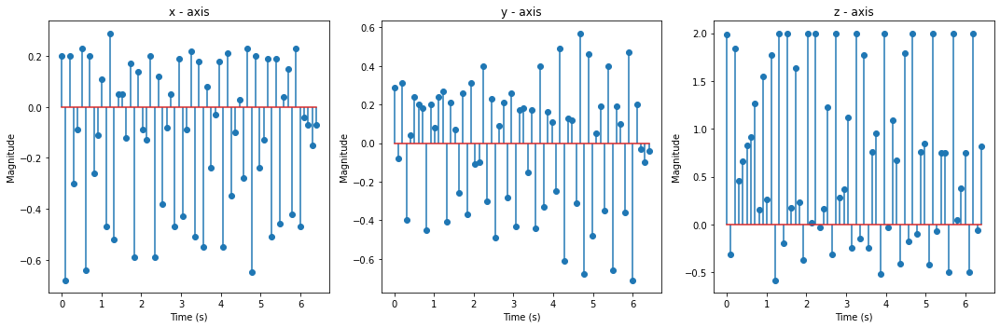

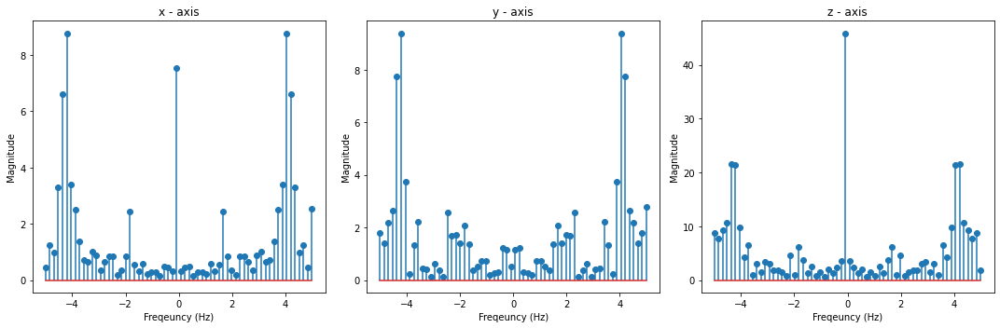

[0.2, -0.68, 0.2, -0.3, -0.09, 0.23, -0.64, 0.2, -0.26, -0.11, 0.11, -0.47, 0.29, -0.52, 0.05, 0.05, -0.12, 0.17, -0.59, 0.14, -0.09, -0.13, 0.2, -0.59, 0.12, -0.38, -0.08, 0.05, -0.47, 0.19, -0.43, -0.09, 0.22, -0.51, 0.18, -0.55, 0.08, -0.24, -0.03, 0.18, -0.55, 0.21, -0.35, -0.1, 0.03, -0.28, 0.23, -0.65, 0.2, -0.24, -0.13, 0.19, -0.51, 0.19, -0.46, 0.04, 0.15, -0.42, 0.23, -0.47, -0.04, -0.07, -0.15, -0.07]
[0.29, -0.08, 0.31, -0.4, 0.04, 0.24, 0.2, 0.18, -0.45, 0.2, 0.08, 0.24, 0.27, -0.41, 0.21, 0.07, -0.26, 0.26, -0.37, 0.31, -0.11, -0.1, 0.4, -0.3, 0.23, -0.49, 0.09, 0.21, -0.28, 0.26, -0.43, 0.17, 0.18, -0.15, 0.17, -0.44, 0.4, -0.33, 0.16, 0.11, -0.25, 0.49, -0.61, 0.13, 0.12, -0.31, 0.57, -0.68, 0.46, -0.48, 0.05, 0.19, -0.35, 0.4, -0.66, 0.19, 0.1, -0.36, 0.47, -0.71, 0.2, -0.03, -0.1, -0.04]
[-0.4, 2.0, -0.13, 1.46, 0.51, -0.55, 2.0, -0.46, 2.0, 0.38, -0.51, 2.0, -0.68, 2.0, -0.14, 0.93, 0.61, -0.58, 2.0, -0.27, 1.22, 0.62, -0.21, 2.0, -0.19, 1.86, 0.25, 0.26, 1.73, -0.13,

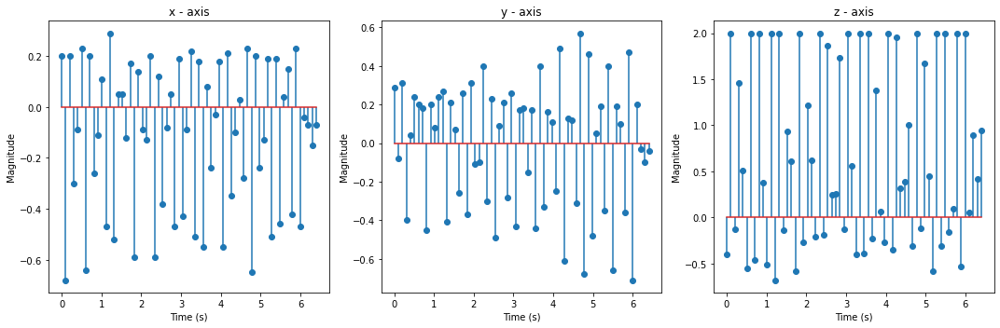

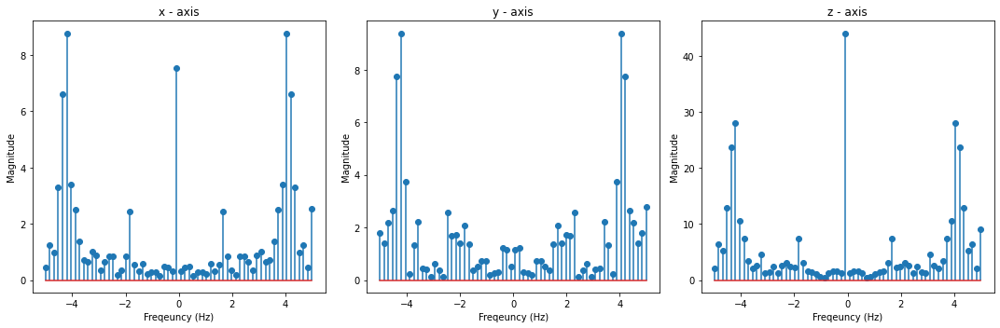

[0.1, -0.26, 0.25, -0.57, 0.23, -0.53, -0.03, 0.14, -0.36, 0.2, -0.58, 0.05, -0.17, -0.1, 0.09, -0.3, 0.08, -0.49, 0.13, -0.49, -0.02, -0.01, -0.31, 0.24, -0.68, 0.15, -0.04, -0.21, 0.35, -0.67, 0.2, -0.22, -0.16, 0.3, -0.55, 0.08, -0.37, -0.1, 0.09, -0.34, 0.13, -0.44, -0.07, -0.05, -0.39, 0.04, -0.22, -0.21, 0.01, -0.25, -0.21, -0.04, -0.18, -0.24, -0.13, -0.05, -0.2, -0.19, -0.16, -0.08, -0.14, -0.2, -0.17, -0.08]
[0.29, -0.08, 0.31, -0.4, 0.04, 0.24, 0.2, 0.18, -0.45, 0.2, 0.08, 0.24, 0.27, -0.41, 0.21, 0.07, -0.26, 0.26, -0.37, 0.31, -0.11, -0.1, 0.4, -0.3, 0.23, -0.49, 0.09, 0.21, -0.28, 0.26, -0.43, 0.17, 0.18, -0.15, 0.17, -0.44, 0.4, -0.33, 0.16, 0.11, -0.25, 0.49, -0.61, 0.13, 0.12, -0.31, 0.57, -0.68, 0.46, -0.48, 0.05, 0.19, -0.35, 0.4, -0.66, 0.19, 0.1, -0.36, 0.47, -0.71, 0.2, -0.03, -0.1, -0.04]
[-0.4, 2.0, -0.13, 1.46, 0.51, -0.55, 2.0, -0.46, 2.0, 0.38, -0.51, 2.0, -0.68, 2.0, -0.14, 0.93, 0.61, -0.58, 2.0, -0.27, 1.22, 0.62, -0.21, 2.0, -0.19, 1.86, 0.25, 0.26, 1.73, 

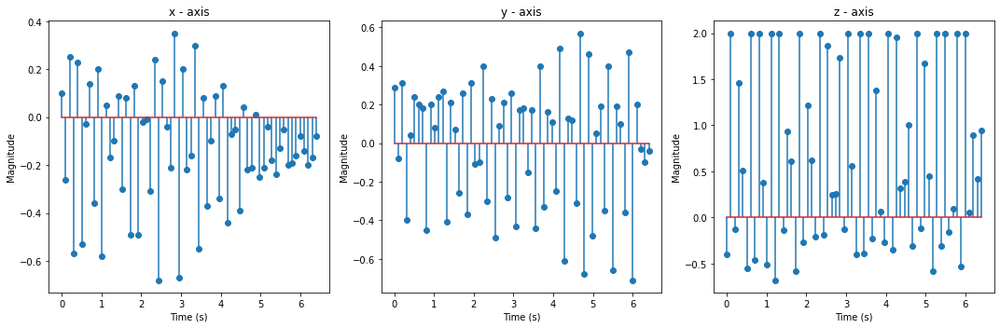

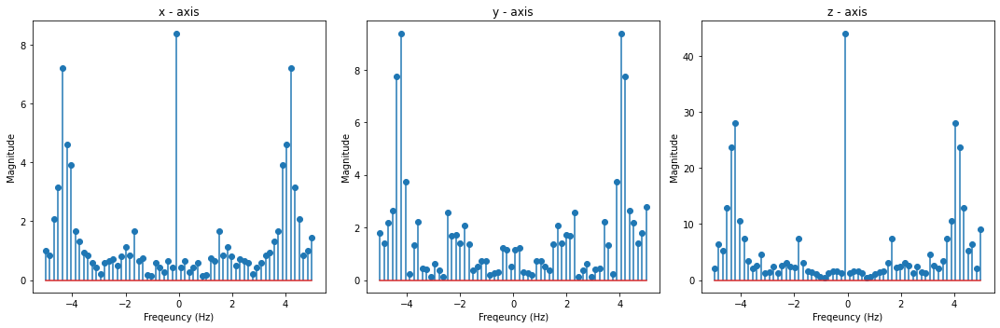

[0.1, -0.26, 0.25, -0.57, 0.23, -0.53, -0.03, 0.14, -0.36, 0.2, -0.58, 0.05, -0.17, -0.1, 0.09, -0.3, 0.08, -0.49, 0.13, -0.49, -0.02, -0.01, -0.31, 0.24, -0.68, 0.15, -0.04, -0.21, 0.35, -0.67, 0.2, -0.22, -0.16, 0.3, -0.55, 0.08, -0.37, -0.1, 0.09, -0.34, 0.13, -0.44, -0.07, -0.05, -0.39, 0.04, -0.22, -0.21, 0.01, -0.25, -0.21, -0.04, -0.18, -0.24, -0.13, -0.05, -0.2, -0.19, -0.16, -0.08, -0.14, -0.2, -0.17, -0.08]
[0.18, -0.23, 0.4, -0.49, 0.46, -0.54, 0.16, 0.15, -0.27, 0.43, -0.67, 0.24, -0.29, -0.07, 0.16, -0.34, 0.4, -0.4, 0.23, -0.57, 0.19, -0.05, -0.27, 0.36, -0.54, 0.34, -0.13, -0.07, 0.34, -0.23, 0.38, -0.38, -0.07, 0.41, -0.33, 0.31, -0.37, 0.04, 0.2, -0.14, 0.29, -0.43, 0.16, 0.05, -0.14, 0.23, -0.18, 0.02, 0.17, -0.1, 0.06, 0.16, -0.04, 0.01, 0.11, 0.03, -0.04, 0.06, 0.08, 0.07, -0.02, 0.04, 0.06, 0.08]
[-0.4, 2.0, -0.13, 1.46, 0.51, -0.55, 2.0, -0.46, 2.0, 0.38, -0.51, 2.0, -0.68, 2.0, -0.14, 0.93, 0.61, -0.58, 2.0, -0.27, 1.22, 0.62, -0.21, 2.0, -0.19, 1.86, 0.25, 0.26,

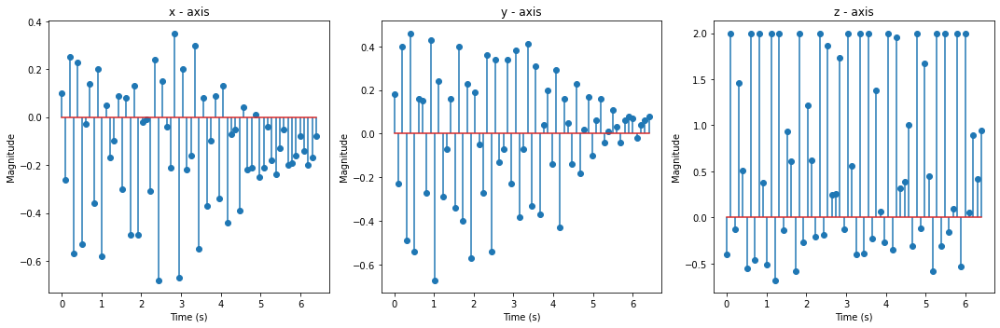

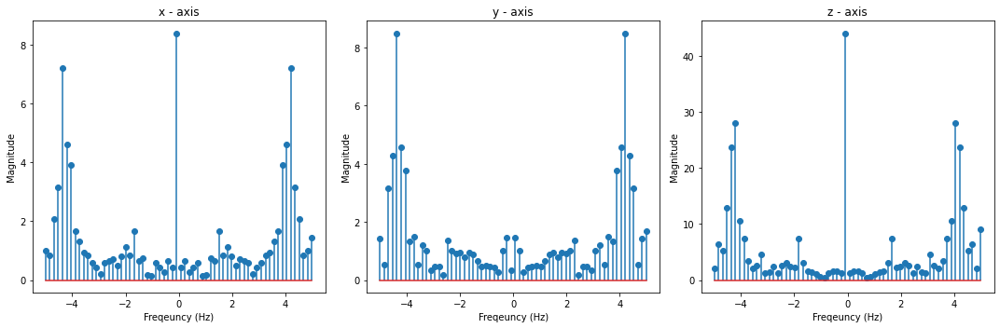

[0.1, -0.26, 0.25, -0.57, 0.23, -0.53, -0.03, 0.14, -0.36, 0.2, -0.58, 0.05, -0.17, -0.1, 0.09, -0.3, 0.08, -0.49, 0.13, -0.49, -0.02, -0.01, -0.31, 0.24, -0.68, 0.15, -0.04, -0.21, 0.35, -0.67, 0.2, -0.22, -0.16, 0.3, -0.55, 0.08, -0.37, -0.1, 0.09, -0.34, 0.13, -0.44, -0.07, -0.05, -0.39, 0.04, -0.22, -0.21, 0.01, -0.25, -0.21, -0.04, -0.18, -0.24, -0.13, -0.05, -0.2, -0.19, -0.16, -0.08, -0.14, -0.2, -0.17, -0.08]
[0.18, -0.23, 0.4, -0.49, 0.46, -0.54, 0.16, 0.15, -0.27, 0.43, -0.67, 0.24, -0.29, -0.07, 0.16, -0.34, 0.4, -0.4, 0.23, -0.57, 0.19, -0.05, -0.27, 0.36, -0.54, 0.34, -0.13, -0.07, 0.34, -0.23, 0.38, -0.38, -0.07, 0.41, -0.33, 0.31, -0.37, 0.04, 0.2, -0.14, 0.29, -0.43, 0.16, 0.05, -0.14, 0.23, -0.18, 0.02, 0.17, -0.1, 0.06, 0.16, -0.04, 0.01, 0.11, 0.03, -0.04, 0.06, 0.08, 0.07, -0.02, 0.04, 0.06, 0.08]
[0.27, 0.91, -0.41, 2.0, -0.36, 2.0, 0.37, -0.03, 1.54, -0.46, 2.0, -0.05, 1.32, 0.22, 0.27, 0.95, -0.1, 1.97, -0.2, 2.0, 0.14, 0.55, 0.96, -0.52, 2.0, -0.35, 1.21, 0.78, 

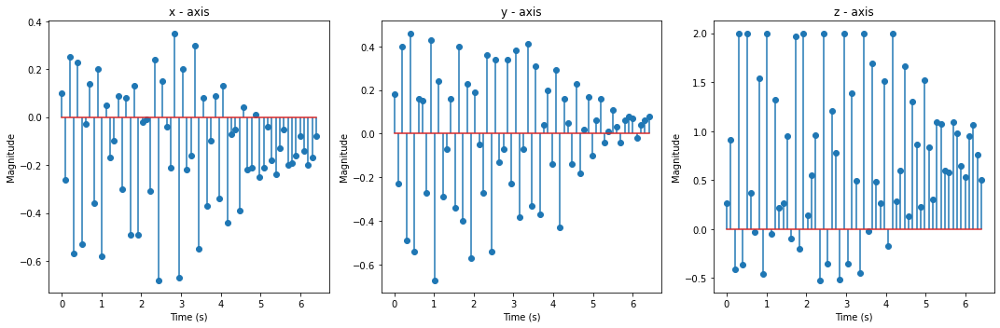

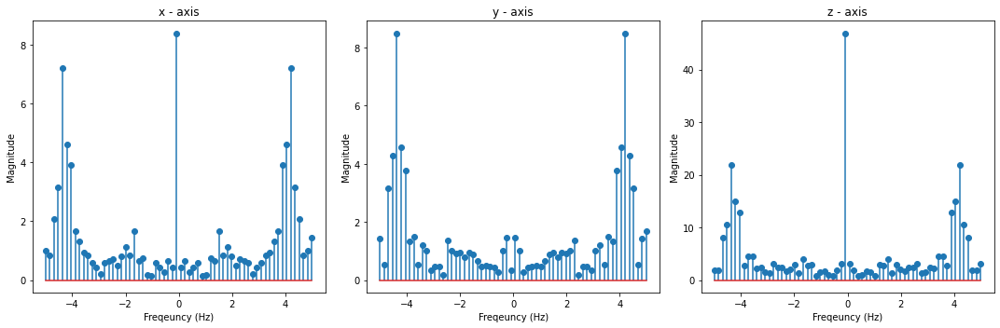

[-0.19, -0.14, -0.08, -0.13, -0.2, -0.17, -0.08, -0.14, -0.16, -0.17, -0.14, -0.12, -0.13, -0.17, -0.16, -0.09, -0.13, -0.15, -0.16, -0.13, -0.13, -0.12, -0.16, -0.15, -0.08, -0.13, -0.15, -0.15, -0.12, -0.1, -0.12, -0.16, -0.13, -0.08, -0.14, -0.16, -0.15, -0.08, -0.11, -0.15, -0.15, -0.12, -0.12, -0.13, -0.16, -0.17, -0.16, -0.12, -0.13, -0.19, -0.18, -0.15, -0.14, -0.13, -0.17, -0.19, -0.12, -0.11, -0.13, -0.17, -0.19, -0.11, -0.11, -0.16]
[0.18, -0.23, 0.4, -0.49, 0.46, -0.54, 0.16, 0.15, -0.27, 0.43, -0.67, 0.24, -0.29, -0.07, 0.16, -0.34, 0.4, -0.4, 0.23, -0.57, 0.19, -0.05, -0.27, 0.36, -0.54, 0.34, -0.13, -0.07, 0.34, -0.23, 0.38, -0.38, -0.07, 0.41, -0.33, 0.31, -0.37, 0.04, 0.2, -0.14, 0.29, -0.43, 0.16, 0.05, -0.14, 0.23, -0.18, 0.02, 0.17, -0.1, 0.06, 0.16, -0.04, 0.01, 0.11, 0.03, -0.04, 0.06, 0.08, 0.07, -0.02, 0.04, 0.06, 0.08]
[0.27, 0.91, -0.41, 2.0, -0.36, 2.0, 0.37, -0.03, 1.54, -0.46, 2.0, -0.05, 1.32, 0.22, 0.27, 0.95, -0.1, 1.97, -0.2, 2.0, 0.14, 0.55, 0.96, -0.52

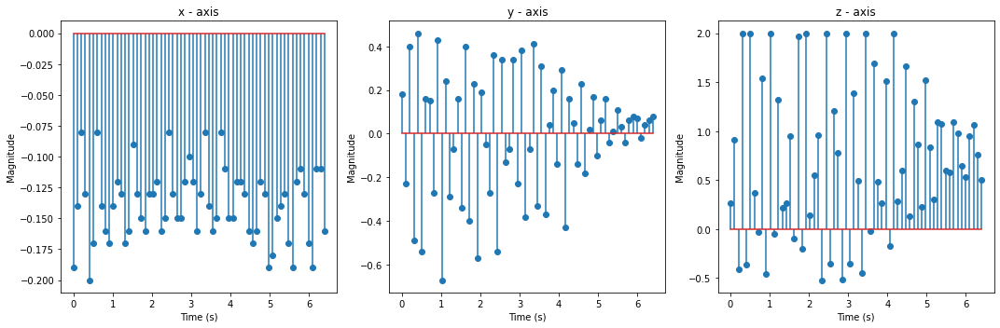

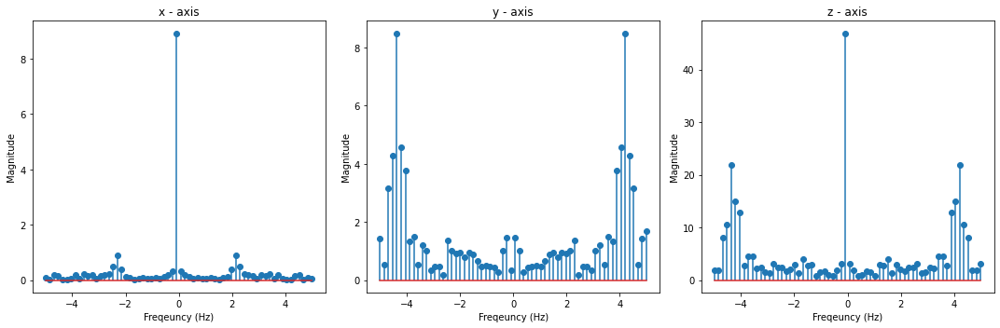

[-0.19, -0.14, -0.08, -0.13, -0.2, -0.17, -0.08, -0.14, -0.16, -0.17, -0.14, -0.12, -0.13, -0.17, -0.16, -0.09, -0.13, -0.15, -0.16, -0.13, -0.13, -0.12, -0.16, -0.15, -0.08, -0.13, -0.15, -0.15, -0.12, -0.1, -0.12, -0.16, -0.13, -0.08, -0.14, -0.16, -0.15, -0.08, -0.11, -0.15, -0.15, -0.12, -0.12, -0.13, -0.16, -0.17, -0.16, -0.12, -0.13, -0.19, -0.18, -0.15, -0.14, -0.13, -0.17, -0.19, -0.12, -0.11, -0.13, -0.17, -0.19, -0.11, -0.11, -0.16]
[0.03, 0.07, 0.09, -0.01, 0.0, 0.07, 0.12, 0.01, -0.03, 0.03, 0.07, -0.01, -0.0, -0.02, 0.02, 0.06, -0.0, 0.02, 0.02, 0.06, 0.03, -0.0, -0.0, 0.04, 0.06, 0.02, 0.01, 0.03, 0.05, 0.02, -0.01, 0.0, 0.01, 0.08, -0.01, 0.02, 0.05, 0.04, 0.07, -0.01, 0.01, 0.07, 0.05, 0.02, -0.01, 0.05, 0.04, 0.06, -0.02, 0.05, 0.05, 0.07, -0.01, -0.01, 0.01, -0.01, 0.06, 0.02, -0.05, -0.02, 0.01, 0.03, 0.01, -0.01]
[0.27, 0.91, -0.41, 2.0, -0.36, 2.0, 0.37, -0.03, 1.54, -0.46, 2.0, -0.05, 1.32, 0.22, 0.27, 0.95, -0.1, 1.97, -0.2, 2.0, 0.14, 0.55, 0.96, -0.52, 2.0, -0.

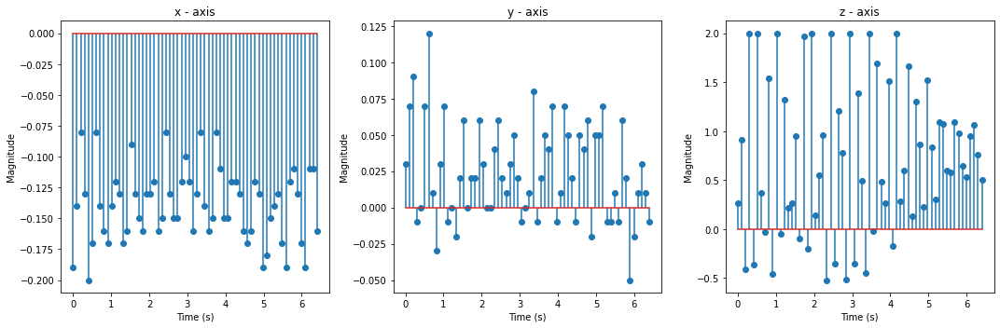

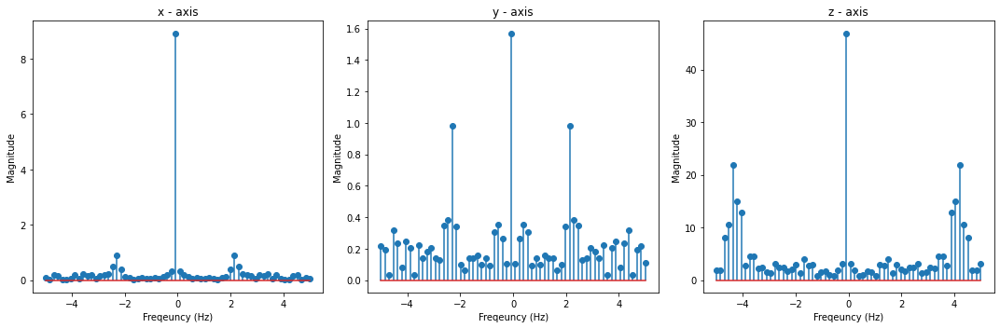

[-0.19, -0.14, -0.08, -0.13, -0.2, -0.17, -0.08, -0.14, -0.16, -0.17, -0.14, -0.12, -0.13, -0.17, -0.16, -0.09, -0.13, -0.15, -0.16, -0.13, -0.13, -0.12, -0.16, -0.15, -0.08, -0.13, -0.15, -0.15, -0.12, -0.1, -0.12, -0.16, -0.13, -0.08, -0.14, -0.16, -0.15, -0.08, -0.11, -0.15, -0.15, -0.12, -0.12, -0.13, -0.16, -0.17, -0.16, -0.12, -0.13, -0.19, -0.18, -0.15, -0.14, -0.13, -0.17, -0.19, -0.12, -0.11, -0.13, -0.17, -0.19, -0.11, -0.11, -0.16]
[0.03, 0.07, 0.09, -0.01, 0.0, 0.07, 0.12, 0.01, -0.03, 0.03, 0.07, -0.01, -0.0, -0.02, 0.02, 0.06, -0.0, 0.02, 0.02, 0.06, 0.03, -0.0, -0.0, 0.04, 0.06, 0.02, 0.01, 0.03, 0.05, 0.02, -0.01, 0.0, 0.01, 0.08, -0.01, 0.02, 0.05, 0.04, 0.07, -0.01, 0.01, 0.07, 0.05, 0.02, -0.01, 0.05, 0.04, 0.06, -0.02, 0.05, 0.05, 0.07, -0.01, -0.01, 0.01, -0.01, 0.06, 0.02, -0.05, -0.02, 0.01, 0.03, 0.01, -0.01]
[1.07, 0.75, 0.51, 0.9, 1.16, 0.83, 0.55, 0.87, 1.05, 0.85, 0.62, 0.79, 0.93, 0.99, 0.74, 0.62, 0.96, 1.06, 0.84, 0.63, 0.79, 0.97, 1.0, 0.76, 0.58, 0.92, 

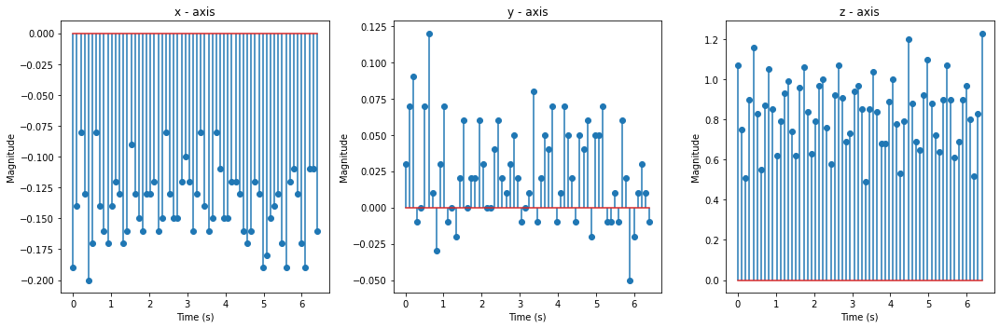

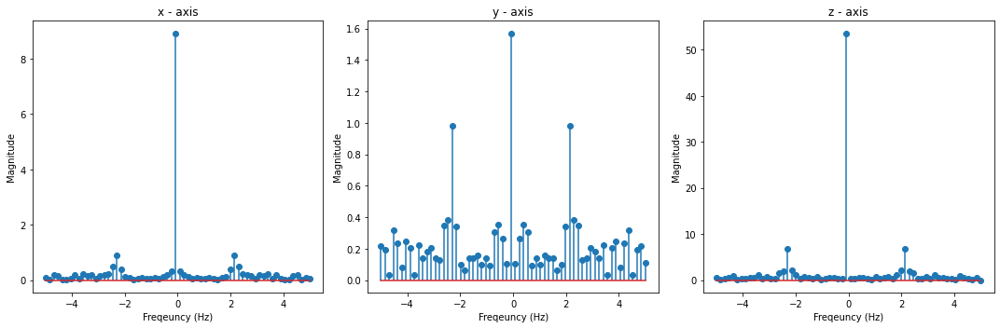

[-0.16, -0.11, -0.19, -0.15, -0.16, -0.11, -0.14, -0.18, -0.16, -0.13, -0.09, -0.14, -0.18, -0.18, -0.16, -0.08, -0.14, -0.19, -0.19, -0.17, -0.11, -0.13, -0.19, -0.17, -0.16, -0.15, -0.14, -0.17, -0.18, -0.15, -0.12, -0.17, -0.16, -0.17, -0.18, -0.12, -0.16, -0.21, -0.19, -0.16, -0.13, -0.14, -0.13, -0.17, -0.16, -0.14, -0.07, -0.11, -0.13, -0.1, -0.1, -0.09, -0.14, -0.13, -0.09, -0.1, -0.09, -0.14, -0.14, -0.09, -0.1, -0.11, -0.12, -0.15]
[0.03, 0.07, 0.09, -0.01, 0.0, 0.07, 0.12, 0.01, -0.03, 0.03, 0.07, -0.01, -0.0, -0.02, 0.02, 0.06, -0.0, 0.02, 0.02, 0.06, 0.03, -0.0, -0.0, 0.04, 0.06, 0.02, 0.01, 0.03, 0.05, 0.02, -0.01, 0.0, 0.01, 0.08, -0.01, 0.02, 0.05, 0.04, 0.07, -0.01, 0.01, 0.07, 0.05, 0.02, -0.01, 0.05, 0.04, 0.06, -0.02, 0.05, 0.05, 0.07, -0.01, -0.01, 0.01, -0.01, 0.06, 0.02, -0.05, -0.02, 0.01, 0.03, 0.01, -0.01]
[1.07, 0.75, 0.51, 0.9, 1.16, 0.83, 0.55, 0.87, 1.05, 0.85, 0.62, 0.79, 0.93, 0.99, 0.74, 0.62, 0.96, 1.06, 0.84, 0.63, 0.79, 0.97, 1.0, 0.76, 0.58, 0.92, 1.

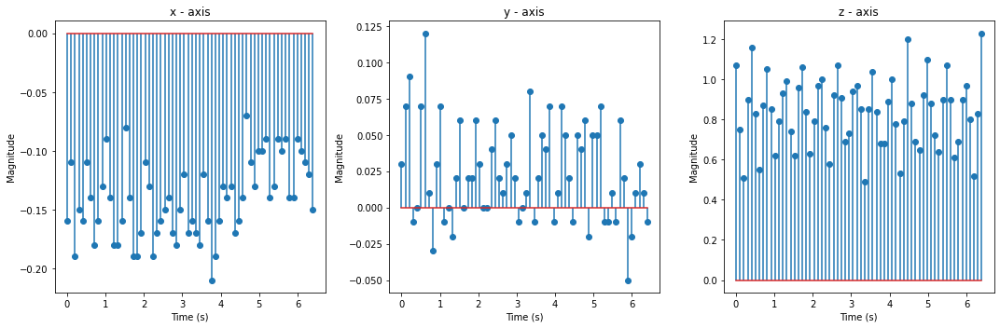

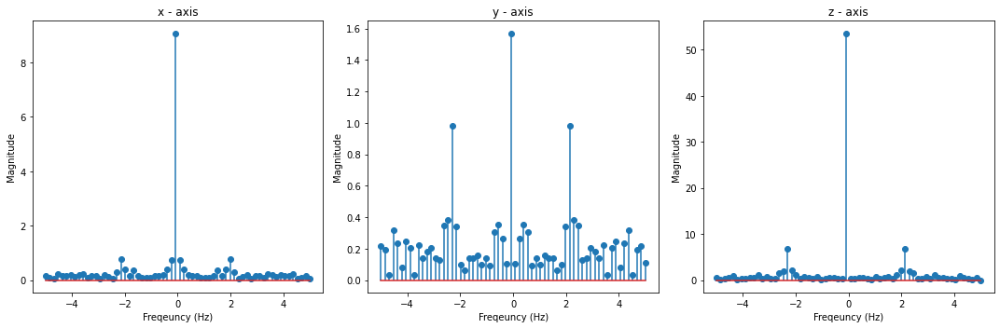

[-0.16, -0.11, -0.19, -0.15, -0.16, -0.11, -0.14, -0.18, -0.16, -0.13, -0.09, -0.14, -0.18, -0.18, -0.16, -0.08, -0.14, -0.19, -0.19, -0.17, -0.11, -0.13, -0.19, -0.17, -0.16, -0.15, -0.14, -0.17, -0.18, -0.15, -0.12, -0.17, -0.16, -0.17, -0.18, -0.12, -0.16, -0.21, -0.19, -0.16, -0.13, -0.14, -0.13, -0.17, -0.16, -0.14, -0.07, -0.11, -0.13, -0.1, -0.1, -0.09, -0.14, -0.13, -0.09, -0.1, -0.09, -0.14, -0.14, -0.09, -0.1, -0.11, -0.12, -0.15]
[0.06, 0.02, -0.05, -0.01, 0.01, 0.08, -0.05, 0.0, 0.02, 0.03, 0.03, -0.03, -0.01, 0.05, 0.03, 0.01, 0.0, 0.01, 0.07, 0.06, 0.06, 0.03, 0.02, 0.02, 0.08, 0.09, 0.03, 0.01, 0.02, 0.04, 0.05, -0.01, 0.01, 0.02, 0.06, 0.05, 0.0, -0.0, -0.03, 0.03, 0.04, 0.03, -0.02, -0.01, 0.04, -0.01, 0.08, -0.0, 0.04, 0.04, 0.05, -0.0, 0.04, 0.08, 0.13, 0.01, 0.04, 0.03, 0.08, 0.06, 0.02, 0.02, 0.04, 0.01]
[1.07, 0.75, 0.51, 0.9, 1.16, 0.83, 0.55, 0.87, 1.05, 0.85, 0.62, 0.79, 0.93, 0.99, 0.74, 0.62, 0.96, 1.06, 0.84, 0.63, 0.79, 0.97, 1.0, 0.76, 0.58, 0.92, 1.07, 0.

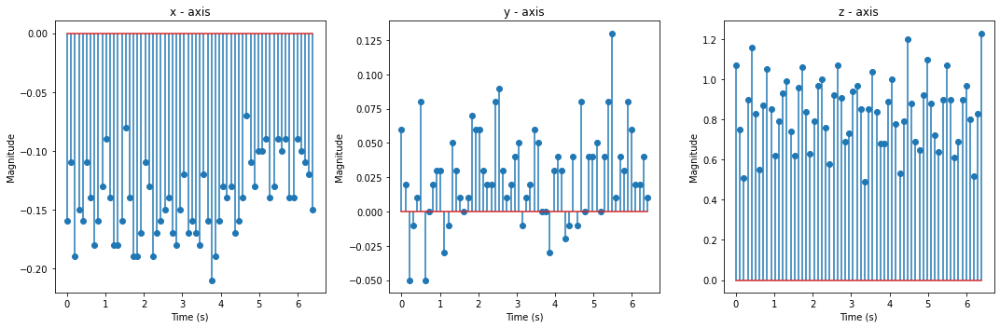

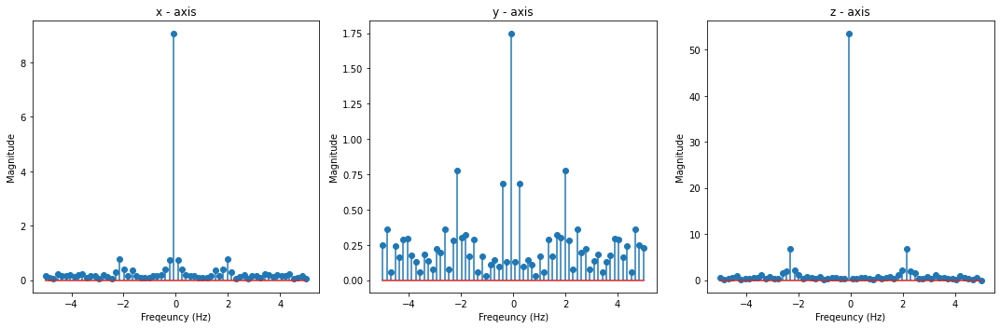

[-0.16, -0.11, -0.19, -0.15, -0.16, -0.11, -0.14, -0.18, -0.16, -0.13, -0.09, -0.14, -0.18, -0.18, -0.16, -0.08, -0.14, -0.19, -0.19, -0.17, -0.11, -0.13, -0.19, -0.17, -0.16, -0.15, -0.14, -0.17, -0.18, -0.15, -0.12, -0.17, -0.16, -0.17, -0.18, -0.12, -0.16, -0.21, -0.19, -0.16, -0.13, -0.14, -0.13, -0.17, -0.16, -0.14, -0.07, -0.11, -0.13, -0.1, -0.1, -0.09, -0.14, -0.13, -0.09, -0.1, -0.09, -0.14, -0.14, -0.09, -0.1, -0.11, -0.12, -0.15]
[0.06, 0.02, -0.05, -0.01, 0.01, 0.08, -0.05, 0.0, 0.02, 0.03, 0.03, -0.03, -0.01, 0.05, 0.03, 0.01, 0.0, 0.01, 0.07, 0.06, 0.06, 0.03, 0.02, 0.02, 0.08, 0.09, 0.03, 0.01, 0.02, 0.04, 0.05, -0.01, 0.01, 0.02, 0.06, 0.05, 0.0, -0.0, -0.03, 0.03, 0.04, 0.03, -0.02, -0.01, 0.04, -0.01, 0.08, -0.0, 0.04, 0.04, 0.05, -0.0, 0.04, 0.08, 0.13, 0.01, 0.04, 0.03, 0.08, 0.06, 0.02, 0.02, 0.04, 0.01]
[0.68, 0.73, 1.25, 0.94, 0.78, 0.62, 0.91, 1.1, 0.85, 0.67, 0.63, 1.0, 1.0, 0.91, 0.7, 0.6, 0.87, 1.07, 0.88, 0.76, 0.7, 0.87, 1.07, 0.91, 0.78, 0.79, 0.82, 1.05, 

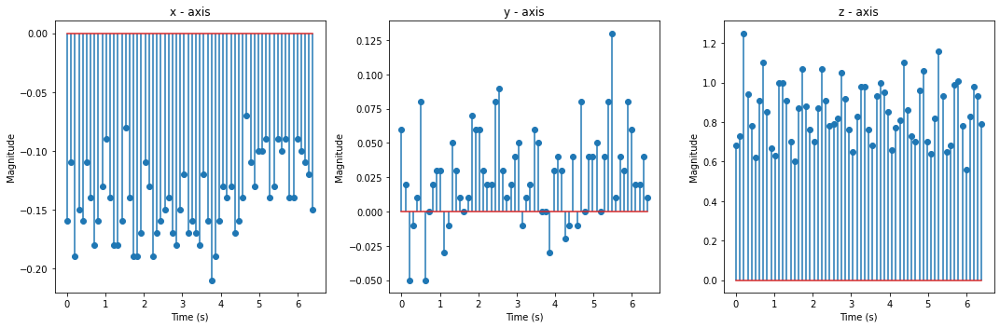

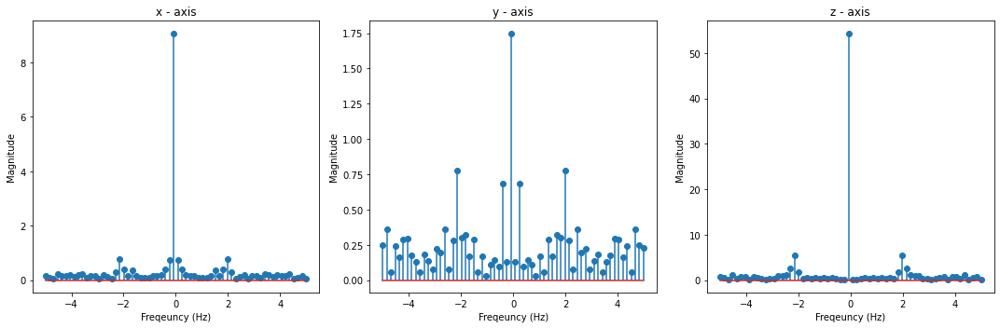

[-0.12, -0.14, -0.14, -0.11, -0.12, -0.14, -0.14, -0.14, -0.11, -0.11, -0.16, -0.15, -0.1, -0.12, -0.14, -0.14, -0.12, -0.13, -0.15, -0.14, -0.12, -0.09, -0.1, -0.16, -0.15, -0.09, -0.1, -0.13, -0.12, -0.11, -0.06, -0.09, -0.12, -0.15, -0.11, -0.08, -0.07, -0.11, -0.13, -0.11, -0.06, -0.14, -0.14, -0.13, -0.07, -0.09, -0.17, -0.14, -0.1, -0.06, -0.16, -0.12, -0.15, -0.09, -0.11, -0.14, -0.15, -0.12, -0.11, -0.12, -0.13, -0.15, -0.12, -0.1]
[0.06, 0.02, -0.05, -0.01, 0.01, 0.08, -0.05, 0.0, 0.02, 0.03, 0.03, -0.03, -0.01, 0.05, 0.03, 0.01, 0.0, 0.01, 0.07, 0.06, 0.06, 0.03, 0.02, 0.02, 0.08, 0.09, 0.03, 0.01, 0.02, 0.04, 0.05, -0.01, 0.01, 0.02, 0.06, 0.05, 0.0, -0.0, -0.03, 0.03, 0.04, 0.03, -0.02, -0.01, 0.04, -0.01, 0.08, -0.0, 0.04, 0.04, 0.05, -0.0, 0.04, 0.08, 0.13, 0.01, 0.04, 0.03, 0.08, 0.06, 0.02, 0.02, 0.04, 0.01]
[0.68, 0.73, 1.25, 0.94, 0.78, 0.62, 0.91, 1.1, 0.85, 0.67, 0.63, 1.0, 1.0, 0.91, 0.7, 0.6, 0.87, 1.07, 0.88, 0.76, 0.7, 0.87, 1.07, 0.91, 0.78, 0.79, 0.82, 1.05, 0

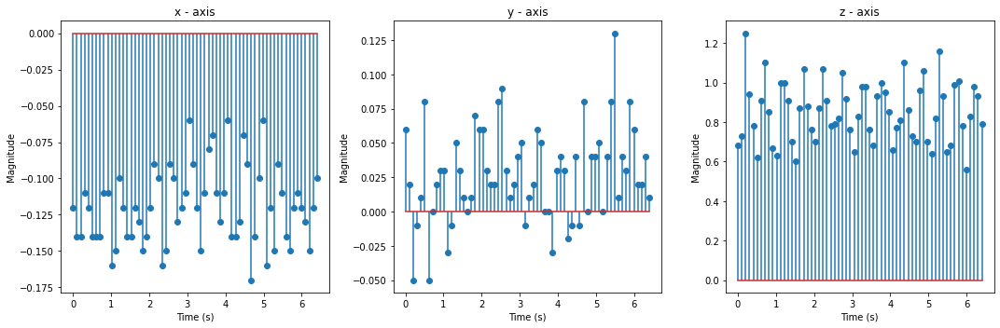

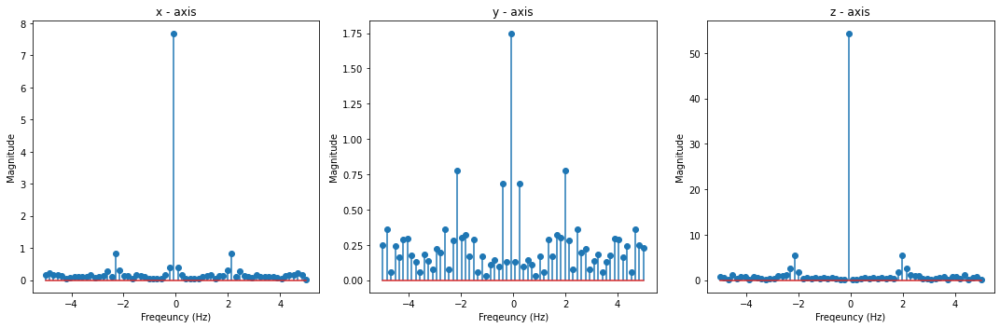

[-0.12, -0.14, -0.14, -0.11, -0.12, -0.14, -0.14, -0.14, -0.11, -0.11, -0.16, -0.15, -0.1, -0.12, -0.14, -0.14, -0.12, -0.13, -0.15, -0.14, -0.12, -0.09, -0.1, -0.16, -0.15, -0.09, -0.1, -0.13, -0.12, -0.11, -0.06, -0.09, -0.12, -0.15, -0.11, -0.08, -0.07, -0.11, -0.13, -0.11, -0.06, -0.14, -0.14, -0.13, -0.07, -0.09, -0.17, -0.14, -0.1, -0.06, -0.16, -0.12, -0.15, -0.09, -0.11, -0.14, -0.15, -0.12, -0.11, -0.12, -0.13, -0.15, -0.12, -0.1]
[0.01, 0.02, 0.02, -0.0, 0.02, -0.01, 0.05, 0.03, -0.0, 0.03, -0.04, 0.02, 0.02, -0.05, -0.04, 0.01, 0.01, -0.05, -0.0, 0.01, 0.06, 0.02, -0.01, 0.0, 0.03, 0.03, 0.0, -0.02, 0.0, 0.03, 0.05, 0.01, 0.05, 0.03, 0.04, 0.02, -0.02, 0.05, 0.03, 0.03, 0.06, -0.02, 0.05, 0.01, 0.03, 0.01, -0.0, 0.02, 0.07, 0.0, -0.07, 0.05, 0.01, 0.08, -0.0, 0.01, 0.03, 0.02, 0.04, 0.0, -0.04, 0.03, 0.07, 0.04]
[0.68, 0.73, 1.25, 0.94, 0.78, 0.62, 0.91, 1.1, 0.85, 0.67, 0.63, 1.0, 1.0, 0.91, 0.7, 0.6, 0.87, 1.07, 0.88, 0.76, 0.7, 0.87, 1.07, 0.91, 0.78, 0.79, 0.82, 1.05, 0.

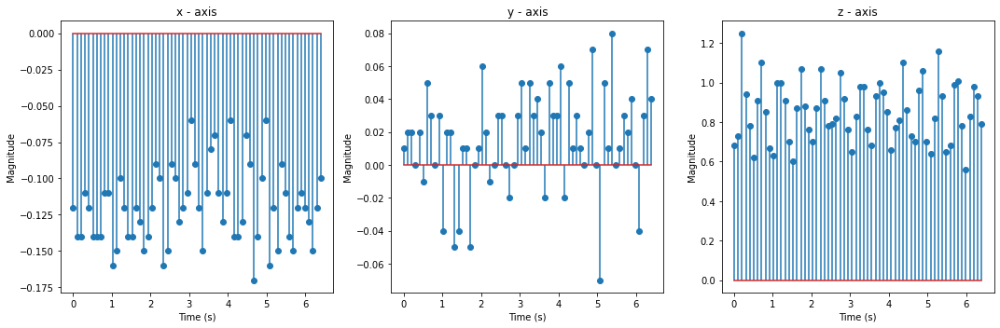

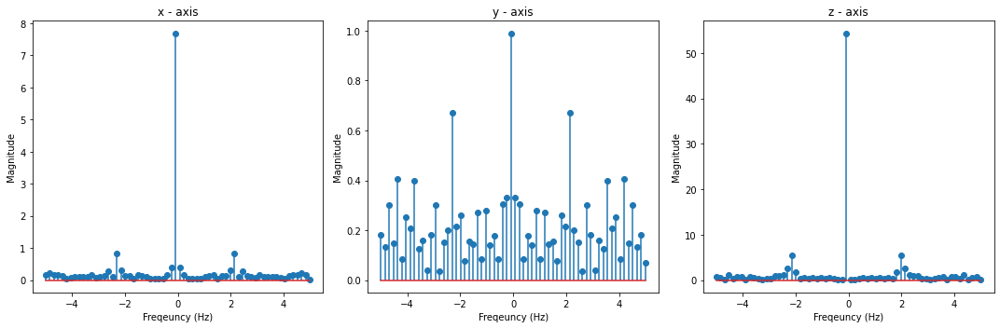

[-0.12, -0.14, -0.14, -0.11, -0.12, -0.14, -0.14, -0.14, -0.11, -0.11, -0.16, -0.15, -0.1, -0.12, -0.14, -0.14, -0.12, -0.13, -0.15, -0.14, -0.12, -0.09, -0.1, -0.16, -0.15, -0.09, -0.1, -0.13, -0.12, -0.11, -0.06, -0.09, -0.12, -0.15, -0.11, -0.08, -0.07, -0.11, -0.13, -0.11, -0.06, -0.14, -0.14, -0.13, -0.07, -0.09, -0.17, -0.14, -0.1, -0.06, -0.16, -0.12, -0.15, -0.09, -0.11, -0.14, -0.15, -0.12, -0.11, -0.12, -0.13, -0.15, -0.12, -0.1]
[0.01, 0.02, 0.02, -0.0, 0.02, -0.01, 0.05, 0.03, -0.0, 0.03, -0.04, 0.02, 0.02, -0.05, -0.04, 0.01, 0.01, -0.05, -0.0, 0.01, 0.06, 0.02, -0.01, 0.0, 0.03, 0.03, 0.0, -0.02, 0.0, 0.03, 0.05, 0.01, 0.05, 0.03, 0.04, 0.02, -0.02, 0.05, 0.03, 0.03, 0.06, -0.02, 0.05, 0.01, 0.03, 0.01, -0.0, 0.02, 0.07, 0.0, -0.07, 0.05, 0.01, 0.08, -0.0, 0.01, 0.03, 0.02, 0.04, 0.0, -0.04, 0.03, 0.07, 0.04]
[0.94, 1.06, 0.87, 0.6, 0.78, 1.05, 0.91, 0.66, 0.72, 0.95, 1.04, 0.74, 0.6, 0.82, 1.1, 0.86, 0.61, 0.77, 1.07, 0.9, 0.72, 0.61, 0.92, 1.1, 0.85, 0.58, 0.85, 1.09, 0

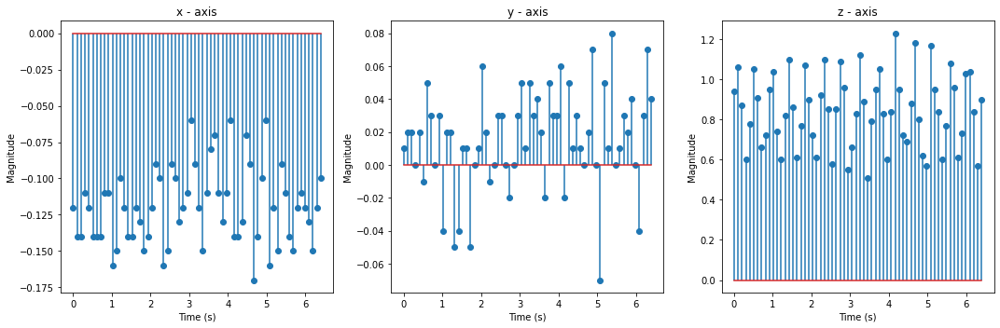

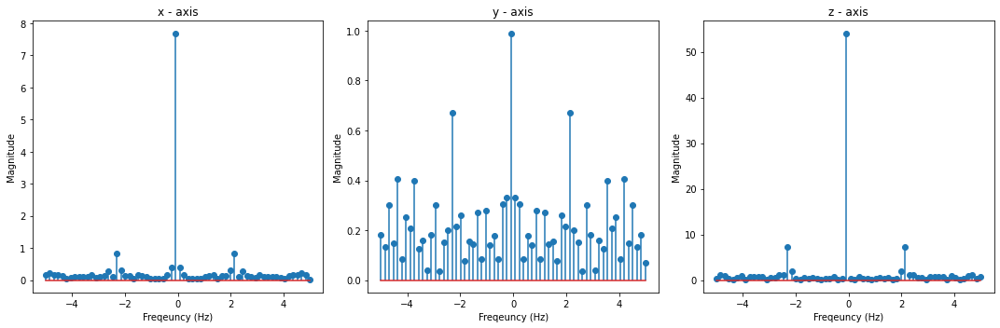

[-0.15, -0.13, -0.1, -0.08, -0.14, -0.16, -0.14, -0.07, -0.11, -0.18, -0.16, -0.1, -0.1, -0.11, -0.16, -0.16, -0.13, -0.06, -0.09, -0.12, -0.13, -0.15, -0.15, -0.1, -0.08, -0.08, -0.13, -0.12, -0.15, -0.15, -0.11, -0.06, -0.08, -0.12, -0.1, -0.13, -0.14, -0.14, -0.07, -0.1, -0.1, -0.1, -0.1, -0.13, -0.12, -0.11, -0.08, -0.1, -0.1, -0.13, -0.13, -0.14, -0.13, -0.08, -0.09, -0.11, -0.07, -0.11, -0.12, -0.14, -0.1, -0.08, -0.1, -0.11]
[0.01, 0.02, 0.02, -0.0, 0.02, -0.01, 0.05, 0.03, -0.0, 0.03, -0.04, 0.02, 0.02, -0.05, -0.04, 0.01, 0.01, -0.05, -0.0, 0.01, 0.06, 0.02, -0.01, 0.0, 0.03, 0.03, 0.0, -0.02, 0.0, 0.03, 0.05, 0.01, 0.05, 0.03, 0.04, 0.02, -0.02, 0.05, 0.03, 0.03, 0.06, -0.02, 0.05, 0.01, 0.03, 0.01, -0.0, 0.02, 0.07, 0.0, -0.07, 0.05, 0.01, 0.08, -0.0, 0.01, 0.03, 0.02, 0.04, 0.0, -0.04, 0.03, 0.07, 0.04]
[0.94, 1.06, 0.87, 0.6, 0.78, 1.05, 0.91, 0.66, 0.72, 0.95, 1.04, 0.74, 0.6, 0.82, 1.1, 0.86, 0.61, 0.77, 1.07, 0.9, 0.72, 0.61, 0.92, 1.1, 0.85, 0.58, 0.85, 1.09, 0.96, 0.5

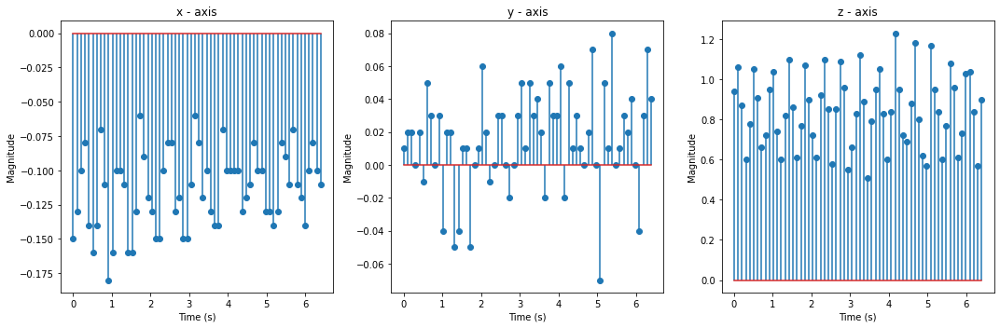

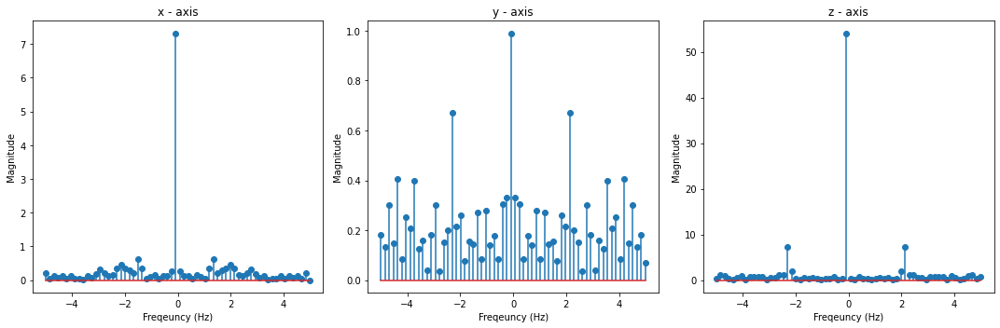

[-0.15, -0.13, -0.1, -0.08, -0.14, -0.16, -0.14, -0.07, -0.11, -0.18, -0.16, -0.1, -0.1, -0.11, -0.16, -0.16, -0.13, -0.06, -0.09, -0.12, -0.13, -0.15, -0.15, -0.1, -0.08, -0.08, -0.13, -0.12, -0.15, -0.15, -0.11, -0.06, -0.08, -0.12, -0.1, -0.13, -0.14, -0.14, -0.07, -0.1, -0.1, -0.1, -0.1, -0.13, -0.12, -0.11, -0.08, -0.1, -0.1, -0.13, -0.13, -0.14, -0.13, -0.08, -0.09, -0.11, -0.07, -0.11, -0.12, -0.14, -0.1, -0.08, -0.1, -0.11]
[0.02, 0.04, 0.05, -0.04, 0.02, 0.05, 0.05, 0.05, 0.01, -0.01, 0.04, 0.04, 0.01, 0.0, 0.01, 0.06, 0.01, 0.06, 0.04, 0.01, 0.02, 0.03, 0.03, 0.09, 0.03, 0.03, -0.02, 0.04, 0.03, 0.02, 0.06, 0.08, 0.05, -0.01, 0.04, -0.01, 0.02, 0.04, 0.16, 0.04, -0.01, -0.0, 0.03, 0.02, 0.05, 0.09, 0.05, -0.03, 0.05, 0.01, 0.01, 0.03, 0.05, 0.12, 0.07, -0.02, 0.07, 0.02, -0.0, -0.02, 0.1, 0.11, 0.08, 0.06]
[0.94, 1.06, 0.87, 0.6, 0.78, 1.05, 0.91, 0.66, 0.72, 0.95, 1.04, 0.74, 0.6, 0.82, 1.1, 0.86, 0.61, 0.77, 1.07, 0.9, 0.72, 0.61, 0.92, 1.1, 0.85, 0.58, 0.85, 1.09, 0.96, 0.

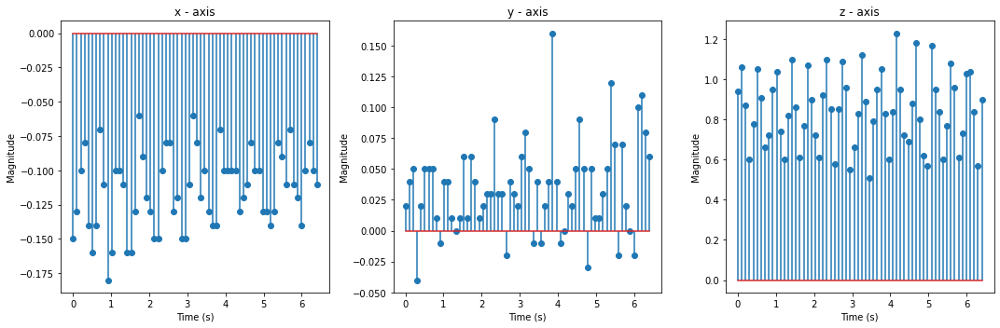

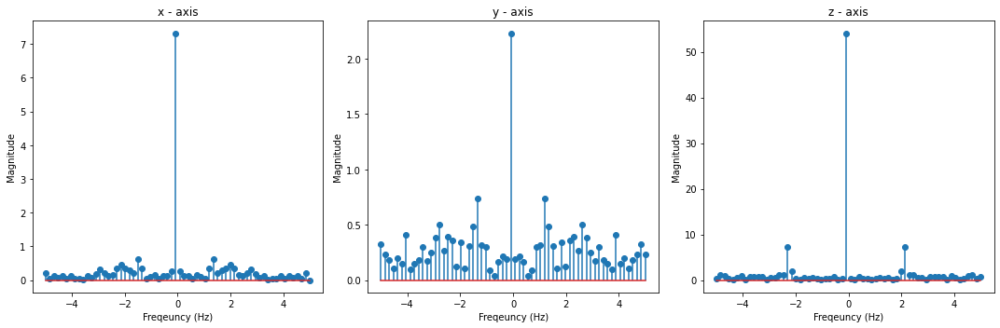

[-0.15, -0.13, -0.1, -0.08, -0.14, -0.16, -0.14, -0.07, -0.11, -0.18, -0.16, -0.1, -0.1, -0.11, -0.16, -0.16, -0.13, -0.06, -0.09, -0.12, -0.13, -0.15, -0.15, -0.1, -0.08, -0.08, -0.13, -0.12, -0.15, -0.15, -0.11, -0.06, -0.08, -0.12, -0.1, -0.13, -0.14, -0.14, -0.07, -0.1, -0.1, -0.1, -0.1, -0.13, -0.12, -0.11, -0.08, -0.1, -0.1, -0.13, -0.13, -0.14, -0.13, -0.08, -0.09, -0.11, -0.07, -0.11, -0.12, -0.14, -0.1, -0.08, -0.1, -0.11]
[0.02, 0.04, 0.05, -0.04, 0.02, 0.05, 0.05, 0.05, 0.01, -0.01, 0.04, 0.04, 0.01, 0.0, 0.01, 0.06, 0.01, 0.06, 0.04, 0.01, 0.02, 0.03, 0.03, 0.09, 0.03, 0.03, -0.02, 0.04, 0.03, 0.02, 0.06, 0.08, 0.05, -0.01, 0.04, -0.01, 0.02, 0.04, 0.16, 0.04, -0.01, -0.0, 0.03, 0.02, 0.05, 0.09, 0.05, -0.03, 0.05, 0.01, 0.01, 0.03, 0.05, 0.12, 0.07, -0.02, 0.07, 0.02, -0.0, -0.02, 0.1, 0.11, 0.08, 0.06]
[0.98, 0.67, 0.55, 0.92, 1.06, 0.85, 0.55, 0.65, 0.92, 1.14, 0.87, 0.54, 0.74, 1.04, 1.1, 0.9, 0.58, 0.55, 0.82, 1.08, 1.02, 1.04, 0.77, 0.55, 0.77, 0.71, 1.1, 1.01, 0.97, 

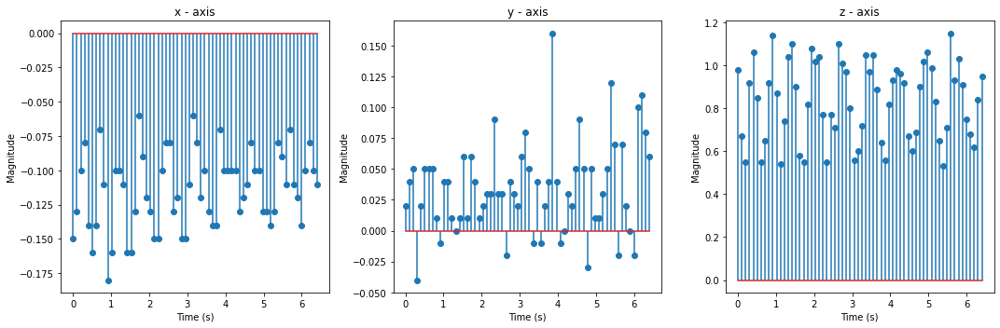

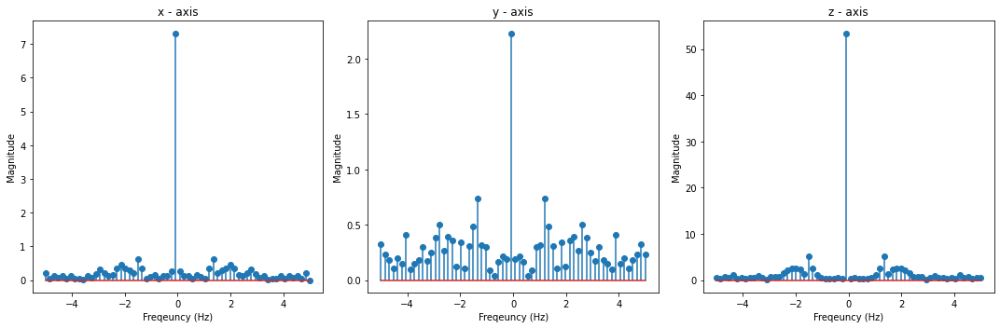

[-0.1, -0.1, -0.11, -0.13, -0.12, -0.07, -0.11, -0.12, -0.1, -0.15, -0.08, -0.11, -0.15, -0.12, -0.1, -0.05, -0.11, -0.12, -0.09, -0.06, -0.08, -0.1, -0.14, -0.13, -0.09, -0.05, -0.07, -0.09, -0.05, -0.05, -0.05, -0.06, -0.1, -0.1, -0.09, -0.07, -0.09, -0.07, -0.09, -0.04, -0.02, -0.07, -0.11, -0.12, -0.1, -0.05, -0.09, -0.1, -0.09, -0.07, -0.07, -0.11, -0.14, -0.15, -0.11, -0.05, -0.07, -0.14, -0.12, -0.08, -0.1, -0.1, -0.16, -0.13]
[0.02, 0.04, 0.05, -0.04, 0.02, 0.05, 0.05, 0.05, 0.01, -0.01, 0.04, 0.04, 0.01, 0.0, 0.01, 0.06, 0.01, 0.06, 0.04, 0.01, 0.02, 0.03, 0.03, 0.09, 0.03, 0.03, -0.02, 0.04, 0.03, 0.02, 0.06, 0.08, 0.05, -0.01, 0.04, -0.01, 0.02, 0.04, 0.16, 0.04, -0.01, -0.0, 0.03, 0.02, 0.05, 0.09, 0.05, -0.03, 0.05, 0.01, 0.01, 0.03, 0.05, 0.12, 0.07, -0.02, 0.07, 0.02, -0.0, -0.02, 0.1, 0.11, 0.08, 0.06]
[0.98, 0.67, 0.55, 0.92, 1.06, 0.85, 0.55, 0.65, 0.92, 1.14, 0.87, 0.54, 0.74, 1.04, 1.1, 0.9, 0.58, 0.55, 0.82, 1.08, 1.02, 1.04, 0.77, 0.55, 0.77, 0.71, 1.1, 1.01, 0.97

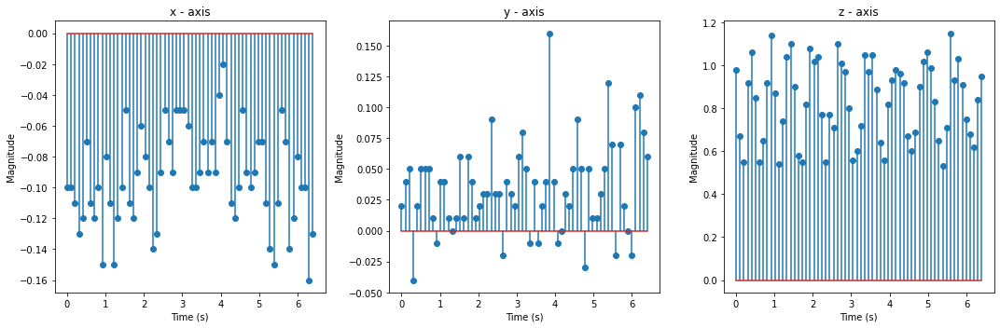

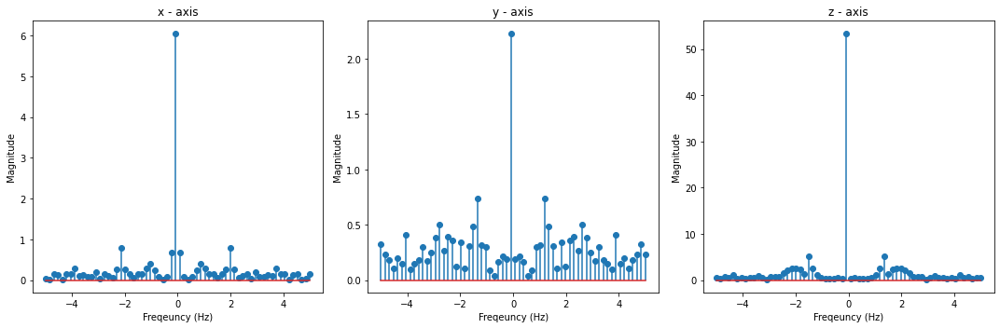

[-0.1, -0.1, -0.11, -0.13, -0.12, -0.07, -0.11, -0.12, -0.1, -0.15, -0.08, -0.11, -0.15, -0.12, -0.1, -0.05, -0.11, -0.12, -0.09, -0.06, -0.08, -0.1, -0.14, -0.13, -0.09, -0.05, -0.07, -0.09, -0.05, -0.05, -0.05, -0.06, -0.1, -0.1, -0.09, -0.07, -0.09, -0.07, -0.09, -0.04, -0.02, -0.07, -0.11, -0.12, -0.1, -0.05, -0.09, -0.1, -0.09, -0.07, -0.07, -0.11, -0.14, -0.15, -0.11, -0.05, -0.07, -0.14, -0.12, -0.08, -0.1, -0.1, -0.16, -0.13]
[0.03, 0.02, 0.03, 0.04, 0.07, 0.09, 0.06, 0.03, 0.06, -0.03, 0.07, 0.02, 0.01, 0.03, 0.11, 0.16, 0.05, 0.04, 0.04, 0.03, -0.02, 0.0, -0.01, -0.0, 0.08, 0.13, 0.08, 0.06, 0.02, 0.05, 0.02, 0.01, -0.01, 0.06, 0.13, 0.1, 0.05, -0.0, 0.04, -0.0, -0.03, 0.01, 0.04, -0.04, 0.1, 0.16, 0.06, 0.02, -0.05, 0.05, 0.01, 0.01, 0.01, 0.01, 0.08, 0.16, 0.11, 0.03, -0.02, 0.05, 0.03, -0.04, -0.06, 0.05]
[0.98, 0.67, 0.55, 0.92, 1.06, 0.85, 0.55, 0.65, 0.92, 1.14, 0.87, 0.54, 0.74, 1.04, 1.1, 0.9, 0.58, 0.55, 0.82, 1.08, 1.02, 1.04, 0.77, 0.55, 0.77, 0.71, 1.1, 1.01, 0.97

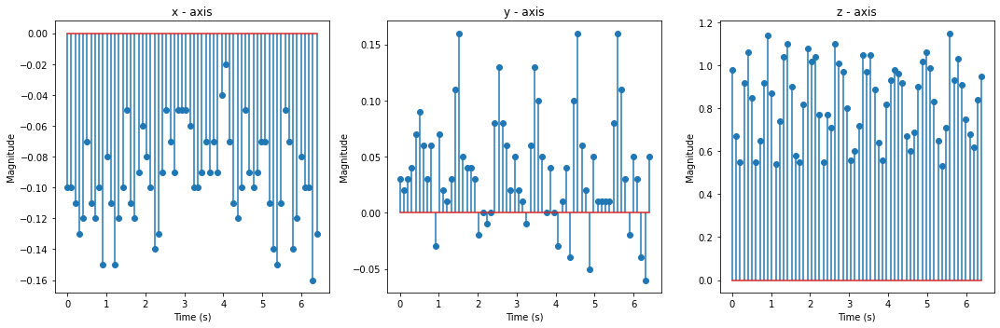

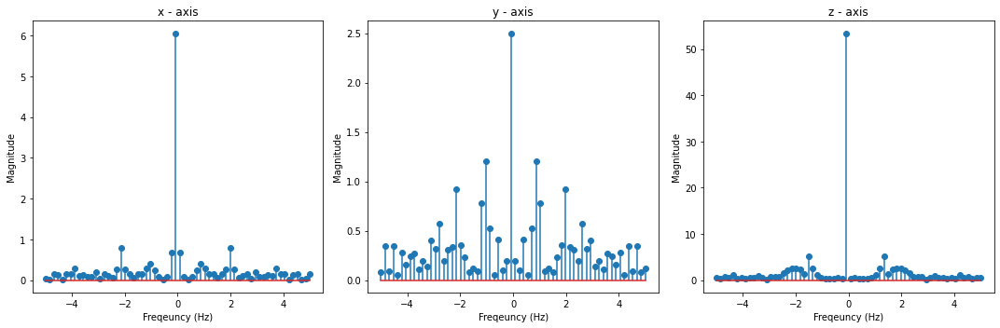

[-0.1, -0.1, -0.11, -0.13, -0.12, -0.07, -0.11, -0.12, -0.1, -0.15, -0.08, -0.11, -0.15, -0.12, -0.1, -0.05, -0.11, -0.12, -0.09, -0.06, -0.08, -0.1, -0.14, -0.13, -0.09, -0.05, -0.07, -0.09, -0.05, -0.05, -0.05, -0.06, -0.1, -0.1, -0.09, -0.07, -0.09, -0.07, -0.09, -0.04, -0.02, -0.07, -0.11, -0.12, -0.1, -0.05, -0.09, -0.1, -0.09, -0.07, -0.07, -0.11, -0.14, -0.15, -0.11, -0.05, -0.07, -0.14, -0.12, -0.08, -0.1, -0.1, -0.16, -0.13]
[0.03, 0.02, 0.03, 0.04, 0.07, 0.09, 0.06, 0.03, 0.06, -0.03, 0.07, 0.02, 0.01, 0.03, 0.11, 0.16, 0.05, 0.04, 0.04, 0.03, -0.02, 0.0, -0.01, -0.0, 0.08, 0.13, 0.08, 0.06, 0.02, 0.05, 0.02, 0.01, -0.01, 0.06, 0.13, 0.1, 0.05, -0.0, 0.04, -0.0, -0.03, 0.01, 0.04, -0.04, 0.1, 0.16, 0.06, 0.02, -0.05, 0.05, 0.01, 0.01, 0.01, 0.01, 0.08, 0.16, 0.11, 0.03, -0.02, 0.05, 0.03, -0.04, -0.06, 0.05]
[0.97, 0.98, 0.83, 0.82, 0.72, 0.56, 0.81, 0.89, 0.87, 1.08, 0.93, 0.92, 0.79, 0.72, 0.71, 0.66, 0.76, 0.93, 0.92, 0.96, 0.92, 0.97, 0.85, 0.75, 0.64, 0.7, 0.69, 0.98, 0.

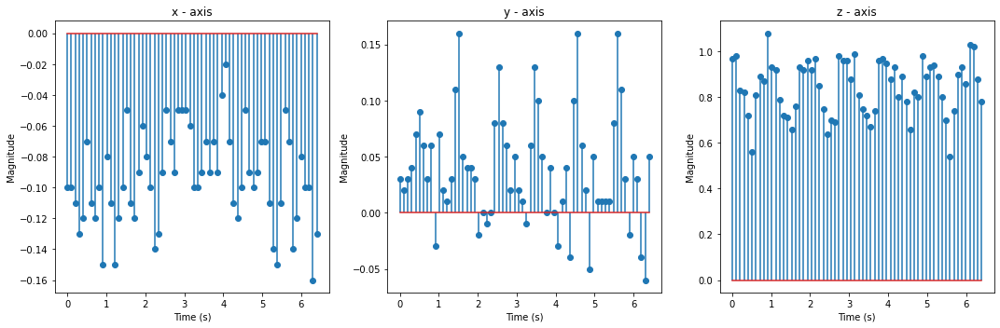

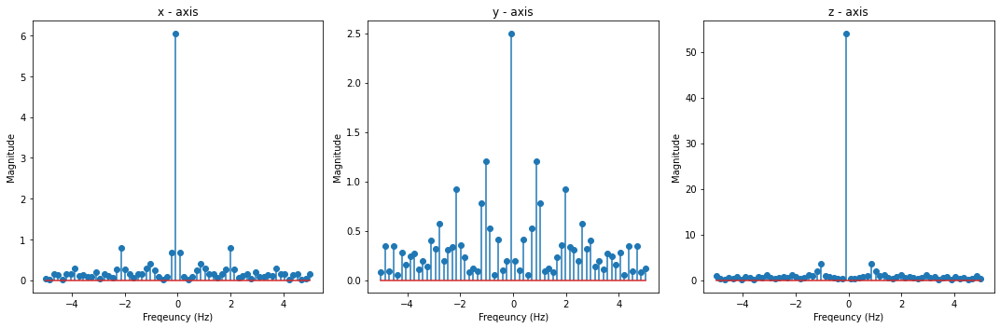

[-0.1, -0.11, -0.13, -0.06, -0.07, -0.1, -0.17, -0.15, -0.07, -0.08, -0.14, -0.11, -0.06, -0.07, -0.1, -0.16, -0.13, -0.06, -0.11, -0.15, -0.06, -0.06, -0.08, -0.16, -0.15, -0.11, -0.14, -0.05, -0.14, -0.07, -0.09, -0.11, -0.15, -0.12, -0.07, -0.12, -0.13, -0.05, -0.07, -0.07, -0.11, -0.12, -0.09, -0.09, -0.11, -0.11, -0.09, -0.07, -0.07, -0.1, -0.13, -0.12, -0.14, -0.09, -0.11, -0.1, -0.12, -0.12, -0.12, -0.1, -0.09, -0.1, -0.09, -0.12]
[0.03, 0.02, 0.03, 0.04, 0.07, 0.09, 0.06, 0.03, 0.06, -0.03, 0.07, 0.02, 0.01, 0.03, 0.11, 0.16, 0.05, 0.04, 0.04, 0.03, -0.02, 0.0, -0.01, -0.0, 0.08, 0.13, 0.08, 0.06, 0.02, 0.05, 0.02, 0.01, -0.01, 0.06, 0.13, 0.1, 0.05, -0.0, 0.04, -0.0, -0.03, 0.01, 0.04, -0.04, 0.1, 0.16, 0.06, 0.02, -0.05, 0.05, 0.01, 0.01, 0.01, 0.01, 0.08, 0.16, 0.11, 0.03, -0.02, 0.05, 0.03, -0.04, -0.06, 0.05]
[0.97, 0.98, 0.83, 0.82, 0.72, 0.56, 0.81, 0.89, 0.87, 1.08, 0.93, 0.92, 0.79, 0.72, 0.71, 0.66, 0.76, 0.93, 0.92, 0.96, 0.92, 0.97, 0.85, 0.75, 0.64, 0.7, 0.69, 0.98

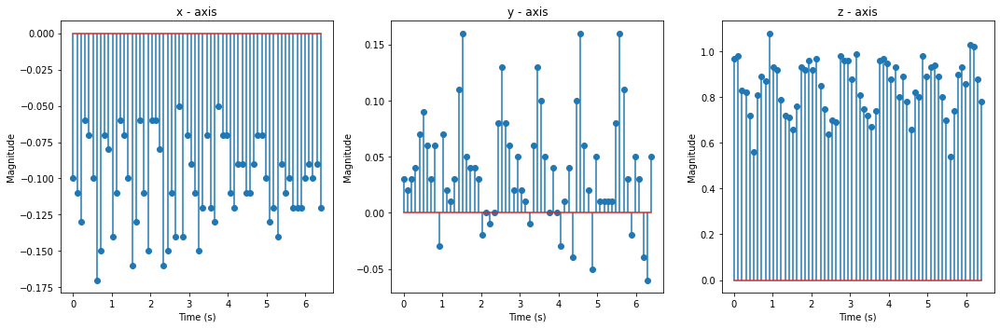

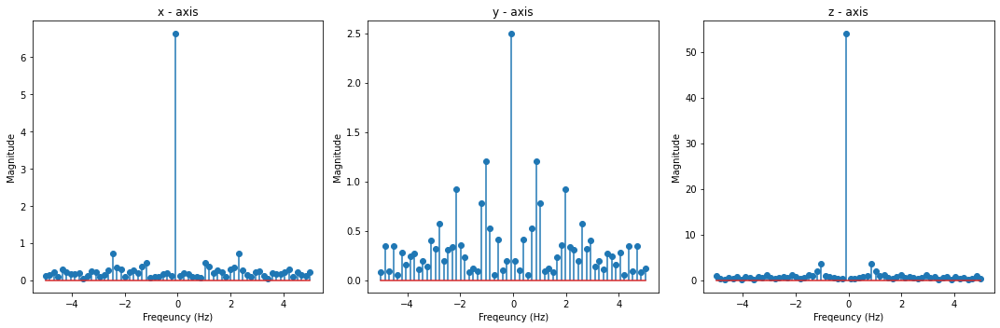

[-0.1, -0.11, -0.13, -0.06, -0.07, -0.1, -0.17, -0.15, -0.07, -0.08, -0.14, -0.11, -0.06, -0.07, -0.1, -0.16, -0.13, -0.06, -0.11, -0.15, -0.06, -0.06, -0.08, -0.16, -0.15, -0.11, -0.14, -0.05, -0.14, -0.07, -0.09, -0.11, -0.15, -0.12, -0.07, -0.12, -0.13, -0.05, -0.07, -0.07, -0.11, -0.12, -0.09, -0.09, -0.11, -0.11, -0.09, -0.07, -0.07, -0.1, -0.13, -0.12, -0.14, -0.09, -0.11, -0.1, -0.12, -0.12, -0.12, -0.1, -0.09, -0.1, -0.09, -0.12]
[0.15, 0.07, -0.04, 0.04, 0.0, 0.02, -0.08, 0.03, 0.21, 0.17, -0.02, -0.0, 0.04, 0.03, -0.03, -0.06, 0.09, 0.27, 0.06, -0.01, 0.05, 0.03, -0.02, -0.04, 0.12, 0.13, 0.03, 0.09, 0.01, 0.06, 0.05, -0.03, -0.01, 0.04, 0.13, 0.03, 0.0, 0.07, 0.02, 0.01, -0.02, 0.02, 0.1, 0.07, 0.05, 0.02, 0.07, 0.01, 0.01, -0.01, 0.01, 0.03, 0.02, 0.15, 0.03, 0.04, 0.03, 0.04, 0.01, 0.03, 0.02, 0.0, 0.03, 0.04]
[0.97, 0.98, 0.83, 0.82, 0.72, 0.56, 0.81, 0.89, 0.87, 1.08, 0.93, 0.92, 0.79, 0.72, 0.71, 0.66, 0.76, 0.93, 0.92, 0.96, 0.92, 0.97, 0.85, 0.75, 0.64, 0.7, 0.69, 0.9

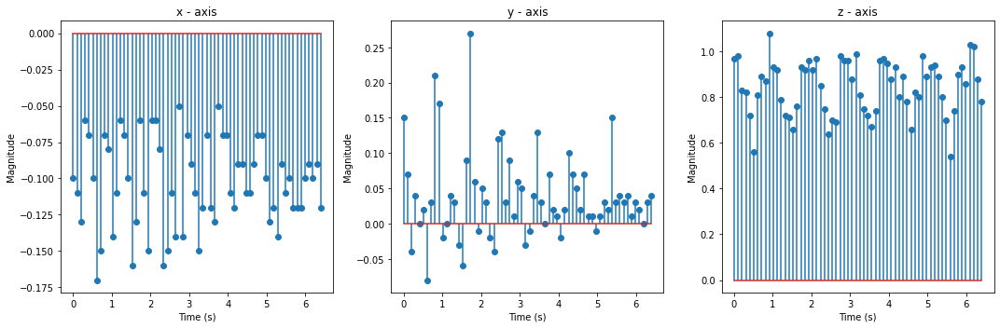

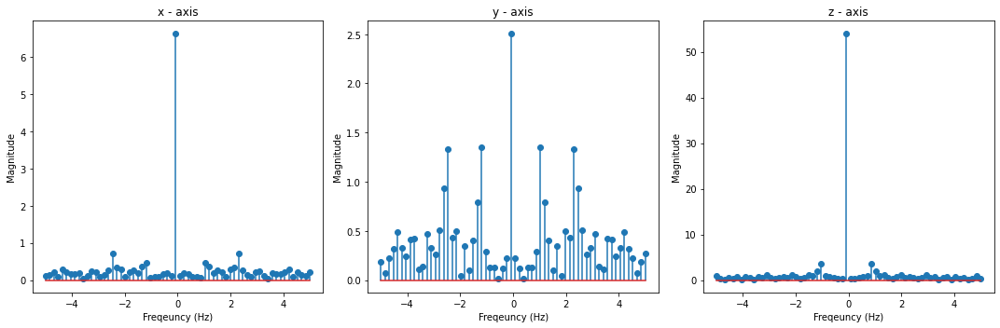

[-0.1, -0.11, -0.13, -0.06, -0.07, -0.1, -0.17, -0.15, -0.07, -0.08, -0.14, -0.11, -0.06, -0.07, -0.1, -0.16, -0.13, -0.06, -0.11, -0.15, -0.06, -0.06, -0.08, -0.16, -0.15, -0.11, -0.14, -0.05, -0.14, -0.07, -0.09, -0.11, -0.15, -0.12, -0.07, -0.12, -0.13, -0.05, -0.07, -0.07, -0.11, -0.12, -0.09, -0.09, -0.11, -0.11, -0.09, -0.07, -0.07, -0.1, -0.13, -0.12, -0.14, -0.09, -0.11, -0.1, -0.12, -0.12, -0.12, -0.1, -0.09, -0.1, -0.09, -0.12]
[0.15, 0.07, -0.04, 0.04, 0.0, 0.02, -0.08, 0.03, 0.21, 0.17, -0.02, -0.0, 0.04, 0.03, -0.03, -0.06, 0.09, 0.27, 0.06, -0.01, 0.05, 0.03, -0.02, -0.04, 0.12, 0.13, 0.03, 0.09, 0.01, 0.06, 0.05, -0.03, -0.01, 0.04, 0.13, 0.03, 0.0, 0.07, 0.02, 0.01, -0.02, 0.02, 0.1, 0.07, 0.05, 0.02, 0.07, 0.01, 0.01, -0.01, 0.01, 0.03, 0.02, 0.15, 0.03, 0.04, 0.03, 0.04, 0.01, 0.03, 0.02, 0.0, 0.03, 0.04]
[0.79, 0.8, 1.05, 0.84, 0.94, 1.0, 0.92, 0.68, 0.58, 0.74, 0.79, 1.03, 0.99, 1.02, 1.01, 0.82, 0.69, 0.6, 0.78, 0.88, 0.89, 1.01, 1.0, 0.76, 0.72, 0.59, 0.74, 0.73, 

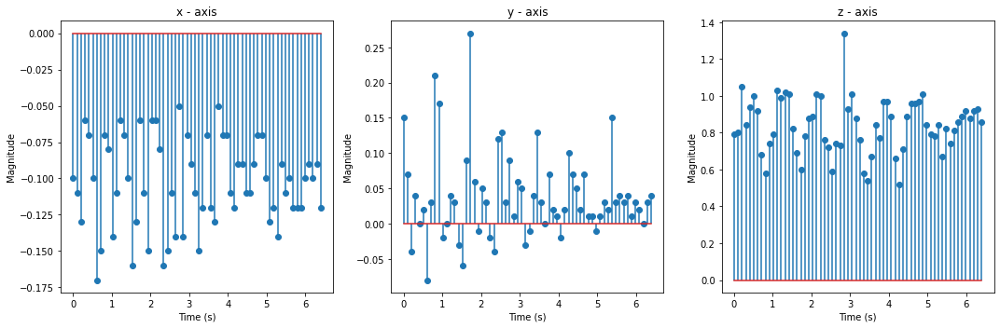

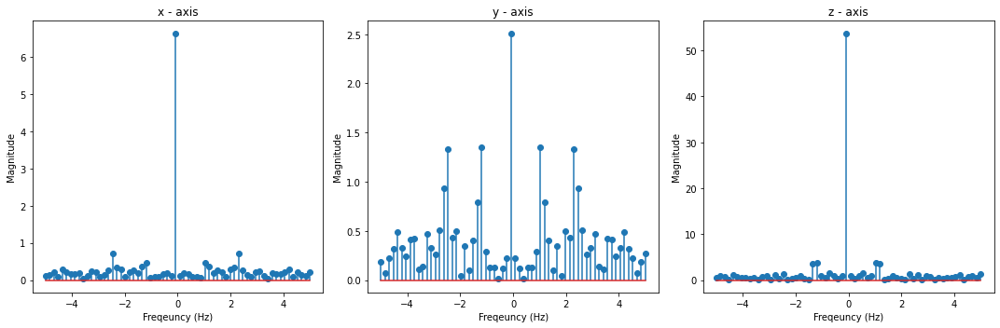

[-0.12, -0.15, -0.14, -0.15, -0.13, -0.16, -0.11, -0.14, -0.13, -0.14, -0.12, -0.11, -0.12, -0.09, -0.08, -0.07, -0.09, -0.11, -0.11, -0.14, -0.14, -0.11, -0.11, -0.14, -0.09, -0.11, -0.1, -0.13, -0.12, -0.12, -0.12, -0.09, -0.08, -0.07, -0.08, -0.1, -0.12, -0.11, -0.11, -0.16, -0.13, -0.07, -0.07, -0.07, -0.08, -0.11, -0.08, -0.09, -0.06, -0.09, -0.07, -0.08, -0.09, -0.08, -0.1, -0.12, -0.11, -0.11, -0.09, -0.08, -0.1, -0.1, -0.12, -0.12]
[0.15, 0.07, -0.04, 0.04, 0.0, 0.02, -0.08, 0.03, 0.21, 0.17, -0.02, -0.0, 0.04, 0.03, -0.03, -0.06, 0.09, 0.27, 0.06, -0.01, 0.05, 0.03, -0.02, -0.04, 0.12, 0.13, 0.03, 0.09, 0.01, 0.06, 0.05, -0.03, -0.01, 0.04, 0.13, 0.03, 0.0, 0.07, 0.02, 0.01, -0.02, 0.02, 0.1, 0.07, 0.05, 0.02, 0.07, 0.01, 0.01, -0.01, 0.01, 0.03, 0.02, 0.15, 0.03, 0.04, 0.03, 0.04, 0.01, 0.03, 0.02, 0.0, 0.03, 0.04]
[0.79, 0.8, 1.05, 0.84, 0.94, 1.0, 0.92, 0.68, 0.58, 0.74, 0.79, 1.03, 0.99, 1.02, 1.01, 0.82, 0.69, 0.6, 0.78, 0.88, 0.89, 1.01, 1.0, 0.76, 0.72, 0.59, 0.74, 0.73

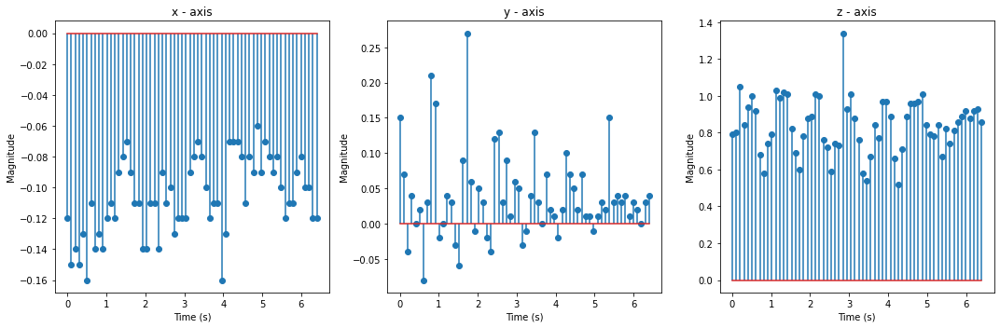

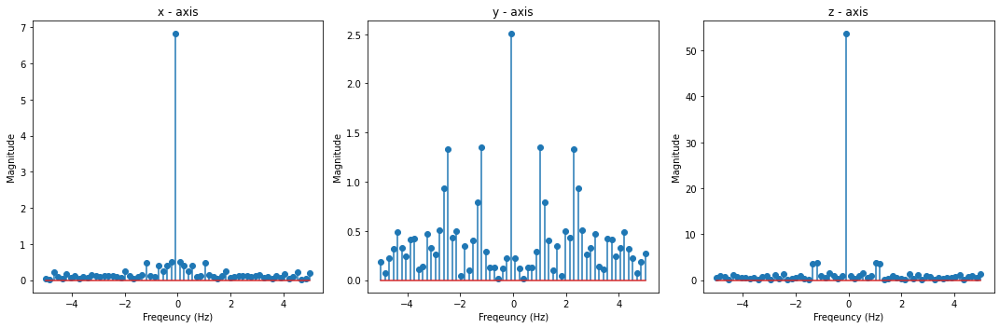

[-0.12, -0.15, -0.14, -0.15, -0.13, -0.16, -0.11, -0.14, -0.13, -0.14, -0.12, -0.11, -0.12, -0.09, -0.08, -0.07, -0.09, -0.11, -0.11, -0.14, -0.14, -0.11, -0.11, -0.14, -0.09, -0.11, -0.1, -0.13, -0.12, -0.12, -0.12, -0.09, -0.08, -0.07, -0.08, -0.1, -0.12, -0.11, -0.11, -0.16, -0.13, -0.07, -0.07, -0.07, -0.08, -0.11, -0.08, -0.09, -0.06, -0.09, -0.07, -0.08, -0.09, -0.08, -0.1, -0.12, -0.11, -0.11, -0.09, -0.08, -0.1, -0.1, -0.12, -0.12]
[0.05, 0.03, 0.01, -0.01, 0.08, 0.06, 0.09, 0.05, 0.08, 0.04, -0.0, 0.03, 0.01, 0.04, 0.01, 0.02, 0.02, -0.0, 0.01, 0.02, 0.04, 0.07, 0.06, 0.06, 0.13, 0.06, 0.11, 0.04, 0.04, 0.01, 0.02, 0.01, 0.02, 0.01, 0.02, 0.02, 0.02, 0.06, 0.06, 0.02, 0.07, 0.1, 0.1, 0.1, 0.1, 0.07, 0.05, 0.02, 0.02, 0.04, 0.03, -0.0, 0.01, 0.0, 0.05, 0.07, 0.08, 0.04, 0.1, 0.08, 0.11, 0.08, 0.04, 0.03]
[0.79, 0.8, 1.05, 0.84, 0.94, 1.0, 0.92, 0.68, 0.58, 0.74, 0.79, 1.03, 0.99, 1.02, 1.01, 0.82, 0.69, 0.6, 0.78, 0.88, 0.89, 1.01, 1.0, 0.76, 0.72, 0.59, 0.74, 0.73, 1.34, 0.93,

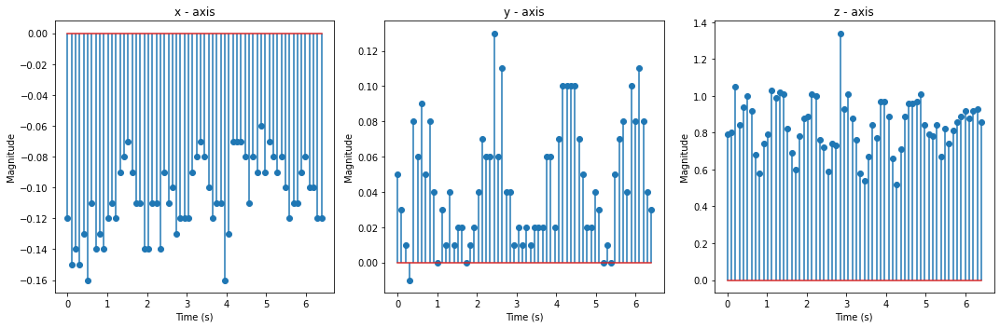

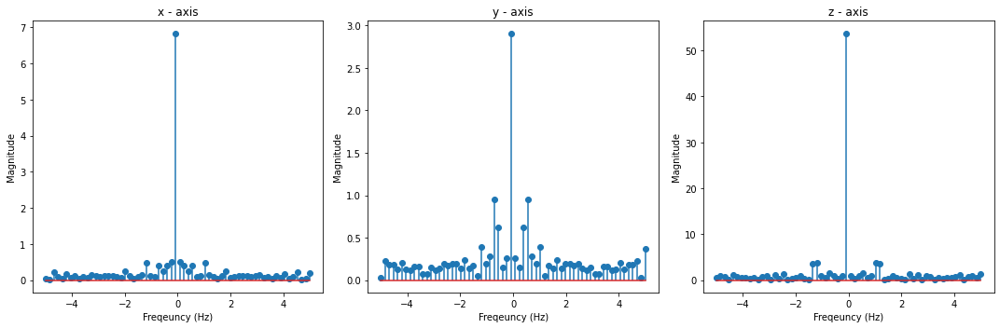

[-0.12, -0.15, -0.14, -0.15, -0.13, -0.16, -0.11, -0.14, -0.13, -0.14, -0.12, -0.11, -0.12, -0.09, -0.08, -0.07, -0.09, -0.11, -0.11, -0.14, -0.14, -0.11, -0.11, -0.14, -0.09, -0.11, -0.1, -0.13, -0.12, -0.12, -0.12, -0.09, -0.08, -0.07, -0.08, -0.1, -0.12, -0.11, -0.11, -0.16, -0.13, -0.07, -0.07, -0.07, -0.08, -0.11, -0.08, -0.09, -0.06, -0.09, -0.07, -0.08, -0.09, -0.08, -0.1, -0.12, -0.11, -0.11, -0.09, -0.08, -0.1, -0.1, -0.12, -0.12]
[0.05, 0.03, 0.01, -0.01, 0.08, 0.06, 0.09, 0.05, 0.08, 0.04, -0.0, 0.03, 0.01, 0.04, 0.01, 0.02, 0.02, -0.0, 0.01, 0.02, 0.04, 0.07, 0.06, 0.06, 0.13, 0.06, 0.11, 0.04, 0.04, 0.01, 0.02, 0.01, 0.02, 0.01, 0.02, 0.02, 0.02, 0.06, 0.06, 0.02, 0.07, 0.1, 0.1, 0.1, 0.1, 0.07, 0.05, 0.02, 0.02, 0.04, 0.03, -0.0, 0.01, 0.0, 0.05, 0.07, 0.08, 0.04, 0.1, 0.08, 0.11, 0.08, 0.04, 0.03]
[0.87, 0.87, 0.82, 0.84, 0.83, 0.81, 0.74, 0.83, 0.82, 0.84, 0.82, 0.82, 0.89, 0.84, 0.89, 0.86, 0.96, 0.9, 0.89, 0.87, 0.81, 0.83, 0.89, 0.84, 0.7, 0.79, 0.74, 0.84, 0.84, 0.8

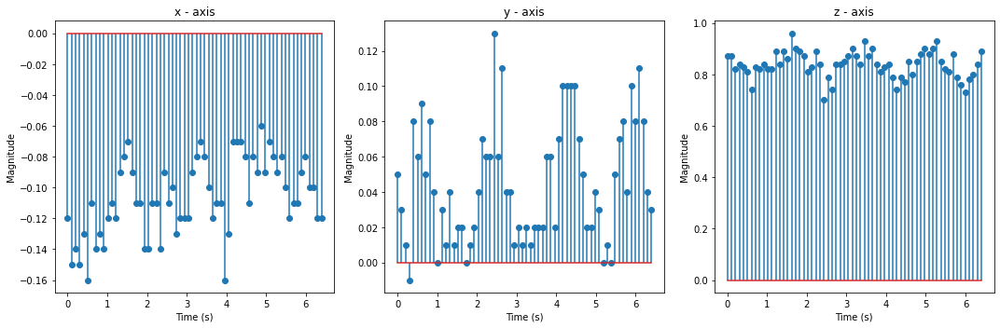

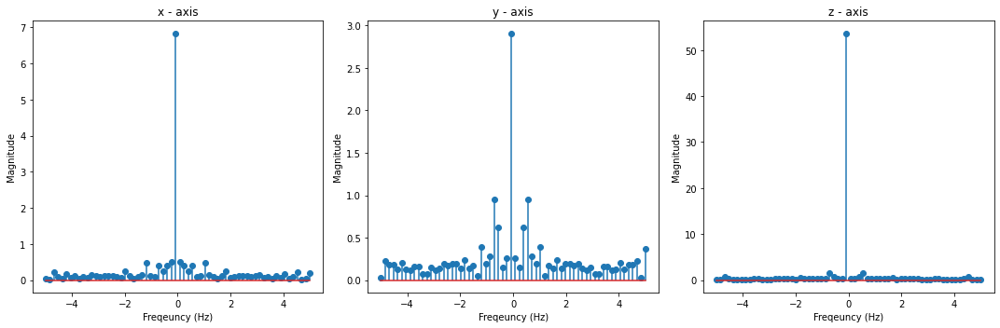

[-0.12, -0.1, -0.08, -0.09, -0.06, -0.1, -0.11, -0.13, -0.15, -0.15, -0.12, -0.11, -0.07, -0.09, -0.11, -0.09, -0.08, -0.1, -0.1, -0.08, -0.07, -0.07, -0.12, -0.14, -0.13, -0.14, -0.15, -0.14, -0.1, -0.1, -0.12, -0.11, -0.1, -0.11, -0.1, -0.08, -0.07, -0.07, -0.07, -0.06, -0.08, -0.11, -0.11, -0.12, -0.12, -0.13, -0.11, -0.06, -0.09, -0.11, -0.09, -0.1, -0.11, -0.12, -0.04, -0.03, -0.21, 0.01, 0.02, -0.22, 0.09, 0.07, -0.07, 0.09]
[0.05, 0.03, 0.01, -0.01, 0.08, 0.06, 0.09, 0.05, 0.08, 0.04, -0.0, 0.03, 0.01, 0.04, 0.01, 0.02, 0.02, -0.0, 0.01, 0.02, 0.04, 0.07, 0.06, 0.06, 0.13, 0.06, 0.11, 0.04, 0.04, 0.01, 0.02, 0.01, 0.02, 0.01, 0.02, 0.02, 0.02, 0.06, 0.06, 0.02, 0.07, 0.1, 0.1, 0.1, 0.1, 0.07, 0.05, 0.02, 0.02, 0.04, 0.03, -0.0, 0.01, 0.0, 0.05, 0.07, 0.08, 0.04, 0.1, 0.08, 0.11, 0.08, 0.04, 0.03]
[0.87, 0.87, 0.82, 0.84, 0.83, 0.81, 0.74, 0.83, 0.82, 0.84, 0.82, 0.82, 0.89, 0.84, 0.89, 0.86, 0.96, 0.9, 0.89, 0.87, 0.81, 0.83, 0.89, 0.84, 0.7, 0.79, 0.74, 0.84, 0.84, 0.85, 0.87, 

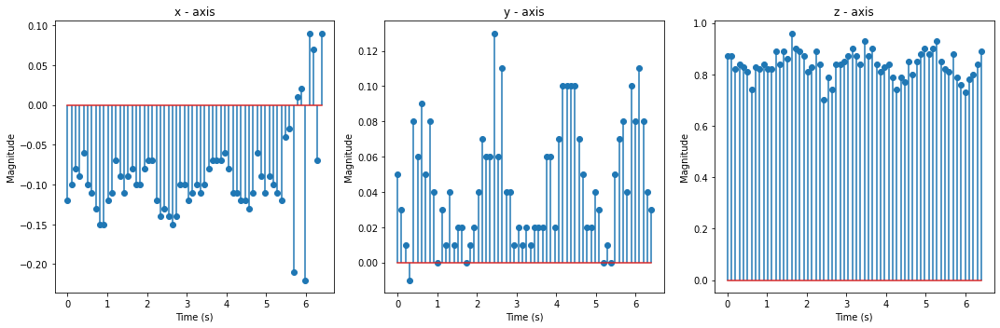

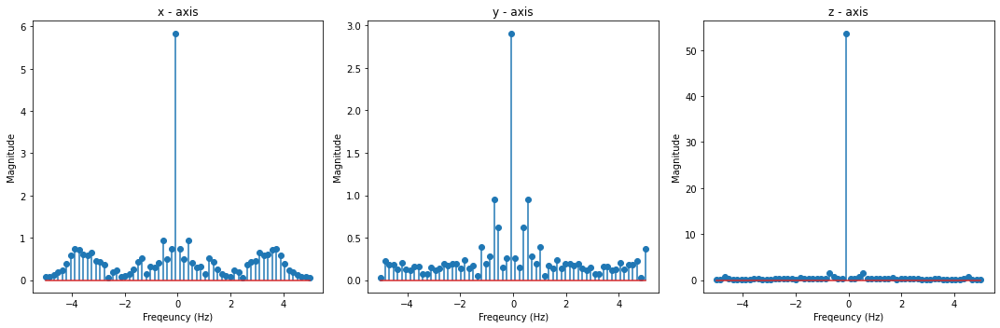

[-0.12, -0.1, -0.08, -0.09, -0.06, -0.1, -0.11, -0.13, -0.15, -0.15, -0.12, -0.11, -0.07, -0.09, -0.11, -0.09, -0.08, -0.1, -0.1, -0.08, -0.07, -0.07, -0.12, -0.14, -0.13, -0.14, -0.15, -0.14, -0.1, -0.1, -0.12, -0.11, -0.1, -0.11, -0.1, -0.08, -0.07, -0.07, -0.07, -0.06, -0.08, -0.11, -0.11, -0.12, -0.12, -0.13, -0.11, -0.06, -0.09, -0.11, -0.09, -0.1, -0.11, -0.12, -0.04, -0.03, -0.21, 0.01, 0.02, -0.22, 0.09, 0.07, -0.07, 0.09]
[0.03, 0.09, 0.04, 0.03, 0.07, 0.04, 0.04, 0.05, 0.07, 0.08, 0.1, 0.14, 0.14, 0.09, 0.06, 0.06, 0.07, 0.08, -0.01, 0.05, 0.04, 0.01, 0.01, 0.05, 0.08, 0.04, 0.04, 0.04, 0.1, 0.09, 0.08, 0.07, 0.02, 0.01, 0.01, -0.0, 0.05, 0.04, 0.06, 0.03, 0.01, 0.01, 0.03, 0.04, 0.03, 0.07, 0.08, 0.14, 0.1, 0.0, 0.01, -0.05, -0.01, 0.03, 0.18, -0.03, -0.18, 0.16, 0.13, -0.09, 0.12, -0.05, -0.01, 0.21]
[0.87, 0.87, 0.82, 0.84, 0.83, 0.81, 0.74, 0.83, 0.82, 0.84, 0.82, 0.82, 0.89, 0.84, 0.89, 0.86, 0.96, 0.9, 0.89, 0.87, 0.81, 0.83, 0.89, 0.84, 0.7, 0.79, 0.74, 0.84, 0.84, 0.8

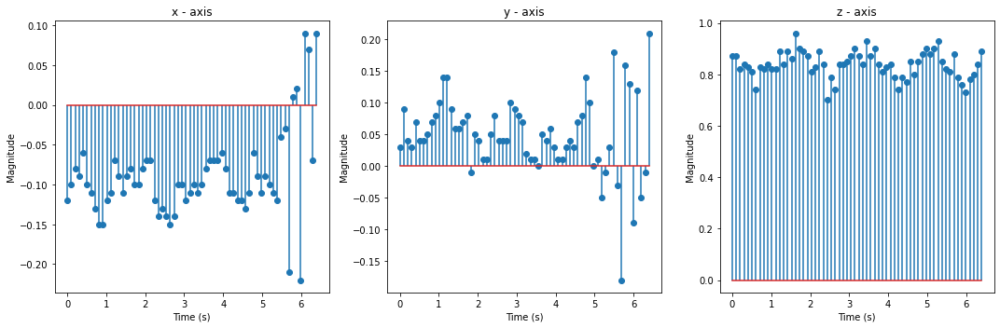

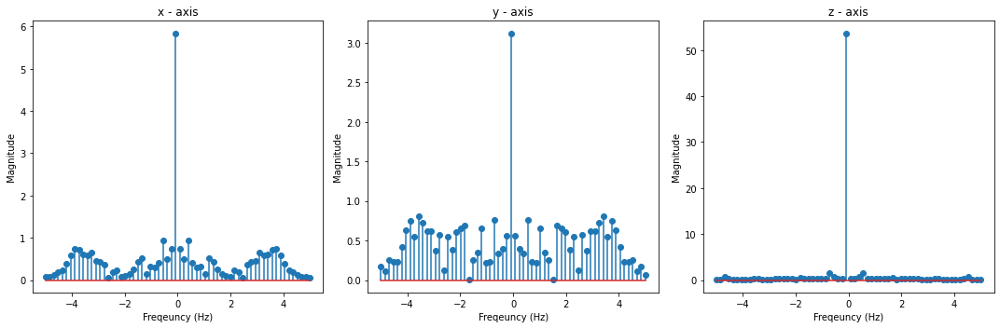

[-0.12, -0.1, -0.08, -0.09, -0.06, -0.1, -0.11, -0.13, -0.15, -0.15, -0.12, -0.11, -0.07, -0.09, -0.11, -0.09, -0.08, -0.1, -0.1, -0.08, -0.07, -0.07, -0.12, -0.14, -0.13, -0.14, -0.15, -0.14, -0.1, -0.1, -0.12, -0.11, -0.1, -0.11, -0.1, -0.08, -0.07, -0.07, -0.07, -0.06, -0.08, -0.11, -0.11, -0.12, -0.12, -0.13, -0.11, -0.06, -0.09, -0.11, -0.09, -0.1, -0.11, -0.12, -0.04, -0.03, -0.21, 0.01, 0.02, -0.22, 0.09, 0.07, -0.07, 0.09]
[0.03, 0.09, 0.04, 0.03, 0.07, 0.04, 0.04, 0.05, 0.07, 0.08, 0.1, 0.14, 0.14, 0.09, 0.06, 0.06, 0.07, 0.08, -0.01, 0.05, 0.04, 0.01, 0.01, 0.05, 0.08, 0.04, 0.04, 0.04, 0.1, 0.09, 0.08, 0.07, 0.02, 0.01, 0.01, -0.0, 0.05, 0.04, 0.06, 0.03, 0.01, 0.01, 0.03, 0.04, 0.03, 0.07, 0.08, 0.14, 0.1, 0.0, 0.01, -0.05, -0.01, 0.03, 0.18, -0.03, -0.18, 0.16, 0.13, -0.09, 0.12, -0.05, -0.01, 0.21]
[0.88, 0.85, 0.84, 0.82, 0.84, 0.96, 0.92, 0.84, 0.83, 0.84, 0.82, 0.81, 0.71, 0.85, 0.86, 0.83, 0.81, 0.99, 0.95, 0.83, 0.91, 0.92, 0.96, 0.88, 0.88, 0.83, 0.85, 0.81, 0.76, 0

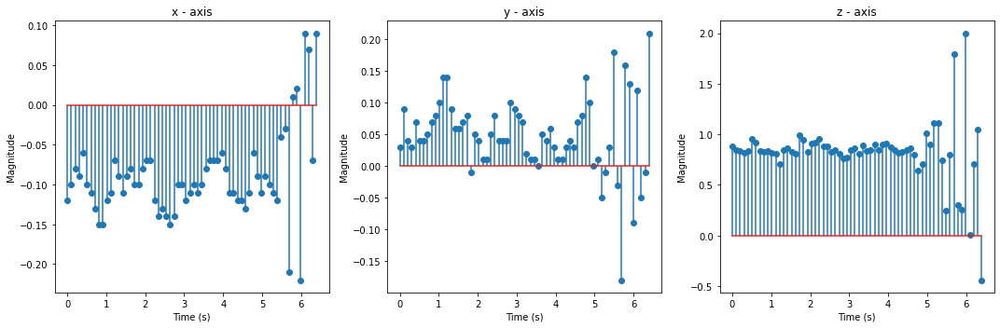

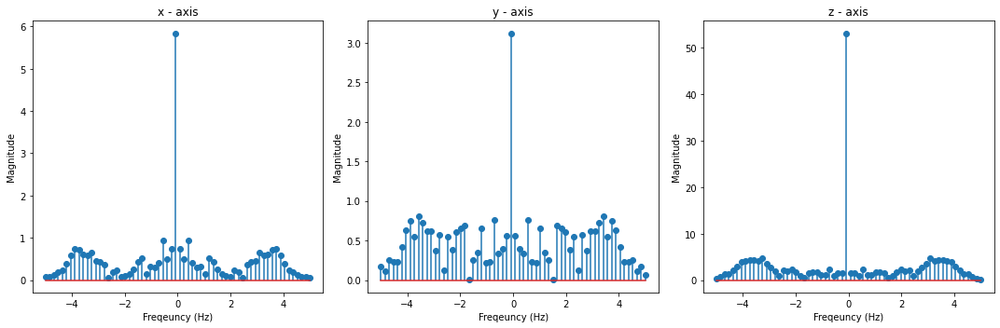

[0.09, 0.07, 0.14, -0.1, 0.07, -0.27, -0.02, 0.16, -0.27, 0.15, -0.05, -0.12, 0.15, -0.33, 0.1, 0.17, -0.13, 0.12, -0.28, 0.09, 0.16, -0.26, 0.22, -0.14, -0.12, 0.24, -0.2, 0.04, 0.02, 0.05, 0.16, -0.19, 0.05, 0.01, -0.06, 0.11, -0.28, 0.07, -0.0, -0.11, 0.07, -0.17, -0.05, 0.14, -0.24, 0.09, 0.04, -0.09, 0.03, -0.17, -0.07, 0.07, -0.24, 0.03, 0.13, -0.11, 0.1, -0.15, -0.02, 0.13, -0.18, 0.1, -0.1, -0.13]
[0.03, 0.09, 0.04, 0.03, 0.07, 0.04, 0.04, 0.05, 0.07, 0.08, 0.1, 0.14, 0.14, 0.09, 0.06, 0.06, 0.07, 0.08, -0.01, 0.05, 0.04, 0.01, 0.01, 0.05, 0.08, 0.04, 0.04, 0.04, 0.1, 0.09, 0.08, 0.07, 0.02, 0.01, 0.01, -0.0, 0.05, 0.04, 0.06, 0.03, 0.01, 0.01, 0.03, 0.04, 0.03, 0.07, 0.08, 0.14, 0.1, 0.0, 0.01, -0.05, -0.01, 0.03, 0.18, -0.03, -0.18, 0.16, 0.13, -0.09, 0.12, -0.05, -0.01, 0.21]
[0.88, 0.85, 0.84, 0.82, 0.84, 0.96, 0.92, 0.84, 0.83, 0.84, 0.82, 0.81, 0.71, 0.85, 0.86, 0.83, 0.81, 0.99, 0.95, 0.83, 0.91, 0.92, 0.96, 0.88, 0.88, 0.83, 0.85, 0.81, 0.76, 0.77, 0.85, 0.86, 0.81, 0.8

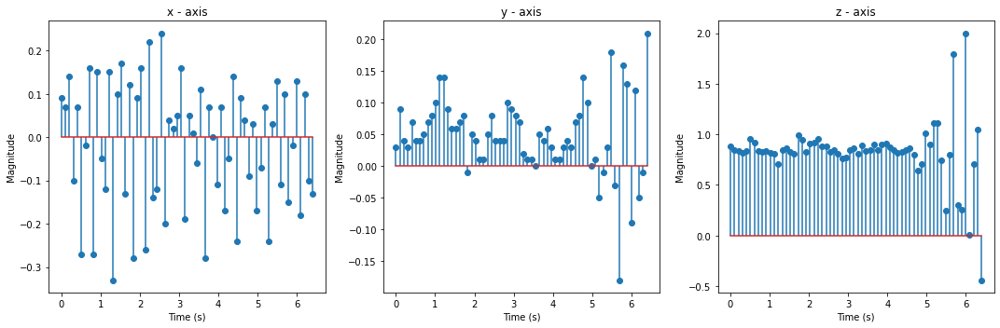

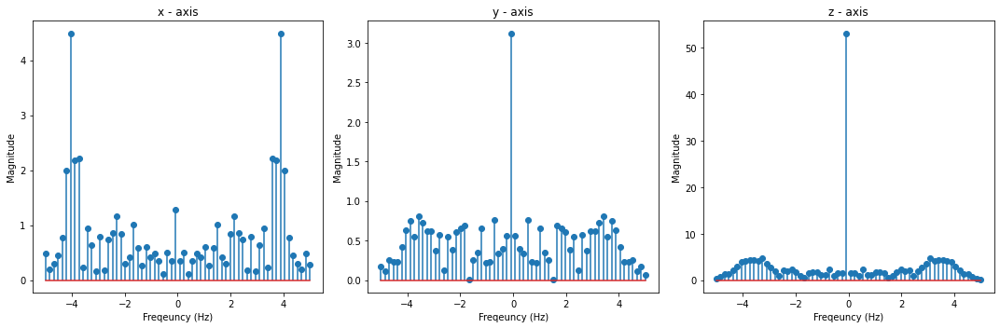

[0.09, 0.07, 0.14, -0.1, 0.07, -0.27, -0.02, 0.16, -0.27, 0.15, -0.05, -0.12, 0.15, -0.33, 0.1, 0.17, -0.13, 0.12, -0.28, 0.09, 0.16, -0.26, 0.22, -0.14, -0.12, 0.24, -0.2, 0.04, 0.02, 0.05, 0.16, -0.19, 0.05, 0.01, -0.06, 0.11, -0.28, 0.07, -0.0, -0.11, 0.07, -0.17, -0.05, 0.14, -0.24, 0.09, 0.04, -0.09, 0.03, -0.17, -0.07, 0.07, -0.24, 0.03, 0.13, -0.11, 0.1, -0.15, -0.02, 0.13, -0.18, 0.1, -0.1, -0.13]
[0.21, 0.1, 0.0, -0.04, 0.18, -0.51, 0.11, 0.18, -0.14, 0.19, -0.38, -0.12, 0.31, -0.41, 0.17, -0.0, -0.08, 0.26, -0.4, 0.23, -0.07, -0.12, 0.32, -0.37, -0.08, 0.4, -0.35, 0.05, -0.29, 0.12, 0.15, -0.06, 0.12, -0.34, -0.03, 0.2, -0.32, 0.05, -0.06, -0.05, 0.18, -0.22, 0.04, 0.26, -0.21, 0.16, -0.13, -0.04, 0.27, -0.37, 0.02, 0.25, -0.18, 0.21, -0.11, -0.09, 0.23, -0.58, 0.16, 0.21, -0.11, 0.29, -0.32, 0.01]
[0.88, 0.85, 0.84, 0.82, 0.84, 0.96, 0.92, 0.84, 0.83, 0.84, 0.82, 0.81, 0.71, 0.85, 0.86, 0.83, 0.81, 0.99, 0.95, 0.83, 0.91, 0.92, 0.96, 0.88, 0.88, 0.83, 0.85, 0.81, 0.76, 0.77,

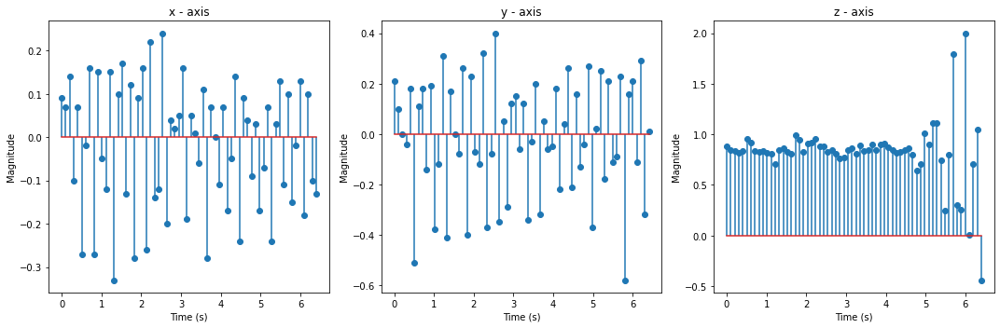

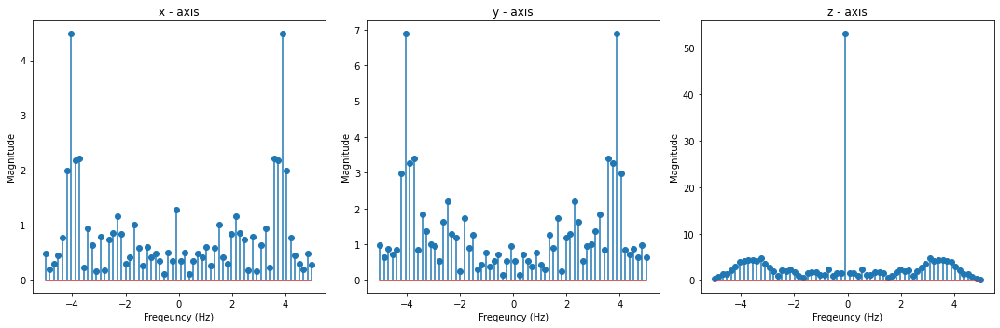

[0.09, 0.07, 0.14, -0.1, 0.07, -0.27, -0.02, 0.16, -0.27, 0.15, -0.05, -0.12, 0.15, -0.33, 0.1, 0.17, -0.13, 0.12, -0.28, 0.09, 0.16, -0.26, 0.22, -0.14, -0.12, 0.24, -0.2, 0.04, 0.02, 0.05, 0.16, -0.19, 0.05, 0.01, -0.06, 0.11, -0.28, 0.07, -0.0, -0.11, 0.07, -0.17, -0.05, 0.14, -0.24, 0.09, 0.04, -0.09, 0.03, -0.17, -0.07, 0.07, -0.24, 0.03, 0.13, -0.11, 0.1, -0.15, -0.02, 0.13, -0.18, 0.1, -0.1, -0.13]
[0.21, 0.1, 0.0, -0.04, 0.18, -0.51, 0.11, 0.18, -0.14, 0.19, -0.38, -0.12, 0.31, -0.41, 0.17, -0.0, -0.08, 0.26, -0.4, 0.23, -0.07, -0.12, 0.32, -0.37, -0.08, 0.4, -0.35, 0.05, -0.29, 0.12, 0.15, -0.06, 0.12, -0.34, -0.03, 0.2, -0.32, 0.05, -0.06, -0.05, 0.18, -0.22, 0.04, 0.26, -0.21, 0.16, -0.13, -0.04, 0.27, -0.37, 0.02, 0.25, -0.18, 0.21, -0.11, -0.09, 0.23, -0.58, 0.16, 0.21, -0.11, 0.29, -0.32, 0.01]
[-0.44, 0.05, 0.25, 1.25, -0.42, 2.0, 0.19, -0.22, 2.0, -0.27, 1.52, 0.7, -0.48, 2.0, -0.06, 0.18, 1.3, -0.57, 2.0, 0.05, 0.3, 1.47, -0.32, 2.0, 0.66, -0.12, 1.97, -0.04, 2.0, 0.15

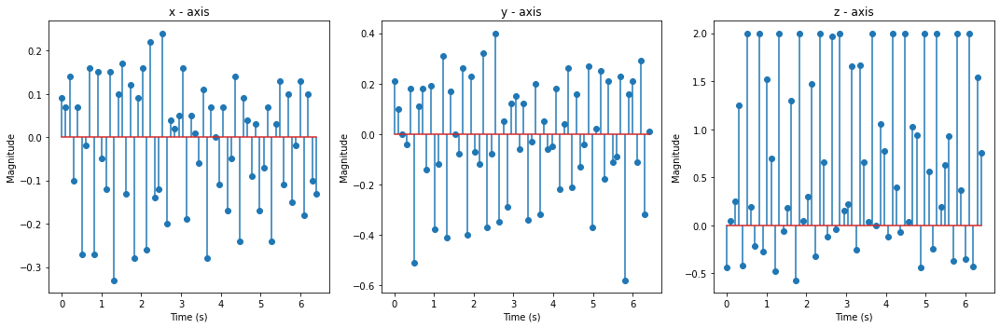

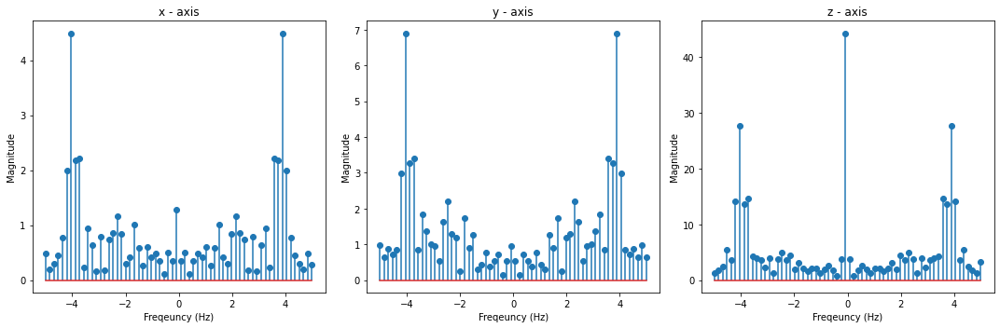

[-0.32, 0.12, 0.13, -0.28, 0.18, 0.02, -0.16, 0.17, -0.23, 0.04, 0.22, -0.13, 0.17, -0.07, -0.04, 0.22, -0.23, 0.18, 0.15, -0.11, 0.19, -0.06, 0.06, 0.19, -0.11, 0.14, 0.02, 0.01, 0.12, -0.09, 0.14, 0.04, -0.01, 0.17, -0.13, 0.12, 0.21, -0.06, 0.15, -0.08, 0.1, 0.18, -0.12, 0.2, -0.11, -0.04, 0.16, -0.25, 0.14, -0.02, -0.12, 0.21, -0.23, 0.03, 0.19, -0.17, 0.1, -0.21, -0.01, 0.18, -0.2, 0.12, -0.04, -0.08]
[0.21, 0.1, 0.0, -0.04, 0.18, -0.51, 0.11, 0.18, -0.14, 0.19, -0.38, -0.12, 0.31, -0.41, 0.17, -0.0, -0.08, 0.26, -0.4, 0.23, -0.07, -0.12, 0.32, -0.37, -0.08, 0.4, -0.35, 0.05, -0.29, 0.12, 0.15, -0.06, 0.12, -0.34, -0.03, 0.2, -0.32, 0.05, -0.06, -0.05, 0.18, -0.22, 0.04, 0.26, -0.21, 0.16, -0.13, -0.04, 0.27, -0.37, 0.02, 0.25, -0.18, 0.21, -0.11, -0.09, 0.23, -0.58, 0.16, 0.21, -0.11, 0.29, -0.32, 0.01]
[-0.44, 0.05, 0.25, 1.25, -0.42, 2.0, 0.19, -0.22, 2.0, -0.27, 1.52, 0.7, -0.48, 2.0, -0.06, 0.18, 1.3, -0.57, 2.0, 0.05, 0.3, 1.47, -0.32, 2.0, 0.66, -0.12, 1.97, -0.04, 2.0, 0.1

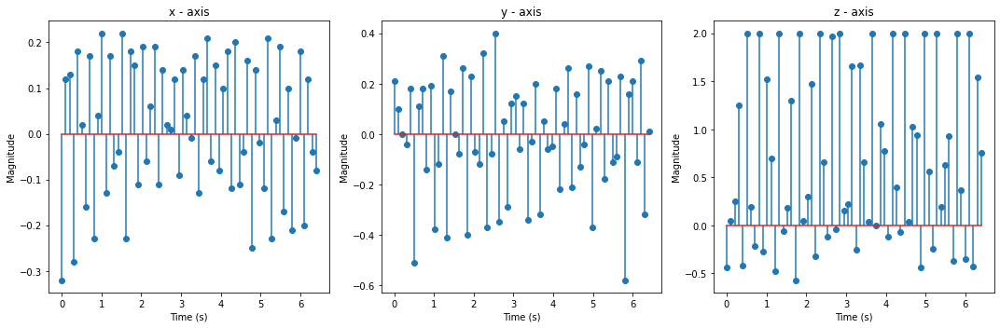

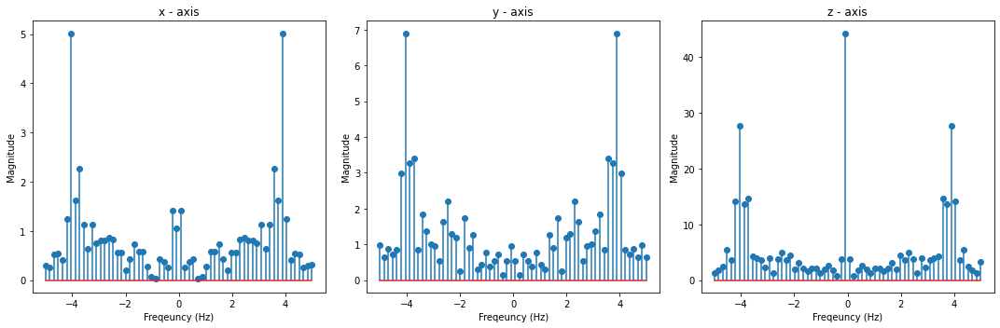

[-0.32, 0.12, 0.13, -0.28, 0.18, 0.02, -0.16, 0.17, -0.23, 0.04, 0.22, -0.13, 0.17, -0.07, -0.04, 0.22, -0.23, 0.18, 0.15, -0.11, 0.19, -0.06, 0.06, 0.19, -0.11, 0.14, 0.02, 0.01, 0.12, -0.09, 0.14, 0.04, -0.01, 0.17, -0.13, 0.12, 0.21, -0.06, 0.15, -0.08, 0.1, 0.18, -0.12, 0.2, -0.11, -0.04, 0.16, -0.25, 0.14, -0.02, -0.12, 0.21, -0.23, 0.03, 0.19, -0.17, 0.1, -0.21, -0.01, 0.18, -0.2, 0.12, -0.04, -0.08]
[-0.31, 0.31, 0.09, -0.15, 0.37, -0.27, -0.07, 0.34, -0.4, 0.16, 0.2, -0.13, 0.27, -0.48, 0.01, 0.38, -0.25, 0.33, 0.03, -0.24, 0.33, -0.54, 0.24, 0.07, -0.17, 0.32, -0.31, 0.14, 0.29, -0.2, 0.28, -0.63, 0.09, 0.28, -0.36, 0.22, -0.34, -0.09, 0.37, -0.4, 0.17, 0.18, -0.11, 0.29, -0.42, 0.06, 0.31, -0.2, 0.32, -0.38, 0.11, 0.22, 0.0, 0.22, 0.28, 0.05, 0.22, -0.17, 0.14, 0.33, -0.01, 0.34, -0.42, 0.09]
[-0.44, 0.05, 0.25, 1.25, -0.42, 2.0, 0.19, -0.22, 2.0, -0.27, 1.52, 0.7, -0.48, 2.0, -0.06, 0.18, 1.3, -0.57, 2.0, 0.05, 0.3, 1.47, -0.32, 2.0, 0.66, -0.12, 1.97, -0.04, 2.0, 0.15, 0.22

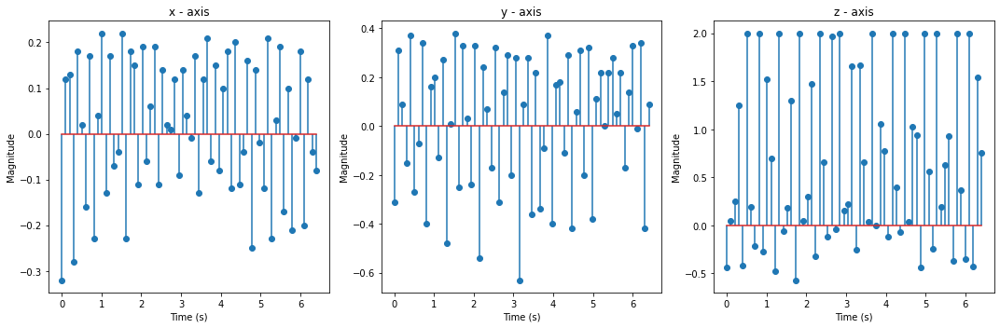

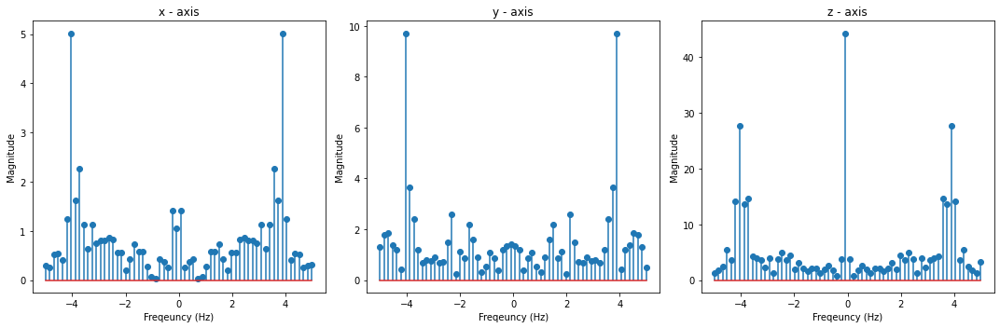

[-0.32, 0.12, 0.13, -0.28, 0.18, 0.02, -0.16, 0.17, -0.23, 0.04, 0.22, -0.13, 0.17, -0.07, -0.04, 0.22, -0.23, 0.18, 0.15, -0.11, 0.19, -0.06, 0.06, 0.19, -0.11, 0.14, 0.02, 0.01, 0.12, -0.09, 0.14, 0.04, -0.01, 0.17, -0.13, 0.12, 0.21, -0.06, 0.15, -0.08, 0.1, 0.18, -0.12, 0.2, -0.11, -0.04, 0.16, -0.25, 0.14, -0.02, -0.12, 0.21, -0.23, 0.03, 0.19, -0.17, 0.1, -0.21, -0.01, 0.18, -0.2, 0.12, -0.04, -0.08]
[-0.31, 0.31, 0.09, -0.15, 0.37, -0.27, -0.07, 0.34, -0.4, 0.16, 0.2, -0.13, 0.27, -0.48, 0.01, 0.38, -0.25, 0.33, 0.03, -0.24, 0.33, -0.54, 0.24, 0.07, -0.17, 0.32, -0.31, 0.14, 0.29, -0.2, 0.28, -0.63, 0.09, 0.28, -0.36, 0.22, -0.34, -0.09, 0.37, -0.4, 0.17, 0.18, -0.11, 0.29, -0.42, 0.06, 0.31, -0.2, 0.32, -0.38, 0.11, 0.22, 0.0, 0.22, 0.28, 0.05, 0.22, -0.17, 0.14, 0.33, -0.01, 0.34, -0.42, 0.09]
[2.0, -0.1, -0.12, 2.0, -0.36, 1.26, 0.86, -0.55, 2.0, 0.07, -0.06, 1.63, -0.42, 2.0, 0.41, -0.42, 2.0, -0.24, 1.07, 0.82, -0.6, 2.0, 0.07, 0.02, 1.57, -0.2, 2.0, 0.71, -0.36, 2.0, -0.46

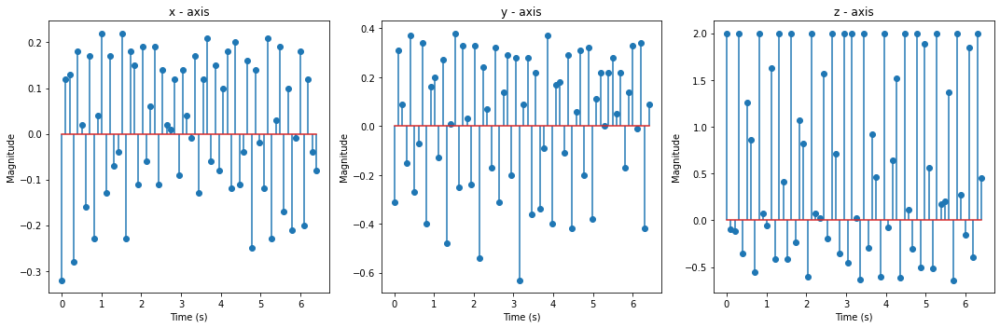

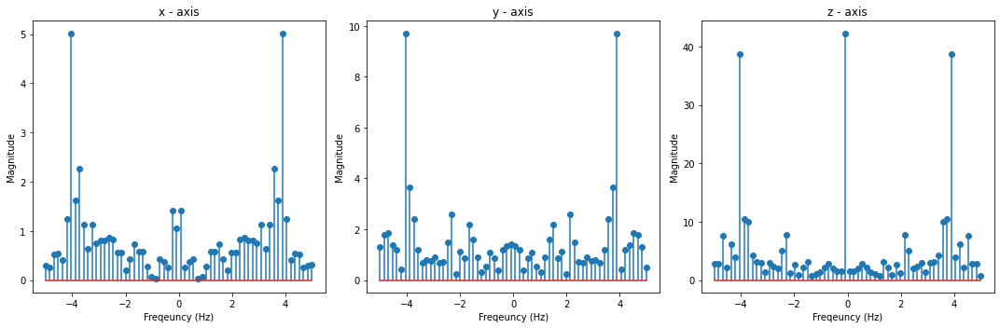

[-0.07, -0.27, 0.09, 0.12, -0.13, 0.13, -0.36, 0.2, 0.11, -0.26, 0.18, -0.15, -0.02, 0.19, -0.28, 0.22, -0.06, -0.14, 0.25, -0.25, 0.14, 0.16, -0.14, 0.12, -0.15, 0.01, 0.19, -0.19, 0.1, -0.09, -0.07, 0.22, -0.13, 0.09, 0.01, -0.0, 0.23, -0.12, 0.11, 0.03, -0.09, 0.19, -0.13, 0.1, -0.15, 0.02, 0.17, -0.1, 0.09, -0.01, -0.02, 0.13, -0.02, 0.09, -0.01, -0.04, 0.11, -0.14, 0.05, 0.17, -0.16, 0.11, -0.15, 0.13]
[-0.31, 0.31, 0.09, -0.15, 0.37, -0.27, -0.07, 0.34, -0.4, 0.16, 0.2, -0.13, 0.27, -0.48, 0.01, 0.38, -0.25, 0.33, 0.03, -0.24, 0.33, -0.54, 0.24, 0.07, -0.17, 0.32, -0.31, 0.14, 0.29, -0.2, 0.28, -0.63, 0.09, 0.28, -0.36, 0.22, -0.34, -0.09, 0.37, -0.4, 0.17, 0.18, -0.11, 0.29, -0.42, 0.06, 0.31, -0.2, 0.32, -0.38, 0.11, 0.22, 0.0, 0.22, 0.28, 0.05, 0.22, -0.17, 0.14, 0.33, -0.01, 0.34, -0.42, 0.09]
[2.0, -0.1, -0.12, 2.0, -0.36, 1.26, 0.86, -0.55, 2.0, 0.07, -0.06, 1.63, -0.42, 2.0, 0.41, -0.42, 2.0, -0.24, 1.07, 0.82, -0.6, 2.0, 0.07, 0.02, 1.57, -0.2, 2.0, 0.71, -0.36, 2.0, -0.4

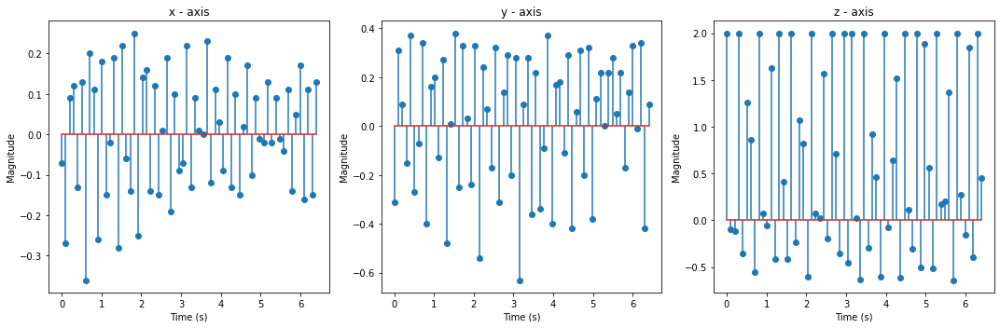

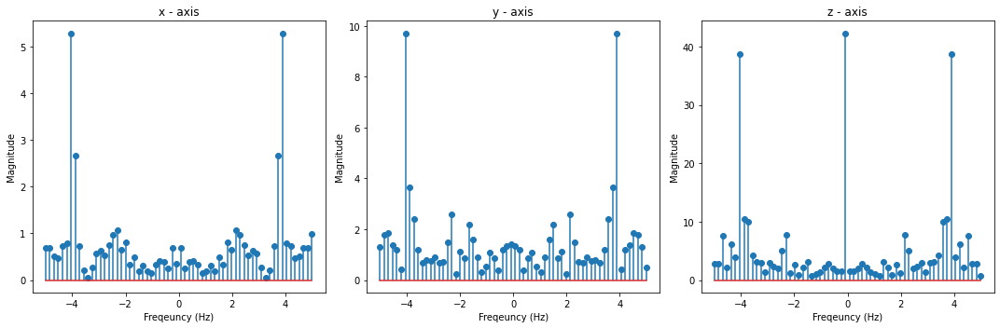

[-0.07, -0.27, 0.09, 0.12, -0.13, 0.13, -0.36, 0.2, 0.11, -0.26, 0.18, -0.15, -0.02, 0.19, -0.28, 0.22, -0.06, -0.14, 0.25, -0.25, 0.14, 0.16, -0.14, 0.12, -0.15, 0.01, 0.19, -0.19, 0.1, -0.09, -0.07, 0.22, -0.13, 0.09, 0.01, -0.0, 0.23, -0.12, 0.11, 0.03, -0.09, 0.19, -0.13, 0.1, -0.15, 0.02, 0.17, -0.1, 0.09, -0.01, -0.02, 0.13, -0.02, 0.09, -0.01, -0.04, 0.11, -0.14, 0.05, 0.17, -0.16, 0.11, -0.15, 0.13]
[0.11, -0.37, 0.31, -0.06, -0.13, 0.49, -0.62, 0.56, 0.0, -0.14, 0.43, -1.0, 0.27, 0.24, -0.36, 0.67, -0.5, -0.02, 0.54, -0.44, 0.39, -0.19, -0.2, 0.44, -0.76, 0.26, 0.43, -0.17, 0.41, -0.51, 0.07, 0.46, -0.25, 0.38, -0.55, 0.16, 0.36, -0.29, 0.41, -0.39, 0.06, 0.37, -0.23, 0.5, -0.63, 0.19, 0.13, -0.15, 0.33, -0.53, 0.24, 0.29, -0.1, 0.31, -0.49, 0.15, 0.3, -0.34, 0.31, 0.06, -0.14, 0.48, -0.82, 0.34]
[2.0, -0.1, -0.12, 2.0, -0.36, 1.26, 0.86, -0.55, 2.0, 0.07, -0.06, 1.63, -0.42, 2.0, 0.41, -0.42, 2.0, -0.24, 1.07, 0.82, -0.6, 2.0, 0.07, 0.02, 1.57, -0.2, 2.0, 0.71, -0.36, 2.0, -0

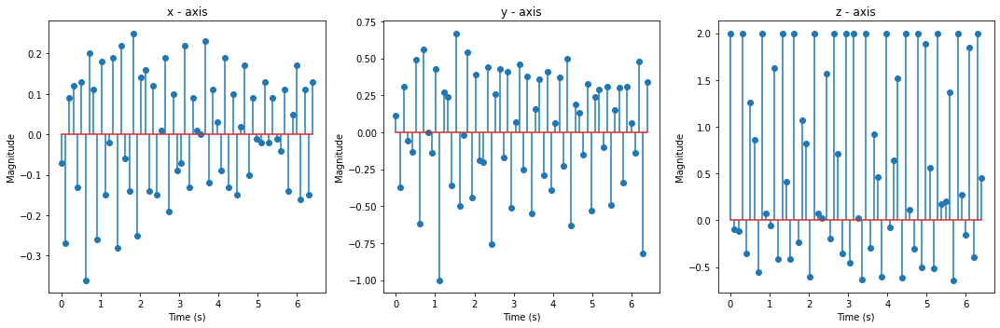

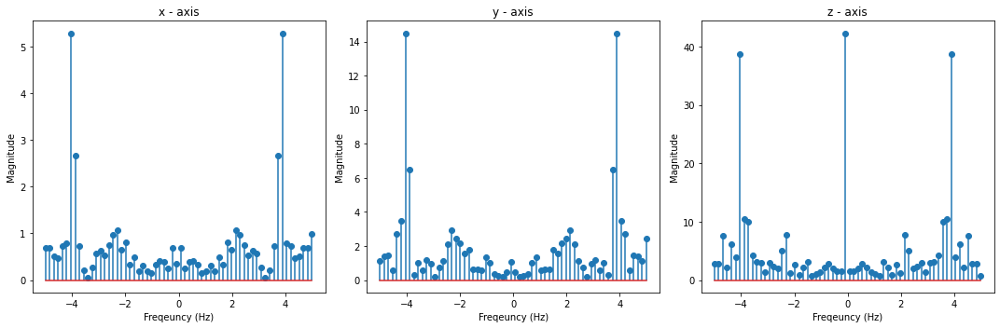

[-0.07, -0.27, 0.09, 0.12, -0.13, 0.13, -0.36, 0.2, 0.11, -0.26, 0.18, -0.15, -0.02, 0.19, -0.28, 0.22, -0.06, -0.14, 0.25, -0.25, 0.14, 0.16, -0.14, 0.12, -0.15, 0.01, 0.19, -0.19, 0.1, -0.09, -0.07, 0.22, -0.13, 0.09, 0.01, -0.0, 0.23, -0.12, 0.11, 0.03, -0.09, 0.19, -0.13, 0.1, -0.15, 0.02, 0.17, -0.1, 0.09, -0.01, -0.02, 0.13, -0.02, 0.09, -0.01, -0.04, 0.11, -0.14, 0.05, 0.17, -0.16, 0.11, -0.15, 0.13]
[0.11, -0.37, 0.31, -0.06, -0.13, 0.49, -0.62, 0.56, 0.0, -0.14, 0.43, -1.0, 0.27, 0.24, -0.36, 0.67, -0.5, -0.02, 0.54, -0.44, 0.39, -0.19, -0.2, 0.44, -0.76, 0.26, 0.43, -0.17, 0.41, -0.51, 0.07, 0.46, -0.25, 0.38, -0.55, 0.16, 0.36, -0.29, 0.41, -0.39, 0.06, 0.37, -0.23, 0.5, -0.63, 0.19, 0.13, -0.15, 0.33, -0.53, 0.24, 0.29, -0.1, 0.31, -0.49, 0.15, 0.3, -0.34, 0.31, 0.06, -0.14, 0.48, -0.82, 0.34]
[0.42, 2.0, -0.16, 0.26, 0.9, -0.59, 2.0, -0.31, 0.31, 1.62, -0.69, 2.0, 0.1, -0.1, 1.65, -0.51, 1.24, 0.52, -0.66, 2.0, -0.32, 0.76, 0.77, -0.68, 2.0, 0.25, -0.35, 2.0, -0.66, 2.0, 0

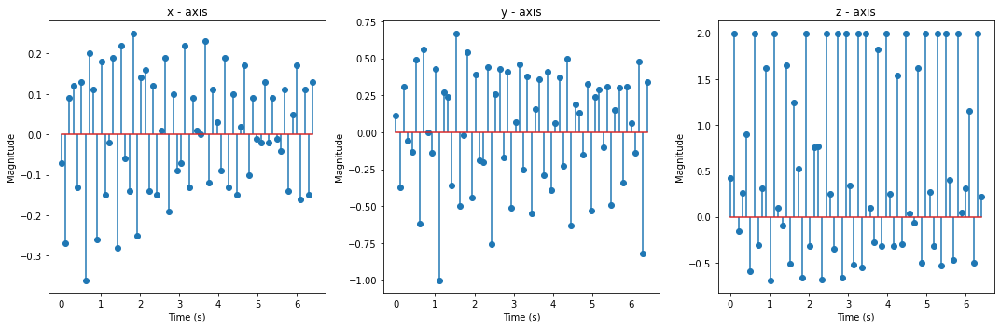

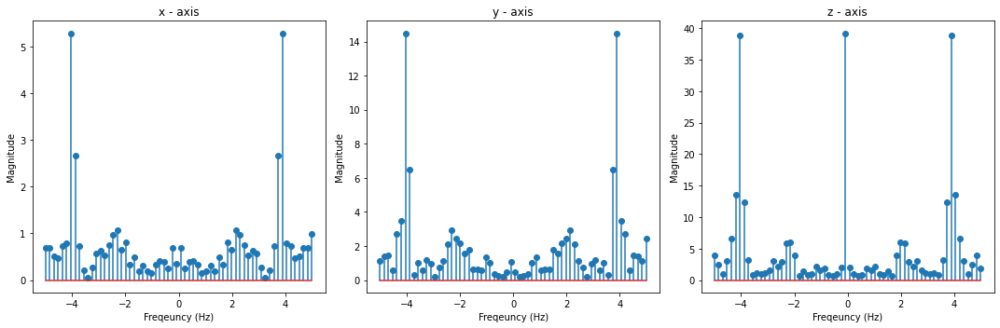

[-0.15, 0.1, -0.01, 0.08, 0.15, -0.04, 0.1, 0.1, 0.01, 0.1, 0.05, 0.09, 0.11, -0.02, 0.11, -0.02, 0.12, 0.12, -0.07, 0.16, 0.07, 0.06, 0.12, 0.01, 0.12, 0.04, 0.08, 0.26, -0.02, 0.16, -0.03, 0.01, 0.23, -0.08, 0.07, 0.25, -0.09, 0.21, 0.09, 0.05, 0.24, -0.09, 0.15, 0.06, 0.03, 0.19, -0.12, 0.1, 0.01, 0.04, 0.2, -0.05, 0.11, 0.06, 0.03, 0.19, 0.02, 0.11, 0.13, -0.03, 0.14, 0.88, 0.09, 0.15]
[0.11, -0.37, 0.31, -0.06, -0.13, 0.49, -0.62, 0.56, 0.0, -0.14, 0.43, -1.0, 0.27, 0.24, -0.36, 0.67, -0.5, -0.02, 0.54, -0.44, 0.39, -0.19, -0.2, 0.44, -0.76, 0.26, 0.43, -0.17, 0.41, -0.51, 0.07, 0.46, -0.25, 0.38, -0.55, 0.16, 0.36, -0.29, 0.41, -0.39, 0.06, 0.37, -0.23, 0.5, -0.63, 0.19, 0.13, -0.15, 0.33, -0.53, 0.24, 0.29, -0.1, 0.31, -0.49, 0.15, 0.3, -0.34, 0.31, 0.06, -0.14, 0.48, -0.82, 0.34]
[0.42, 2.0, -0.16, 0.26, 0.9, -0.59, 2.0, -0.31, 0.31, 1.62, -0.69, 2.0, 0.1, -0.1, 1.65, -0.51, 1.24, 0.52, -0.66, 2.0, -0.32, 0.76, 0.77, -0.68, 2.0, 0.25, -0.35, 2.0, -0.66, 2.0, 0.34, -0.52, 2.0, -

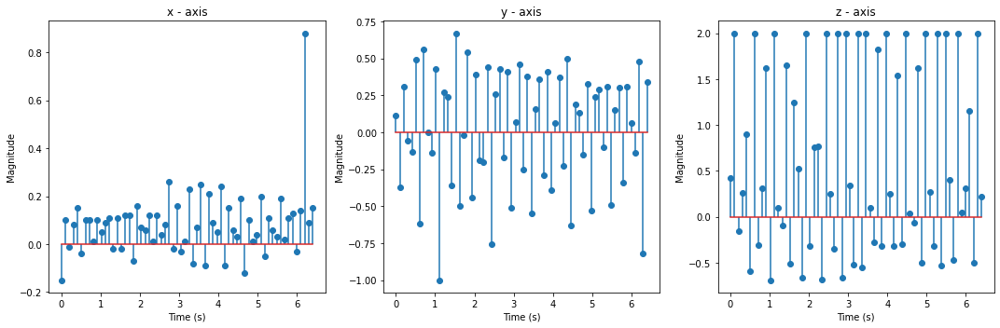

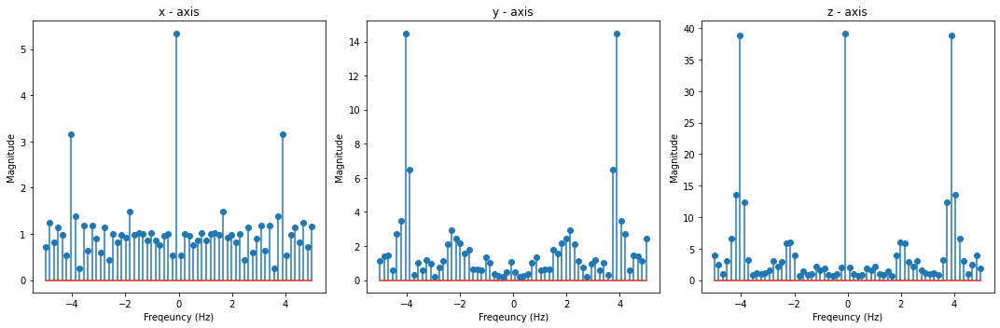

[-0.15, 0.1, -0.01, 0.08, 0.15, -0.04, 0.1, 0.1, 0.01, 0.1, 0.05, 0.09, 0.11, -0.02, 0.11, -0.02, 0.12, 0.12, -0.07, 0.16, 0.07, 0.06, 0.12, 0.01, 0.12, 0.04, 0.08, 0.26, -0.02, 0.16, -0.03, 0.01, 0.23, -0.08, 0.07, 0.25, -0.09, 0.21, 0.09, 0.05, 0.24, -0.09, 0.15, 0.06, 0.03, 0.19, -0.12, 0.1, 0.01, 0.04, 0.2, -0.05, 0.11, 0.06, 0.03, 0.19, 0.02, 0.11, 0.13, -0.03, 0.14, 0.88, 0.09, 0.15]
[-0.19, 0.4, -0.63, 0.24, 0.1, -0.08, 0.33, -0.47, 0.16, 0.09, -0.21, 0.25, -0.55, 0.05, 0.29, -0.26, 0.35, -0.5, 0.03, 0.36, -0.08, 0.42, -0.47, 0.01, 0.43, -0.23, 0.4, -0.31, -0.1, 0.56, -0.46, 0.35, 0.01, -0.18, 0.36, -0.65, 0.16, 0.38, -0.22, 0.35, -0.5, 0.06, 0.39, -0.22, 0.23, -0.14, -0.07, 0.32, -0.23, 0.2, 0.04, -0.09, 0.41, -0.19, 0.1, 0.28, 0.06, 0.3, -0.4, 0.04, 0.4, 0.07, 0.28, -0.28]
[0.42, 2.0, -0.16, 0.26, 0.9, -0.59, 2.0, -0.31, 0.31, 1.62, -0.69, 2.0, 0.1, -0.1, 1.65, -0.51, 1.24, 0.52, -0.66, 2.0, -0.32, 0.76, 0.77, -0.68, 2.0, 0.25, -0.35, 2.0, -0.66, 2.0, 0.34, -0.52, 2.0, -0.55, 

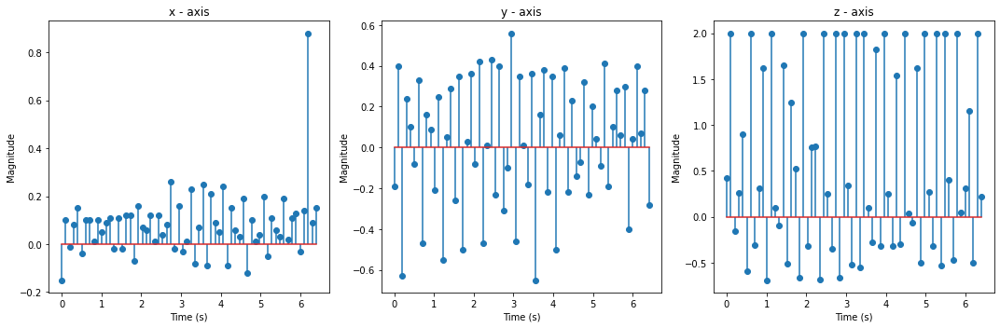

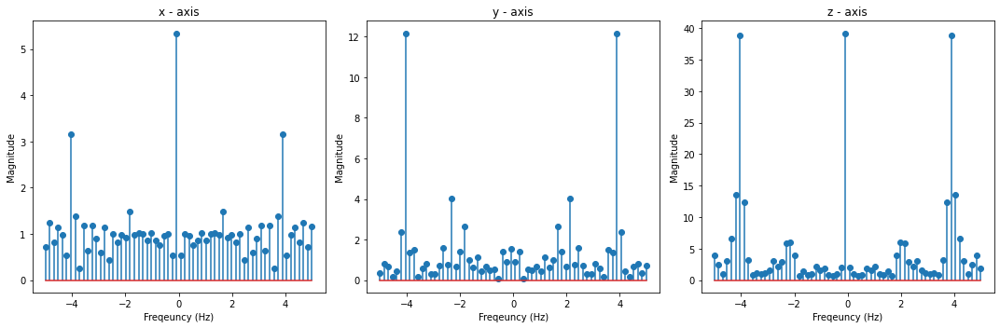

[-0.15, 0.1, -0.01, 0.08, 0.15, -0.04, 0.1, 0.1, 0.01, 0.1, 0.05, 0.09, 0.11, -0.02, 0.11, -0.02, 0.12, 0.12, -0.07, 0.16, 0.07, 0.06, 0.12, 0.01, 0.12, 0.04, 0.08, 0.26, -0.02, 0.16, -0.03, 0.01, 0.23, -0.08, 0.07, 0.25, -0.09, 0.21, 0.09, 0.05, 0.24, -0.09, 0.15, 0.06, 0.03, 0.19, -0.12, 0.1, 0.01, 0.04, 0.2, -0.05, 0.11, 0.06, 0.03, 0.19, 0.02, 0.11, 0.13, -0.03, 0.14, 0.88, 0.09, 0.15]
[-0.19, 0.4, -0.63, 0.24, 0.1, -0.08, 0.33, -0.47, 0.16, 0.09, -0.21, 0.25, -0.55, 0.05, 0.29, -0.26, 0.35, -0.5, 0.03, 0.36, -0.08, 0.42, -0.47, 0.01, 0.43, -0.23, 0.4, -0.31, -0.1, 0.56, -0.46, 0.35, 0.01, -0.18, 0.36, -0.65, 0.16, 0.38, -0.22, 0.35, -0.5, 0.06, 0.39, -0.22, 0.23, -0.14, -0.07, 0.32, -0.23, 0.2, 0.04, -0.09, 0.41, -0.19, 0.1, 0.28, 0.06, 0.3, -0.4, 0.04, 0.4, 0.07, 0.28, -0.28]
[1.96, -0.52, 2.0, 0.07, -0.03, 2.0, -0.59, 2.0, 0.11, -0.44, 2.0, -0.35, 2.0, 0.19, -0.52, 2.0, -0.3, 1.59, 0.29, -0.57, 2.0, -0.28, 1.89, 0.48, -0.62, 2.0, -0.12, 0.56, 0.65, -0.61, 2.0, -0.09, 0.16, 1.07,

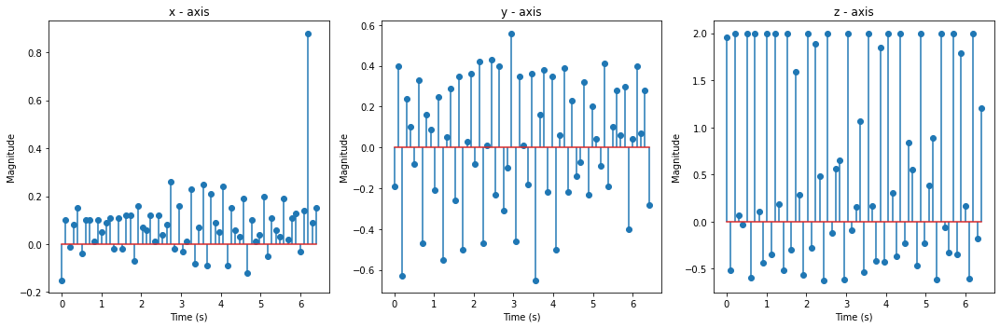

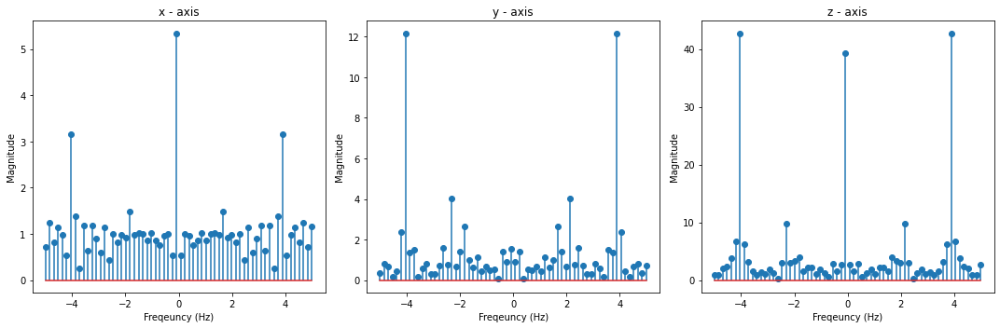

[-0.02, 0.17, 0.07, 0.08, 0.16, 0.03, 0.19, -0.0, 0.15, 0.12, -0.03, 0.14, 0.06, 0.1, 0.19, -0.06, 0.13, 0.06, -0.01, 0.24, 0.01, 0.1, 0.12, -0.07, 0.17, 0.01, 0.04, 0.1, -0.08, 0.2, -0.17, 0.1, 0.11, -0.1, 0.18, -0.07, 0.0, 0.14, -0.16, 0.11, -0.03, -0.05, 0.21, -0.07, 0.07, 0.21, -0.15, 0.17, 0.01, 0.04, 0.18, -0.08, 0.04, 0.07, 0.04, 0.09, 0.05, 0.02, 0.03, -0.04, -0.08, -0.83, -0.15, -0.13]
[-0.19, 0.4, -0.63, 0.24, 0.1, -0.08, 0.33, -0.47, 0.16, 0.09, -0.21, 0.25, -0.55, 0.05, 0.29, -0.26, 0.35, -0.5, 0.03, 0.36, -0.08, 0.42, -0.47, 0.01, 0.43, -0.23, 0.4, -0.31, -0.1, 0.56, -0.46, 0.35, 0.01, -0.18, 0.36, -0.65, 0.16, 0.38, -0.22, 0.35, -0.5, 0.06, 0.39, -0.22, 0.23, -0.14, -0.07, 0.32, -0.23, 0.2, 0.04, -0.09, 0.41, -0.19, 0.1, 0.28, 0.06, 0.3, -0.4, 0.04, 0.4, 0.07, 0.28, -0.28]
[1.96, -0.52, 2.0, 0.07, -0.03, 2.0, -0.59, 2.0, 0.11, -0.44, 2.0, -0.35, 2.0, 0.19, -0.52, 2.0, -0.3, 1.59, 0.29, -0.57, 2.0, -0.28, 1.89, 0.48, -0.62, 2.0, -0.12, 0.56, 0.65, -0.61, 2.0, -0.09, 0.16, 

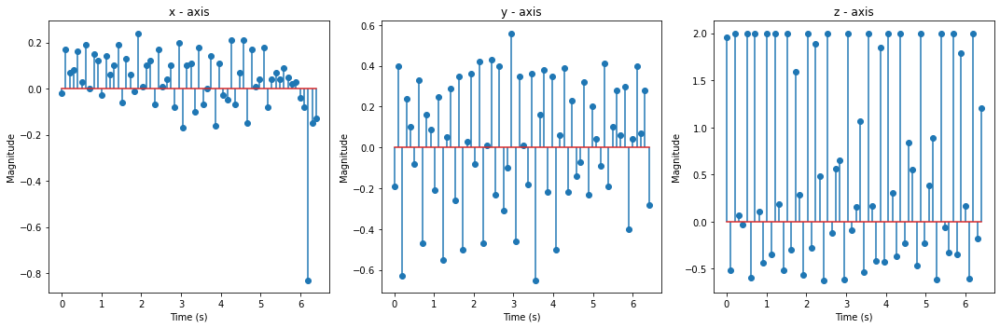

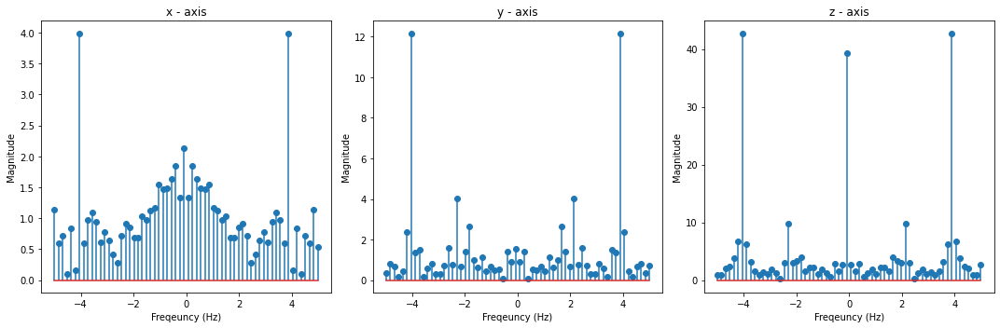

[-0.02, 0.17, 0.07, 0.08, 0.16, 0.03, 0.19, -0.0, 0.15, 0.12, -0.03, 0.14, 0.06, 0.1, 0.19, -0.06, 0.13, 0.06, -0.01, 0.24, 0.01, 0.1, 0.12, -0.07, 0.17, 0.01, 0.04, 0.1, -0.08, 0.2, -0.17, 0.1, 0.11, -0.1, 0.18, -0.07, 0.0, 0.14, -0.16, 0.11, -0.03, -0.05, 0.21, -0.07, 0.07, 0.21, -0.15, 0.17, 0.01, 0.04, 0.18, -0.08, 0.04, 0.07, 0.04, 0.09, 0.05, 0.02, 0.03, -0.04, -0.08, -0.83, -0.15, -0.13]
[0.02, 0.42, -0.02, 0.3, -0.4, 0.17, 0.42, -0.31, 0.49, -0.2, 0.03, 0.48, -0.53, 0.39, 0.15, -0.2, 0.51, -0.89, 0.27, 0.4, -0.35, 0.45, -0.6, 0.02, 0.54, -0.24, 0.32, -0.28, -0.08, 0.5, -0.34, 0.46, -0.12, -0.04, 0.46, -0.47, 0.24, 0.26, -0.13, 0.54, -0.52, 0.02, 0.51, -0.31, 0.35, -0.43, -0.13, 0.53, -0.4, 0.17, -0.16, -0.06, 0.11, -0.02, -0.04, 0.0, 0.04, -0.04, -0.04, -0.01, 0.01, -0.13, -0.01, 0.03]
[1.96, -0.52, 2.0, 0.07, -0.03, 2.0, -0.59, 2.0, 0.11, -0.44, 2.0, -0.35, 2.0, 0.19, -0.52, 2.0, -0.3, 1.59, 0.29, -0.57, 2.0, -0.28, 1.89, 0.48, -0.62, 2.0, -0.12, 0.56, 0.65, -0.61, 2.0, -0.09,

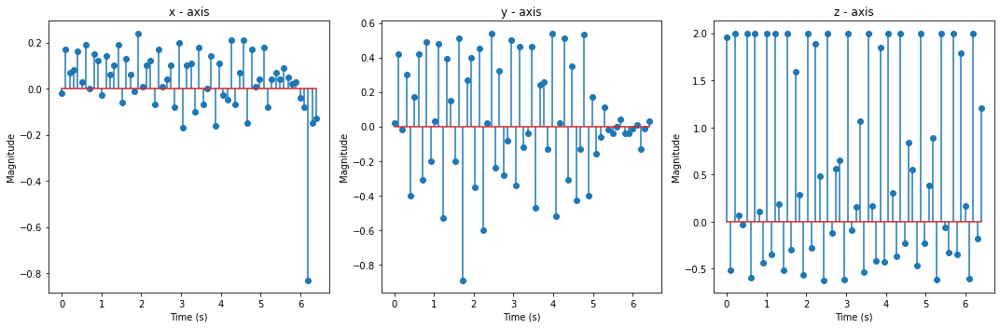

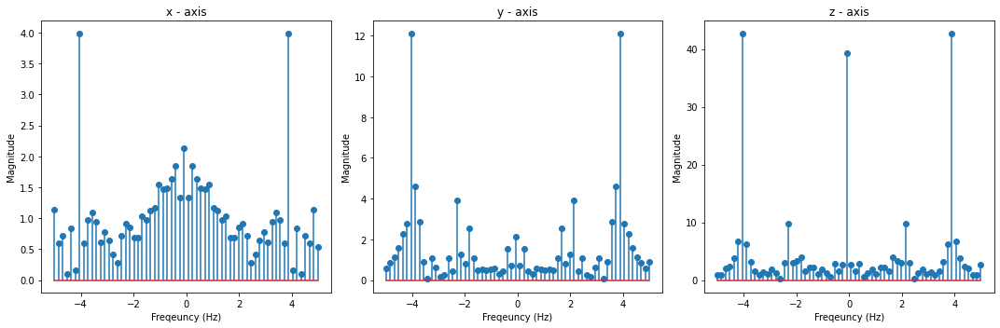

[-0.02, 0.17, 0.07, 0.08, 0.16, 0.03, 0.19, -0.0, 0.15, 0.12, -0.03, 0.14, 0.06, 0.1, 0.19, -0.06, 0.13, 0.06, -0.01, 0.24, 0.01, 0.1, 0.12, -0.07, 0.17, 0.01, 0.04, 0.1, -0.08, 0.2, -0.17, 0.1, 0.11, -0.1, 0.18, -0.07, 0.0, 0.14, -0.16, 0.11, -0.03, -0.05, 0.21, -0.07, 0.07, 0.21, -0.15, 0.17, 0.01, 0.04, 0.18, -0.08, 0.04, 0.07, 0.04, 0.09, 0.05, 0.02, 0.03, -0.04, -0.08, -0.83, -0.15, -0.13]
[0.02, 0.42, -0.02, 0.3, -0.4, 0.17, 0.42, -0.31, 0.49, -0.2, 0.03, 0.48, -0.53, 0.39, 0.15, -0.2, 0.51, -0.89, 0.27, 0.4, -0.35, 0.45, -0.6, 0.02, 0.54, -0.24, 0.32, -0.28, -0.08, 0.5, -0.34, 0.46, -0.12, -0.04, 0.46, -0.47, 0.24, 0.26, -0.13, 0.54, -0.52, 0.02, 0.51, -0.31, 0.35, -0.43, -0.13, 0.53, -0.4, 0.17, -0.16, -0.06, 0.11, -0.02, -0.04, 0.0, 0.04, -0.04, -0.04, -0.01, 0.01, -0.13, -0.01, 0.03]
[-0.01, -0.57, 2.0, -0.43, 2.0, 0.25, -0.41, 2.0, -0.37, 1.18, 0.6, -0.6, 2.0, -0.13, 0.31, 1.07, -0.57, 2.0, 0.15, -0.34, 2.0, -0.45, 1.69, 0.37, -0.44, 2.0, -0.39, 1.23, 0.48, -0.34, 2.0, -0.27

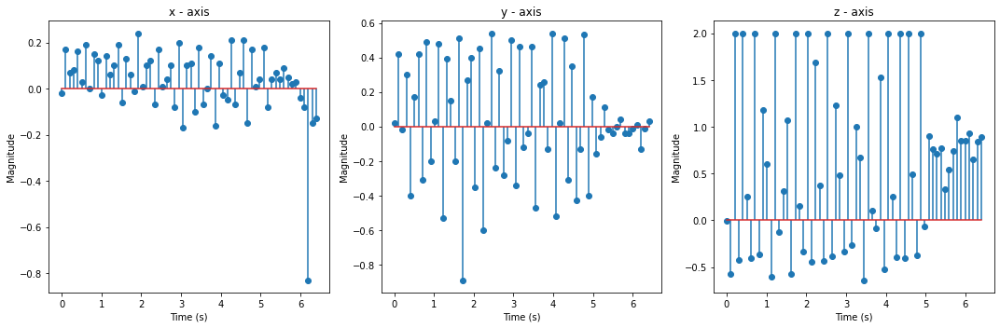

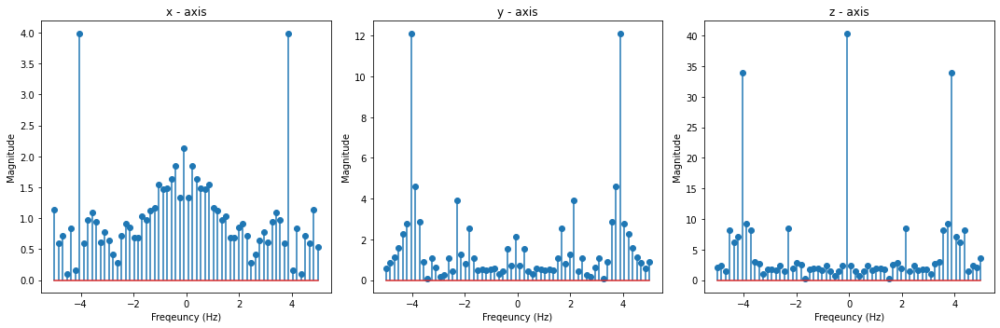

[-0.12, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15]
[0.02, 0.42, -0.02, 0.3, -0.4, 0.17, 0.42, -0.31, 0.49, -0.2, 0.03, 0.48, -0.53, 0.39, 0.15, -0.2, 0.51, -0.89, 0.27, 0.4, -0.35, 0.45, -0.6, 0.02, 0.54, -0.24, 0.32, -0.28, -0.08, 0.5, -0.34, 0.46, -0.12, -0.04, 0.46, -0.47, 0.24, 0.26, -0.13, 0.54, -0.52, 0.02, 0.51, -0.31, 0.35, -0.43, -0.13, 0.53, -0.4, 0.17, -0.16, -0.06, 0.11, -0.02, -0.04, 0.0, 0.04, -0.04, -0.04, -0.01, 0.01, -0.13, -0.01, 0.03]
[-0.01, -0.57, 2.0, -0.43, 2.0, 0.25, -0.41, 2.0, -0.37, 1.18, 0.6, -0.6, 2.0, -0.13, 0.31, 1.07, -0.57, 2.0, 0.15, -0.34, 2.0, -0.45, 1.69, 0.3

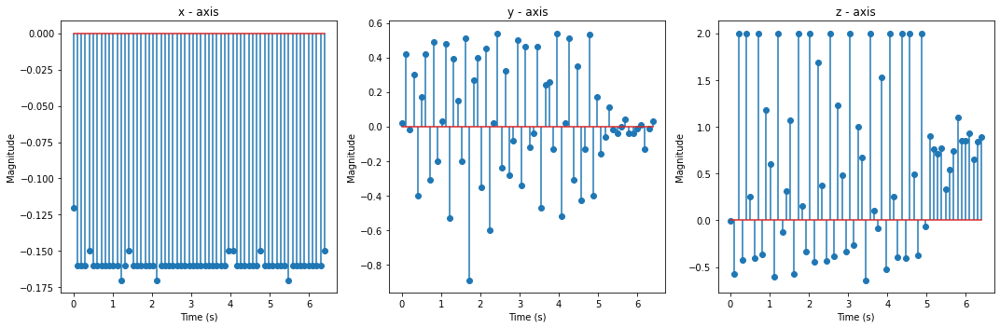

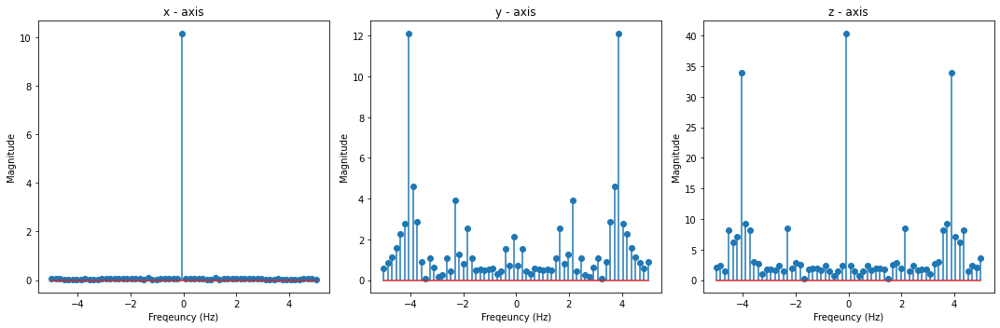

[-0.12, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15]
[0.03, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, 0.0, -0.02, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.02, -0.0, -0.01, -0.0, 0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, 0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01]
[-0.01, -0.57, 2.0, -0.43, 2.0, 0.25, -0.41, 2.0, -0.37, 1.18, 0.6, -0.6, 2.0, -0.13, 0.31, 1.07, -0.57, 2.0, 0.15, -0.34, 2.0,

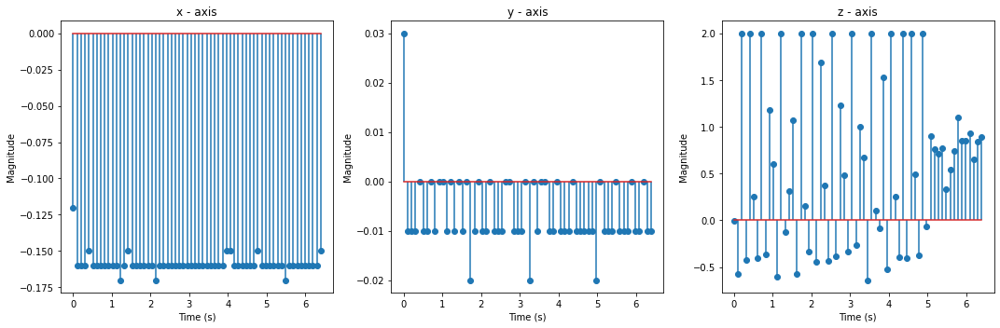

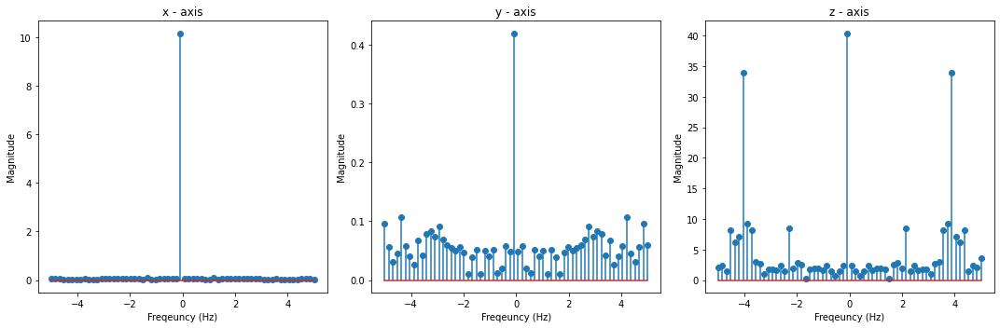

[-0.12, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15]
[0.03, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, 0.0, -0.02, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.02, -0.0, -0.01, -0.0, 0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, 0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01]
[0.88, 0.84, 0.84, 0.83, 0.84, 0.84, 0.82, 0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 

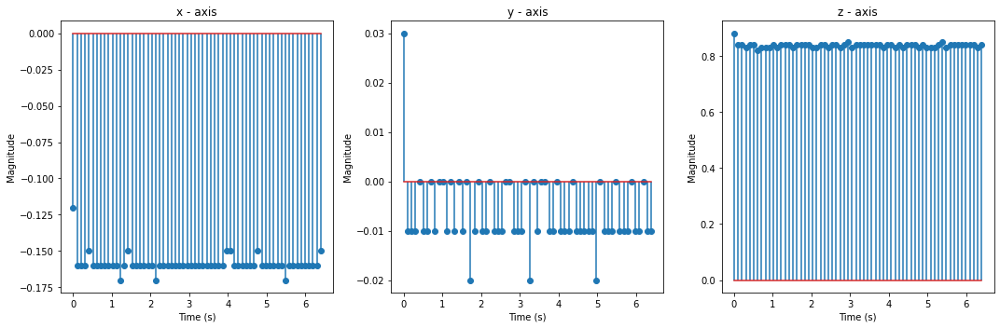

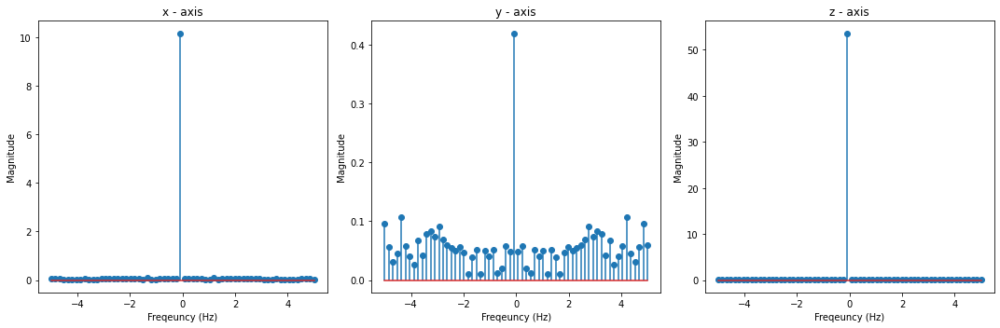

[-0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.15, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16]
[0.03, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, 0.0, -0.02, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.02, -0.0, -0.01, -0.0, 0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, 0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01]
[0.88, 0.84, 0.84, 0.83, 0.84, 0.84, 0.82, 0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 

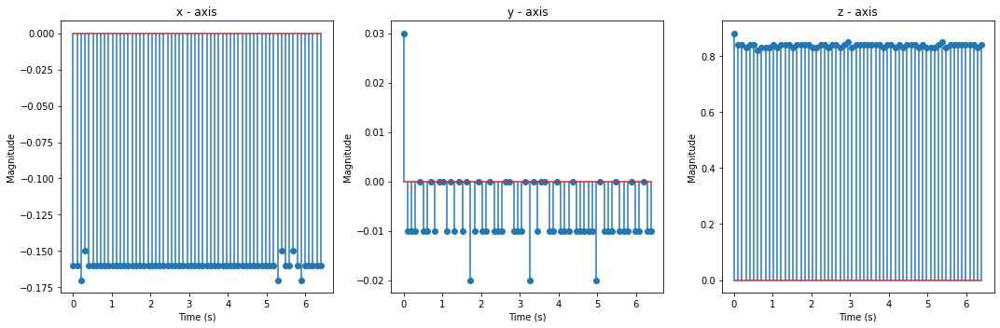

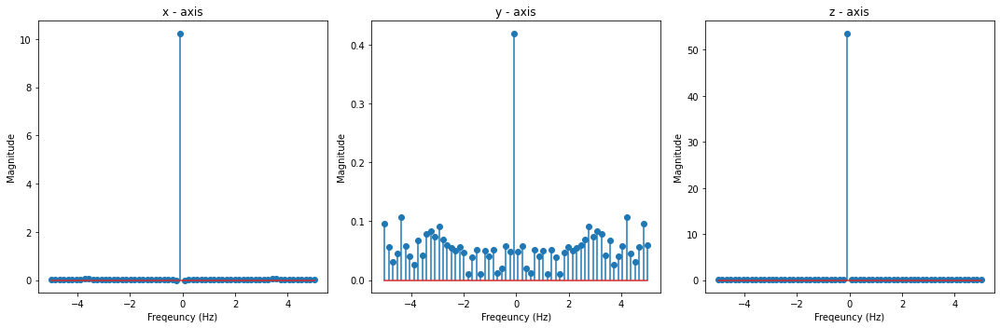

[-0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.15, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.0, -0.02, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0]
[0.88, 0.84, 0.84, 0.83, 0.84, 0.84, 0.82, 0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0

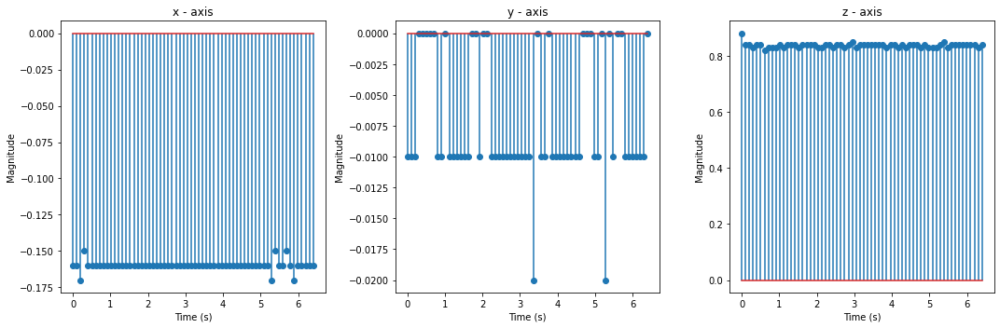

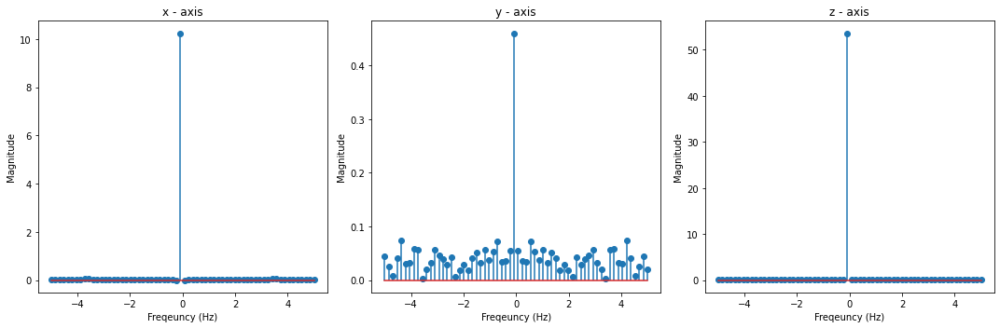

[-0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.15, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.0, -0.02, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0]
[0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.85, 0.83, 0.85, 0.83, 0.83, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0

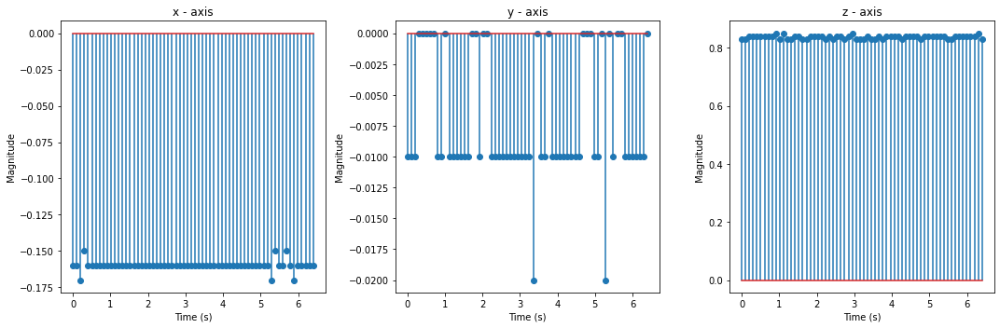

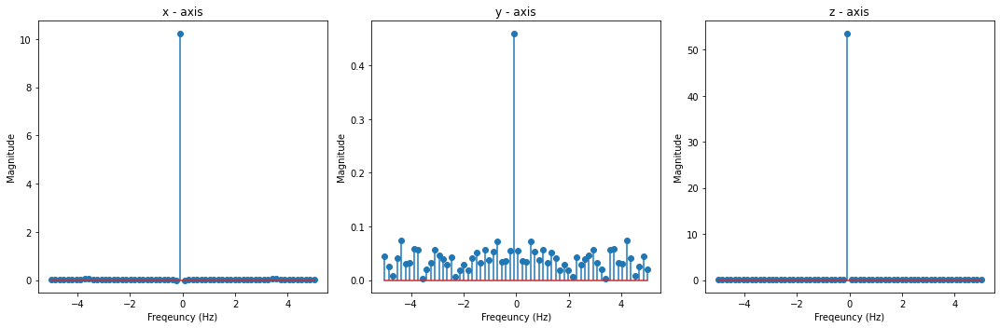

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.14, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.17, -0.16, -0.17, -0.17, -0.17, -0.16, -0.17, -0.17, -0.16, -0.18, -0.16, -0.23, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.16]
[-0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.0, -0.02, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0]
[0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.85, 0.83, 0.85, 0.83, 0.83, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0

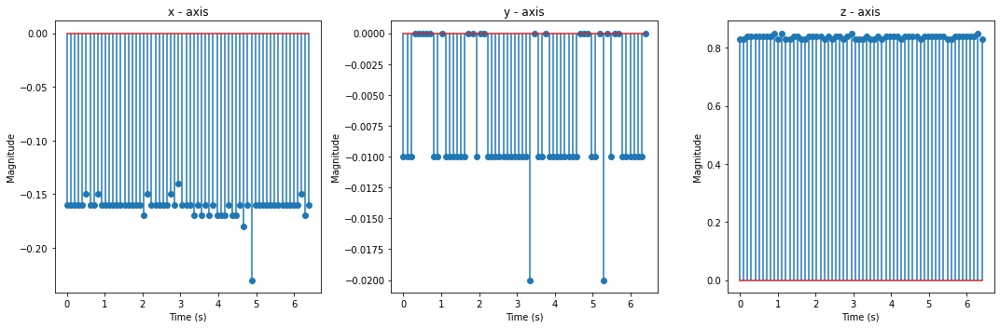

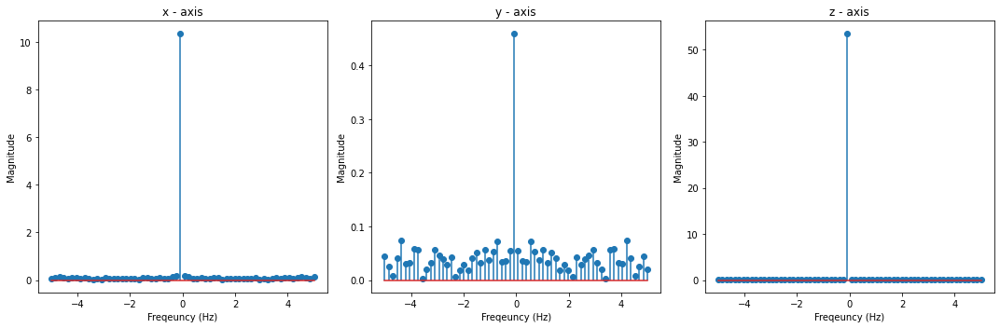

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.14, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.17, -0.16, -0.17, -0.17, -0.17, -0.16, -0.17, -0.17, -0.16, -0.18, -0.16, -0.23, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.16]
[-0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.01, -0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.0, -0.0, -0.0, -0.01, -0.0, -0.0, 0.0, -0.01, -0.01, -0.01, -0.0, -0.01, 0.03, -0.01, 0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01]
[0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.85, 0.83, 0.85, 0.83, 0.83, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0

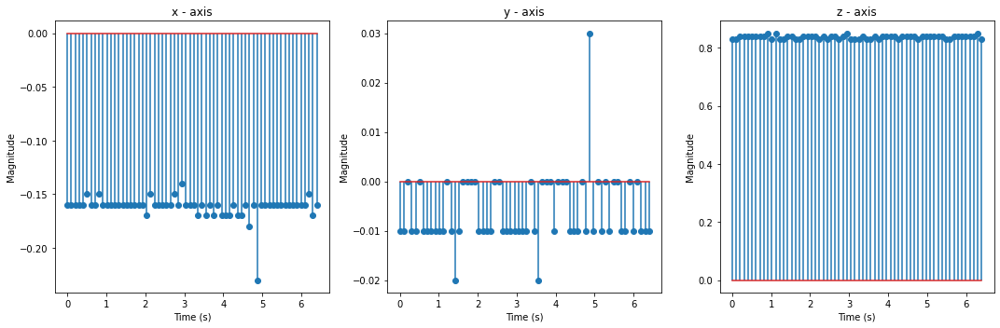

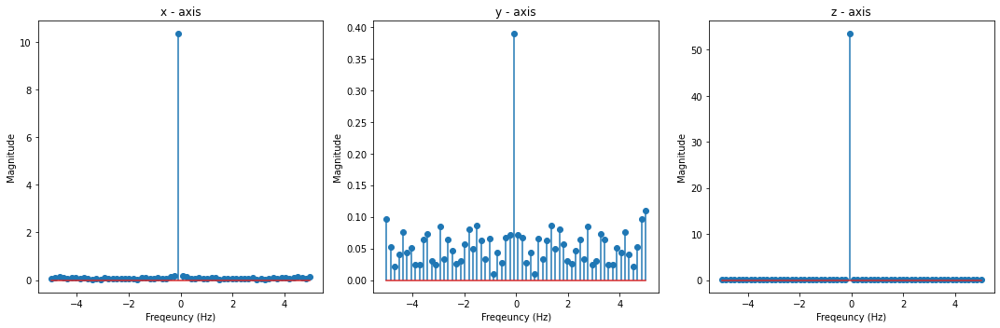

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.14, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.17, -0.16, -0.17, -0.17, -0.17, -0.16, -0.17, -0.17, -0.16, -0.18, -0.16, -0.23, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.16]
[-0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.01, -0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.0, -0.0, -0.0, -0.01, -0.0, -0.0, 0.0, -0.01, -0.01, -0.01, -0.0, -0.01, 0.03, -0.01, 0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01]
[0.84, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0

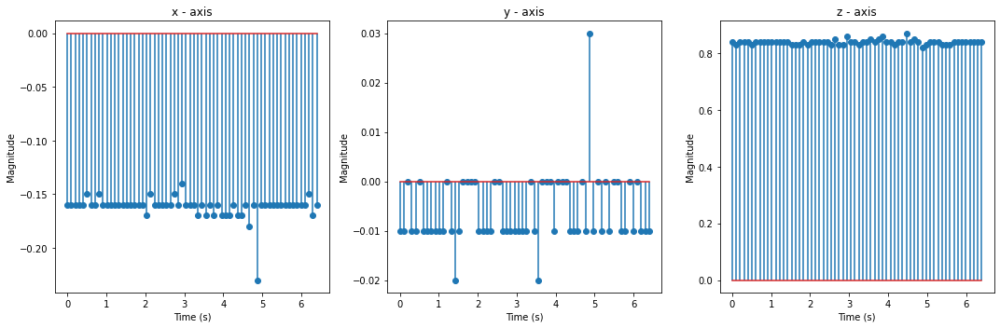

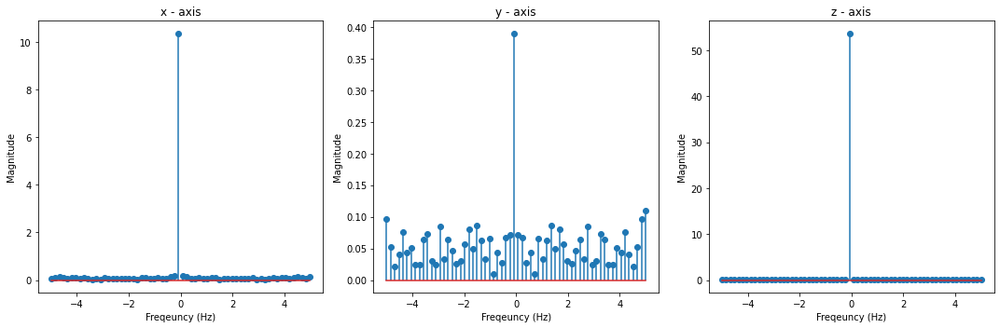

[-0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.15, -0.16, -0.17, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.01, -0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.0, -0.0, -0.0, -0.01, -0.0, -0.0, 0.0, -0.01, -0.01, -0.01, -0.0, -0.01, 0.03, -0.01, 0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01]
[0.84, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0

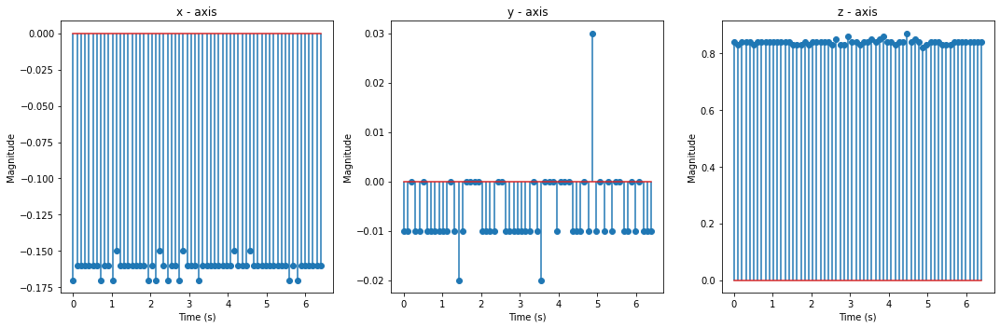

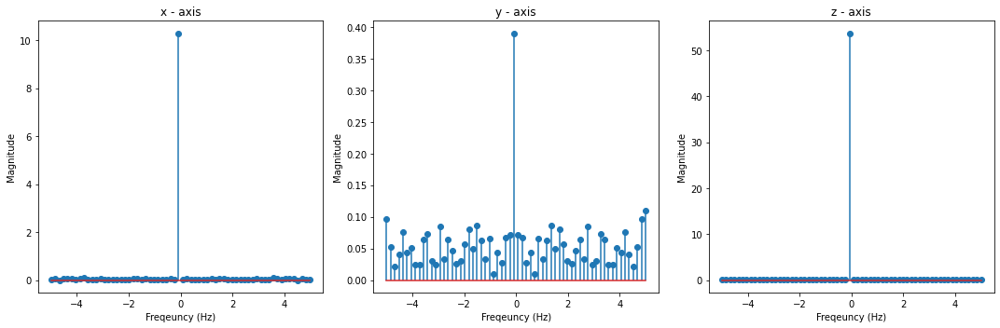

[-0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.15, -0.16, -0.17, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, 0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01]
[0.84, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.84, 

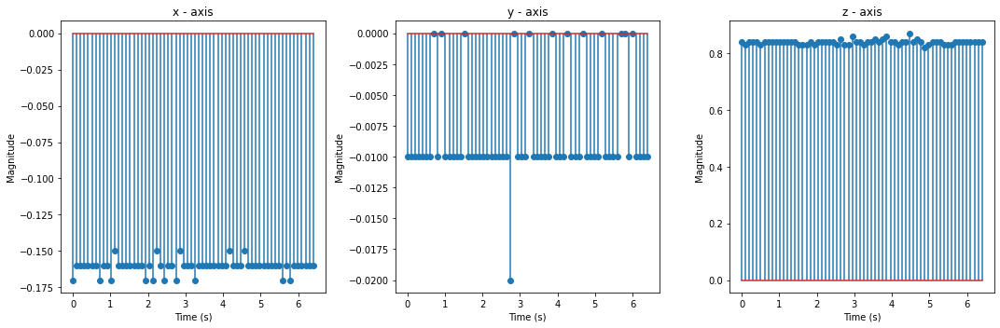

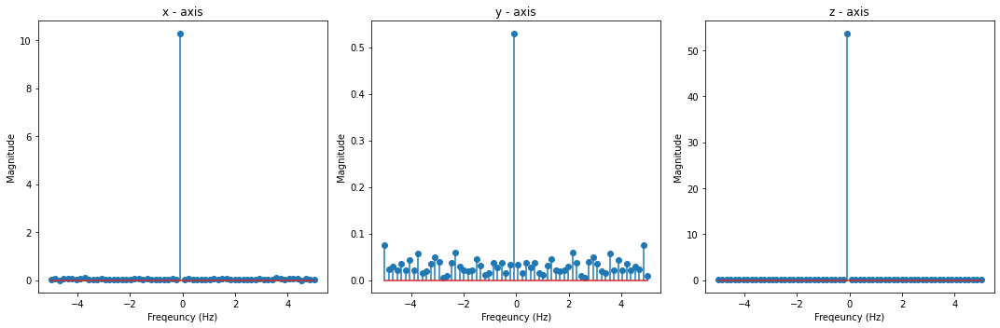

[-0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.15, -0.16, -0.17, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, 0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01]
[0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 

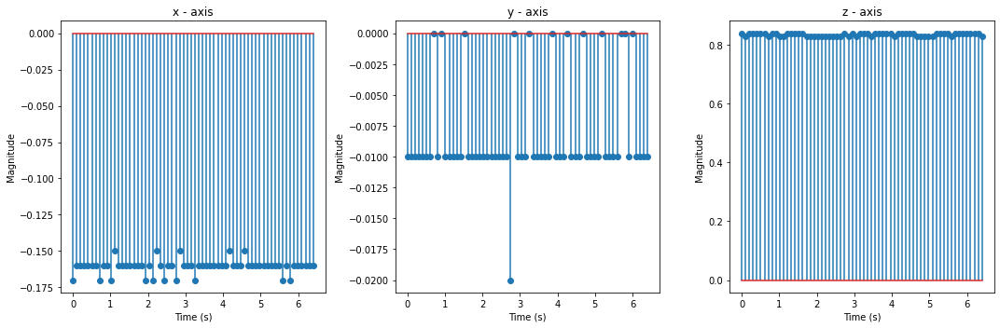

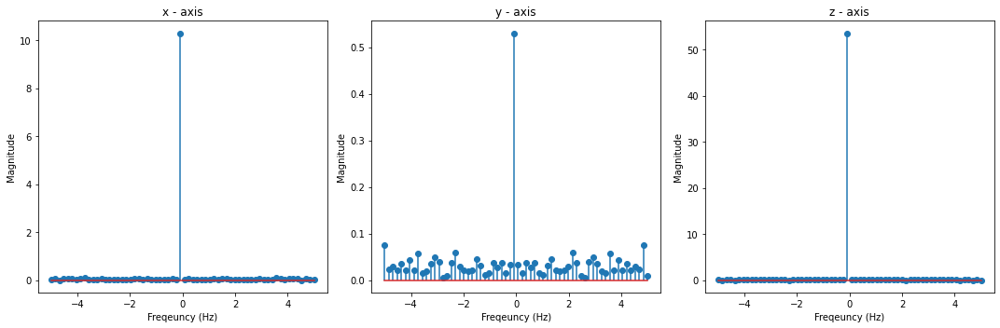

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.15, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.17, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, 0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01]
[0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 

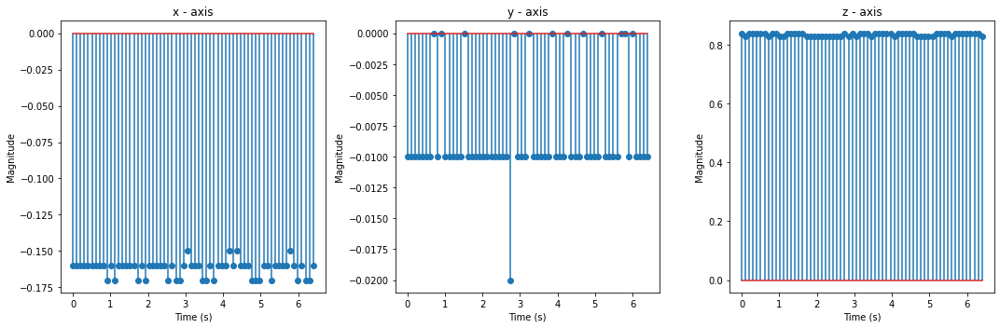

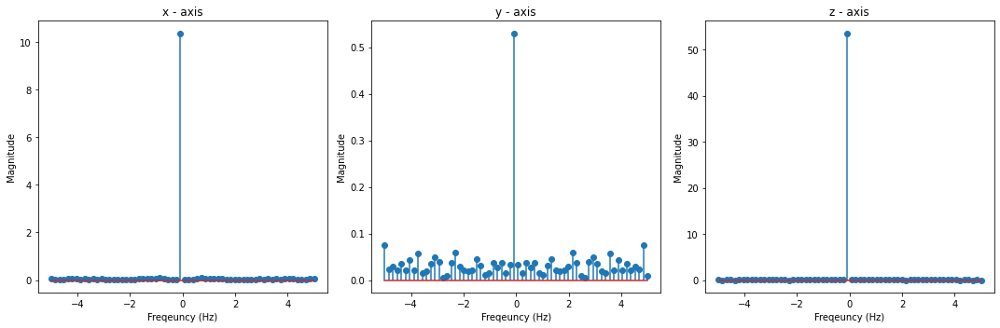

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.15, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.17, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, -0.02, -0.01, -0.0, -0.01, 0.0, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01]
[0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83,

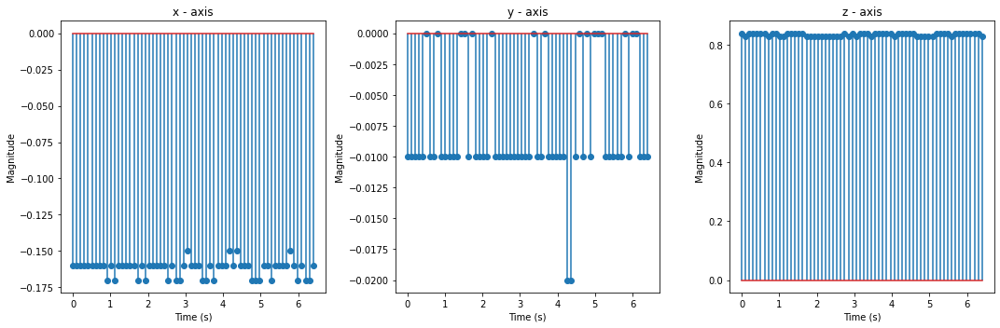

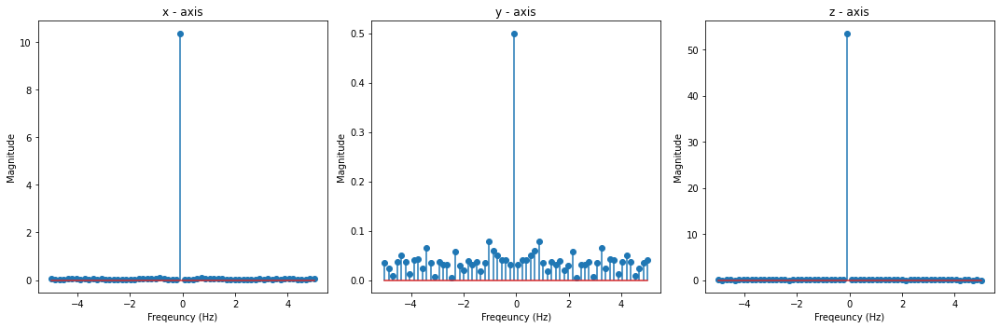

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.15, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.17, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, -0.02, -0.01, -0.0, -0.01, 0.0, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01]
[0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84,

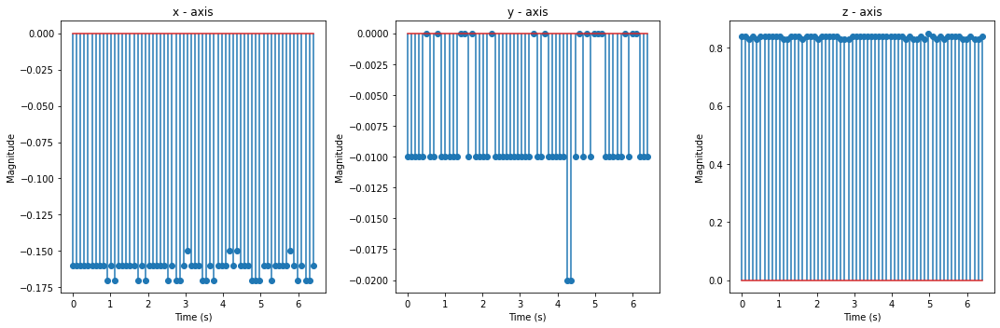

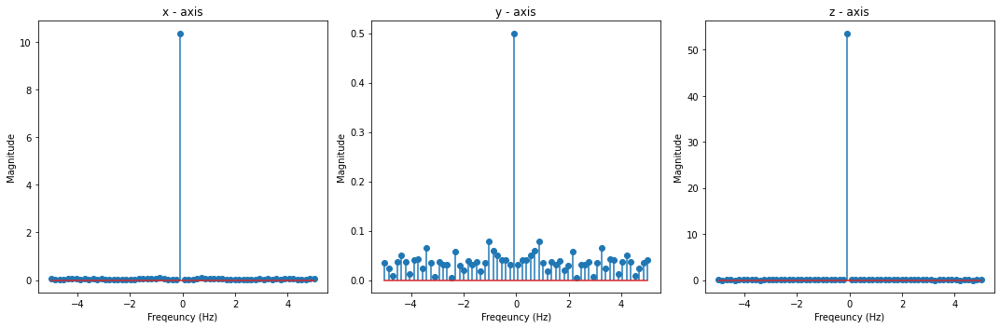

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.15, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, -0.02, -0.01, -0.0, -0.01, 0.0, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01]
[0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84,

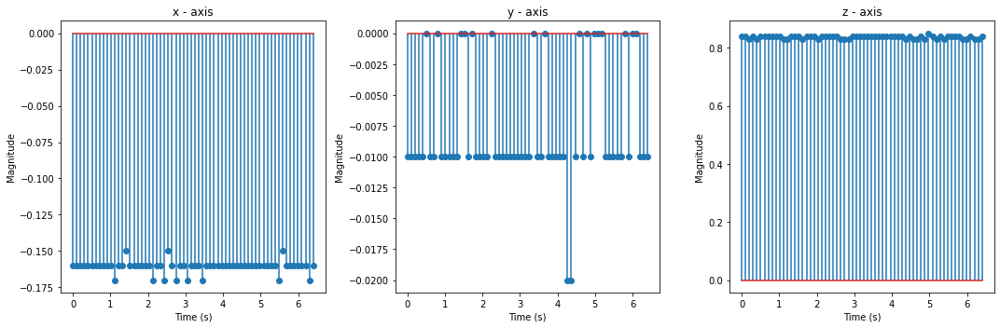

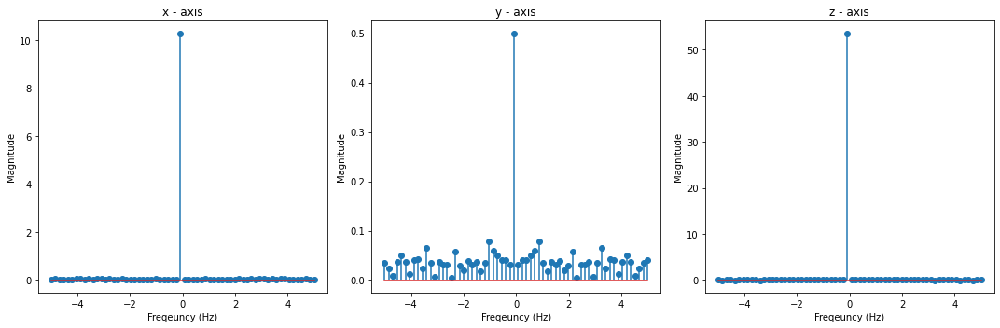

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.15, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0]
[0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.

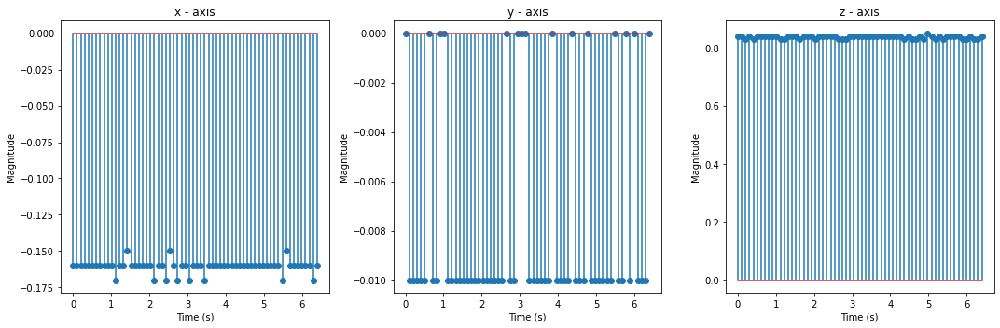

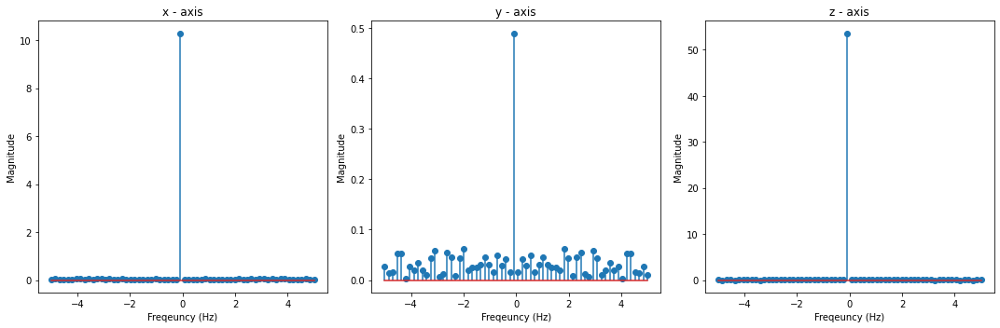

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.15, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0]
[0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.85, 0.84, 0.84, 0.85, 0.84, 0.

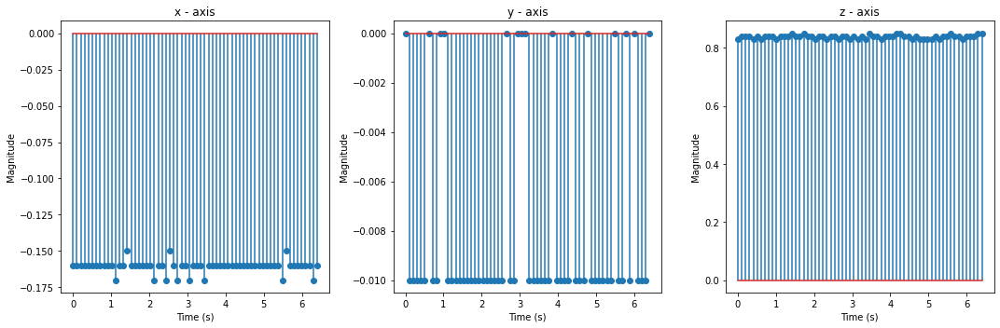

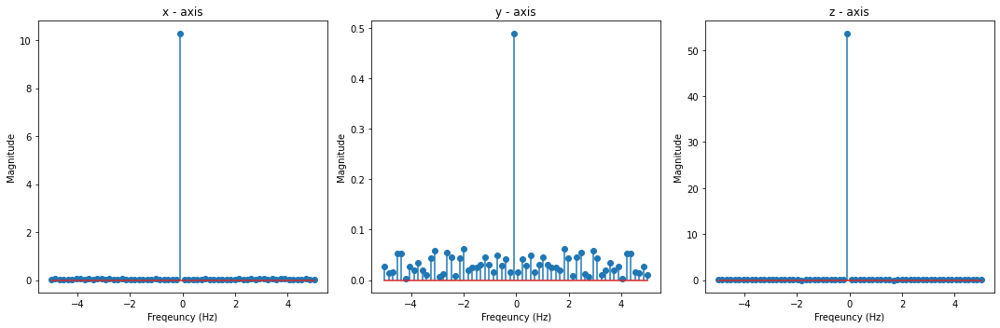

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.12, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0]
[0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.85, 0.84, 0.84, 0.85, 0.84, 0.

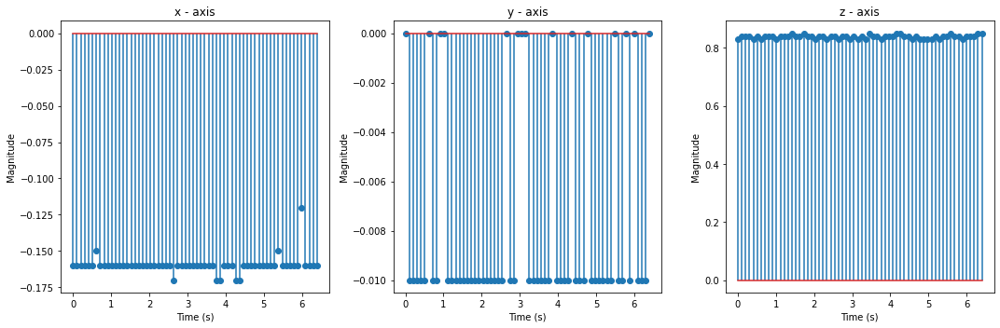

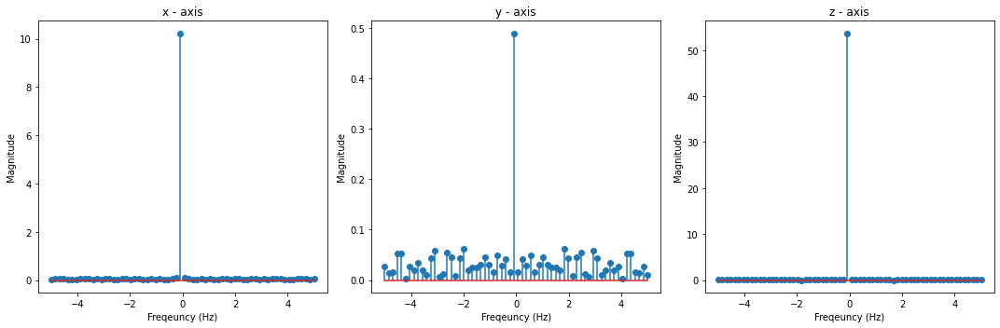

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.12, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.03, -0.01, -0.02, -0.01, -0.01]
[0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.85, 0.84, 0.84, 0.85, 0.84, 0.

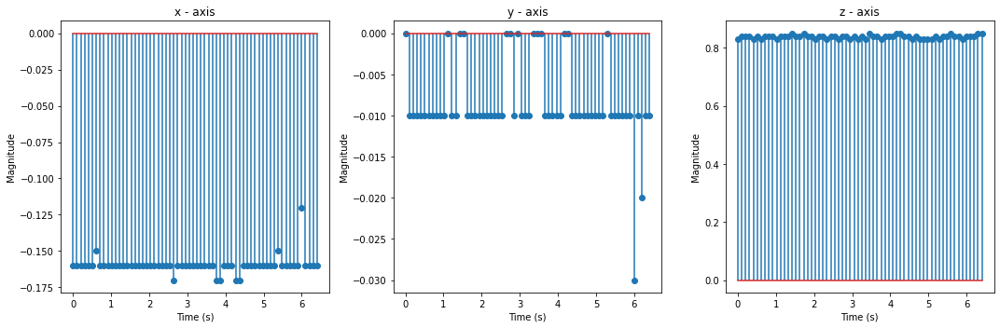

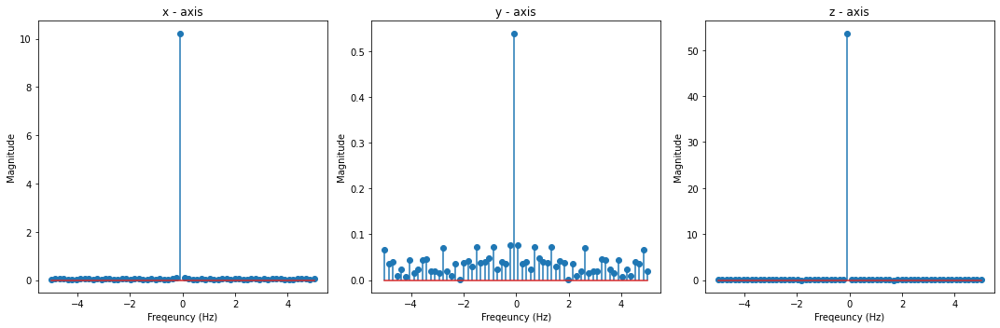

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.12, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.03, -0.01, -0.02, -0.01, -0.01]
[0.85, 0.83, 0.84, 0.83, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.

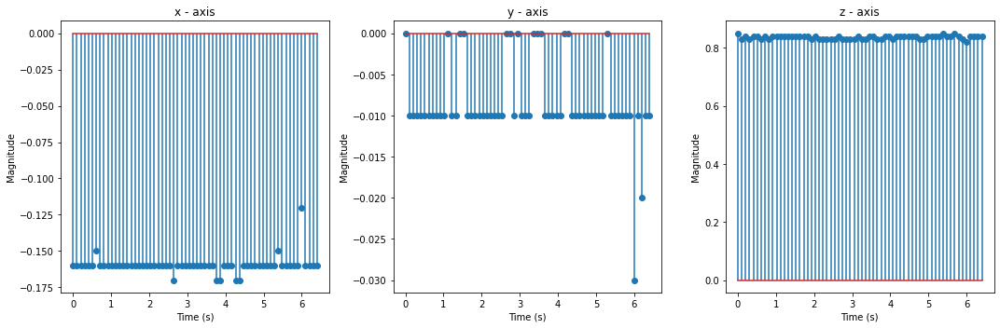

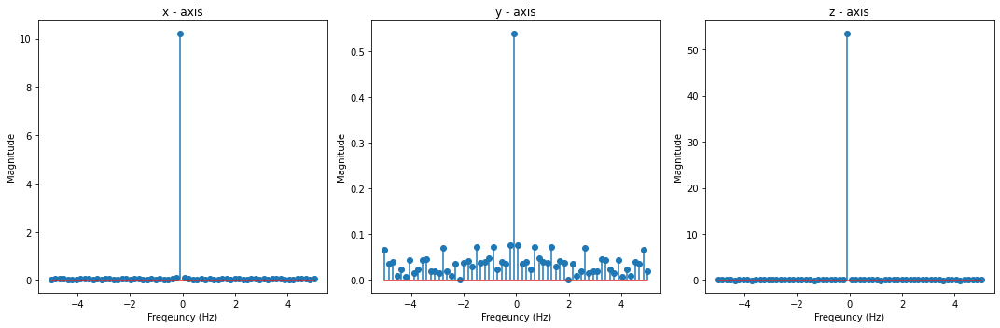

[-0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.03, -0.01, -0.02, -0.01, -0.01]
[0.85, 0.83, 0.84, 0.83, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.

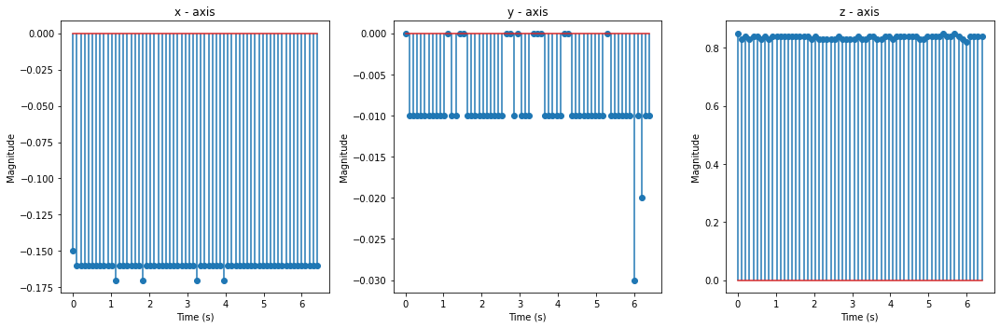

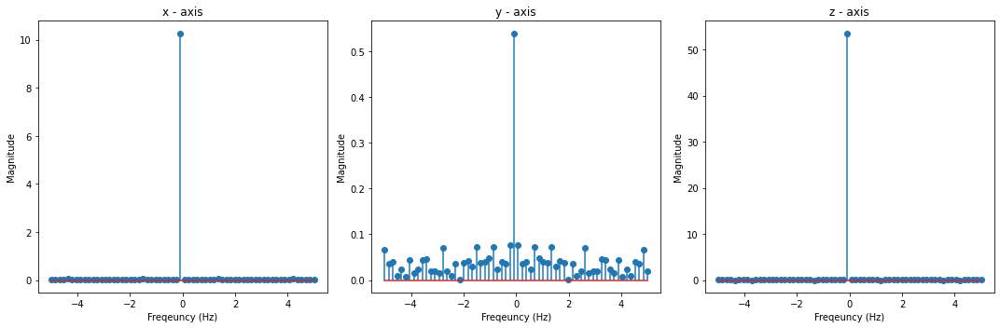

[-0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.02, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.02, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.02, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, 0.0, -0.01, -0.01, -0.0, -0.0, -0.0, -0.0]
[0.85, 0.83, 0.84, 0.83, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0

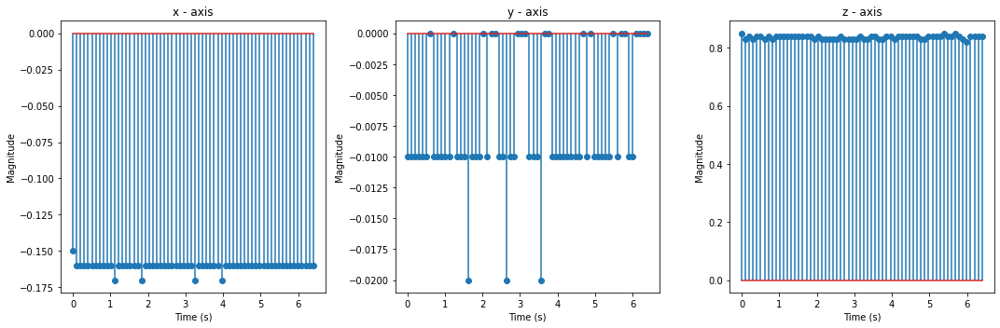

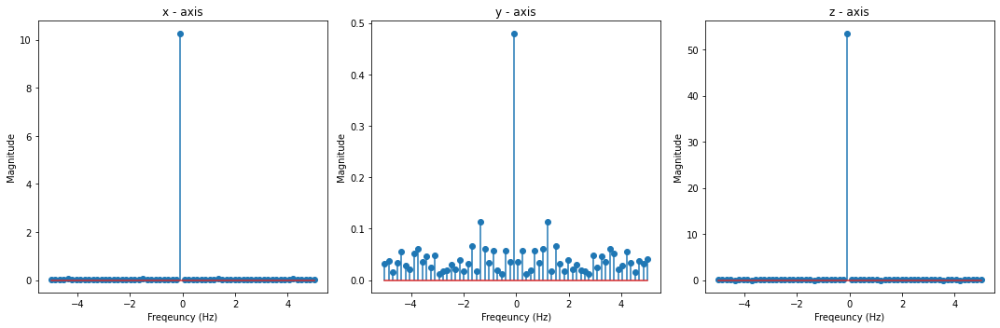

[-0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.02, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.02, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.02, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, 0.0, -0.01, -0.01, -0.0, -0.0, -0.0, -0.0]
[0.83, 0.84, 0.83, 0.83, 0.84, 0.83, 0.83, 0.84, 0.84, 0.85, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0

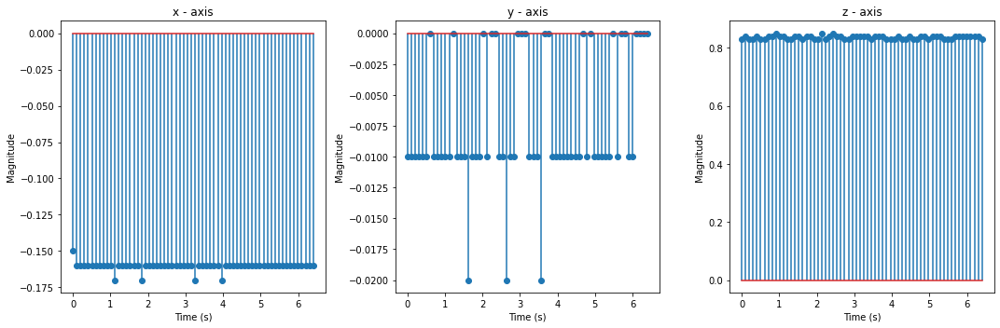

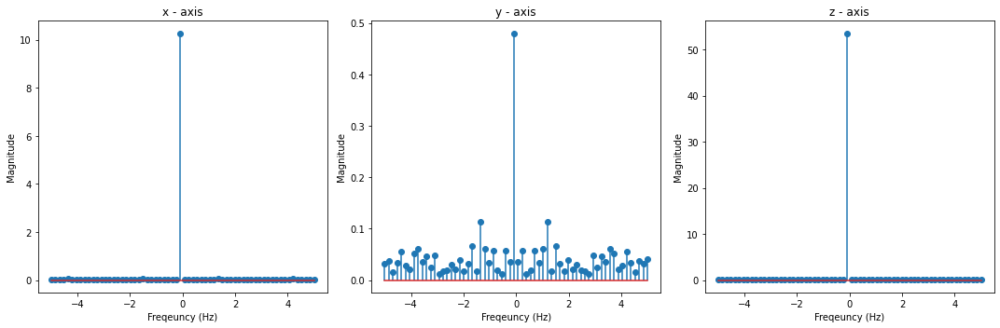

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.02, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.02, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.02, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, 0.0, -0.01, -0.01, -0.0, -0.0, -0.0, -0.0]
[0.83, 0.84, 0.83, 0.83, 0.84, 0.83, 0.83, 0.84, 0.84, 0.85, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0

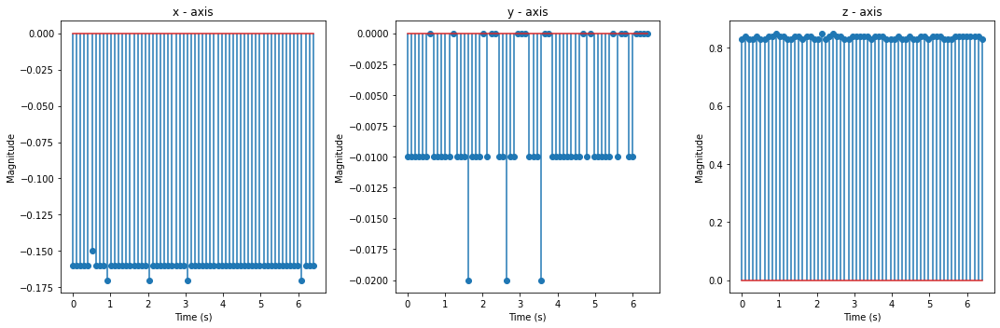

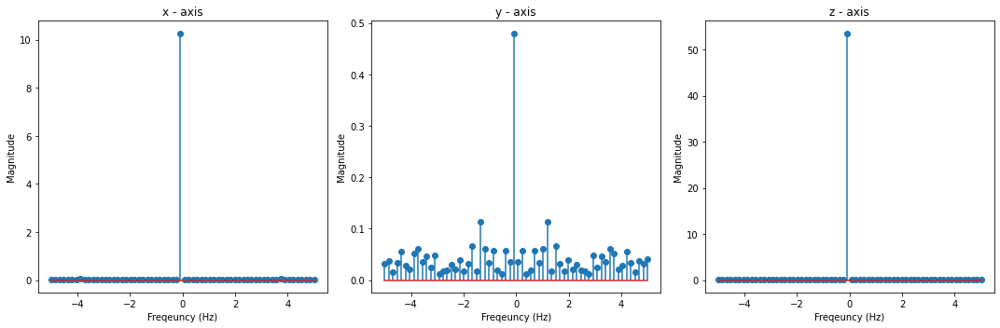

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01]
[0.83, 0.84, 0.83, 0.83, 0.84, 0.83, 0.83, 0.84, 0.84, 0.85, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0.8

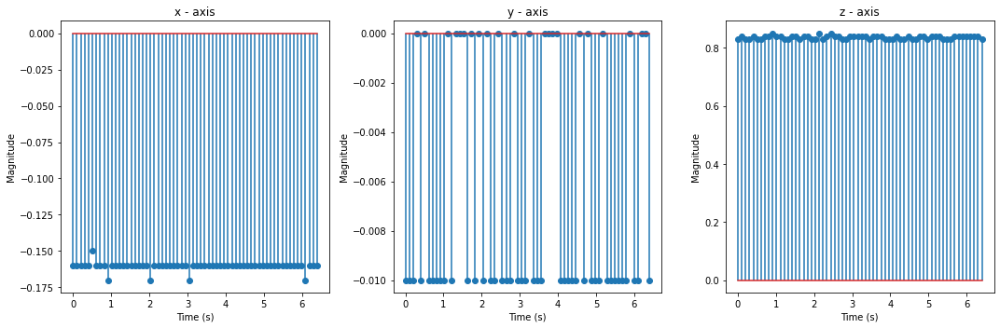

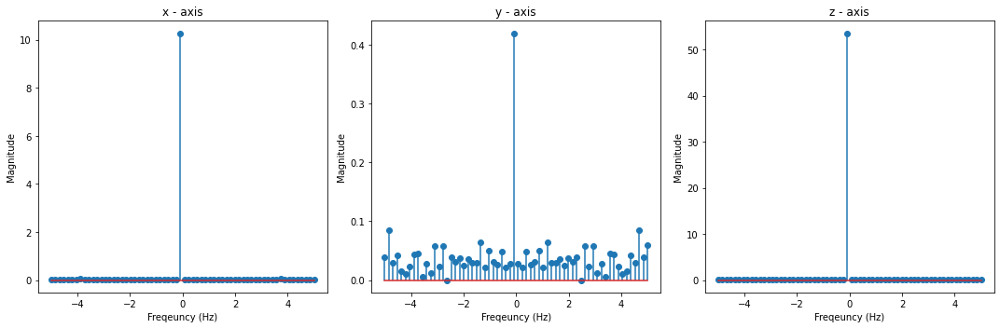

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01]
[0.84, 0.84, 0.85, 0.84, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.8

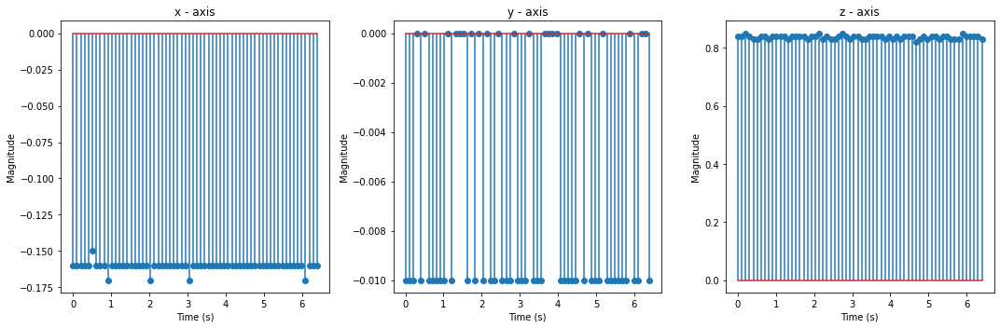

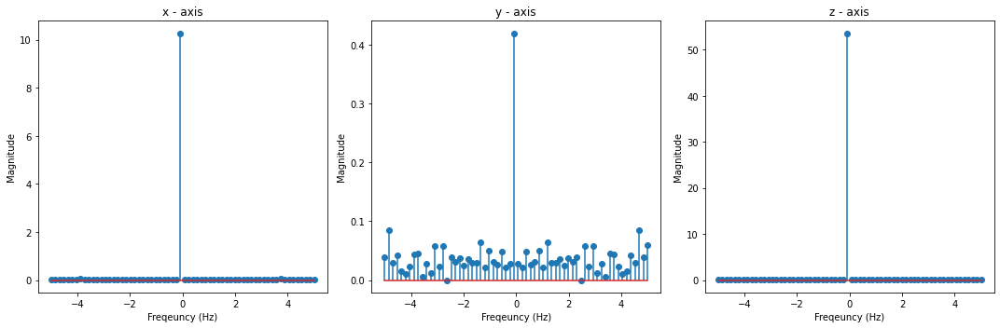

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01]
[0.84, 0.84, 0.85, 0.84, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.8

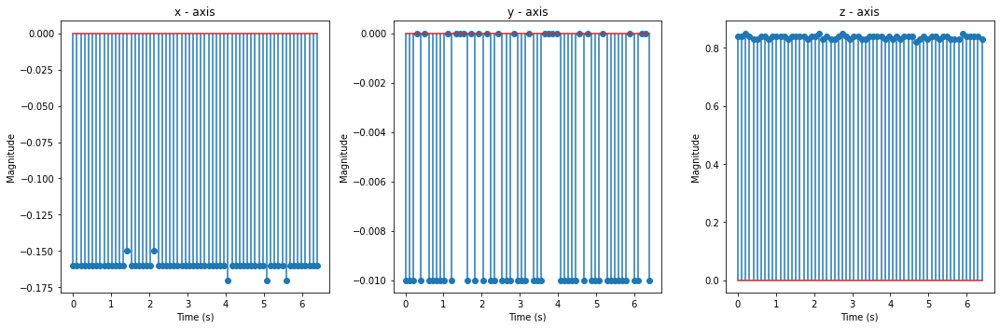

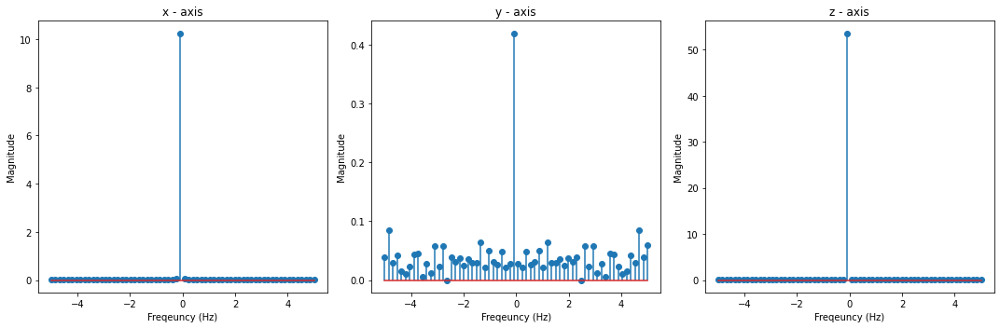

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01]
[0.84, 0.84, 0.85, 0.84, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83,

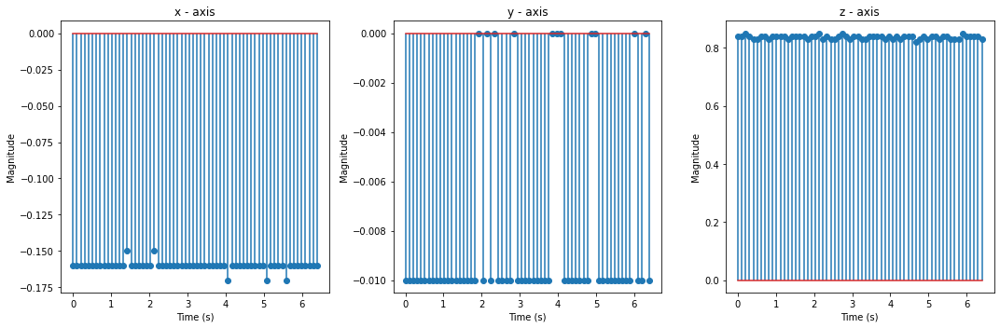

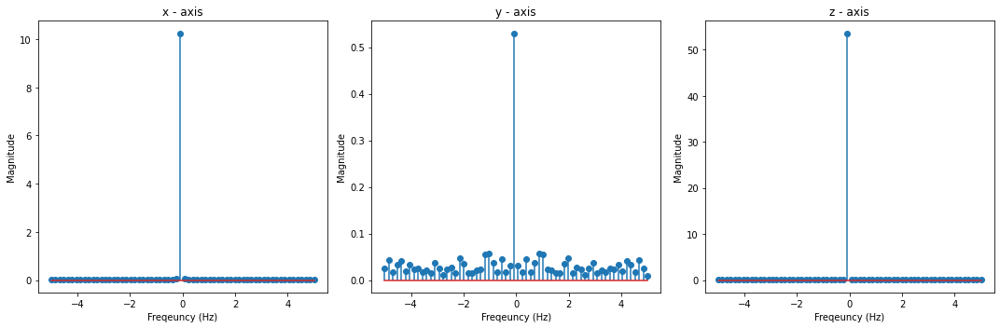

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01]
[0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.85, 0.83,

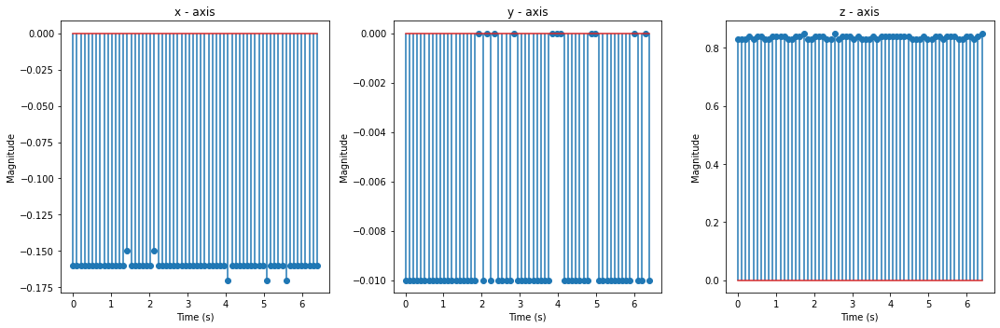

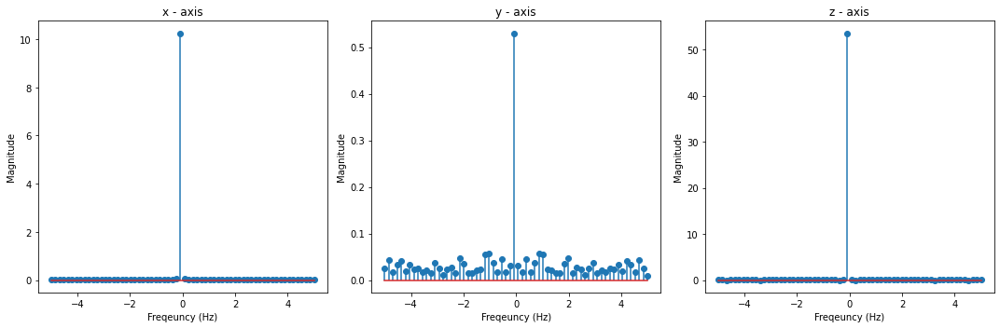

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.16, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01]
[0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.85, 0.83,

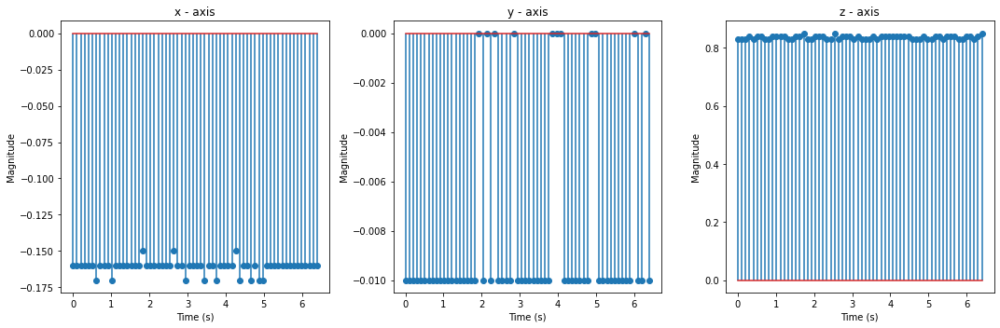

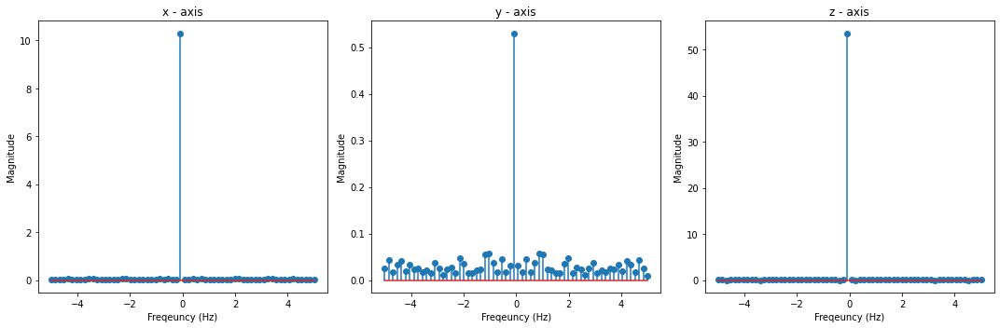

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.16, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, 0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.85, 0.83, 0.83, 0.84

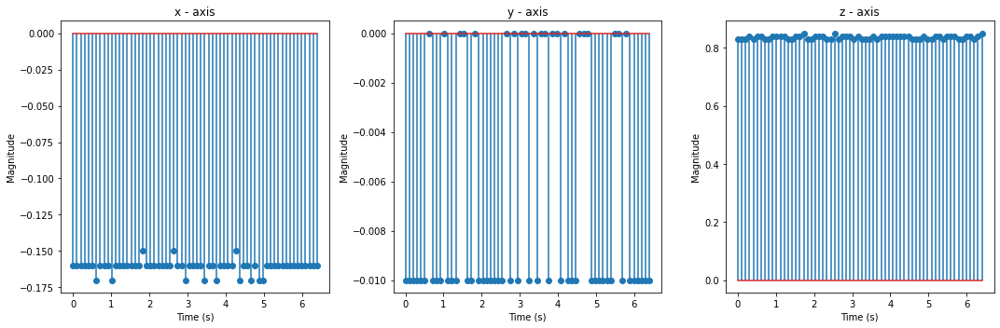

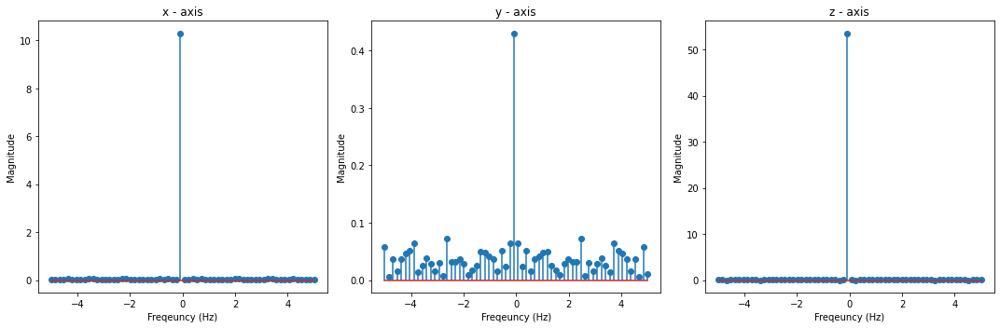

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.16, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, 0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.85, 0.83, 0.85, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.85, 0.84, 0.84, 0.85, 0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0.83

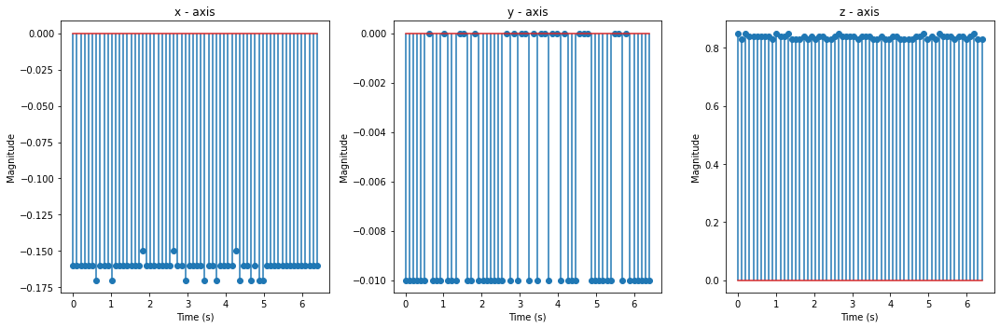

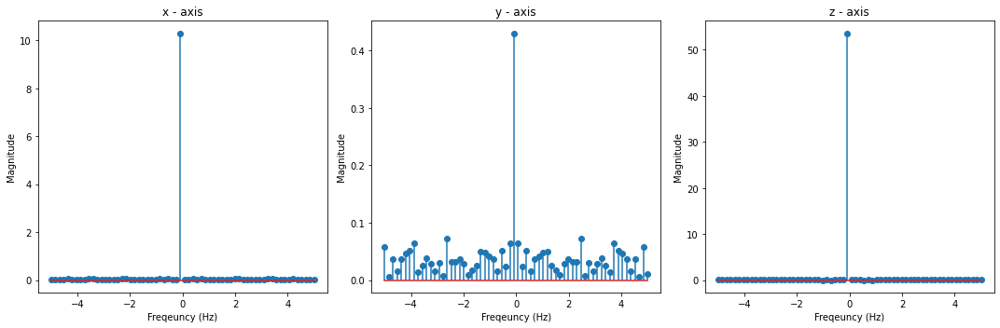

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, 0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.85, 0.83, 0.85, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.85, 0.84, 0.84, 0.85, 0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0.83

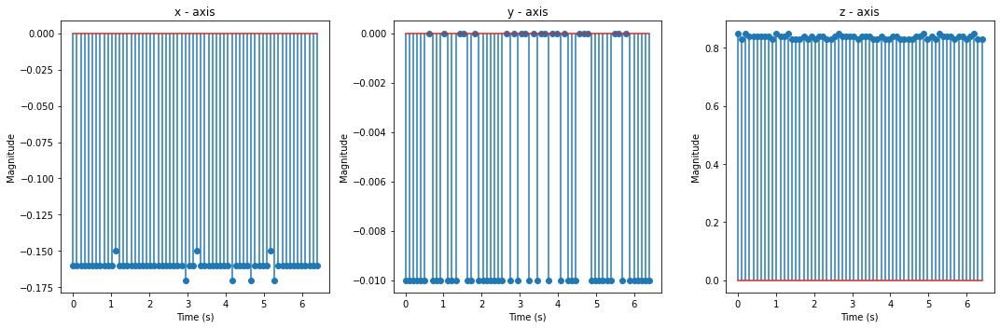

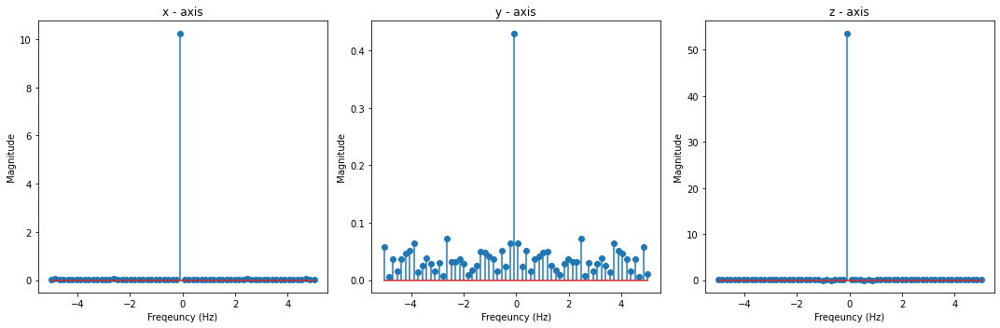

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, 0.0, 0.0, -0.01, -0.01, -0.01, -0.0, -0.0, 0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.02, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01]
[0.85, 0.83, 0.85, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.85, 0.84, 0.84, 0.85, 0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0.83, 0

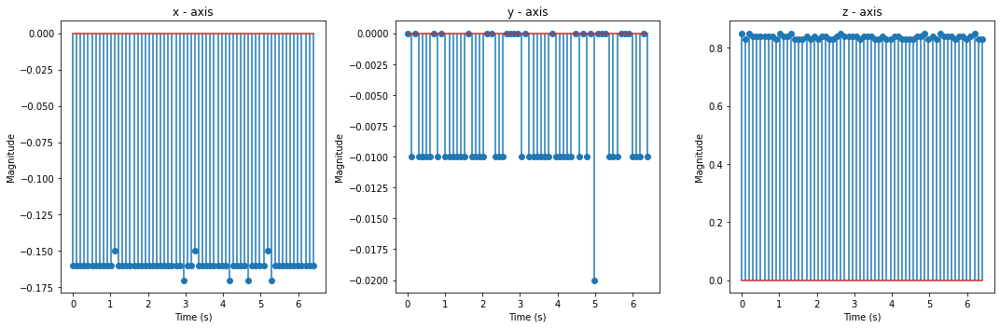

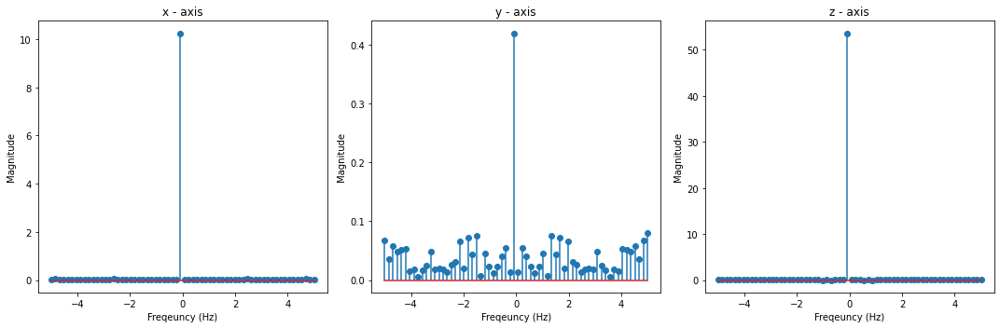

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, 0.0, 0.0, -0.01, -0.01, -0.01, -0.0, -0.0, 0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.02, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01]
[0.84, 0.85, 0.84, 0.83, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.85, 0.84, 0

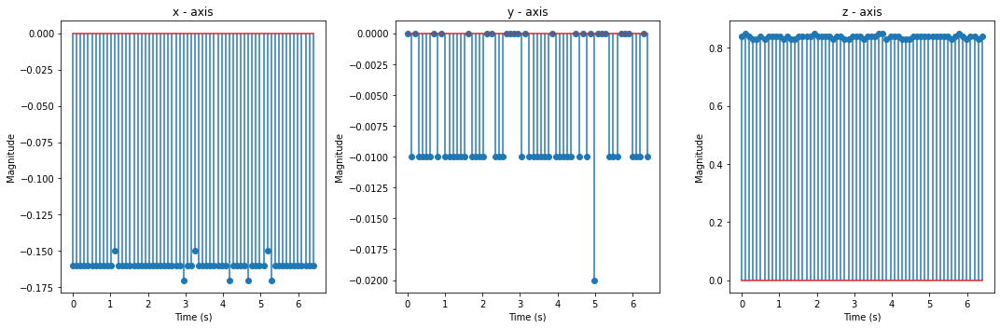

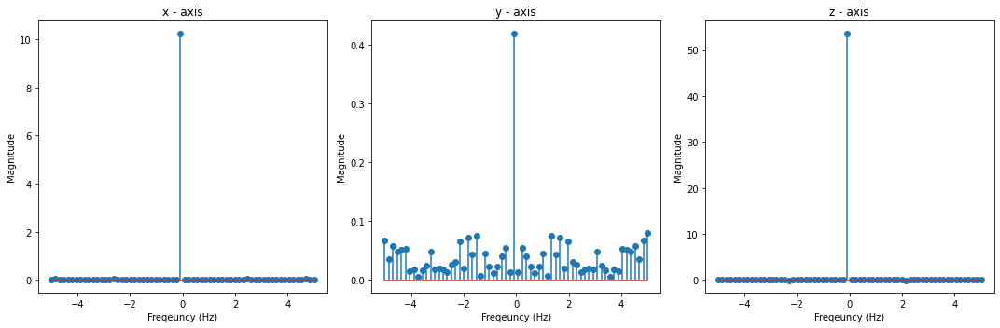

[-0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.17, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16]
[-0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, 0.0, 0.0, -0.01, -0.01, -0.01, -0.0, -0.0, 0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.02, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01]
[0.84, 0.85, 0.84, 0.83, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.85, 0.84, 0

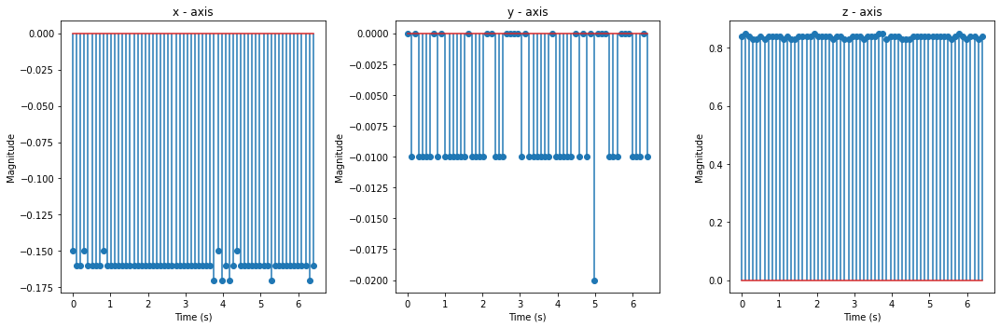

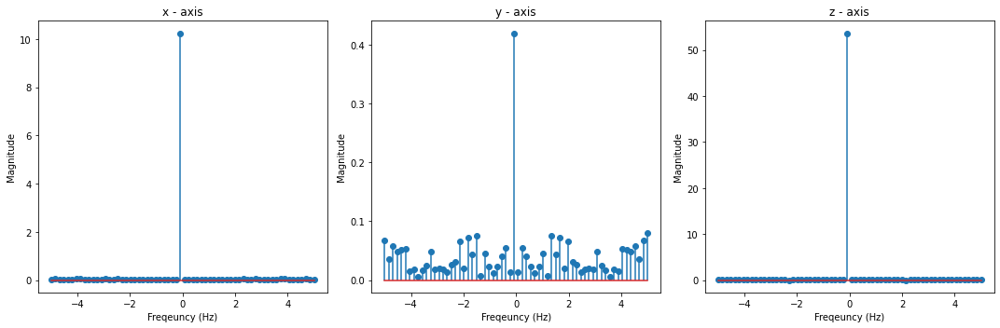

[-0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.17, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.84, 0.85, 0.84, 0.83, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84

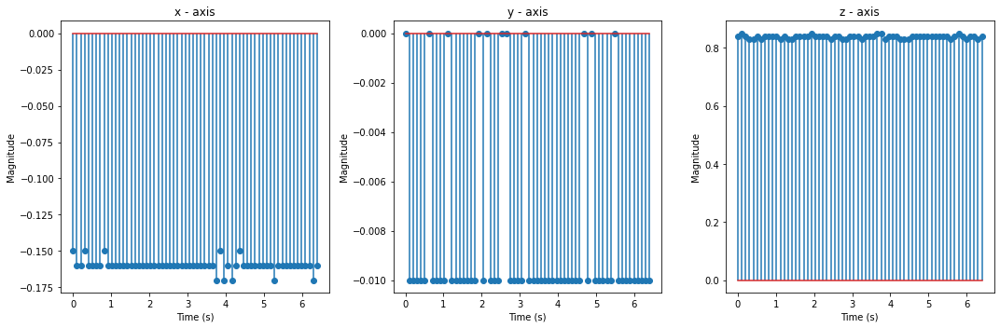

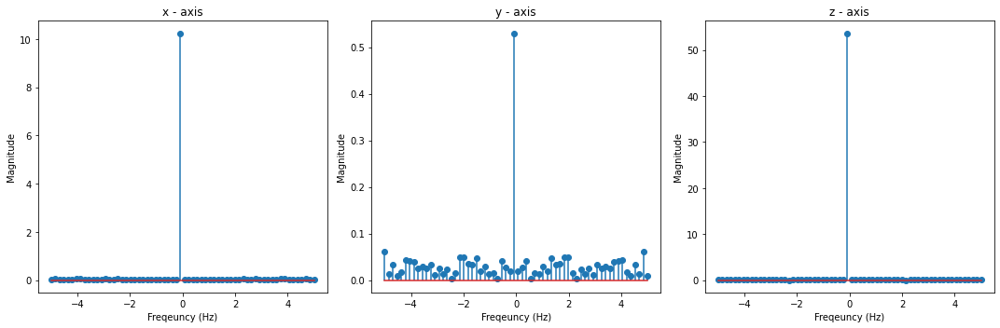

[-0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.17, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84

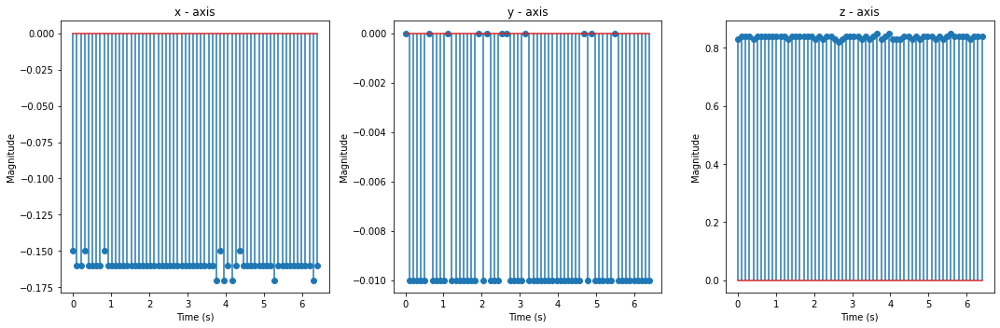

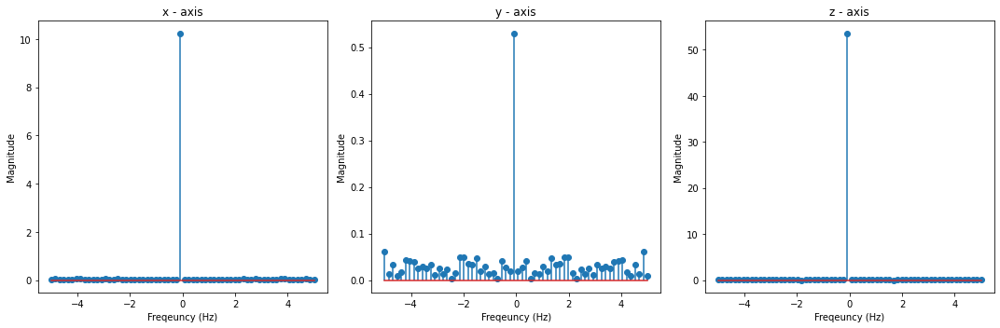

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.15, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84

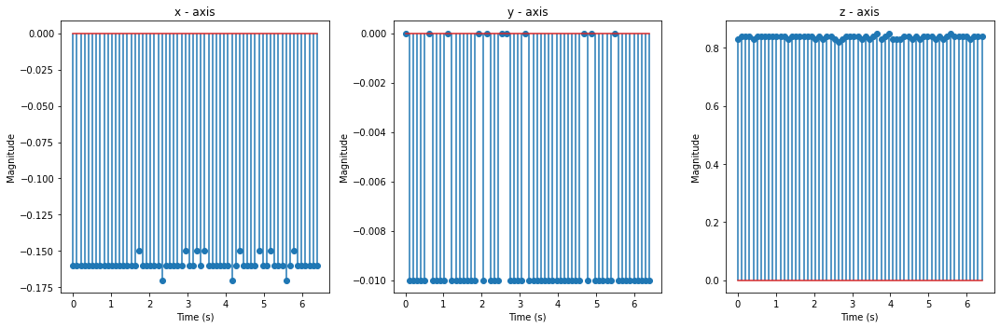

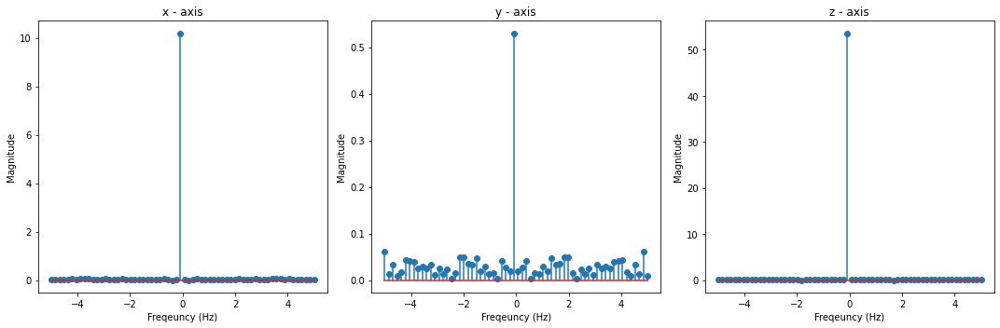

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.15, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.02, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0]
[0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.

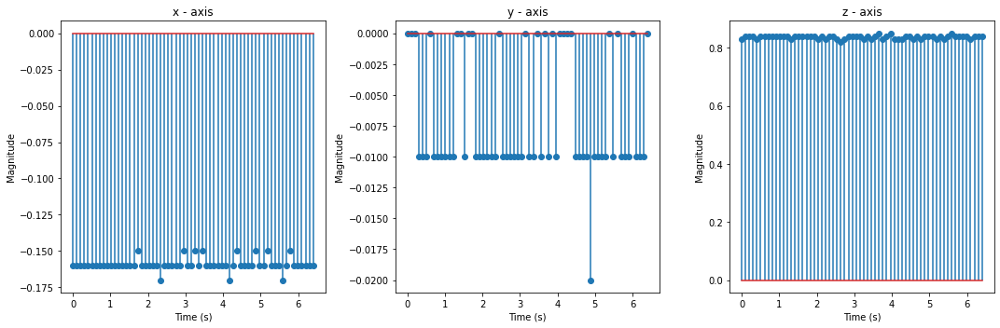

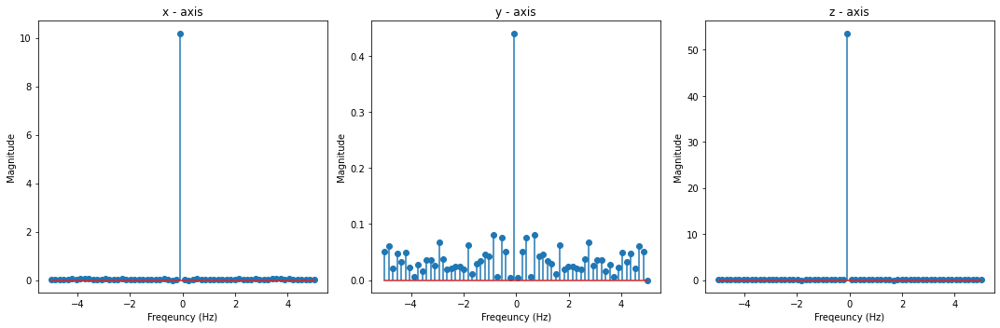

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.15, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.02, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0]
[0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.82, 0.84, 0.82, 0.84, 0.84, 0.85, 0.84, 0.84, 0.

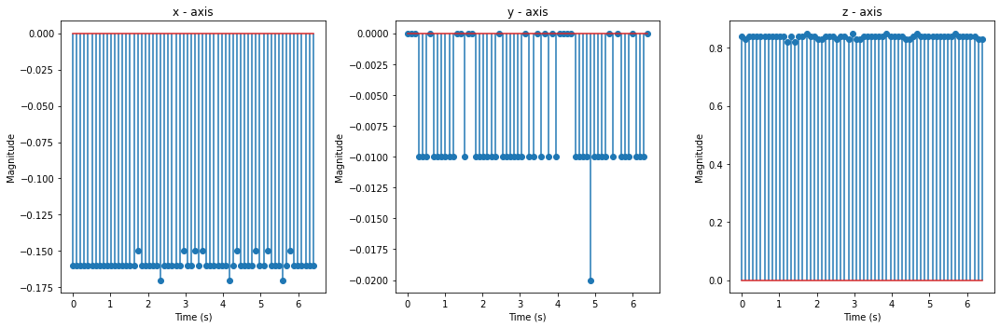

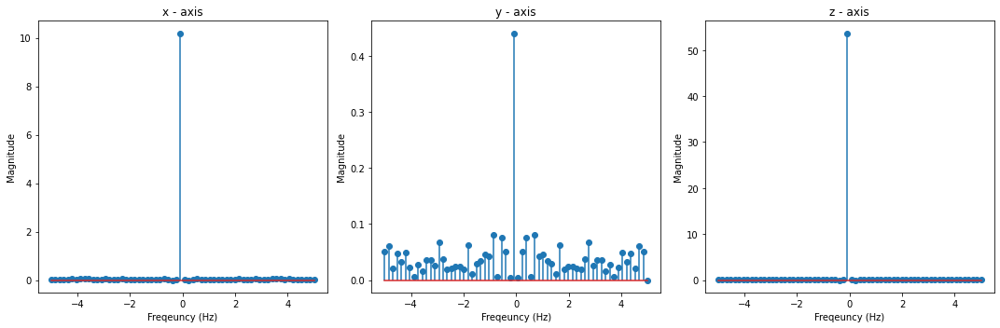

[-0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.17, -0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.02, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0]
[0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.82, 0.84, 0.82, 0.84, 0.84, 0.85, 0.84, 0.84, 0.

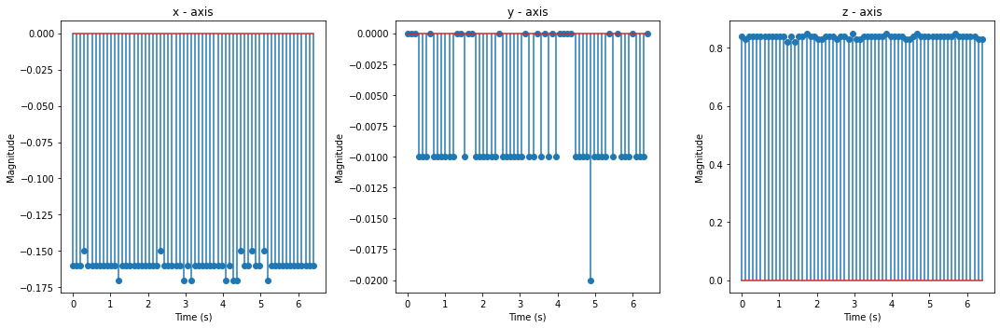

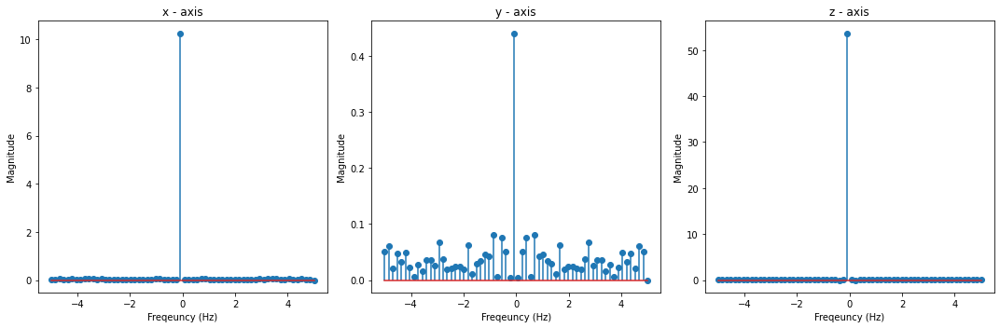

[-0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.17, -0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, 0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01]
[0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.82, 0.84, 0.82, 0.84, 0.84, 0.85, 0.84, 0.84, 0.83

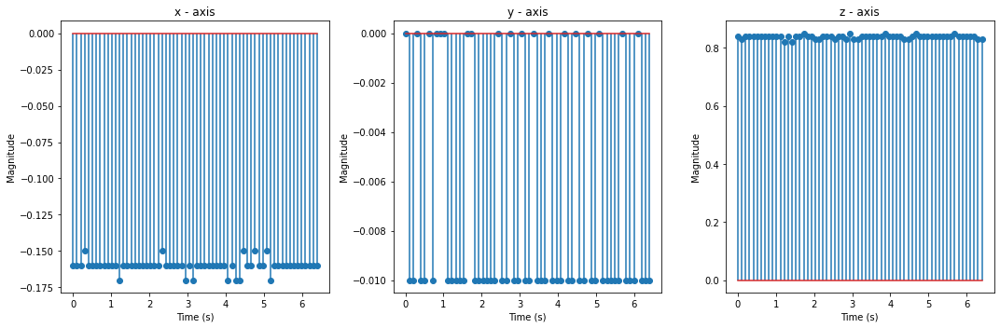

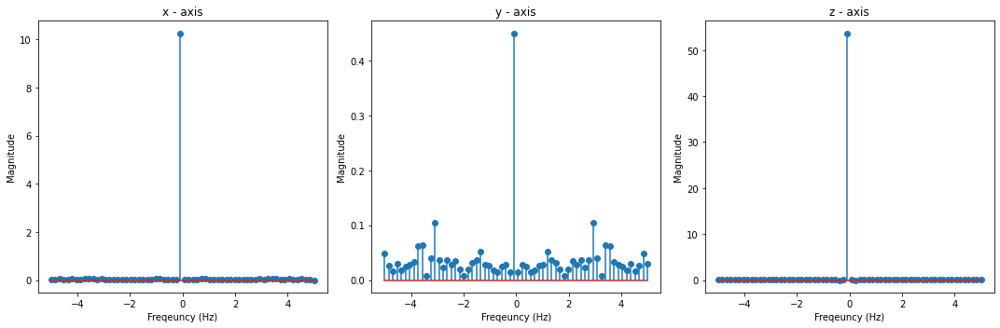

[-0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.17, -0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, 0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01]
[0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84

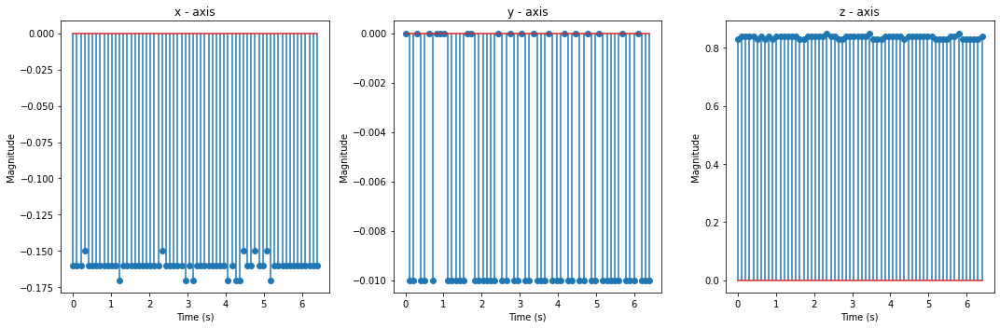

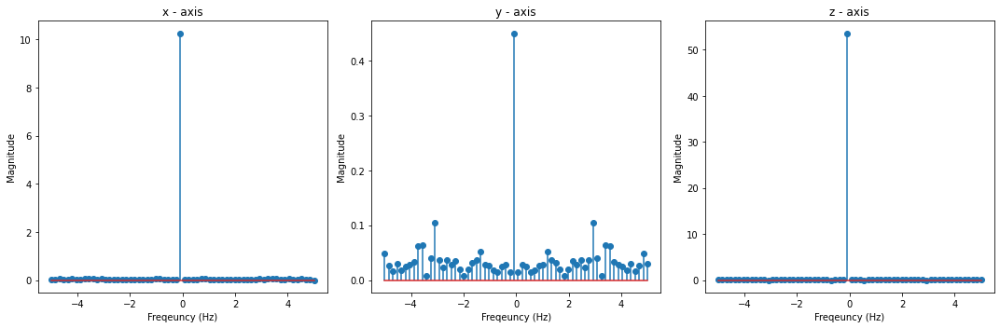

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.17, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, 0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01]
[0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84

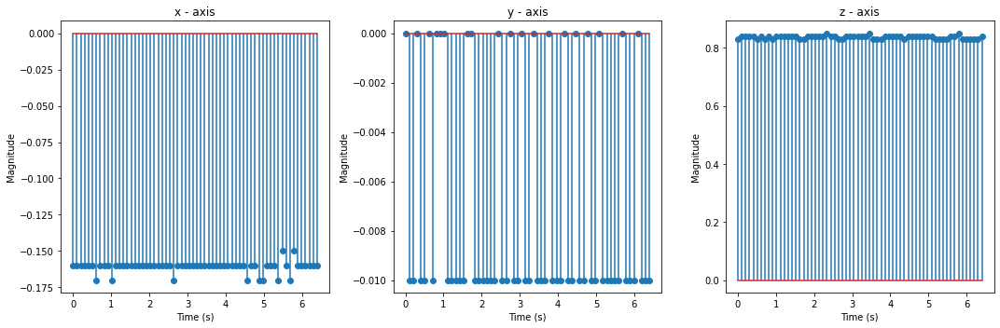

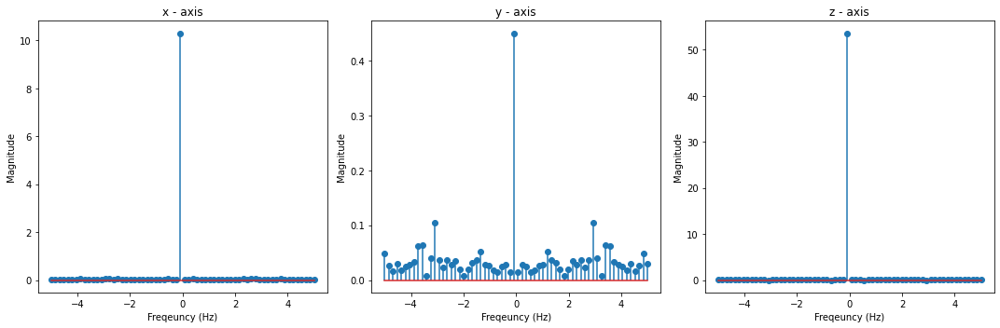

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.17, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.02, -0.0, -0.0, -0.02, -0.01, -0.01, -0.02, -0.0, -0.01, -0.01, -0.01]
[0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.84, 0.84, 0

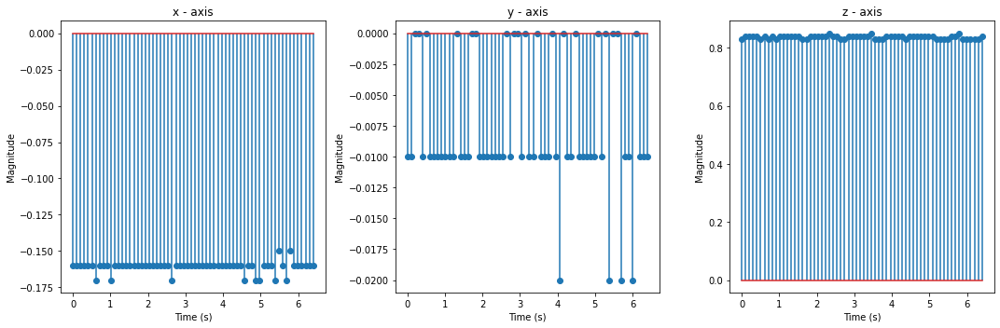

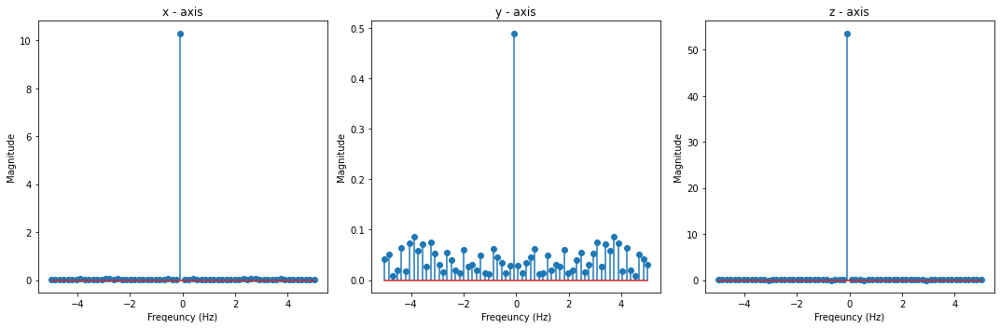

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.17, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.02, -0.0, -0.0, -0.02, -0.01, -0.01, -0.02, -0.0, -0.01, -0.01, -0.01]
[0.84, 0.83, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.85, 0.83, 0.84, 0.84, 0.84, 0.83, 0.85, 0.83, 0.84, 0

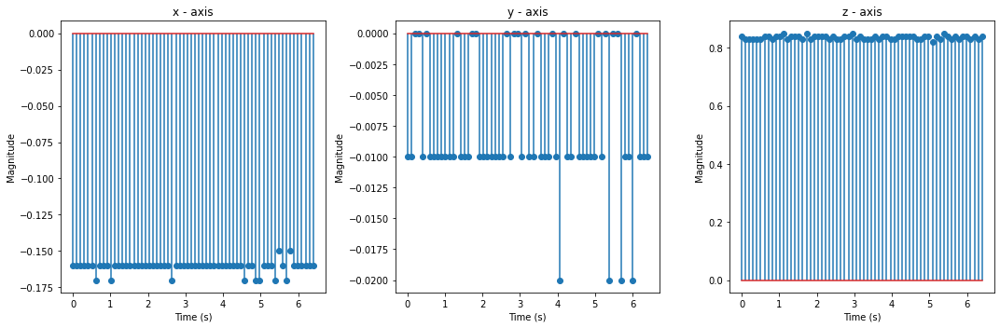

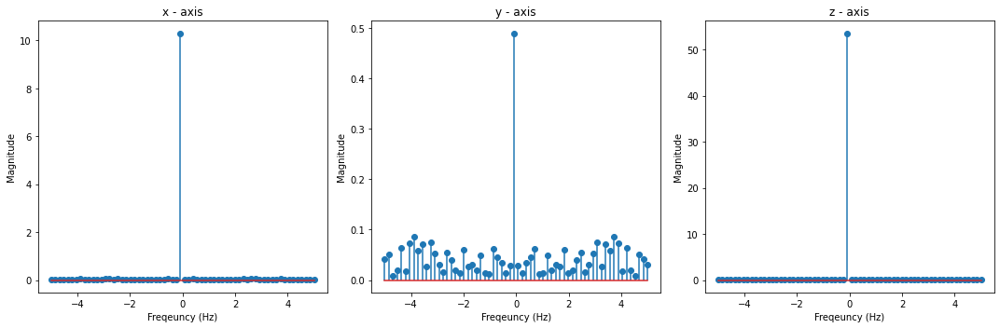

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.17, -0.16]
[-0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.02, -0.0, -0.0, -0.02, -0.01, -0.01, -0.02, -0.0, -0.01, -0.01, -0.01]
[0.84, 0.83, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.85, 0.83, 0.84, 0.84, 0.84, 0.83, 0.85, 0.83, 0.84, 0

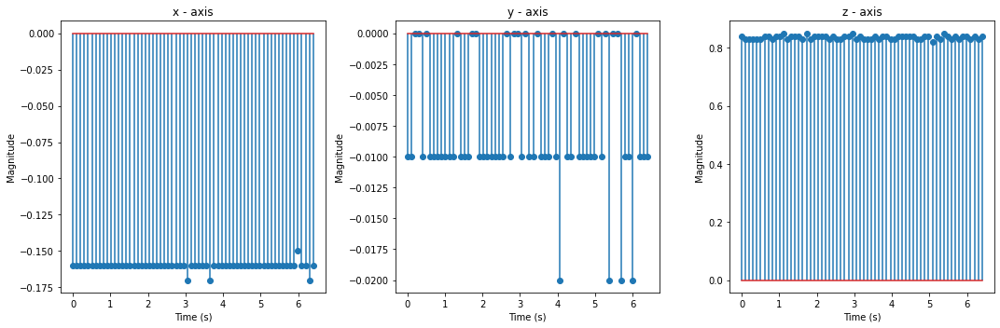

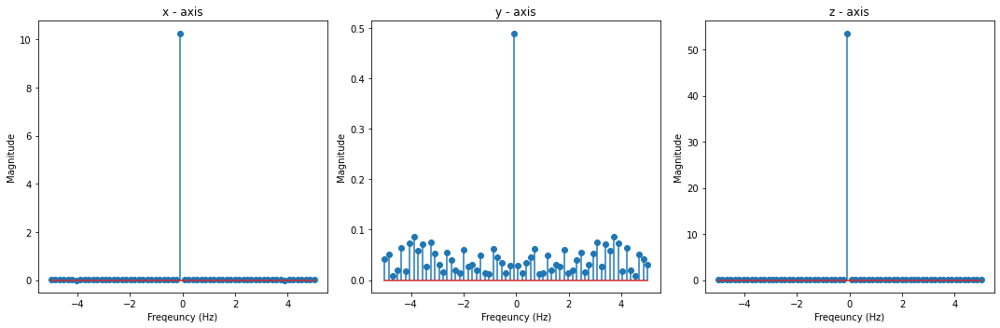

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.17, -0.16]
[-0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, 0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.84, 0.83, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.85, 0.83, 0.84, 0.84, 0.84, 0.83, 0.85, 0.83, 0.84, 0.

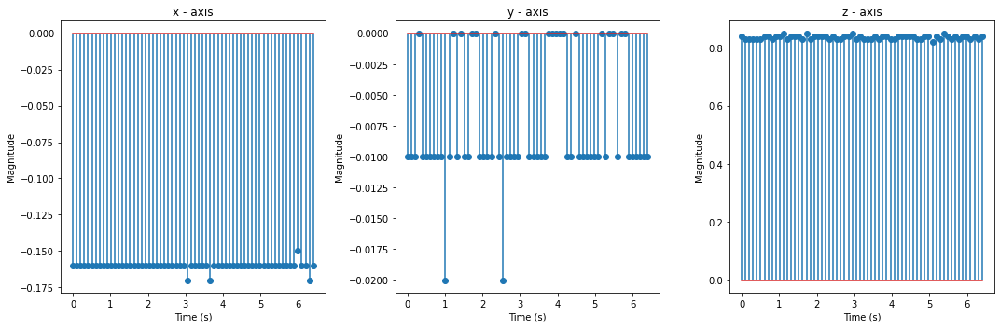

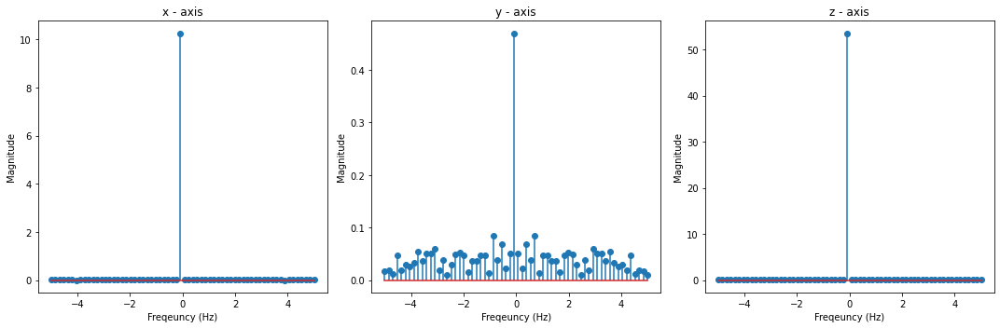

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.17, -0.16]
[-0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, 0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.

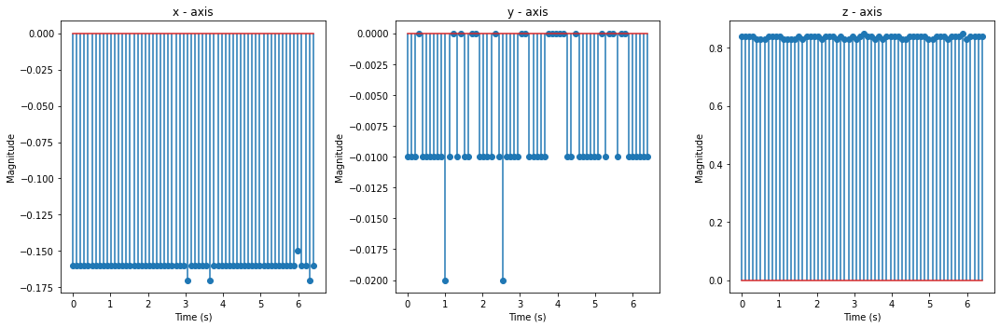

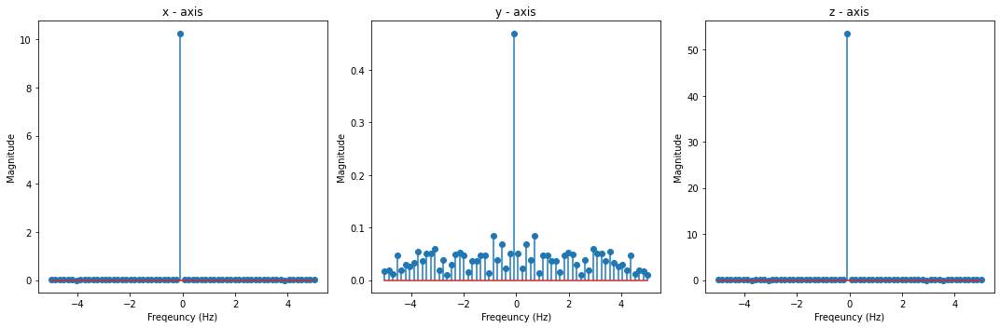

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.02, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.02, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, 0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84, 0.

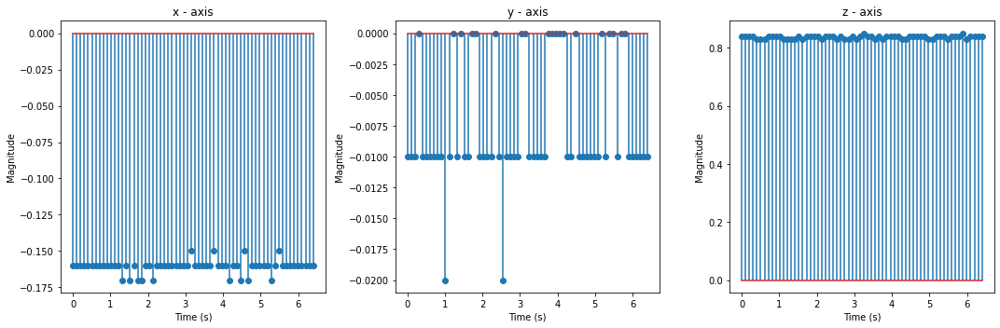

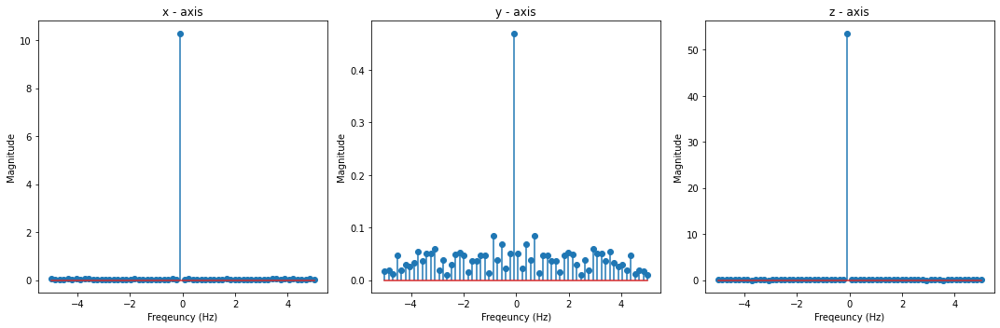

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.02, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0]
[0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.83, 0.84, 0.83, 0.84, 0.84, 0.84

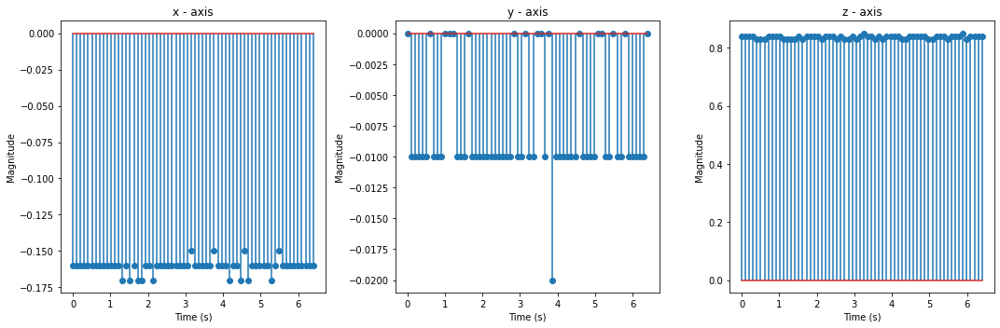

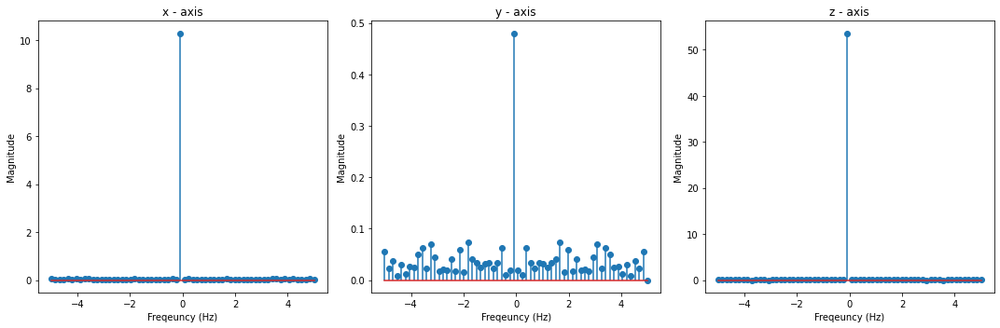

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.02, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0]
[0.84, 0.84, 0.83, 0.83, 0.84, 0.83, 0.85, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84

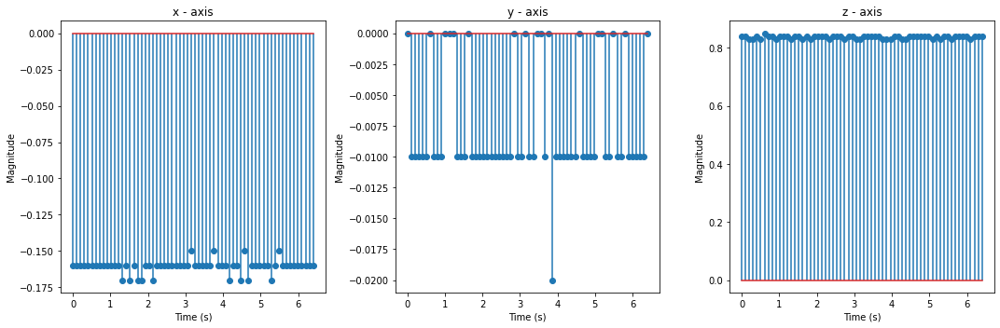

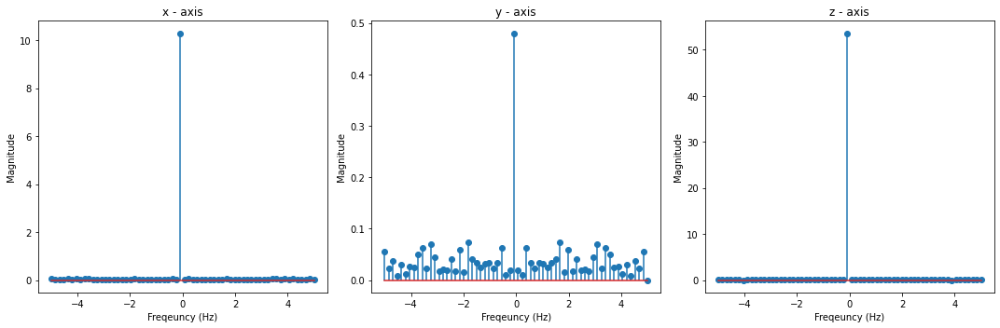

[-0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.0, -0.02, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0]
[0.84, 0.84, 0.83, 0.83, 0.84, 0.83, 0.85, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84

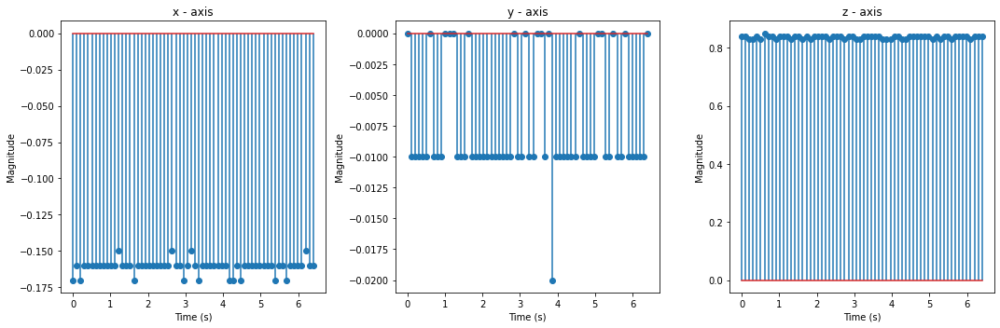

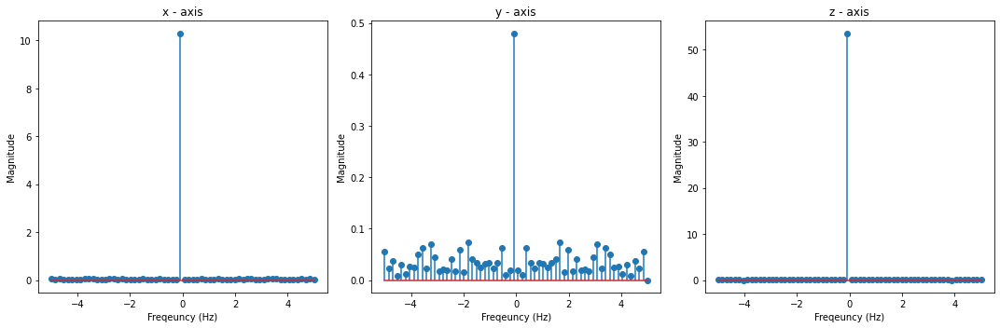

[-0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16]
[-0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.02, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, 0.0]
[0.84, 0.84, 0.83, 0.83, 0.84, 0.83, 0.85, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 

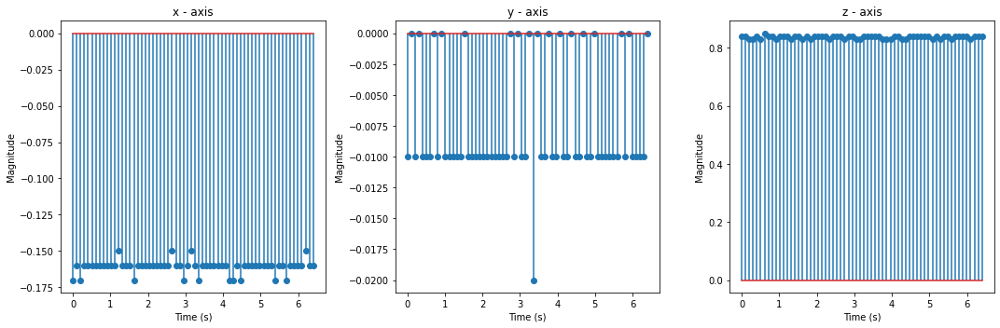

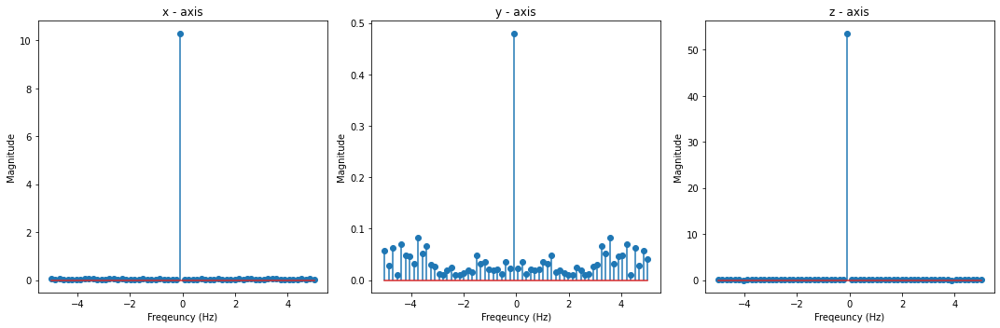

[-0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.17, -0.16, -0.15, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16]
[-0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.02, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, 0.0]
[0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.85, 0.84, 0.84, 0.85, 0.85, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 

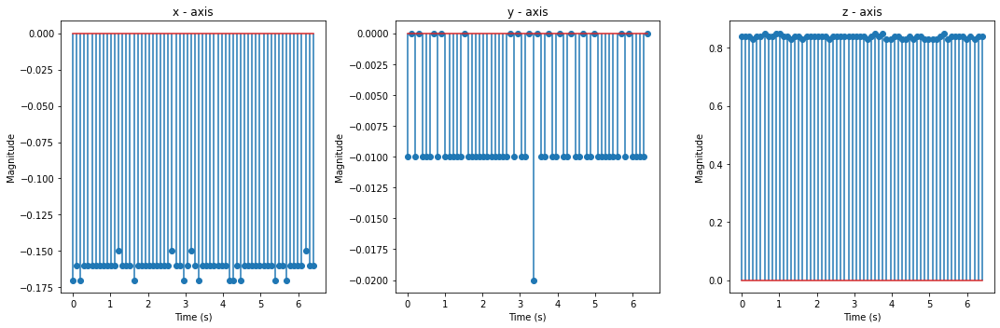

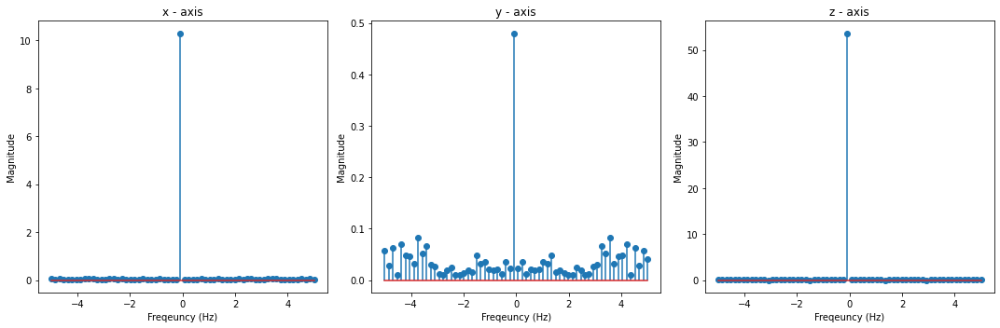

[-0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.0, -0.01, -0.01, -0.0, -0.02, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, 0.0]
[0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.85, 0.84, 0.84, 0.85, 0.85, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 

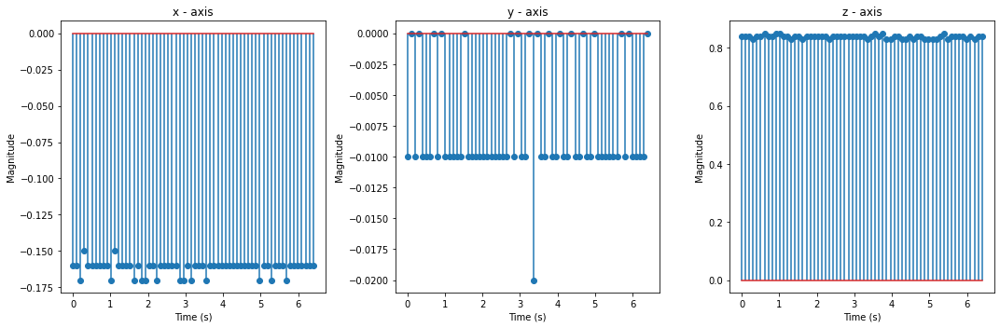

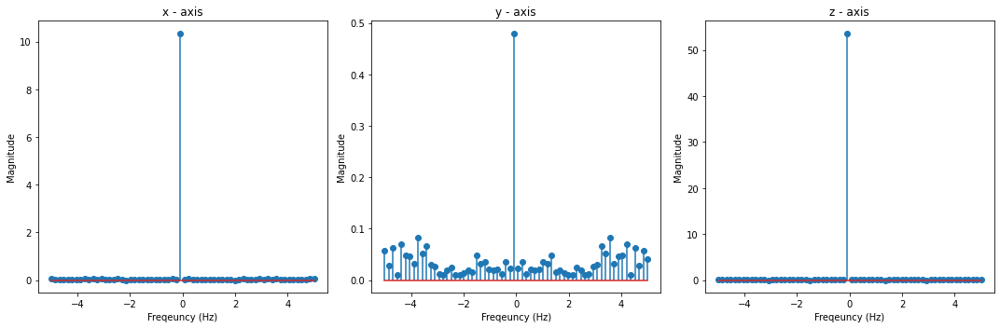

[-0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, 0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, 0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01]
[0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.85, 0.84, 0.84, 0.85, 0.85, 0.84, 0.84, 0.83, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.8

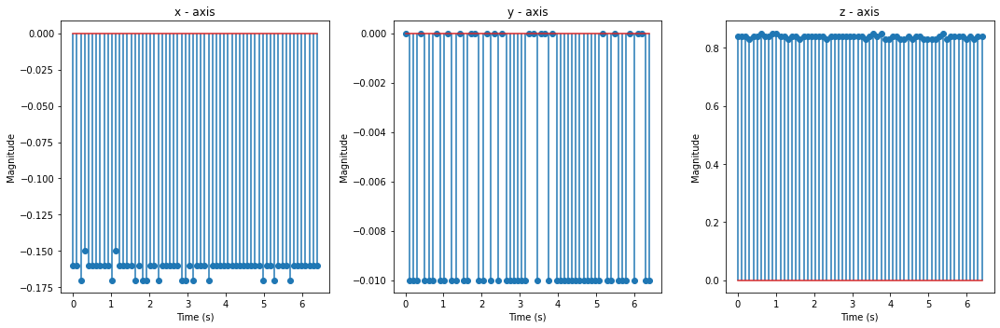

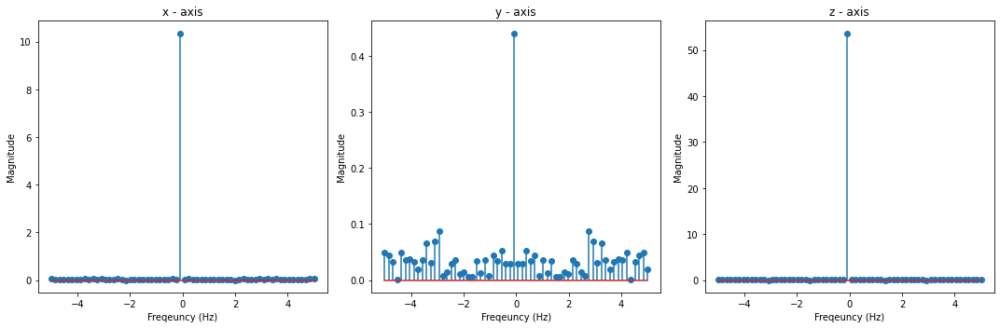

[-0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.17, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, 0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, 0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01]
[0.84, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.8

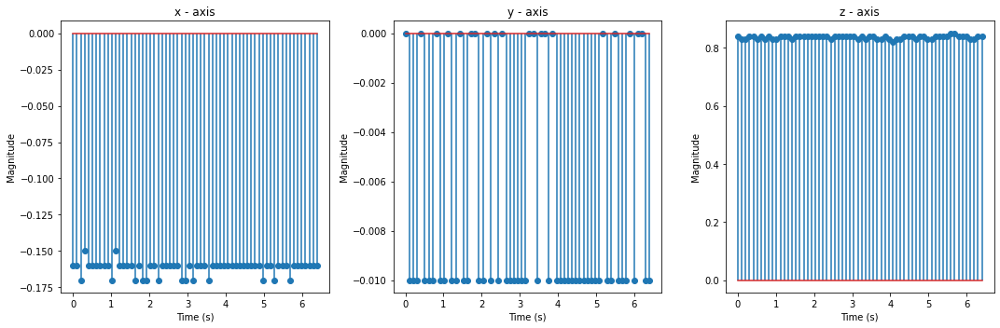

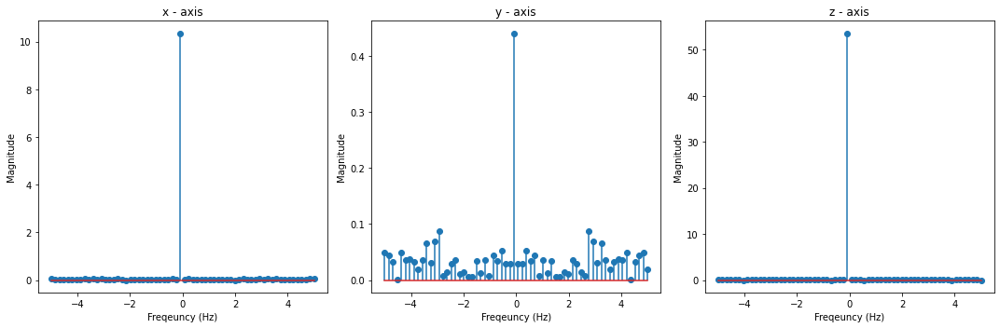

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.17, -0.16, -0.16, -0.16, -0.15, -0.17, -0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, 0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, 0.0, -0.01, -0.0, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01]
[0.84, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.8

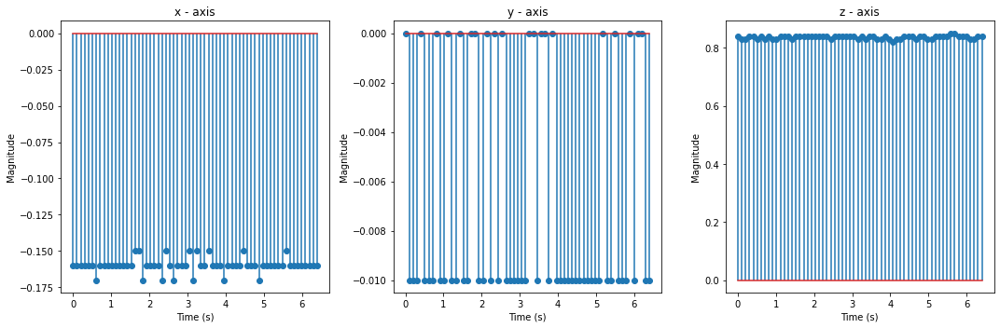

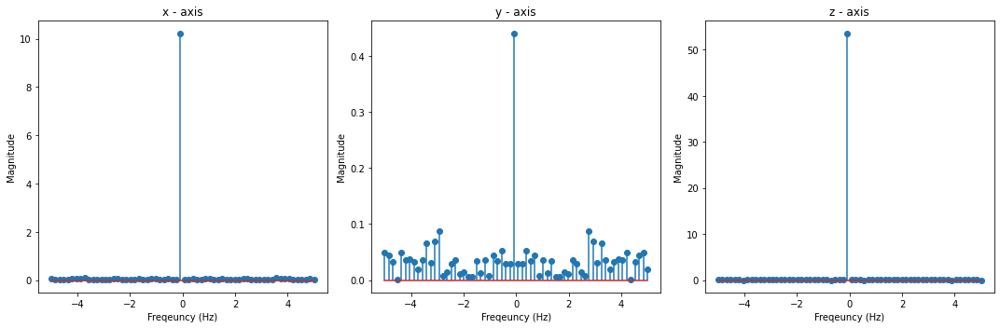

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.17, -0.16, -0.16, -0.16, -0.15, -0.17, -0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.0, -0.0, -0.01, -0.02, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.02, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.84, 0.83, 0.83, 0.84, 0.84, 0.83, 0.84, 0.83, 0.84, 0.83, 0.83, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.8

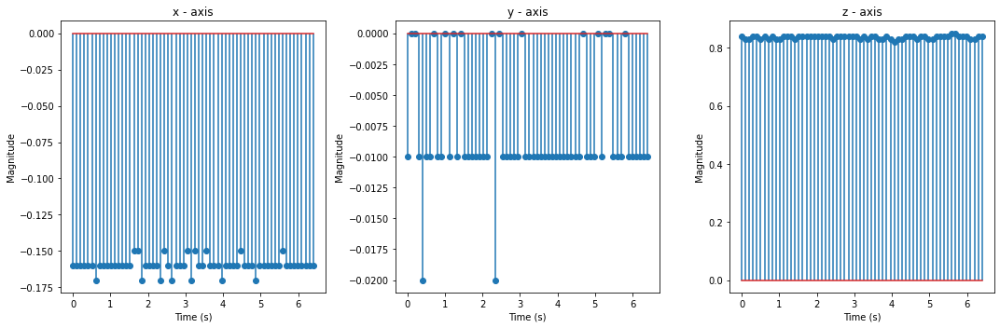

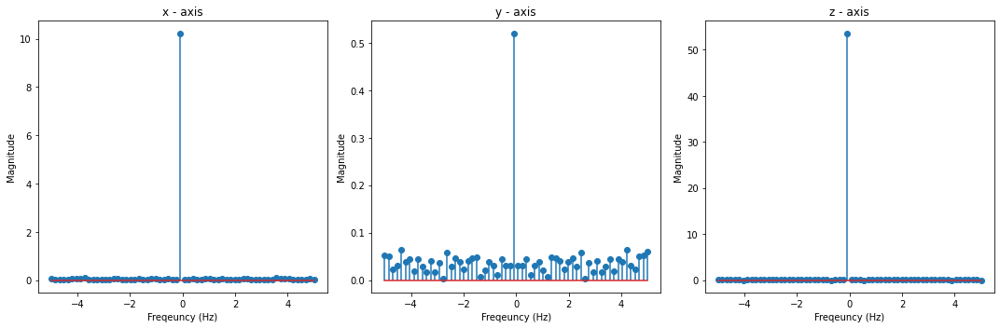

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.17, -0.15, -0.16, -0.17, -0.16, -0.16, -0.16, -0.15, -0.17, -0.15, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.0, -0.0, -0.01, -0.02, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.02, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.85, 0.84, 0.84, 0.85, 0.84, 0.84, 0.84, 0.8

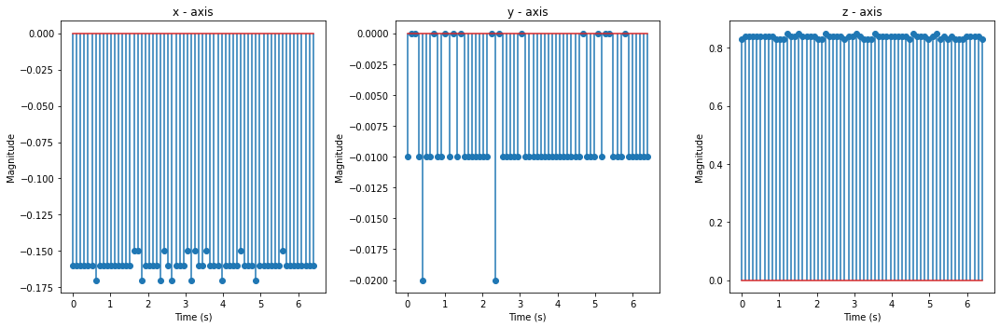

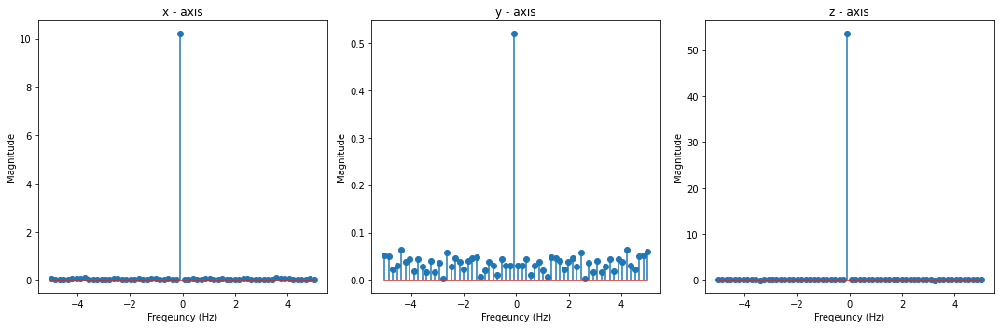

[-0.16, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.17, -0.16, -0.17, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16]
[-0.01, -0.0, -0.0, -0.01, -0.02, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.02, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.85, 0.84, 0.84, 0.85, 0.84, 0.84, 0.84, 0.8

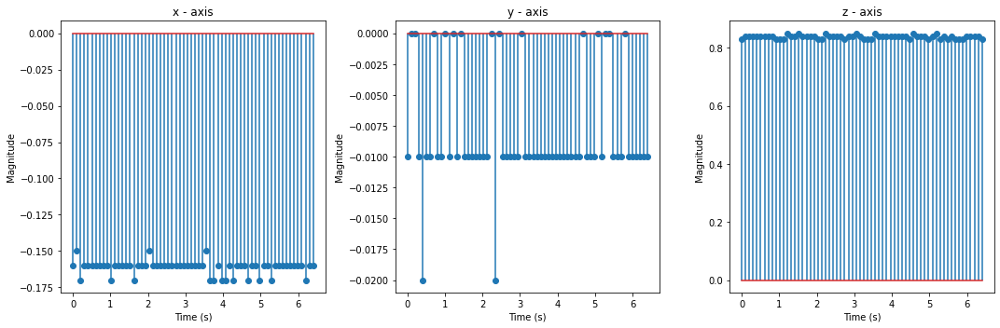

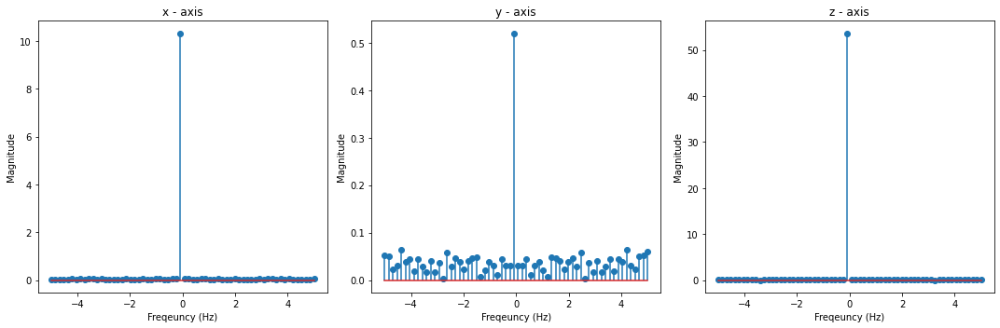

[-0.16, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.17, -0.16, -0.17, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.02, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, 0.0, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01]
[0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.85, 0.84, 0.84, 0.85, 0.84, 0.84, 0.84, 0.84, 0.83

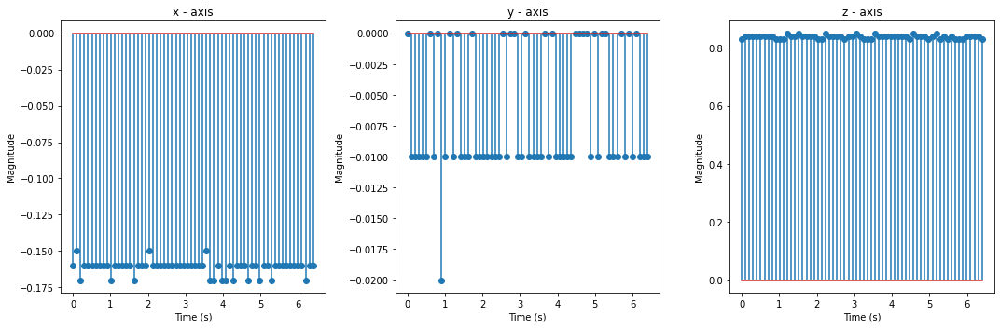

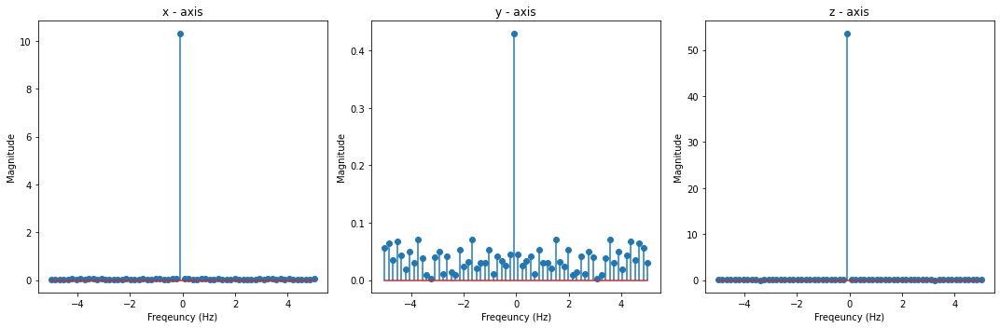

[-0.16, -0.15, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.15, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.15, -0.17, -0.17, -0.16, -0.17, -0.17, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.02, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, 0.0, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01]
[0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84

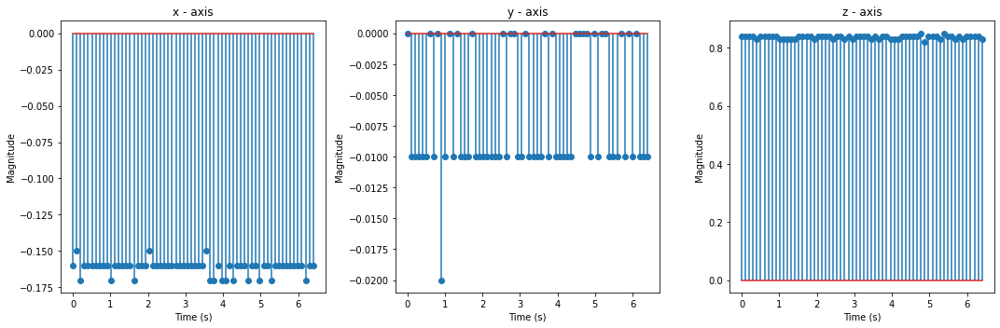

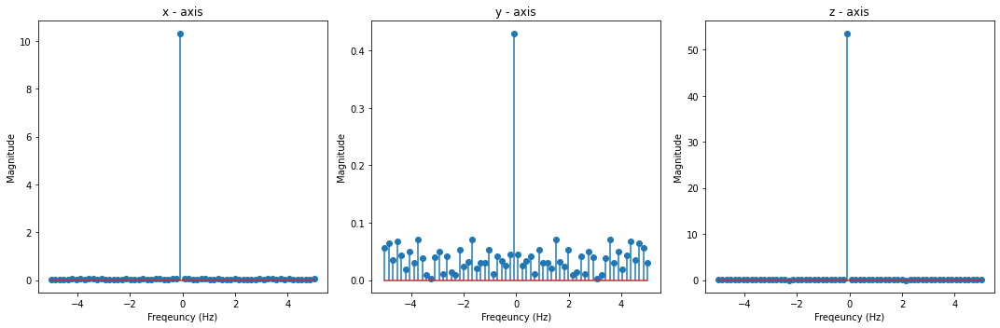

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.02, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, 0.0, -0.0, -0.0, -0.01, -0.0, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01]
[0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.84

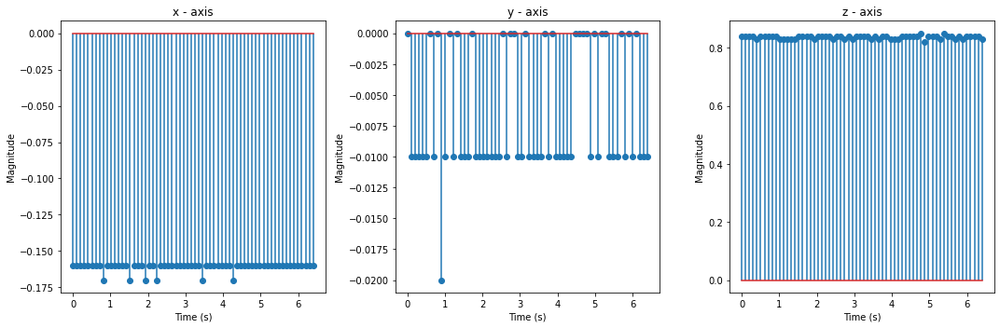

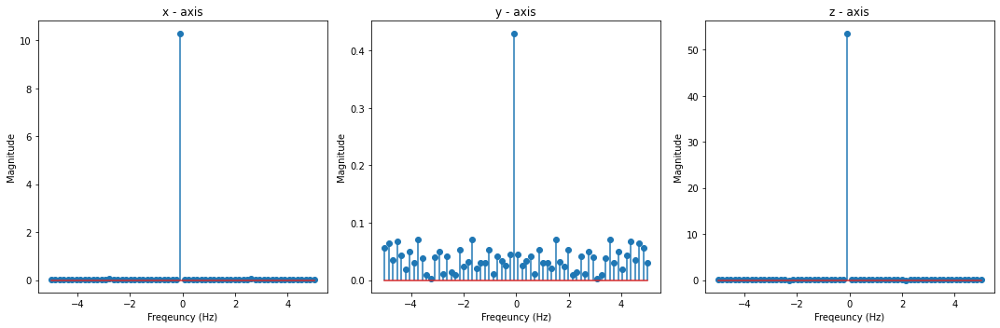

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.84, 0.84, 0.84, 0.84, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.83, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.

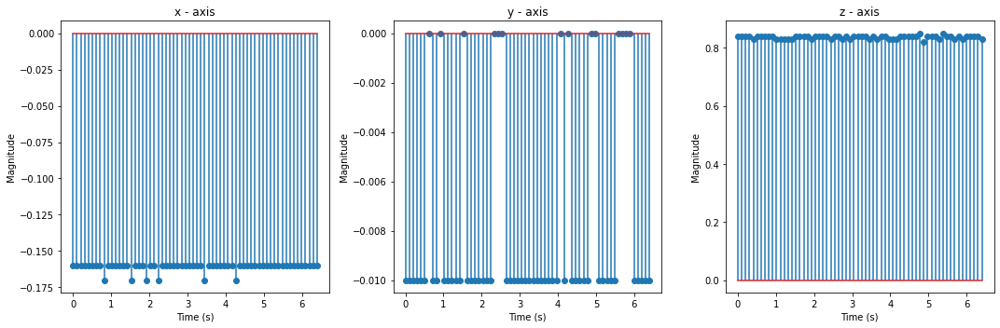

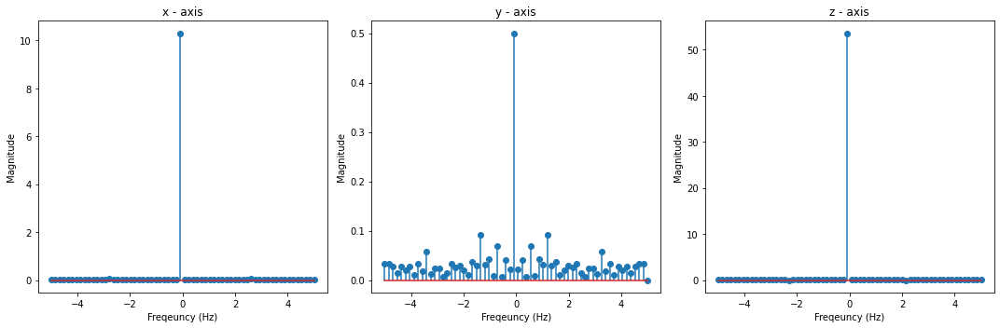

[-0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.17, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16, -0.16]
[-0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.01, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01, 0.0, -0.0, -0.0, -0.0, -0.01, -0.01, -0.01, -0.01, -0.01]
[0.84, 0.83, 0.84, 0.84, 0.84, 0.82, 0.83, 0.85, 0.84, 0.83, 0.84, 0.83, 0.84, 0.84, 0.82, 0.84, 0.84, 0.84, 0.84, 0.

In [ ]:
while True:
    received_data = str(ser.readline())[2:-5].casefold()
#     print(received_data)
    if received_data == "x":
        fill_buffer("x", num_samples)
    elif received_data == "y":
        fill_buffer("y", num_samples)
    elif received_data == "z":
        fill_buffer("z", num_samples)
        
    print(x_data)
    print(y_data)
    print(z_data)
    
    fft_ij_x, fft_mag_x = Visualize_Data.fft_data(x_data)
    fft_ij_y, fft_mag_y = Visualize_Data.fft_data(y_data)
    fft_ij_z, fft_mag_z = Visualize_Data.fft_data(z_data)
#     print(fft_mag_x)
#     print(fft_mag_y)
#     print(fft_mag_z)

    Visualize_Data.visualize_data(x_data, y_data, z_data, sampling_frequency, "time")

    Visualize_Data.visualize_data(fft_mag_x, fft_mag_y, fft_mag_z, sampling_frequency, "frequency")